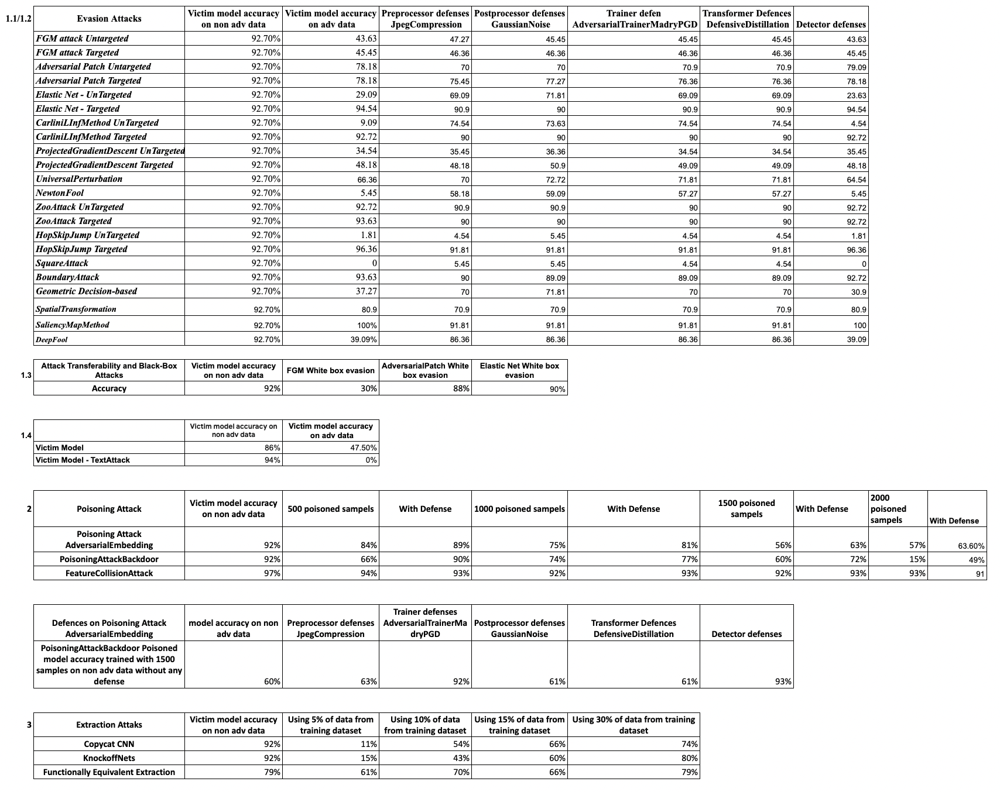

# 1 Evasion Attacks and Adversarial Examples

## Preprocessing the data

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
import numpy as np
tf.compat.v1.disable_eager_execution()


In [ ]:
# Preprocess the data

# Load CIFAR-10 dataset
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.cifar10.load_data()

x_train = x_train.astype('float32') / 255
y_train = tf.keras.utils.to_categorical(y_train, 10)

In [ ]:
x_test = x_test.astype('float32') / 255
prediction_images=[]
prediction_labels=[]

classes_to_predict= {}
for i in range(10):
     classes_to_predict.update({i:[]})

for image,label in zip(x_test,y_test):
  if len(classes_to_predict[label[0]])<=10:
    prediction_images.append(image)
    prediction_labels.append(label[0])
    classes_to_predict[label[0]].append(image)

prediction_labels = np.array(prediction_labels)
prediction_images = np.array(prediction_images)
print(prediction_labels)

[3 8 8 0 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 4 9 5 2 4 0 9 6 6 5 4 5 9 2 4
 1 9 5 4 6 5 6 0 9 3 9 7 6 9 8 0 3 8 8 7 7 4 6 7 3 6 3 2 1 2 3 7 2 8 8 0 2
 9 3 3 8 8 1 1 7 2 5 2 7 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 4 2 1 2 5 4 1 5]


In [ ]:
#Fuction to plot correct preditions and accuracy for a model 
import matplotlib.pyplot as plt

def plot_pedictions(model,prediction_labels,prediction_images):
  # Make predictions on the test data
  predictions = model.predict(prediction_images)
  # Get the predicted classes
  predicted_classes = np.argmax(predictions, axis=1)
  
  # Print the predicted classes
  print(predicted_classes)

  # Get the predicted classes
  predicted_classes1 = np.argmax(model.predict(prediction_images), axis=1)
  # Compute the accuracy
  accuracy = np.sum(predicted_classes1 == prediction_labels) / len(prediction_labels)
  print("Accuracy:", accuracy)
  # Create an array to store the number of correct and incorrect predictions for each class
  correct = np.zeros(10)
  incorrect = np.zeros(10)

  # Loop through the predictions and count the number of correct and incorrect predictions for each class
  for i in range(len(predicted_classes)):
    if predicted_classes[i] == prediction_labels[i]:
        correct[prediction_labels[i]] += 1
    else:
        incorrect[prediction_labels[i]] += 1

  # Plot a stacked bar chart of the correct and incorrect predictions for each class
  fig, ax = plt.subplots()
  ax.bar(range(10), correct, label='Correct')
  ax.bar(range(10), incorrect, bottom=correct, label='Incorrect')
  ax.set_xticks(range(10))
  ax.set_xlabel('Class')
  ax.set_ylabel('Count')
  ax.set_title('Correct vs Incorrect Predictions by Class')
  ax.legend()
  plt.show()

## Importing the provided model using hub checking model accuracy on above created test classes data

In [ ]:
!pip install adversarial-robustness-toolbox

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from art.estimators.classification import KerasClassifier

In [ ]:
#Load the victim model
classifier_url = "https://tfhub.dev/deepmind/ganeval-cifar10-convnet/1"
IMAGE_SHAPE = (32, 32) 
classifier = KerasClassifier(model=tf.keras.Sequential([hub.KerasLayer(classifier_url, input_shape=IMAGE_SHAPE+(3,))]), clip_values=(0, 1))

### Plots on Orginal model

/usr/local/lib/python3.10/dist-packages/keras/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


[3 8 8 0 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 4 9 5 2 4 0 9 6 6 5 4 5 9 2 4
 9 9 5 4 6 5 6 0 9 3 9 7 6 9 8 5 3 8 8 7 7 5 3 7 5 6 3 2 1 2 3 7 2 8 8 0 2
 9 3 3 8 8 9 1 7 2 5 2 7 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 4 6 1 2 3 4 1 5]
Accuracy: 0.9272727272727272


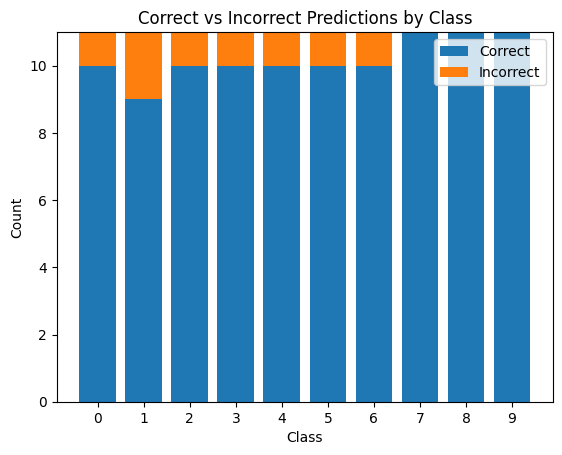

In [ ]:
plot_pedictions(classifier,prediction_labels,prediction_images)

In [ ]:
def show_image(image, label=None):
  
  class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer',
               'dog', 'frog', 'horse', 'ship', 'truck']

  plt.figure(figsize=(15,15))
  plt.subplot(5,5,1)
  plt.xticks([])
  plt.yticks([])
  plt.grid(False)
  plt.imshow(image, cmap=plt.cm.binary)
    # The CIFAR labels happen to be arrays, 
    # which is why you need the extra index
  if label != None:
   plt.xlabel(class_names[label[0]])
  plt.show()

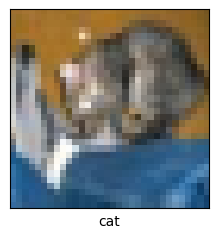

In [ ]:
show_image(prediction_images[0],[prediction_labels[0]])

##1.1 Comparison of Attacks on CIFAR-10 White box

In an untargeted attack, the attacker's goal is to make the model classify the input incorrectly without caring which specific class the model outputs. In contrast, in a targeted attack, the attacker's goal is to force the model to output a specific target class label.

### 1 FGM attack WB

In [ ]:
from art.attacks.evasion import FastGradientMethod

#### FGM attack Untargeted

In [ ]:
# Define the FGM attack
attack = FastGradientMethod(estimator=classifier, eps=0.1, targeted=False)

In [ ]:
x_test_adv = attack.generate(x=prediction_images)

##### plots on Orginal model using adversial dataset generated using  FGM Untargeted

[6 8 8 6 2 6 9 6 2 1 2 9 6 7 6 6 3 2 6 6 6 0 4 9 2 2 2 2 6 6 6 4 6 2 6 2 2
 7 6 5 4 6 5 6 0 6 6 9 5 6 2 8 6 6 8 2 3 2 6 3 4 5 6 3 4 6 2 4 2 2 6 2 6 2
 2 2 3 4 8 9 1 4 4 5 2 7 9 0 6 4 4 6 7 2 4 2 6 1 4 0 2 1 4 6 2 2 6 4 4 2]
Accuracy: 0.43636363636363634


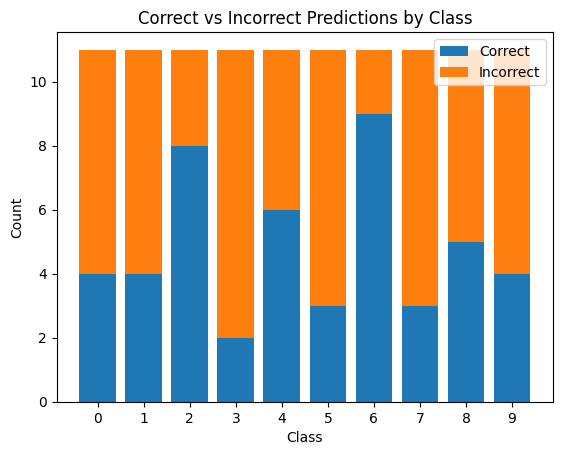

In [ ]:
plot_pedictions(classifier,prediction_labels,x_test_adv)

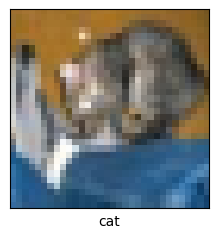

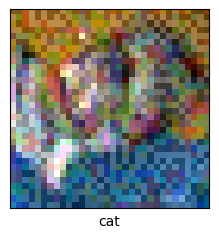

In [ ]:
show_image(prediction_images[0],[prediction_labels[0]])
show_image(x_test_adv[0],[prediction_labels[0]])

##### Defenses

In [ ]:
x_test_adv = x_test_adv

###### Preprocessing Defenses

In [ ]:
from art.defences.preprocessor import JpegCompression

[2 8 8 2 2 4 9 4 2 1 2 9 6 7 2 6 3 4 6 6 4 0 4 9 6 2 4 2 2 6 6 4 4 2 2 2 4
 7 2 5 4 6 5 2 0 4 3 8 2 2 2 8 6 4 8 2 3 2 4 3 5 3 6 2 4 6 2 4 2 2 4 2 6 2
 6 2 3 8 8 9 1 4 2 5 2 7 9 0 4 4 4 6 7 2 4 3 8 1 4 0 2 1 4 6 2 2 6 4 2 2]
Accuracy: 0.4727272727272727


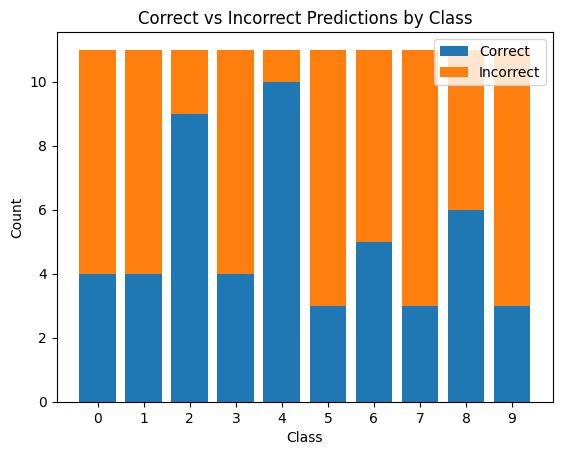

In [ ]:
# Apply preprocessor defense
preprocessor = JpegCompression(clip_values=(0,1),channels_first=True, apply_fit=True, apply_predict=True)
prediction_images1, prediction_labels1 = preprocessor(x_test_adv, prediction_labels)
plot_pedictions(classifier ,prediction_labels1, prediction_images1)  

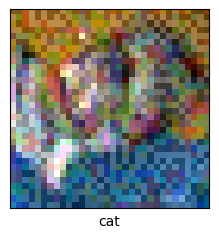

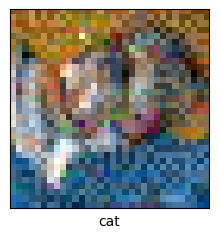

In [ ]:
show_image(x_test_adv[0],[prediction_labels[0]])
show_image(prediction_images1[0],[prediction_labels[0]])

###### Postprocessing Defenses

In [ ]:
from art.defences.postprocessor import GaussianNoise

[2 8 8 2 2 4 9 4 2 1 2 9 6 7 2 6 3 4 6 6 4 0 4 9 6 2 4 2 2 6 6 4 4 2 2 2 4
 7 2 5 4 6 5 2 0 4 3 8 2 2 2 8 6 4 8 2 2 2 4 3 4 3 6 2 4 6 2 4 2 2 4 2 6 2
 6 2 3 8 8 9 1 4 2 5 2 7 9 0 4 4 4 6 7 2 4 3 8 1 4 0 2 1 4 6 2 2 3 4 2 2]
Accuracy: 0.45454545454545453


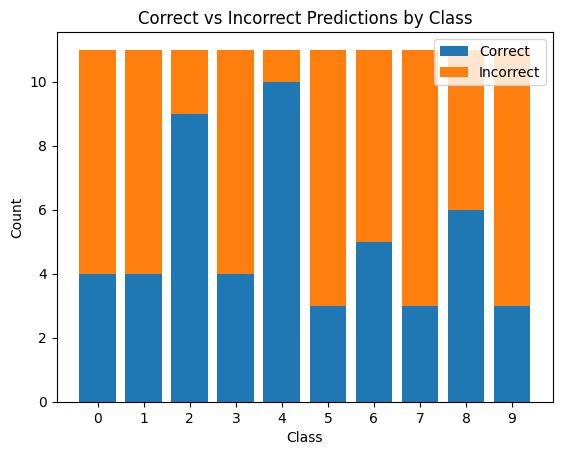

In [ ]:
# Define the postprocessing defense
noise = GaussianNoise(scale=0.2)
# Apply the defense to the classifier
classifier.postprocessing_defences = [noise]
plot_pedictions(classifier,prediction_labels1, prediction_images1)

######  Trainer Defenses

In [ ]:
from art.defences.trainer import AdversarialTrainerMadryPGD

In [ ]:
x_train_preprocessed, y_train_preprocessed = preprocessor(x_test,y_test)

In [ ]:
#Load the victim model
classifier_url = "https://tfhub.dev/deepmind/ganeval-cifar10-convnet/1"
IMAGE_SHAPE = (32, 32) 
classifier1 = KerasClassifier(model=tf.keras.Sequential([hub.KerasLayer(classifier_url, input_shape=IMAGE_SHAPE+(3,))]), clip_values=(0, 1))

In [ ]:
# Create an adversarial trainer with Madry's PGD
classifier1.model.compile(optimizer="adam", loss="sparse_categorical_crossentropy")

trainer = AdversarialTrainerMadryPGD(classifier1, nb_epochs=1, eps=0.1, eps_step=1, batch_size=16)

# Fit the adversarial trainer on preprocessed data
trainer.fit(x_train_preprocessed, y_train)

Precompute adv samples:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial training epochs:   0%|          | 0/1 [00:00<?, ?it/s]

[2 8 8 2 2 4 9 4 2 1 2 9 6 7 2 6 3 4 6 6 4 0 4 9 6 2 4 2 2 6 6 4 4 2 2 2 4
 7 2 5 4 6 5 2 0 4 3 8 2 2 2 8 6 4 8 2 3 2 4 3 5 3 6 2 4 6 2 4 2 2 4 2 6 2
 6 2 3 4 8 9 1 4 2 5 2 7 9 0 4 4 4 6 7 2 4 3 8 1 4 0 2 1 4 6 2 2 6 4 2 2]
Accuracy: 0.45454545454545453


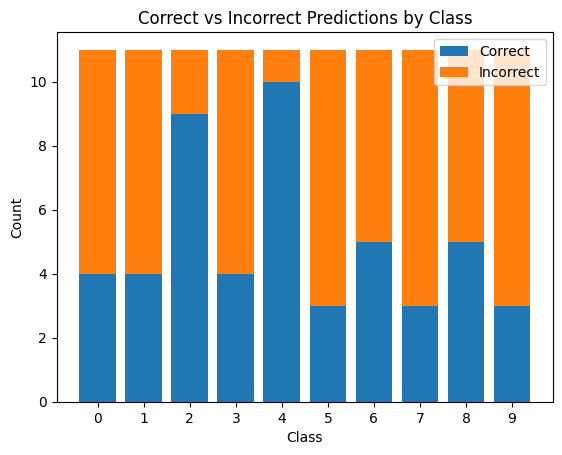

In [ ]:
plot_pedictions(classifier1,prediction_labels1, prediction_images1)

######Transformer Defenses

In [ ]:
from art.defences.transformer.evasion import DefensiveDistillation

In [ ]:
# Define the defense
defense = DefensiveDistillation(classifier=classifier1, batch_size=128, nb_epochs=20)

# Fit the defense
defense.fit(x_train, y_train)

# Get the transformed classifier
transformed_classifier = defense.classifier

[2 8 8 2 2 4 9 4 2 1 2 9 6 7 2 6 3 4 6 6 4 0 4 9 6 2 4 2 2 6 6 4 4 2 2 2 4
 7 2 5 4 6 5 2 0 4 3 8 2 2 2 8 6 4 8 2 3 2 4 3 5 3 6 2 4 6 2 4 2 2 4 2 6 2
 6 2 3 4 8 9 1 4 2 5 2 7 9 0 4 4 4 6 7 2 4 3 8 1 4 0 2 1 4 6 2 2 6 4 2 2]
Accuracy: 0.45454545454545453


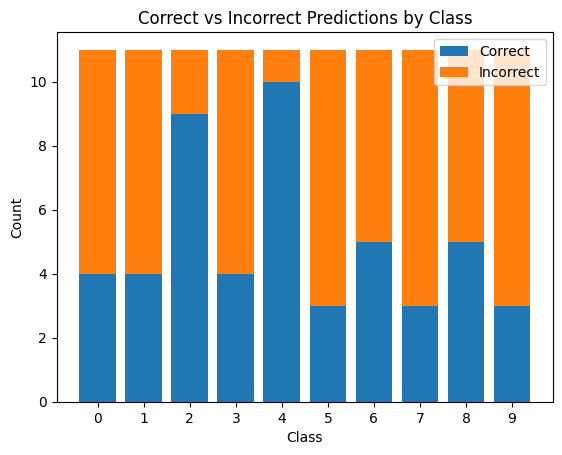

In [ ]:
plot_pedictions(transformed_classifier,prediction_labels1, prediction_images1)

###### Detector defenses: 

In [ ]:
# Create an adversarial trainer with Madry's PGD
classifier1.model.compile(optimizer="adam", loss="sparse_categorical_crossentropy")

trainer = AdversarialTrainerMadryPGD(classifier1, nb_epochs=6, eps=0.2, eps_step=0.1, batch_size=128)

# Fit the adversarial trainer on preprocessed data
trainer.fit(x_test_adv, prediction_labels)

Precompute adv samples:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial training epochs:   0%|          | 0/6 [00:00<?, ?it/s]

[6 8 8 6 2 6 9 6 2 1 2 9 6 7 6 6 3 2 6 6 6 0 4 9 2 2 2 2 6 6 6 4 6 2 6 2 2
 7 6 5 4 6 5 6 0 6 6 9 5 6 2 8 6 6 8 2 3 2 6 3 4 5 6 3 4 6 2 4 2 2 6 2 6 2
 2 2 3 4 8 9 1 4 4 5 2 7 9 0 6 4 4 6 7 2 4 2 6 1 4 0 2 1 4 6 2 2 6 4 4 2]
Accuracy: 0.43636363636363634


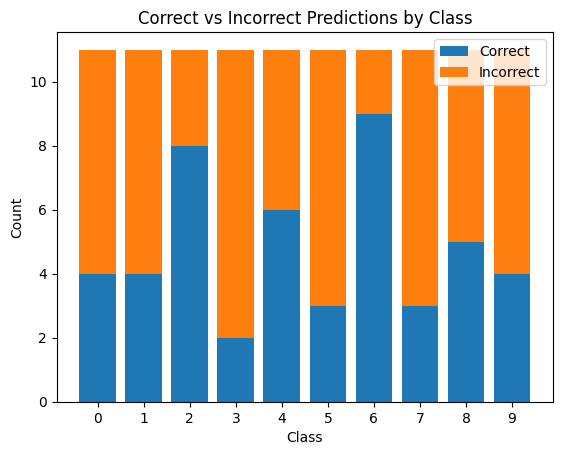

In [ ]:
plot_pedictions(classifier1,prediction_labels, x_test_adv)

#### FGM attack Targeted

In [ ]:
# Define the FGM attack
attack = FastGradientMethod(estimator=classifier, eps=0.1, targeted=True)

In [ ]:
x_test_adv = attack.generate(x=prediction_images,  y = tf.keras.utils.to_categorical(prediction_labels, 10))

##### plots on Orginal model using adversial dataset generated using  FGM Targeted

[3 8 8 4 6 6 3 6 6 1 2 6 2 7 9 6 2 2 2 6 6 0 4 9 2 2 2 6 2 6 6 6 6 6 6 2 2
 6 9 5 4 2 5 6 0 6 6 0 2 6 6 8 6 2 8 2 2 2 6 3 6 5 6 2 6 2 2 3 6 2 6 6 6 6
 6 2 3 8 8 9 6 4 2 5 2 7 9 0 2 4 2 2 7 4 4 2 1 2 4 0 2 1 4 6 2 2 6 4 4 2]
Accuracy: 0.45454545454545453


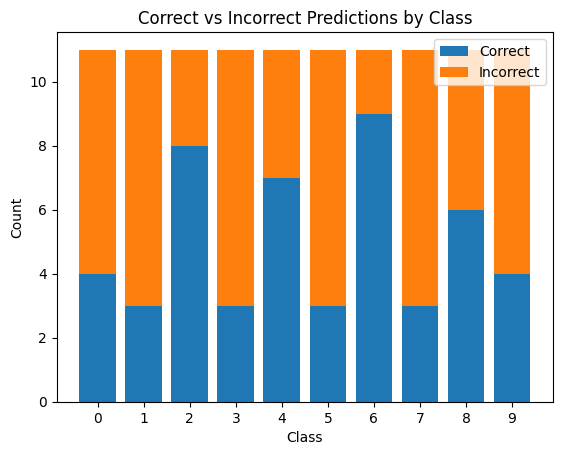

In [ ]:
plot_pedictions(classifier,prediction_labels,x_test_adv)

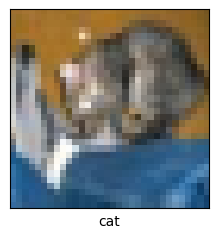

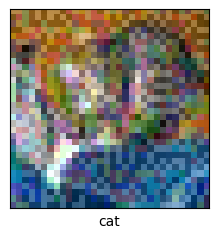

In [ ]:
show_image(prediction_images[0],[prediction_labels[0]])
show_image(x_test_adv[0],[prediction_labels[0]])

##### Defenses

In [ ]:
x_test_adv = x_test_adv

###### Preprocessing Defenses

In [ ]:
from art.defences.preprocessor import JpegCompression

[2 8 8 4 6 4 2 6 6 1 2 2 2 7 2 3 2 2 2 6 6 0 4 9 2 2 4 6 2 6 6 4 4 2 6 2 2
 8 9 5 4 2 5 6 0 2 6 8 4 2 6 8 6 2 8 2 2 2 4 3 6 3 6 2 2 2 2 3 6 2 8 2 2 2
 2 2 3 8 8 9 6 4 2 5 2 7 9 0 2 4 4 8 7 2 4 2 1 2 4 0 2 1 4 6 2 2 6 4 2 2]
Accuracy: 0.4636363636363636


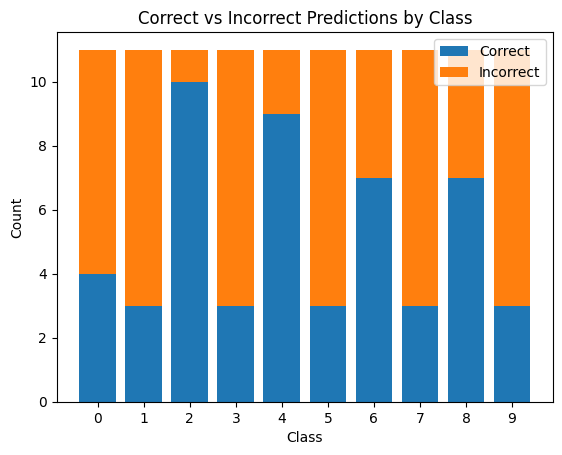

In [ ]:
# Apply preprocessor defense
preprocessor = JpegCompression(clip_values=(0,1),channels_first=True, apply_fit=True, apply_predict=True)
prediction_images1, prediction_labels1 = preprocessor(x_test_adv, prediction_labels)
plot_pedictions(classifier ,prediction_labels1, prediction_images1)  

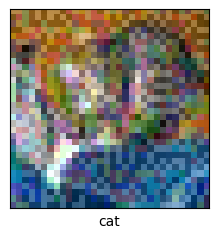

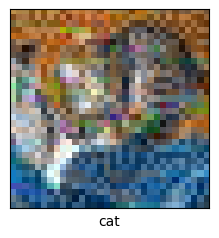

In [ ]:
show_image(x_test_adv[0],[prediction_labels[0]])
show_image(prediction_images1[0],[prediction_labels[0]])

###### Postprocessing Defenses

In [ ]:
from art.defences.postprocessor import GaussianNoise

[2 8 8 4 6 4 3 6 6 1 2 2 2 7 2 3 2 2 2 6 6 0 4 9 2 2 4 6 2 6 6 4 4 2 6 2 2
 8 9 5 4 2 5 6 0 2 6 8 4 2 6 8 6 2 8 2 2 2 4 3 6 3 6 2 2 2 2 3 2 2 8 2 2 2
 2 2 3 8 8 9 6 4 2 5 2 7 9 0 2 4 4 8 7 2 4 2 1 2 4 0 2 1 4 6 2 2 6 4 2 2]
Accuracy: 0.4636363636363636


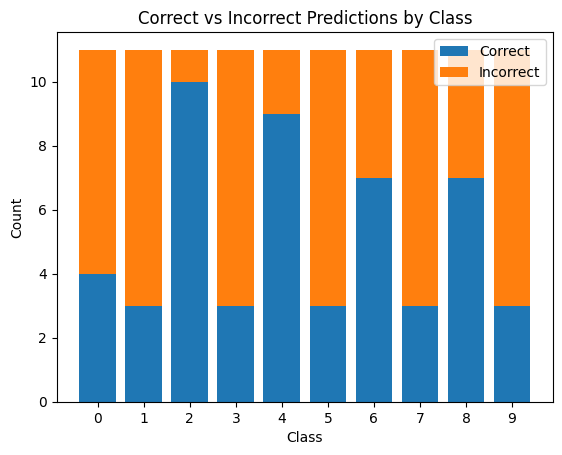

In [ ]:
# Define the postprocessing defense
noise = GaussianNoise(scale=0.2)
# Apply the defense to the classifier
classifier.postprocessing_defences = [noise]
plot_pedictions(classifier,prediction_labels1, prediction_images1)

######  Trainer Defenses

In [ ]:
from art.defences.trainer import AdversarialTrainerMadryPGD

In [ ]:
x_train_preprocessed, y_train_preprocessed = preprocessor(x_test,y_test)

In [ ]:
#Load the victim model
classifier_url = "https://tfhub.dev/deepmind/ganeval-cifar10-convnet/1"
IMAGE_SHAPE = (32, 32) 
classifier1 = KerasClassifier(model=tf.keras.Sequential([hub.KerasLayer(classifier_url, input_shape=IMAGE_SHAPE+(3,))]), clip_values=(0, 1))

In [ ]:
# Create an adversarial trainer with Madry's PGD
classifier1.model.compile(optimizer="adam", loss="sparse_categorical_crossentropy")

trainer = AdversarialTrainerMadryPGD(classifier1, nb_epochs=1, eps=0.1, eps_step=1, batch_size=16)

# Fit the adversarial trainer on preprocessed data
trainer.fit(x_train_preprocessed, y_train)

Precompute adv samples:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial training epochs:   0%|          | 0/1 [00:00<?, ?it/s]

[2 8 8 4 6 4 3 6 6 1 2 2 2 7 2 3 2 2 2 6 6 0 4 9 2 2 4 6 2 6 6 4 4 2 6 2 2
 8 9 5 4 2 5 6 0 2 6 8 4 2 6 8 6 2 8 2 2 2 4 3 6 3 6 2 2 2 2 2 6 2 8 2 2 2
 2 2 3 8 8 9 6 4 2 5 2 7 9 0 2 4 4 8 7 2 4 2 1 2 4 0 2 1 4 6 2 2 6 4 2 2]
Accuracy: 0.4636363636363636


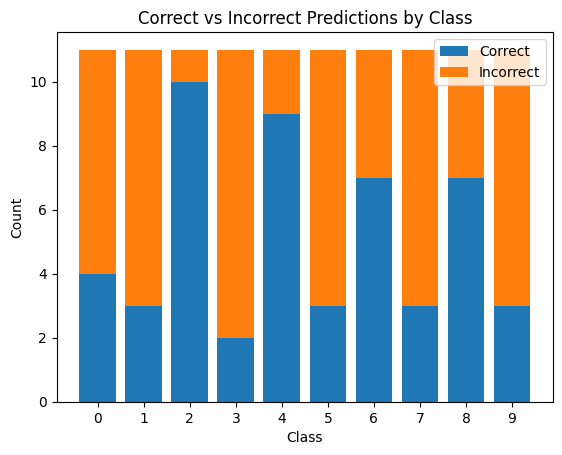

In [ ]:
plot_pedictions(classifier1,prediction_labels1, prediction_images1)

######Transformer Defenses

In [ ]:
from art.defences.transformer.evasion import DefensiveDistillation

In [ ]:
# Define the defense
defense = DefensiveDistillation(classifier=classifier1, batch_size=128, nb_epochs=20)

# Fit the defense
defense.fit(x_train, y_train)

# Get the transformed classifier
transformed_classifier = defense.classifier

[2 8 8 4 6 4 3 6 6 1 2 2 2 7 2 3 2 2 2 6 6 0 4 9 2 2 4 6 2 6 6 4 4 2 6 2 2
 8 9 5 4 2 5 6 0 2 6 8 4 2 6 8 6 2 8 2 2 2 4 3 6 3 6 2 2 2 2 2 6 2 8 2 2 2
 2 2 3 8 8 9 6 4 2 5 2 7 9 0 2 4 4 8 7 2 4 2 1 2 4 0 2 1 4 6 2 2 6 4 2 2]
Accuracy: 0.4636363636363636


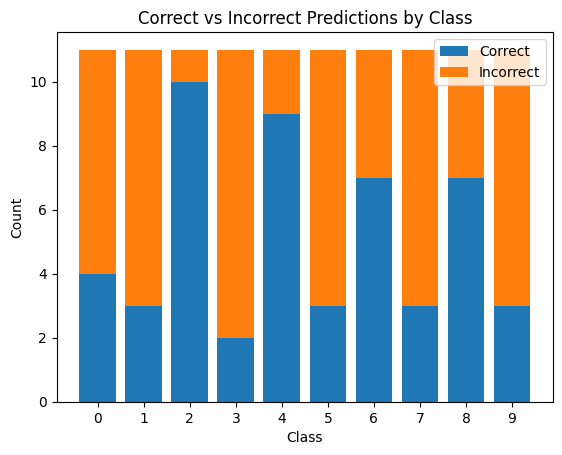

In [ ]:
plot_pedictions(transformed_classifier,prediction_labels1, prediction_images1)

###### Detector defenses: 

In [ ]:
# Create an adversarial trainer with Madry's PGD
classifier1.model.compile(optimizer="adam", loss="sparse_categorical_crossentropy")

trainer = AdversarialTrainerMadryPGD(classifier1, nb_epochs=6, eps=0.2, eps_step=0.1, batch_size=128)

# Fit the adversarial trainer on preprocessed data
trainer.fit(x_test_adv, prediction_labels)

Precompute adv samples:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial training epochs:   0%|          | 0/6 [00:00<?, ?it/s]

[3 8 8 4 6 6 3 6 6 1 2 6 2 7 9 6 2 2 2 6 6 0 4 9 2 2 2 6 2 6 6 6 6 2 6 2 2
 6 6 5 4 2 5 6 0 6 6 9 2 6 6 8 6 2 8 2 2 2 6 3 6 5 6 2 6 2 2 3 6 2 6 6 6 6
 6 2 3 8 8 9 6 4 2 5 2 7 9 0 2 4 2 2 7 4 4 2 1 2 4 0 2 1 4 6 2 2 6 4 4 2]
Accuracy: 0.45454545454545453


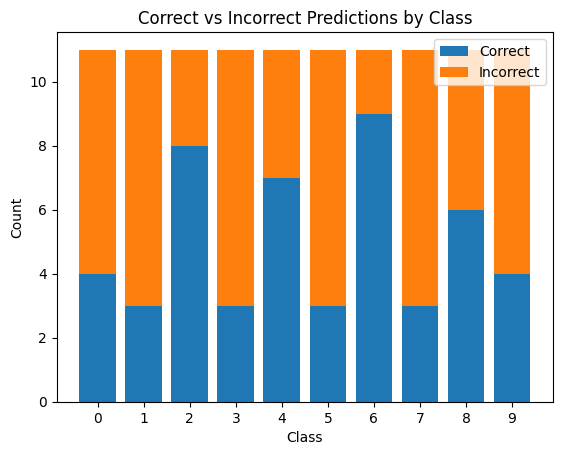

In [ ]:
plot_pedictions(classifier1,prediction_labels, x_test_adv)

### 2 Adversarial Patch WB

In [ ]:
from art.attacks.evasion import AdversarialPatch

#### Adversarial Patch - UNTargeted

In [ ]:
import numpy as np

patch_shape = (16, 16, 3)

attack = AdversarialPatch(classifier=classifier, patch_shape=patch_shape, targeted=False)

# Generate adversarial patches using the AdversarialPatch attack
adv_patches = attack.generate(prediction_images, y=tf.keras.utils.to_categorical(prediction_labels, 10))

Adversarial Patch Numpy:   0%|          | 0/500 [00:00<?, ?it/s]

In [ ]:
# Apply the adversarial patches to the images
adv_images = attack.apply_patch(prediction_images, scale=0.3, patch_external=adv_patches[0])

##### plots on Orginal model using adversial dataset generated using  Adversarial Patch Untargeted

[3 0 1 0 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 8 9 4 0 5 0 9 6 6 5 2 5 9 2 4
 1 9 5 4 6 5 6 0 9 3 0 7 2 9 8 5 5 8 8 3 1 3 3 7 3 0 1 2 1 2 3 7 0 8 8 0 2
 9 3 3 8 8 1 1 7 0 5 1 7 9 0 3 2 0 0 7 4 5 3 1 1 4 0 2 1 4 1 1 2 3 4 1 5]
Accuracy: 0.7818181818181819


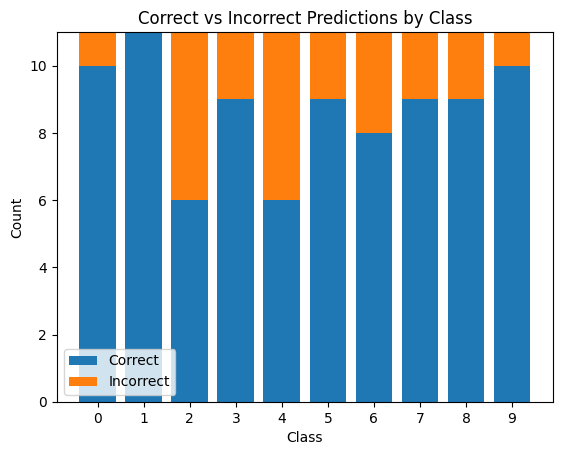

In [ ]:
plot_pedictions(classifier,prediction_labels,adv_images)

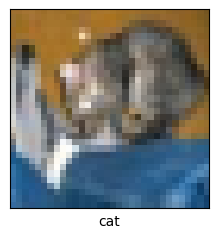

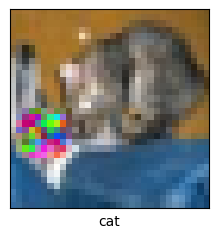

In [ ]:
show_image(prediction_images[0],[prediction_labels[0]])
show_image(adv_images[0],[prediction_labels[0]])

##### Defenses

In [ ]:
x_test_adv = adv_images

###### Preprocessing Defenses

In [ ]:
from art.defences.preprocessor import JpegCompression

[3 8 1 0 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 8 9 4 2 5 0 9 6 3 5 2 5 9 2 4
 1 9 5 4 3 3 3 0 9 5 1 7 2 9 8 5 5 8 8 5 3 3 3 7 3 3 1 2 1 2 3 7 1 8 8 0 2
 9 5 3 8 8 1 1 7 3 9 0 0 9 0 3 2 0 0 3 4 8 3 1 1 4 0 2 1 0 1 1 2 3 4 1 5]
Accuracy: 0.7


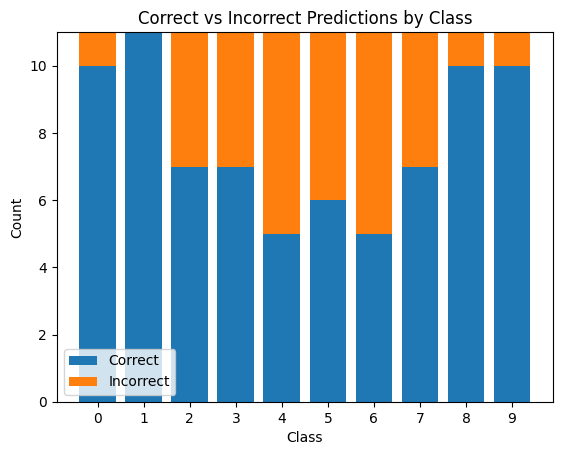

In [ ]:
# Apply preprocessor defense
preprocessor = JpegCompression(clip_values=(0,1),channels_first=True, apply_fit=True, apply_predict=True)
prediction_images1, prediction_labels1 = preprocessor(x_test_adv, prediction_labels)
plot_pedictions(classifier ,prediction_labels1, prediction_images1)  

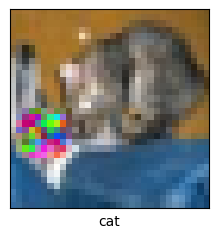

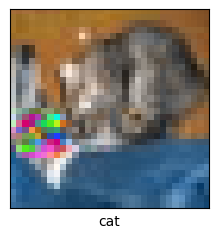

In [ ]:
show_image(x_test_adv[0],[prediction_labels[0]])
show_image(prediction_images1[0],[prediction_labels[0]])

###### Postprocessing Defenses

In [ ]:
from art.defences.postprocessor import GaussianNoise

[3 8 1 3 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 8 9 4 2 5 0 9 6 3 5 2 5 9 2 4
 1 9 5 4 3 3 3 0 9 5 1 7 2 9 8 5 5 8 8 5 3 3 3 7 3 3 1 2 1 2 3 7 1 8 8 0 2
 9 3 3 8 8 1 1 7 3 9 0 0 9 0 3 2 0 0 3 0 8 3 1 1 4 0 2 1 0 1 1 2 3 4 1 5]
Accuracy: 0.7


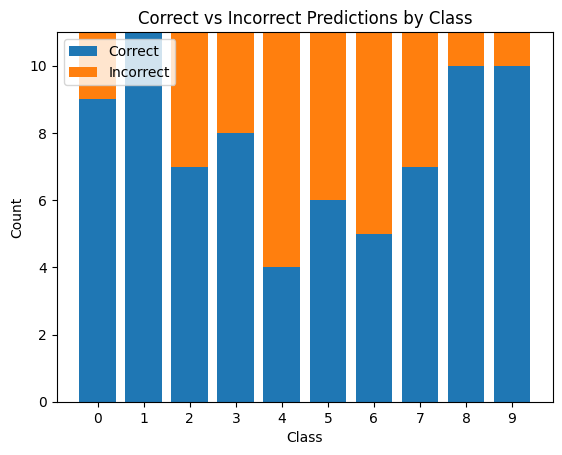

In [ ]:
# Define the postprocessing defense
noise = GaussianNoise(scale=0.2)
# Apply the defense to the classifier
classifier.postprocessing_defences = [noise]
plot_pedictions(classifier,prediction_labels1, prediction_images1)

######  Trainer Defenses

In [ ]:
from art.defences.trainer import AdversarialTrainerMadryPGD

In [ ]:
x_train_preprocessed, y_train_preprocessed = preprocessor(x_test,y_test)

In [ ]:
#Load the victim model
classifier_url = "https://tfhub.dev/deepmind/ganeval-cifar10-convnet/1"
IMAGE_SHAPE = (32, 32) 
classifier1 = KerasClassifier(model=tf.keras.Sequential([hub.KerasLayer(classifier_url, input_shape=IMAGE_SHAPE+(3,))]), clip_values=(0, 1))

In [ ]:
# Create an adversarial trainer with Madry's PGD
classifier1.model.compile(optimizer="adam", loss="sparse_categorical_crossentropy")

trainer = AdversarialTrainerMadryPGD(classifier1, nb_epochs=1, eps=0.1, eps_step=1, batch_size=16)

# Fit the adversarial trainer on preprocessed data
trainer.fit(x_train_preprocessed, y_train)

Precompute adv samples:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial training epochs:   0%|          | 0/1 [00:00<?, ?it/s]

[3 8 1 0 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 8 9 4 2 5 0 9 6 3 5 2 5 9 2 4
 1 9 5 4 3 3 3 0 9 5 1 7 2 9 8 5 5 8 8 7 3 3 3 7 3 3 1 2 1 2 3 7 1 8 8 0 2
 9 5 3 8 8 1 1 7 0 9 0 0 9 0 3 2 0 0 3 0 8 3 1 1 4 0 2 1 0 1 1 2 3 4 1 5]
Accuracy: 0.7090909090909091


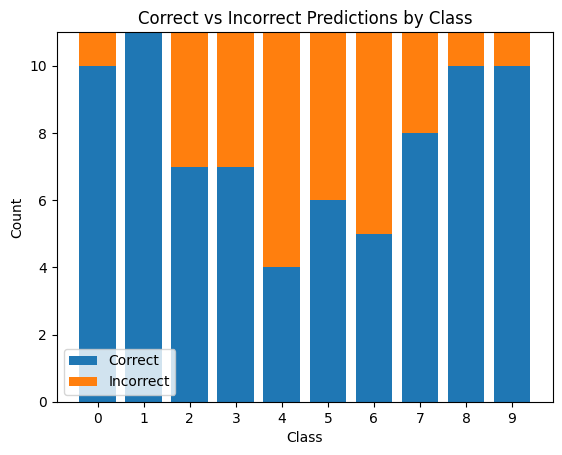

In [ ]:
plot_pedictions(classifier1,prediction_labels1, prediction_images1)

######Transformer Defenses

In [ ]:
from art.defences.transformer.evasion import DefensiveDistillation

In [ ]:
# Define the defense
defense = DefensiveDistillation(classifier=classifier1, batch_size=128, nb_epochs=20)

# Fit the defense
defense.fit(x_train, y_train)

# Get the transformed classifier
transformed_classifier = defense.classifier

[3 8 1 0 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 8 9 4 2 5 0 9 6 3 5 2 5 9 2 4
 1 9 5 4 3 3 3 0 9 5 1 7 2 9 8 5 5 8 8 7 3 3 3 7 3 3 1 2 1 2 3 7 1 8 8 0 2
 9 5 3 8 8 1 1 7 0 9 0 0 9 0 3 2 0 0 3 0 8 3 1 1 4 0 2 1 0 1 1 2 3 4 1 5]
Accuracy: 0.7090909090909091


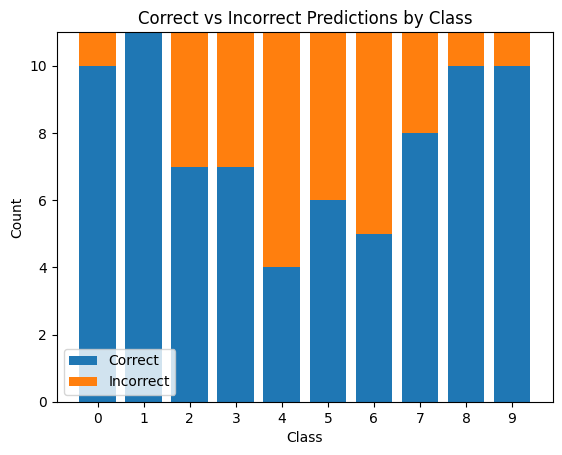

In [ ]:
plot_pedictions(transformed_classifier,prediction_labels1, prediction_images1)

###### Detector defenses: 

In [ ]:
# Create an adversarial trainer with Madry's PGD
classifier1.model.compile(optimizer="adam", loss="sparse_categorical_crossentropy")

trainer = AdversarialTrainerMadryPGD(classifier1, nb_epochs=6, eps=0.2, eps_step=0.1, batch_size=128)

# Fit the adversarial trainer on preprocessed data
trainer.fit(x_test_adv, prediction_labels)

Precompute adv samples:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial training epochs:   0%|          | 0/6 [00:00<?, ?it/s]

[3 0 1 0 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 8 9 4 0 5 0 9 6 6 5 2 5 9 2 4
 1 9 5 4 6 5 6 0 9 3 0 7 2 9 8 5 5 8 8 3 3 3 3 7 3 0 1 2 1 2 3 7 0 8 8 0 2
 9 3 3 8 8 1 1 7 0 5 1 7 9 0 3 2 0 0 7 4 5 3 1 1 4 0 2 1 4 1 1 2 3 4 1 5]
Accuracy: 0.7909090909090909


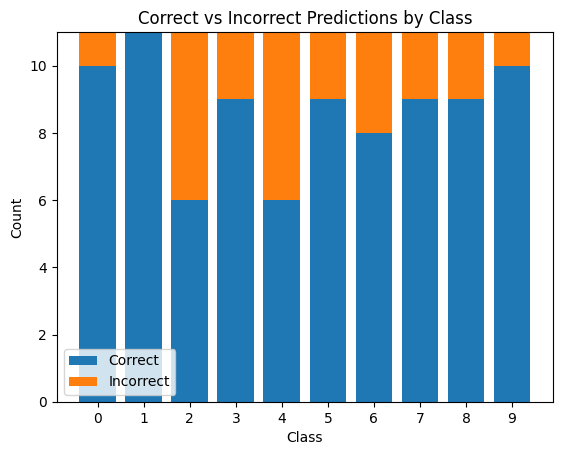

In [ ]:
plot_pedictions(classifier1,prediction_labels, x_test_adv)

#### Adversarial Patch - Targeted

In [ ]:
import numpy as np

patch_shape = (16, 16, 3)

attack = AdversarialPatch(classifier=classifier, patch_shape=patch_shape)

# Generate adversarial patches using the AdversarialPatch attack
adv_patches = attack.generate(prediction_images, y=tf.keras.utils.to_categorical(prediction_labels, 10))

Adversarial Patch Numpy:   0%|          | 0/500 [00:00<?, ?it/s]

In [ ]:
# Apply the adversarial patches to the images
adv_images = attack.apply_patch(prediction_images, scale=0.35, patch_external=adv_patches[0])

##### plots on Orginal model using adversial dataset generated using  Adversarial Patch targeted

[3 8 1 0 6 6 1 6 3 1 0 9 3 7 9 8 5 7 8 6 7 0 0 9 5 2 5 0 9 6 2 1 5 5 9 2 7
 9 9 5 4 6 5 6 0 9 3 1 7 6 9 8 5 3 8 8 7 7 5 3 7 5 6 3 2 1 2 5 7 2 8 8 0 2
 9 3 3 8 1 9 1 7 7 5 1 7 9 0 3 4 2 0 7 4 5 3 1 1 2 0 2 1 0 2 1 2 3 4 1 5]
Accuracy: 0.7818181818181819


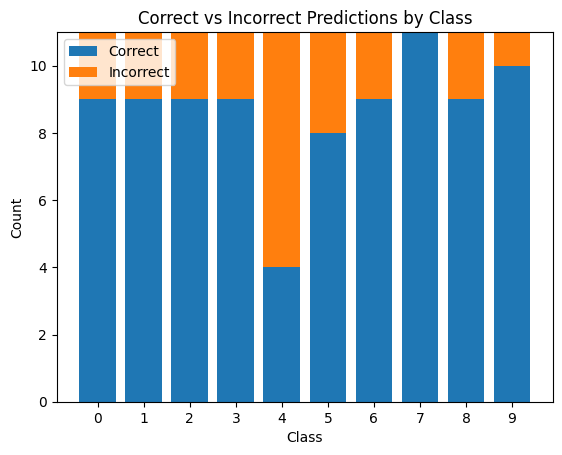

In [ ]:
plot_pedictions(classifier,prediction_labels,adv_images)

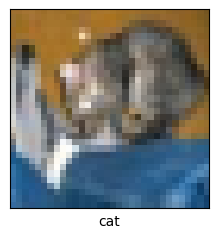

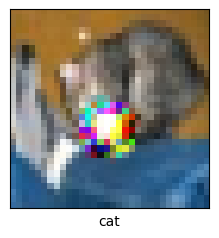

In [ ]:
show_image(prediction_images[0],[prediction_labels[0]])
show_image(adv_images[0],[prediction_labels[0]])

##### Defenses

In [ ]:
x_test_adv = adv_images

###### Preprocessing Defenses

In [ ]:
from art.defences.preprocessor import JpegCompression

[3 8 8 0 6 6 1 0 3 1 0 9 3 7 9 8 5 7 8 6 7 0 0 9 5 2 5 0 9 6 2 1 2 5 9 2 4
 1 9 5 4 6 5 6 0 9 3 8 7 2 9 8 5 3 8 8 7 7 5 3 7 5 6 1 2 1 2 3 7 8 8 0 0 2
 9 3 3 8 8 1 1 7 7 1 2 7 9 0 3 0 0 0 5 0 5 3 1 1 2 0 2 1 2 2 1 2 0 4 1 5]
Accuracy: 0.7545454545454545


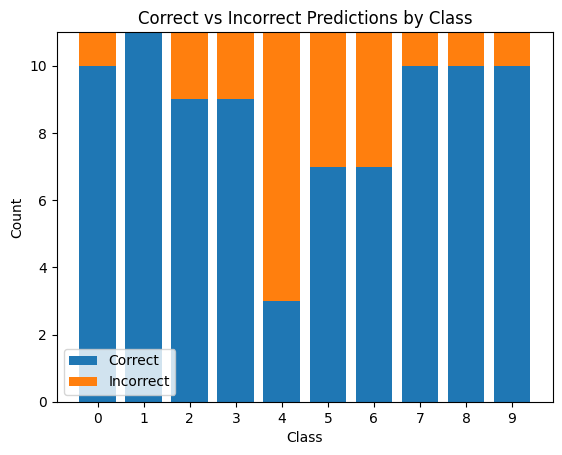

In [ ]:
# Apply preprocessor defense
preprocessor = JpegCompression(clip_values=(0,1),channels_first=True, apply_fit=True, apply_predict=True)
prediction_images1, prediction_labels1 = preprocessor(x_test_adv, prediction_labels)
plot_pedictions(classifier ,prediction_labels1, prediction_images1)  

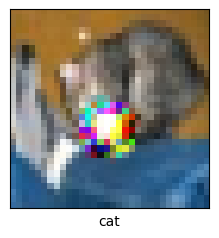

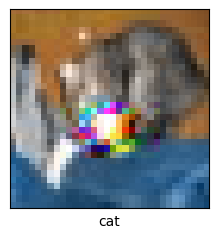

In [ ]:
show_image(x_test_adv[0],[prediction_labels[0]])
show_image(prediction_images1[0],[prediction_labels[0]])

###### Postprocessing Defenses

In [ ]:
from art.defences.postprocessor import GaussianNoise

[3 8 8 0 6 6 1 0 3 1 0 9 3 7 9 8 5 7 8 6 7 0 0 9 5 2 5 0 9 6 2 1 2 5 9 2 4
 1 9 5 4 6 5 6 0 9 3 8 7 2 9 8 5 3 8 8 7 7 3 3 7 5 6 1 2 1 2 3 7 8 8 0 0 2
 9 3 3 8 8 1 1 7 7 1 2 7 9 0 3 0 0 0 5 0 5 3 1 1 2 0 2 1 2 2 1 2 0 4 1 5]
Accuracy: 0.7727272727272727


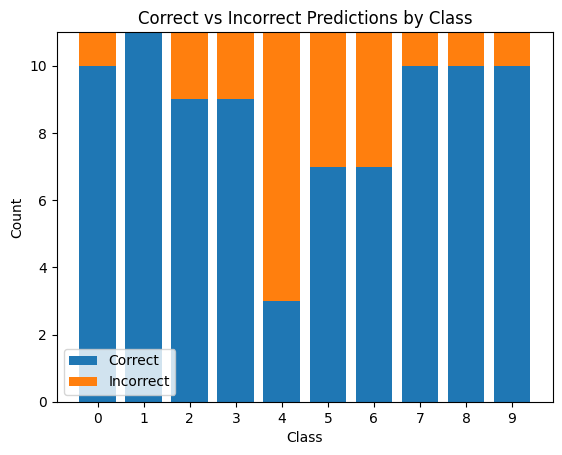

In [ ]:
# Define the postprocessing defense
noise = GaussianNoise(scale=0.2)
# Apply the defense to the classifier
classifier.postprocessing_defences = [noise]
plot_pedictions(classifier,prediction_labels1, prediction_images1)

######  Trainer Defenses

In [ ]:
from art.defences.trainer import AdversarialTrainerMadryPGD

In [ ]:
x_train_preprocessed, y_train_preprocessed = preprocessor(x_test,y_test)

In [ ]:
#Load the victim model
classifier_url = "https://tfhub.dev/deepmind/ganeval-cifar10-convnet/1"
IMAGE_SHAPE = (32, 32) 
classifier1 = KerasClassifier(model=tf.keras.Sequential([hub.KerasLayer(classifier_url, input_shape=IMAGE_SHAPE+(3,))]), clip_values=(0, 1))

In [ ]:
# Create an adversarial trainer with Madry's PGD
classifier1.model.compile(optimizer="adam", loss="sparse_categorical_crossentropy")

trainer = AdversarialTrainerMadryPGD(classifier1, nb_epochs=1, eps=0.1, eps_step=1, batch_size=16)

# Fit the adversarial trainer on preprocessed data
trainer.fit(x_train_preprocessed, y_train)

Precompute adv samples:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial training epochs:   0%|          | 0/1 [00:00<?, ?it/s]

[3 8 1 0 6 6 1 0 3 1 0 9 3 7 9 8 5 7 8 6 7 0 0 9 5 2 5 0 9 6 2 1 2 5 9 2 4
 1 9 5 4 6 5 6 0 9 3 8 7 2 9 8 5 3 8 8 7 7 5 3 7 5 6 1 2 1 2 3 7 8 8 0 0 2
 9 3 3 8 1 1 1 7 7 1 2 7 9 0 3 0 0 0 5 0 5 3 1 1 2 0 2 1 2 2 1 2 0 4 1 5]
Accuracy: 0.7636363636363637


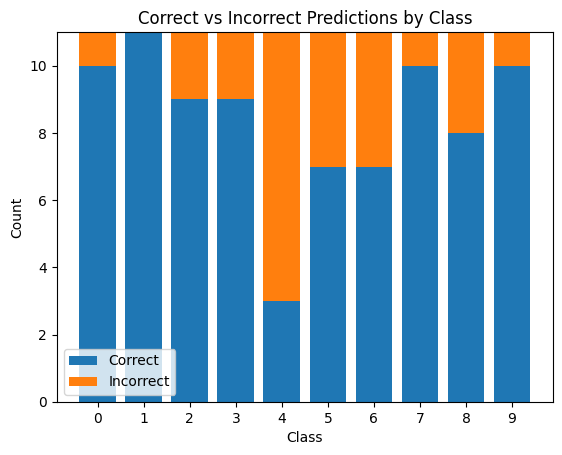

In [ ]:
plot_pedictions(classifier1,prediction_labels1, prediction_images1)

######Transformer Defenses

In [ ]:
from art.defences.transformer.evasion import DefensiveDistillation

In [ ]:
# Define the defense
defense = DefensiveDistillation(classifier=classifier1, batch_size=128, nb_epochs=20)

# Fit the defense
defense.fit(x_train, y_train)

# Get the transformed classifier
transformed_classifier = defense.classifier

[3 8 1 0 6 6 1 0 3 1 0 9 3 7 9 8 5 7 8 6 7 0 0 9 5 2 5 0 9 6 2 1 2 5 9 2 4
 1 9 5 4 6 5 6 0 9 3 8 7 2 9 8 5 3 8 8 7 7 5 3 7 5 6 1 2 1 2 3 7 8 8 0 0 2
 9 3 3 8 1 1 1 7 7 1 2 7 9 0 3 0 0 0 5 0 5 3 1 1 2 0 2 1 2 2 1 2 0 4 1 5]
Accuracy: 0.7636363636363637


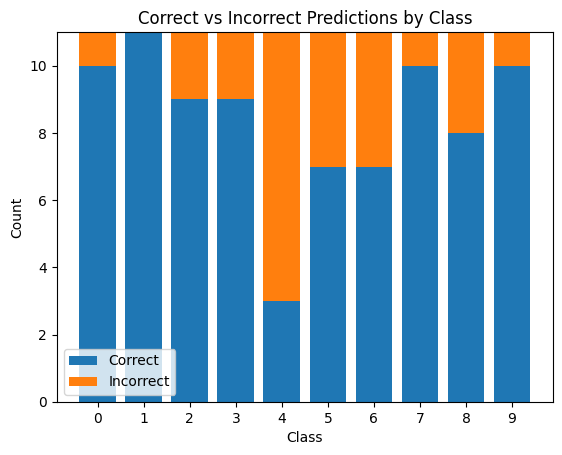

In [ ]:
plot_pedictions(transformed_classifier,prediction_labels1, prediction_images1)

###### Detector defenses: 

In [ ]:
# Create an adversarial trainer with Madry's PGD
classifier1.model.compile(optimizer="adam", loss="sparse_categorical_crossentropy")

trainer = AdversarialTrainerMadryPGD(classifier1, nb_epochs=6, eps=0.2, eps_step=0.1, batch_size=128)

# Fit the adversarial trainer on preprocessed data
trainer.fit(x_test_adv, prediction_labels)

Precompute adv samples:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial training epochs:   0%|          | 0/6 [00:00<?, ?it/s]

[3 1 1 0 6 6 1 6 3 1 0 9 3 7 9 8 5 7 8 6 7 0 0 9 5 2 5 0 9 6 2 1 5 5 9 2 7
 9 9 5 4 6 5 6 0 9 3 1 7 6 9 8 5 3 8 8 7 7 5 3 7 5 6 3 2 1 2 3 7 2 8 0 0 2
 9 3 3 8 1 9 1 7 7 5 1 7 9 0 3 4 2 0 7 4 5 3 1 1 2 0 2 1 0 2 1 2 3 4 1 5]
Accuracy: 0.7818181818181819


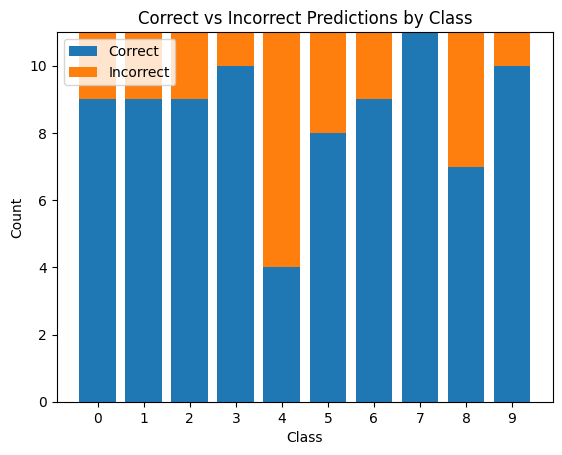

In [ ]:
plot_pedictions(classifier1,prediction_labels, x_test_adv)

### 3 Elastic Net WB

In [ ]:
from art.attacks.evasion import ElasticNet

#### Elastic Net - UnTargeted

In [ ]:
elastic_net = ElasticNet(classifier=classifier,batch_size=32,max_iter=1,learning_rate=0.1,)

In [ ]:
elastic_adv = elastic_net.generate(prediction_images, prediction_labels)

EAD:   0%|          | 0/4 [00:00<?, ?it/s]

##### plots on Orginal model using adversial dataset generated using  Elastic Net Untargeted

[5 1 1 9 6 3 1 3 5 9 3 8 3 9 9 8 2 2 4 6 9 3 0 9 5 5 4 6 1 2 2 2 8 4 9 2 7
 9 1 2 4 2 3 6 0 9 3 0 5 2 9 6 5 3 0 8 5 7 5 3 5 5 6 3 6 1 2 5 7 2 3 8 9 5
 0 3 3 9 8 9 0 3 2 7 1 3 8 1 3 7 2 0 5 3 3 3 0 2 6 0 2 6 0 6 1 9 3 2 0 5]
Accuracy: 0.2909090909090909


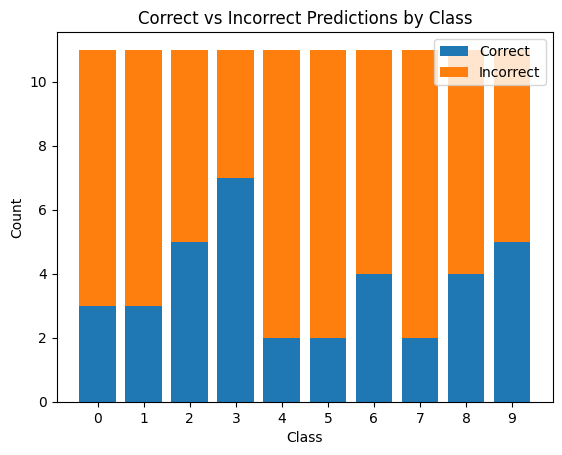

In [ ]:
plot_pedictions(classifier,prediction_labels,elastic_adv)

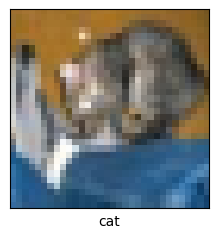

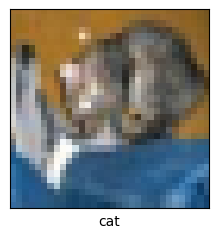

In [ ]:
show_image(prediction_images[0],[prediction_labels[0]])
show_image(elastic_adv[0],[prediction_labels[0]])

##### Defenses

In [ ]:
x_test_adv = elastic_adv

###### Preprocessing Defenses

In [ ]:
from art.defences.preprocessor import JpegCompression

[3 8 8 0 6 6 1 6 3 1 3 8 5 7 9 8 4 7 8 2 9 0 4 9 4 2 4 0 9 6 6 5 4 5 0 2 4
 9 9 5 4 6 5 6 0 9 3 8 5 2 9 8 5 3 0 8 7 3 5 3 5 3 6 9 2 1 2 3 7 2 8 8 0 5
 9 3 3 3 8 9 0 3 7 5 2 7 9 0 3 4 0 0 7 2 5 3 7 2 4 0 2 1 0 6 1 2 3 2 1 5]
Accuracy: 0.6909090909090909


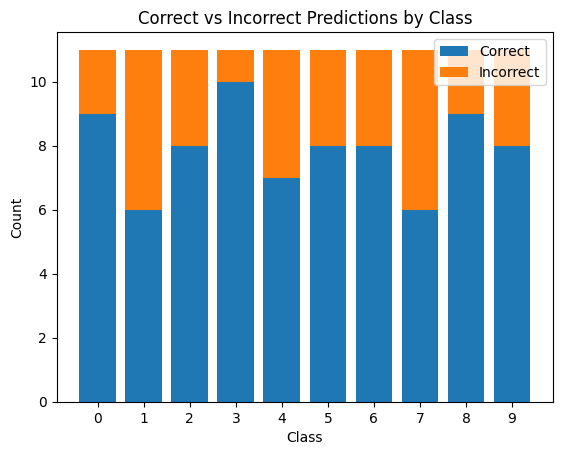

In [ ]:
# Apply preprocessor defense
preprocessor = JpegCompression(clip_values=(0,1),channels_first=True, apply_fit=True, apply_predict=True)
prediction_images1, prediction_labels1 = preprocessor(x_test_adv, prediction_labels)
plot_pedictions(classifier ,prediction_labels1, prediction_images1)  

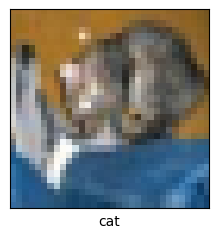

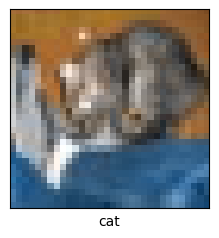

In [ ]:
show_image(x_test_adv[0],[prediction_labels[0]])
show_image(prediction_images1[0],[prediction_labels[0]])

###### Postprocessing Defenses

In [ ]:
from art.defences.postprocessor import GaussianNoise

[3 8 8 9 6 6 1 6 3 1 3 8 5 7 9 8 2 7 8 2 9 0 4 9 4 2 4 0 9 6 6 5 4 5 0 2 4
 9 9 5 4 6 5 6 0 9 3 8 5 2 9 8 5 3 0 8 7 3 5 3 5 3 6 9 2 1 2 3 7 2 8 8 0 5
 9 3 3 3 8 9 0 3 7 5 2 7 9 0 3 4 0 0 7 2 5 3 7 2 4 0 2 1 0 6 1 9 3 2 1 2]
Accuracy: 0.7181818181818181


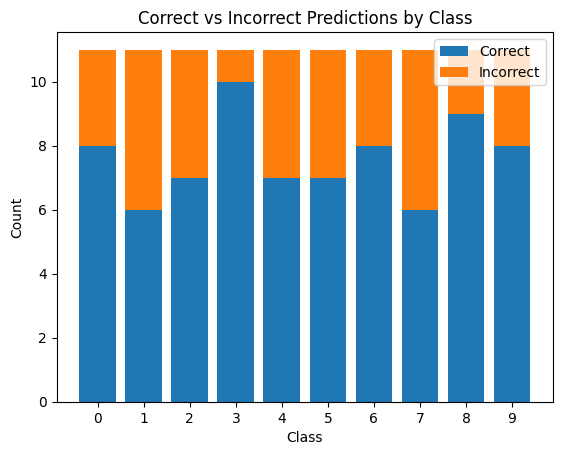

In [ ]:
# Define the postprocessing defense
noise = GaussianNoise(scale=0.2)
# Apply the defense to the classifier
classifier.postprocessing_defences = [noise]
plot_pedictions(classifier,prediction_labels1, prediction_images1)

######  Trainer Defenses

In [ ]:
from art.defences.trainer import AdversarialTrainerMadryPGD

In [ ]:
x_train_preprocessed, y_train_preprocessed = preprocessor(x_test,y_test)

In [ ]:
#Load the victim model
classifier_url = "https://tfhub.dev/deepmind/ganeval-cifar10-convnet/1"
IMAGE_SHAPE = (32, 32) 
classifier1 = KerasClassifier(model=tf.keras.Sequential([hub.KerasLayer(classifier_url, input_shape=IMAGE_SHAPE+(3,))]), clip_values=(0, 1))

In [ ]:
# Create an adversarial trainer with Madry's PGD
classifier1.model.compile(optimizer="adam", loss="sparse_categorical_crossentropy")

trainer = AdversarialTrainerMadryPGD(classifier1, nb_epochs=1, eps=0.1, eps_step=1, batch_size=16)

# Fit the adversarial trainer on preprocessed data
trainer.fit(x_train_preprocessed, y_train)

Precompute adv samples:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial training epochs:   0%|          | 0/1 [00:00<?, ?it/s]

[3 8 8 9 6 6 1 6 3 1 3 8 5 7 9 8 4 7 8 2 9 0 4 9 4 2 4 0 9 6 6 5 4 5 0 2 4
 9 9 5 4 6 5 6 0 9 3 8 5 2 9 8 5 3 0 8 7 3 5 3 5 3 6 9 2 1 2 3 7 2 8 8 0 5
 9 3 3 3 8 9 0 3 7 7 2 7 9 0 3 4 0 0 7 2 5 3 7 2 4 0 2 1 0 6 1 2 3 2 1 2]
Accuracy: 0.6909090909090909


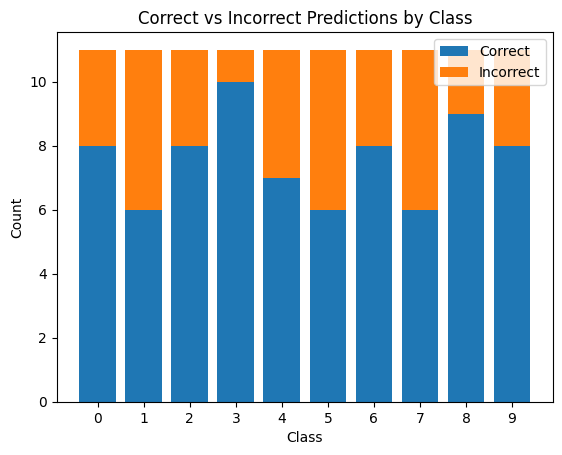

In [ ]:
plot_pedictions(classifier1,prediction_labels1, prediction_images1)

######Transformer Defenses

In [ ]:
from art.defences.transformer.evasion import DefensiveDistillation

In [ ]:
# Define the defense
defense = DefensiveDistillation(classifier=classifier1, batch_size=128, nb_epochs=20)

# Fit the defense
defense.fit(x_train, y_train)

# Get the transformed classifier
transformed_classifier = defense.classifier

[3 8 8 9 6 6 1 6 3 1 3 8 5 7 9 8 4 7 8 2 9 0 4 9 4 2 4 0 9 6 6 5 4 5 0 2 4
 9 9 5 4 6 5 6 0 9 3 8 5 2 9 8 5 3 0 8 7 3 5 3 5 3 6 9 2 1 2 3 7 2 8 8 0 5
 9 3 3 3 8 9 0 3 7 7 2 7 9 0 3 4 0 0 7 2 5 3 7 2 4 0 2 1 0 6 1 2 3 2 1 2]
Accuracy: 0.6909090909090909


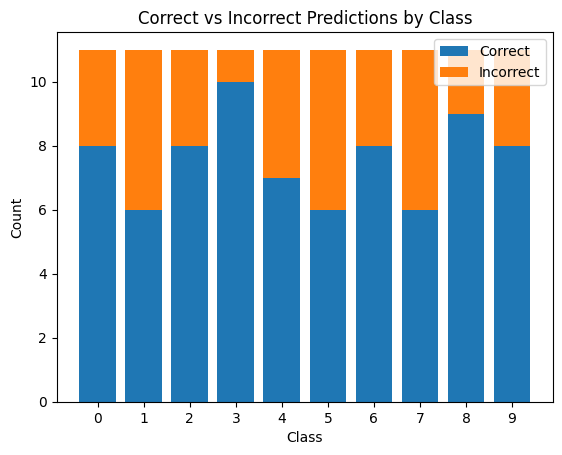

In [ ]:
plot_pedictions(transformed_classifier,prediction_labels1, prediction_images1)

###### Detector defenses: 

In [ ]:
# Create an adversarial trainer with Madry's PGD
classifier1.model.compile(optimizer="adam", loss="sparse_categorical_crossentropy")

trainer = AdversarialTrainerMadryPGD(classifier1, nb_epochs=6, eps=0.2, eps_step=0.1, batch_size=128)

# Fit the adversarial trainer on preprocessed data
trainer.fit(x_test_adv, prediction_labels)

Precompute adv samples:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial training epochs:   0%|          | 0/6 [00:00<?, ?it/s]

[5 1 1 9 2 3 5 3 3 9 3 8 3 9 9 8 5 2 4 6 9 3 0 2 5 5 4 0 9 2 2 2 8 4 9 8 7
 9 1 2 2 2 3 6 8 9 6 0 5 2 9 6 5 3 0 4 5 7 5 3 5 5 0 3 6 1 2 5 7 2 3 8 9 5
 0 2 5 9 0 9 1 3 7 7 1 3 8 1 2 7 2 0 5 3 3 2 1 0 6 2 2 6 0 6 1 9 3 2 0 2]
Accuracy: 0.23636363636363636


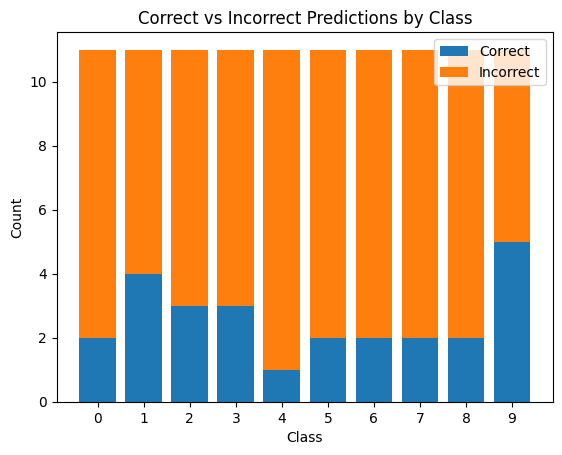

In [ ]:
plot_pedictions(classifier1,prediction_labels, x_test_adv)

#### Elastic Net - Targeted

In [ ]:
elastic_net = ElasticNet(classifier=classifier,batch_size=32,max_iter=10,learning_rate=0.1,targeted=True)

In [ ]:
elastic_adv = elastic_net.generate(prediction_images, prediction_labels)

EAD:   0%|          | 0/4 [00:00<?, ?it/s]

##### plots on Orginal model using adversial dataset generated using  Elastic Net targeted

[3 8 8 0 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 4 9 5 2 4 0 9 6 6 5 4 5 9 2 4
 9 9 5 4 6 5 6 0 9 3 9 7 6 9 8 5 3 8 8 7 7 4 6 7 3 6 3 2 1 2 3 7 2 8 8 0 2
 9 3 3 8 8 9 1 7 2 5 2 7 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 4 6 1 2 3 4 1 5]
Accuracy: 0.9454545454545454


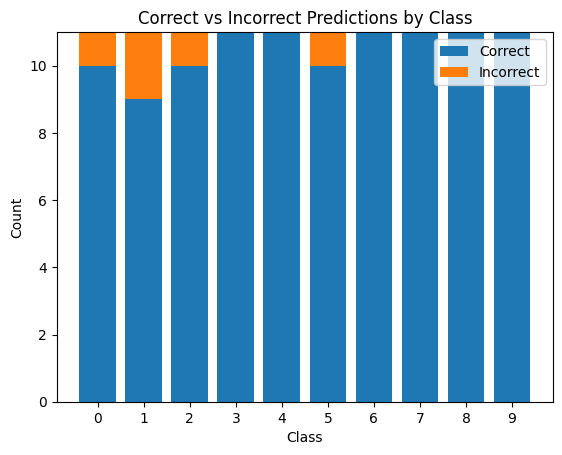

In [ ]:
plot_pedictions(classifier,prediction_labels,elastic_adv)

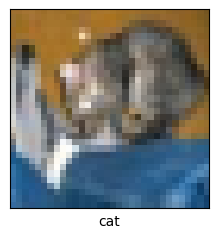

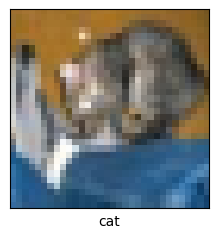

In [ ]:
show_image(prediction_images[0],[prediction_labels[0]])
show_image(elastic_adv[0],[prediction_labels[0]])

##### Defenses

In [ ]:
x_test_adv = elastic_adv

###### Preprocessing Defenses

In [ ]:
from art.defences.preprocessor import JpegCompression

[3 8 8 0 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 4 9 4 2 4 0 9 6 6 5 4 5 9 2 4
 9 9 5 4 6 5 6 0 9 3 8 7 2 9 8 5 3 8 8 7 7 5 3 7 3 6 9 2 1 2 3 7 2 8 8 0 2
 9 3 3 8 8 9 1 7 7 5 2 7 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 4 6 1 2 3 4 1 5]
Accuracy: 0.9090909090909091


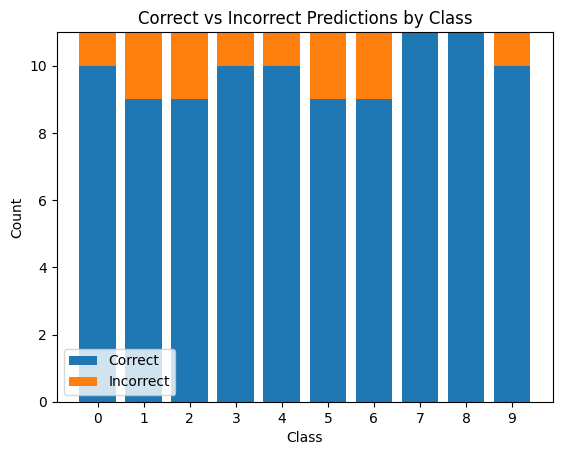

In [ ]:
# Apply preprocessor defense
preprocessor = JpegCompression(clip_values=(0,1),channels_first=True, apply_fit=True, apply_predict=True)
prediction_images1, prediction_labels1 = preprocessor(x_test_adv, prediction_labels)
plot_pedictions(classifier ,prediction_labels1, prediction_images1)  

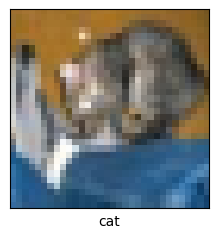

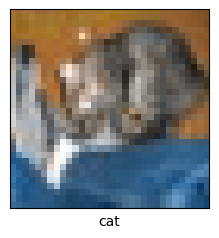

In [ ]:
show_image(x_test_adv[0],[prediction_labels[0]])
show_image(prediction_images1[0],[prediction_labels[0]])

###### Postprocessing Defenses

In [ ]:
from art.defences.postprocessor import GaussianNoise

[3 8 8 0 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 4 9 4 2 4 0 9 6 6 5 4 5 9 2 4
 9 9 5 4 6 5 6 0 9 3 8 7 2 9 8 5 3 8 8 7 7 5 3 7 3 6 9 2 1 2 3 7 2 8 8 0 2
 9 3 3 8 8 1 1 7 2 5 2 7 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 4 6 1 2 3 4 1 5]
Accuracy: 0.9


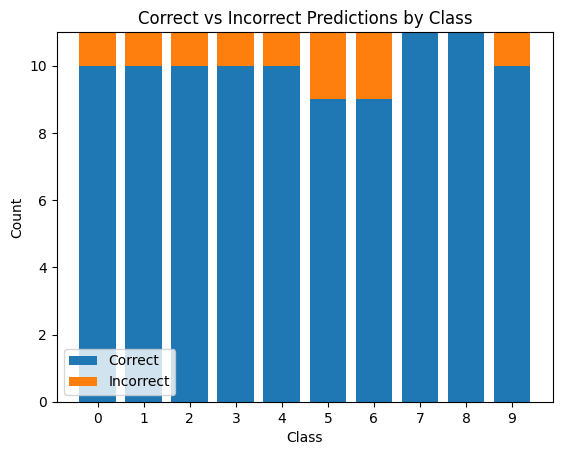

In [ ]:
# Define the postprocessing defense
noise = GaussianNoise(scale=0.2)
# Apply the defense to the classifier
classifier.postprocessing_defences = [noise]
plot_pedictions(classifier,prediction_labels1, prediction_images1)

######  Trainer Defenses

In [ ]:
from art.defences.trainer import AdversarialTrainerMadryPGD

In [ ]:
x_train_preprocessed, y_train_preprocessed = preprocessor(x_test,y_test)

In [ ]:
#Load the victim model
classifier_url = "https://tfhub.dev/deepmind/ganeval-cifar10-convnet/1"
IMAGE_SHAPE = (32, 32) 
classifier1 = KerasClassifier(model=tf.keras.Sequential([hub.KerasLayer(classifier_url, input_shape=IMAGE_SHAPE+(3,))]), clip_values=(0, 1))

In [ ]:
# Create an adversarial trainer with Madry's PGD
classifier1.model.compile(optimizer="adam", loss="sparse_categorical_crossentropy")

trainer = AdversarialTrainerMadryPGD(classifier1, nb_epochs=1, eps=0.1, eps_step=1, batch_size=16)

# Fit the adversarial trainer on preprocessed data
trainer.fit(x_train_preprocessed, y_train)

Precompute adv samples:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial training epochs:   0%|          | 0/1 [00:00<?, ?it/s]

[3 8 8 0 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 4 9 4 2 4 0 9 6 6 5 4 5 9 2 4
 9 9 5 4 6 5 6 0 9 3 8 7 2 9 8 5 3 8 8 7 7 5 3 7 3 6 9 2 1 2 3 7 2 8 8 0 2
 9 3 3 8 8 1 1 7 2 5 2 7 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 4 6 1 2 3 4 1 5]
Accuracy: 0.9090909090909091


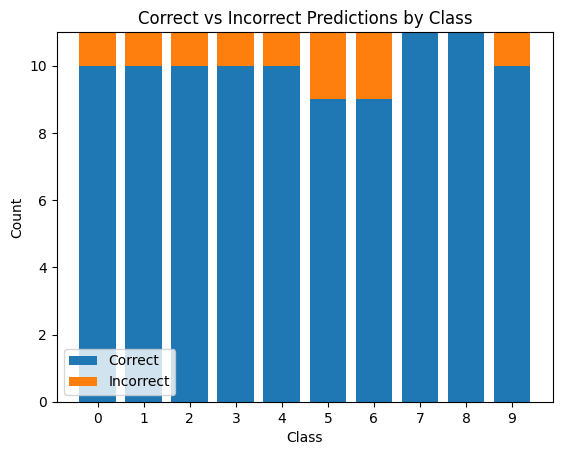

In [ ]:
plot_pedictions(classifier1,prediction_labels1, prediction_images1)

######Transformer Defenses

In [ ]:
from art.defences.transformer.evasion import DefensiveDistillation

In [ ]:
# Define the defense
defense = DefensiveDistillation(classifier=classifier1, batch_size=128, nb_epochs=20)

# Fit the defense
defense.fit(x_train, y_train)

# Get the transformed classifier
transformed_classifier = defense.classifier

[3 8 8 0 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 4 9 4 2 4 0 9 6 6 5 4 5 9 2 4
 9 9 5 4 6 5 6 0 9 3 8 7 2 9 8 5 3 8 8 7 7 5 3 7 3 6 9 2 1 2 3 7 2 8 8 0 2
 9 3 3 8 8 1 1 7 2 5 2 7 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 4 6 1 2 3 4 1 5]
Accuracy: 0.9090909090909091


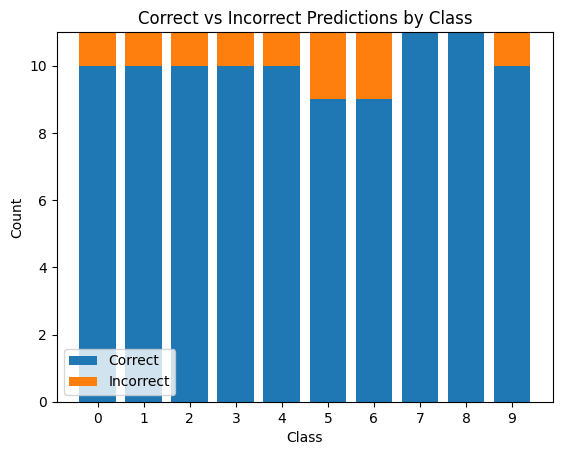

In [ ]:
plot_pedictions(transformed_classifier,prediction_labels1, prediction_images1)

###### Detector defenses: 

In [ ]:
# Create an adversarial trainer with Madry's PGD
classifier1.model.compile(optimizer="adam", loss="sparse_categorical_crossentropy")

trainer = AdversarialTrainerMadryPGD(classifier1, nb_epochs=6, eps=0.2, eps_step=0.1, batch_size=128)

# Fit the adversarial trainer on preprocessed data
trainer.fit(x_test_adv, prediction_labels)

Precompute adv samples:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial training epochs:   0%|          | 0/6 [00:00<?, ?it/s]

[3 8 8 0 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 4 9 5 2 4 0 9 6 6 5 4 5 9 2 4
 9 9 5 4 6 5 6 0 9 3 9 7 6 9 8 0 3 8 8 7 7 7 3 7 3 6 3 2 1 2 3 7 2 8 8 0 2
 9 3 3 8 8 9 1 7 2 5 2 7 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 4 6 1 2 3 4 1 5]
Accuracy: 0.9454545454545454


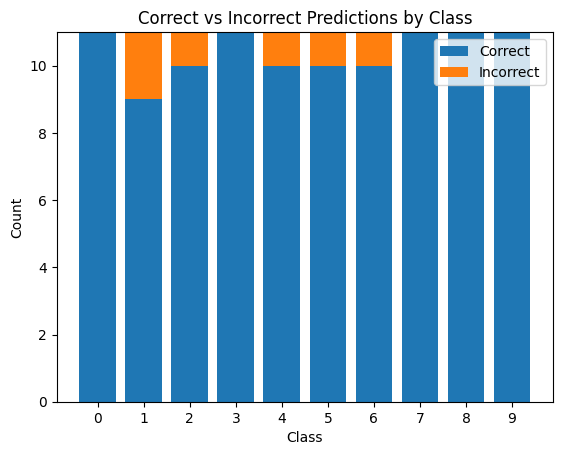

In [ ]:
plot_pedictions(classifier1,prediction_labels, x_test_adv)

###4 DeepFool WB

In [ ]:
from art.attacks.evasion import DeepFool

#### DeepFool

In [ ]:
deep_fool = DeepFool(classifier=classifier,batch_size=32,max_iter=5)

In [ ]:
deep_fool_adv = deep_fool.generate(prediction_images, prediction_labels)

DeepFool:   0%|          | 0/4 [00:00<?, ?it/s]

##### plots on Orginal model using adversial dataset generated using  DeepFool Untargeted

[5 0 8 9 2 6 5 4 5 9 3 9 3 9 0 6 3 2 4 4 7 0 6 6 3 5 5 0 1 2 6 2 4 5 9 8 7
 1 3 1 2 2 3 6 0 9 6 9 5 2 6 6 2 5 8 2 7 3 3 6 5 3 6 9 6 1 2 5 4 8 8 0 4 2
 0 3 5 8 0 1 1 7 7 7 2 3 0 0 2 5 0 0 5 7 3 3 9 1 4 0 6 1 4 3 3 2 5 2 1 5]
Accuracy: 0.39090909090909093


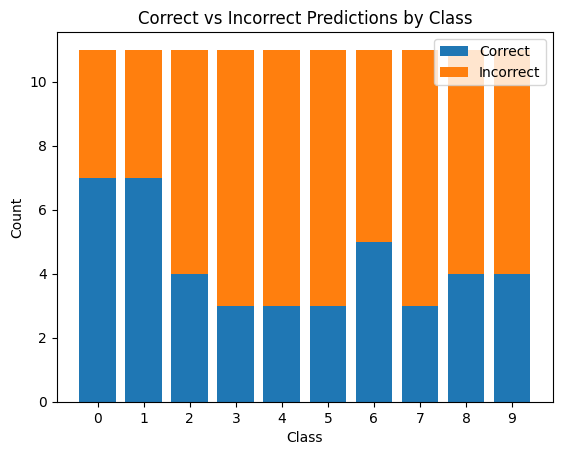

In [ ]:
plot_pedictions(classifier,prediction_labels,deep_fool_adv)

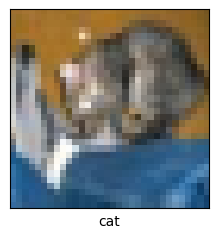

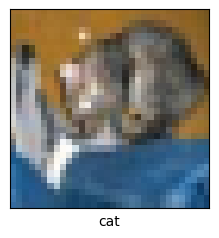

In [ ]:
show_image(prediction_images[0],[prediction_labels[0]])
show_image(deep_fool_adv[0],[prediction_labels[0]])

##### Defenses

In [ ]:
x_test_adv = deep_fool_adv

###### Preprocessing Defenses

In [ ]:
from art.defences.preprocessor import JpegCompression

[3 8 8 9 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 4 9 4 2 4 0 9 6 6 5 4 5 9 2 4
 1 9 5 4 6 5 6 0 9 3 8 7 2 9 8 5 3 8 8 7 3 3 3 7 3 6 9 2 1 2 3 7 3 8 8 0 2
 9 3 3 8 8 1 1 7 7 7 2 7 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 0 6 1 2 3 4 1 5]
Accuracy: 0.8636363636363636


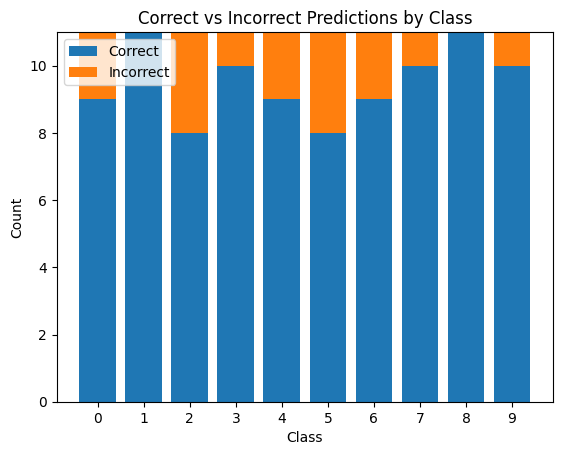

In [ ]:
# Apply preprocessor defense
preprocessor = JpegCompression(clip_values=(0,1),channels_first=True, apply_fit=True, apply_predict=True)
prediction_images1, prediction_labels1 = preprocessor(x_test_adv, prediction_labels)
plot_pedictions(classifier ,prediction_labels1, prediction_images1)  

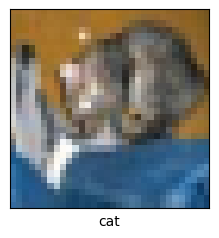

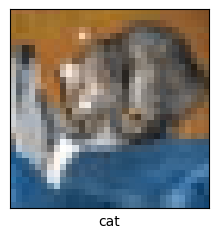

In [ ]:
show_image(x_test_adv[0],[prediction_labels[0]])
show_image(prediction_images1[0],[prediction_labels[0]])

###### Postprocessing Defenses

In [ ]:
from art.defences.postprocessor import GaussianNoise

[3 8 8 9 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 4 9 4 2 4 0 1 6 6 5 4 5 9 2 4
 1 9 5 4 6 5 6 0 9 3 8 7 2 9 8 5 3 8 8 7 3 3 3 7 3 6 9 2 1 2 3 7 3 8 8 0 2
 9 3 3 8 8 1 1 7 7 7 2 7 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 0 6 1 2 3 4 1 5]
Accuracy: 0.8636363636363636


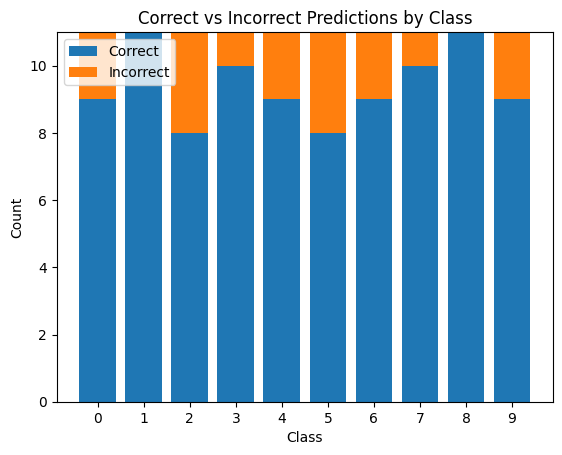

In [ ]:
# Define the postprocessing defense
noise = GaussianNoise(scale=0.2)
# Apply the defense to the classifier
classifier.postprocessing_defences = [noise]
plot_pedictions(classifier,prediction_labels1, prediction_images1)

######  Trainer Defenses

In [ ]:
from art.defences.trainer import AdversarialTrainerMadryPGD

In [ ]:
x_train_preprocessed, y_train_preprocessed = preprocessor(x_test,y_test)

In [ ]:
#Load the victim model
classifier_url = "https://tfhub.dev/deepmind/ganeval-cifar10-convnet/1"
IMAGE_SHAPE = (32, 32) 
classifier1 = KerasClassifier(model=tf.keras.Sequential([hub.KerasLayer(classifier_url, input_shape=IMAGE_SHAPE+(3,))]), clip_values=(0, 1))

In [ ]:
# Create an adversarial trainer with Madry's PGD
classifier1.model.compile(optimizer="adam", loss="sparse_categorical_crossentropy")

trainer = AdversarialTrainerMadryPGD(classifier1, nb_epochs=1, eps=0.1, eps_step=1, batch_size=16)

# Fit the adversarial trainer on preprocessed data
trainer.fit(x_train_preprocessed, y_train)

Precompute adv samples:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial training epochs:   0%|          | 0/1 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/keras/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


[3 8 8 9 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 4 9 4 2 4 0 9 6 6 5 4 5 9 2 4
 1 9 5 4 6 5 6 0 9 3 8 7 2 9 8 5 3 8 8 7 3 3 3 7 3 6 9 2 1 2 3 7 3 8 8 0 2
 9 3 3 8 8 1 1 7 7 7 2 7 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 0 6 1 2 3 4 1 5]
Accuracy: 0.8636363636363636


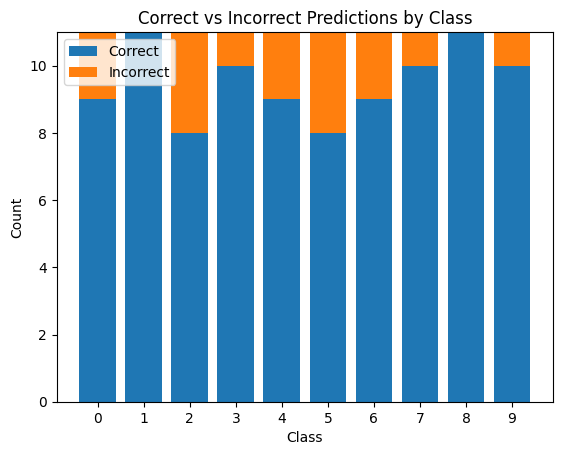

In [ ]:
plot_pedictions(classifier1,prediction_labels1, prediction_images1)

######Transformer Defenses

In [ ]:
from art.defences.transformer.evasion import DefensiveDistillation

In [ ]:
# Define the defense
defense = DefensiveDistillation(classifier=classifier1, batch_size=128, nb_epochs=20)

# Fit the defense
defense.fit(x_train, y_train)

# Get the transformed classifier
transformed_classifier = defense.classifier

[3 8 8 9 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 4 9 4 2 4 0 9 6 6 5 4 5 9 2 4
 1 9 5 4 6 5 6 0 9 3 8 7 2 9 8 5 3 8 8 7 3 3 3 7 3 6 9 2 1 2 3 7 3 8 8 0 2
 9 3 3 8 8 1 1 7 7 7 2 7 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 0 6 1 2 3 4 1 5]
Accuracy: 0.8636363636363636


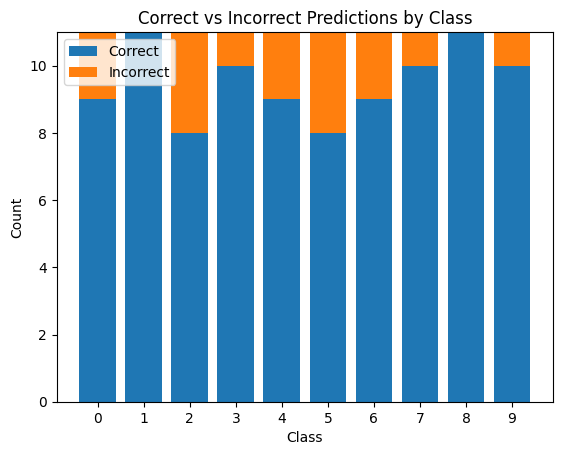

In [ ]:
plot_pedictions(transformed_classifier,prediction_labels1, prediction_images1)

###### Detector defenses: 

In [ ]:
# Create an adversarial trainer with Madry's PGD
classifier1.model.compile(optimizer="adam", loss="sparse_categorical_crossentropy")

trainer = AdversarialTrainerMadryPGD(classifier1, nb_epochs=6, eps=0.2, eps_step=0.1, batch_size=128)

# Fit the adversarial trainer on preprocessed data
trainer.fit(x_test_adv, prediction_labels)

Precompute adv samples:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial training epochs:   0%|          | 0/6 [00:00<?, ?it/s]

[5 0 8 9 2 6 5 4 5 9 3 9 3 9 0 6 3 2 4 4 7 0 6 6 3 5 5 0 1 2 6 2 4 5 9 8 7
 1 3 1 2 2 3 6 0 9 6 9 5 2 6 6 2 5 8 2 7 3 3 6 5 3 6 9 6 1 2 5 4 8 8 0 4 2
 0 3 5 8 0 1 1 7 7 7 2 3 0 0 2 5 0 0 5 7 3 3 9 1 4 0 6 1 4 3 3 2 5 2 1 5]
Accuracy: 0.39090909090909093


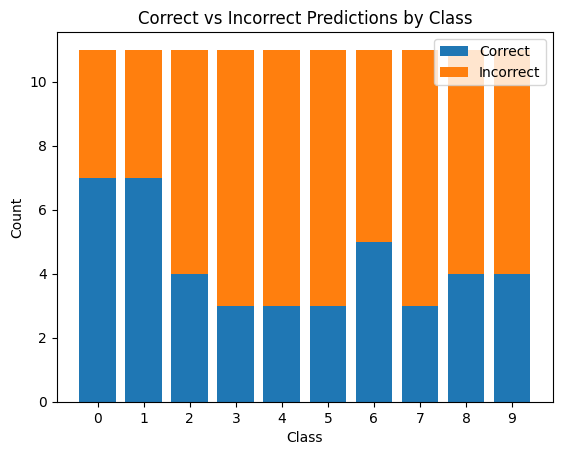

In [ ]:
plot_pedictions(classifier1,prediction_labels, x_test_adv)

###5 CarliniL In fMethod WB

In [ ]:
from art.attacks.evasion import CarliniLInfMethod

#### CarliniLInfMethod UnTargeted

In [ ]:
carlini_linf = CarliniLInfMethod(classifier=classifier,batch_size=50)

In [ ]:
carlini_adv = carlini_linf.generate(prediction_images, prediction_labels)

C&W L_inf:   0%|          | 0/110 [00:00<?, ?it/s]

##### plots on Orginal model using adversial dataset generated using  CarliniInfMethod targeted

[5 8 1 9 2 3 5 4 5 9 3 7 3 1 1 6 7 2 7 2 7 3 0 2 3 5 5 2 1 6 2 2 8 4 0 8 7
 9 1 1 2 2 7 3 8 0 6 0 5 2 6 6 5 5 8 9 5 3 5 3 4 5 0 9 6 8 0 5 4 8 0 0 9 5
 0 5 5 7 0 9 7 8 7 7 1 3 8 0 2 7 2 2 5 4 3 2 9 1 6 2 6 8 0 6 3 0 3 4 0 7]
Accuracy: 0.09090909090909091


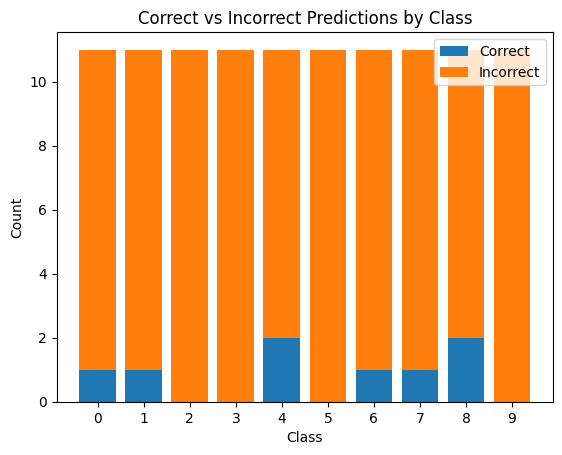

In [ ]:
plot_pedictions(classifier,prediction_labels,carlini_adv)

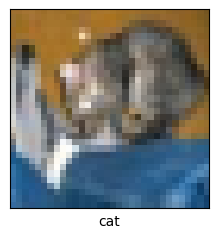

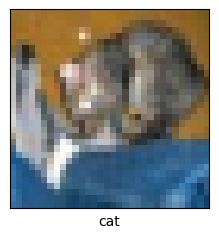

In [ ]:
show_image(prediction_images[0],[prediction_labels[0]])
show_image(carlini_adv[0],[prediction_labels[0]])

##### Defenses

In [ ]:
x_test_adv = carlini_adv

###### Preprocessing Defenses

In [ ]:
from art.defences.preprocessor import JpegCompression

[3 8 1 9 6 6 9 6 3 1 3 9 5 7 9 8 5 7 8 6 9 0 4 9 4 2 4 0 1 6 6 5 4 5 9 2 4
 9 9 5 4 6 5 6 0 9 6 8 7 2 9 8 5 5 8 8 7 3 5 3 7 5 6 9 2 1 2 3 7 3 8 8 0 2
 9 3 3 8 0 9 1 7 7 7 2 3 9 0 3 4 2 0 7 4 5 3 1 1 4 0 6 1 0 6 1 2 3 4 1 5]
Accuracy: 0.7454545454545455


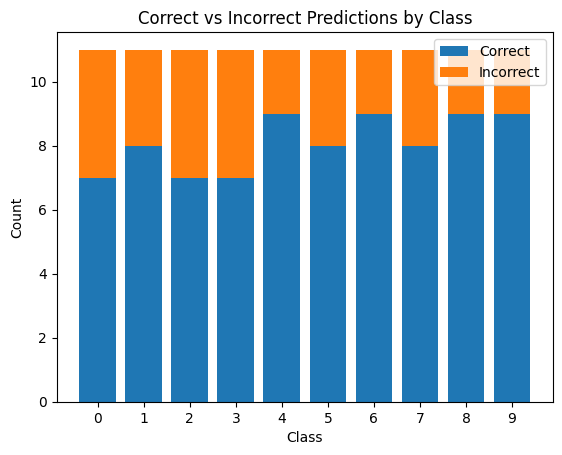

In [ ]:
# Apply preprocessor defense
preprocessor = JpegCompression(clip_values=(0,1),channels_first=True, apply_fit=True, apply_predict=True)
prediction_images1, prediction_labels1 = preprocessor(x_test_adv, prediction_labels)
plot_pedictions(classifier ,prediction_labels1, prediction_images1)  

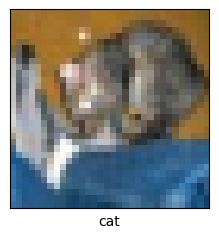

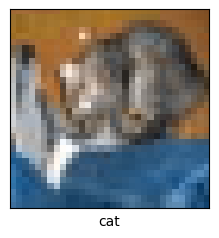

In [ ]:
show_image(x_test_adv[0],[prediction_labels[0]])
show_image(prediction_images1[0],[prediction_labels[0]])

###### Postprocessing Defenses

In [ ]:
from art.defences.postprocessor import GaussianNoise

[3 8 1 9 6 6 1 6 3 1 3 9 5 7 9 8 5 7 8 6 9 0 4 9 4 2 4 0 1 6 6 5 4 5 9 2 4
 9 9 5 4 6 5 6 0 9 6 8 7 2 9 8 5 5 8 8 7 3 5 3 7 5 6 9 2 1 2 3 7 3 8 8 0 2
 9 3 3 8 0 9 1 7 7 7 2 3 9 0 3 4 2 0 7 4 5 3 1 1 4 0 6 1 0 6 1 2 3 4 1 5]
Accuracy: 0.7363636363636363


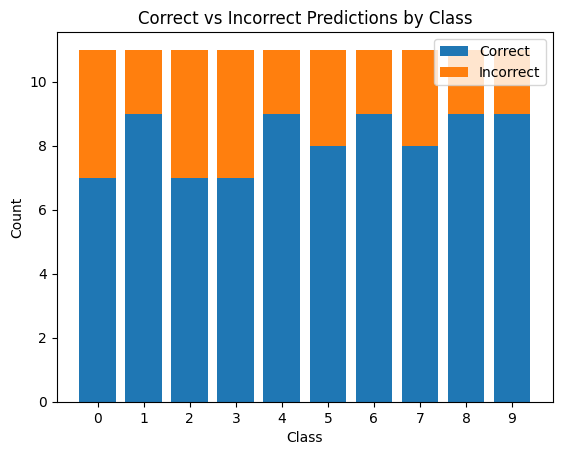

In [ ]:
# Define the postprocessing defense
noise = GaussianNoise(scale=0.2)
# Apply the defense to the classifier
classifier.postprocessing_defences = [noise]
plot_pedictions(classifier,prediction_labels1, prediction_images1)

######  Trainer Defenses

In [ ]:
from art.defences.trainer import AdversarialTrainerMadryPGD

In [ ]:
x_train_preprocessed, y_train_preprocessed = preprocessor(x_test,y_test)

In [ ]:
#Load the victim model
classifier_url = "https://tfhub.dev/deepmind/ganeval-cifar10-convnet/1"
IMAGE_SHAPE = (32, 32) 
classifier1 = KerasClassifier(model=tf.keras.Sequential([hub.KerasLayer(classifier_url, input_shape=IMAGE_SHAPE+(3,))]), clip_values=(0, 1))

In [ ]:
# Create an adversarial trainer with Madry's PGD
classifier1.model.compile(optimizer="adam", loss="sparse_categorical_crossentropy")

trainer = AdversarialTrainerMadryPGD(classifier1, nb_epochs=1, eps=0.1, eps_step=1, batch_size=16)

# Fit the adversarial trainer on preprocessed data
trainer.fit(x_train_preprocessed, y_train)

Precompute adv samples:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial training epochs:   0%|          | 0/1 [00:00<?, ?it/s]

[3 8 1 9 6 6 1 6 3 1 3 9 5 7 9 8 5 7 8 6 9 0 4 9 4 2 4 0 1 6 6 5 4 5 9 2 4
 9 9 5 4 6 5 6 0 9 6 8 7 2 9 8 5 5 8 8 7 3 5 3 7 5 6 9 2 1 2 3 7 3 8 8 0 2
 9 3 3 8 0 9 1 7 7 7 2 3 9 0 3 4 2 0 7 4 5 3 1 1 4 0 6 1 0 6 1 2 3 4 1 5]
Accuracy: 0.7454545454545455


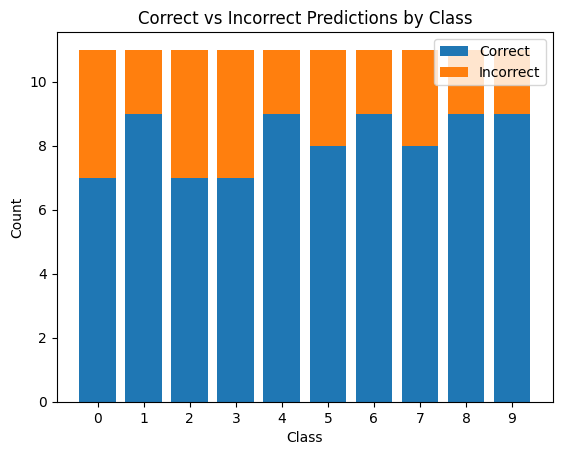

In [ ]:
plot_pedictions(classifier1,prediction_labels1, prediction_images1)

######Transformer Defenses

In [ ]:
from art.defences.transformer.evasion import DefensiveDistillation

In [ ]:
# Define the defense
defense = DefensiveDistillation(classifier=classifier1, batch_size=128, nb_epochs=20)

# Fit the defense
defense.fit(x_train, y_train)

# Get the transformed classifier
transformed_classifier = defense.classifier

[3 8 1 9 6 6 1 6 3 1 3 9 5 7 9 8 5 7 8 6 9 0 4 9 4 2 4 0 1 6 6 5 4 5 9 2 4
 9 9 5 4 6 5 6 0 9 6 8 7 2 9 8 5 5 8 8 7 3 5 3 7 5 6 9 2 1 2 3 7 3 8 8 0 2
 9 3 3 8 0 9 1 7 7 7 2 3 9 0 3 4 2 0 7 4 5 3 1 1 4 0 6 1 0 6 1 2 3 4 1 5]
Accuracy: 0.7454545454545455


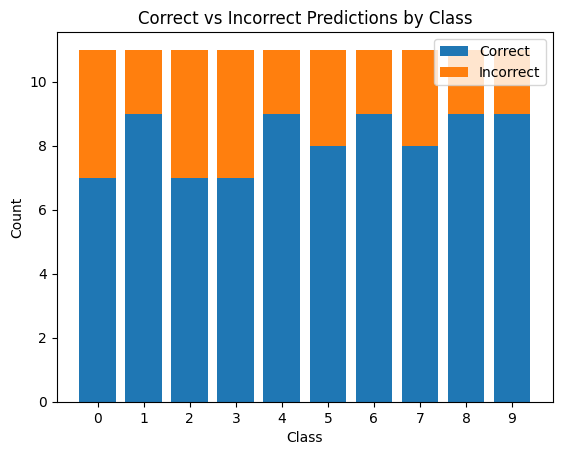

In [ ]:
plot_pedictions(transformed_classifier,prediction_labels1, prediction_images1)

###### Detector defenses: 

In [ ]:
# Create an adversarial trainer with Madry's PGD
classifier1.model.compile(optimizer="adam", loss="sparse_categorical_crossentropy")

trainer = AdversarialTrainerMadryPGD(classifier1, nb_epochs=6, eps=0.2, eps_step=0.1, batch_size=128)

# Fit the adversarial trainer on preprocessed data
trainer.fit(x_test_adv, prediction_labels)

Precompute adv samples:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial training epochs:   0%|          | 0/6 [00:00<?, ?it/s]

[5 8 1 9 2 3 5 4 5 9 3 7 3 1 1 6 7 2 7 2 7 3 0 2 3 5 5 2 1 2 2 2 8 4 0 8 7
 9 1 1 2 2 7 3 8 0 6 0 5 2 6 6 5 5 8 9 5 3 5 3 4 5 0 9 6 8 0 5 4 8 0 0 9 5
 0 5 5 7 0 9 7 8 7 7 1 3 8 1 2 7 2 2 5 4 3 2 9 1 6 2 6 8 0 6 3 0 3 6 0 7]
Accuracy: 0.045454545454545456


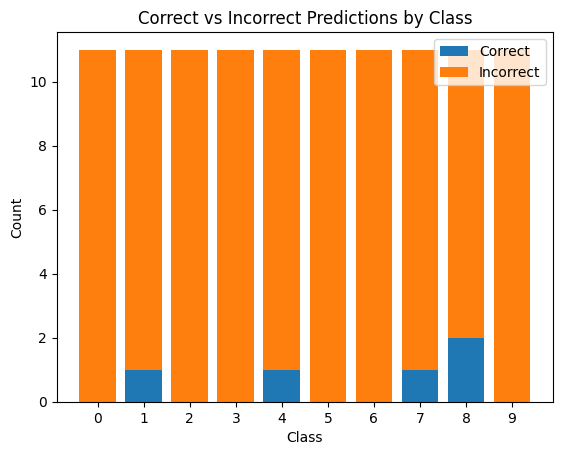

In [ ]:
plot_pedictions(classifier1,prediction_labels, x_test_adv)

#### CarliniLInfMethod Targeted

In [ ]:
carlini_linf = CarliniLInfMethod(classifier=classifier,batch_size=50,targeted=True)

In [ ]:
carlini_adv = carlini_linf.generate(prediction_images, prediction_labels)

C&W L_inf:   0%|          | 0/110 [00:00<?, ?it/s]

##### plots on Orginal model using adversial dataset generated using  CarliniInfMethod targeted

[3 8 8 0 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 4 9 5 2 4 0 9 6 6 5 4 5 9 2 4
 9 9 5 4 6 5 6 0 9 3 9 7 6 9 8 5 3 8 8 7 7 5 3 7 5 6 3 2 1 2 3 7 2 8 8 0 2
 9 3 3 8 8 9 1 7 2 5 2 7 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 4 6 1 2 3 4 1 5]
Accuracy: 0.9272727272727272


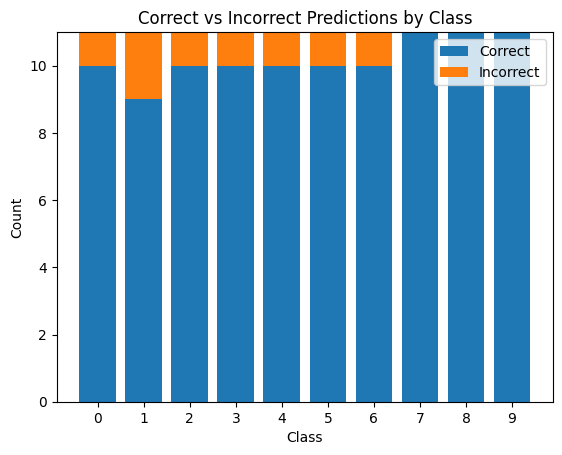

In [ ]:
plot_pedictions(classifier,prediction_labels,carlini_adv)

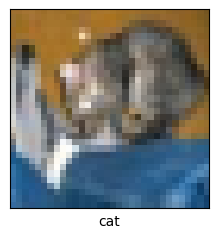

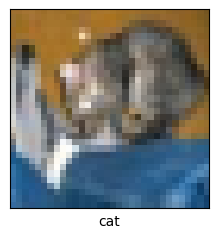

In [ ]:
show_image(prediction_images[0],[prediction_labels[0]])
show_image(carlini_adv[0],[prediction_labels[0]])

##### Defenses

In [ ]:
x_test_adv = carlini_adv

###### Preprocessing Defenses

In [ ]:
from art.defences.preprocessor import JpegCompression

[3 8 8 0 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 4 9 4 2 4 0 9 6 6 5 4 5 9 2 4
 9 9 5 4 6 5 6 0 9 3 8 7 2 9 8 5 3 8 8 7 7 5 3 7 3 6 3 2 1 2 3 7 2 8 8 0 2
 9 3 3 8 8 9 1 7 2 5 2 7 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 4 6 1 2 3 4 1 5]
Accuracy: 0.9


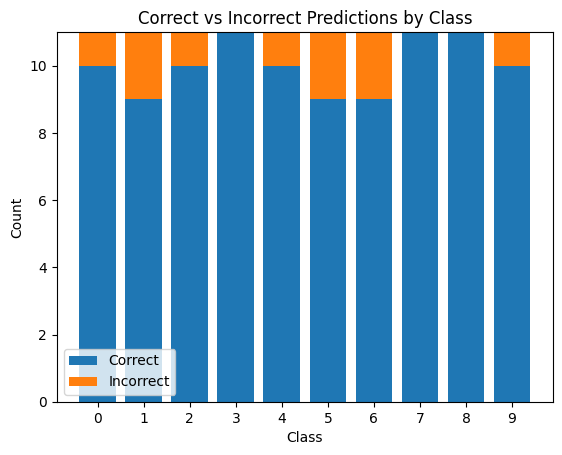

In [ ]:
# Apply preprocessor defense
preprocessor = JpegCompression(clip_values=(0,1),channels_first=True, apply_fit=True, apply_predict=True)
prediction_images1, prediction_labels1 = preprocessor(x_test_adv, prediction_labels)
plot_pedictions(classifier ,prediction_labels1, prediction_images1)  

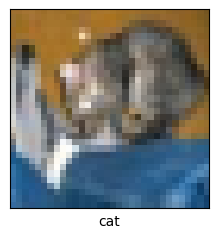

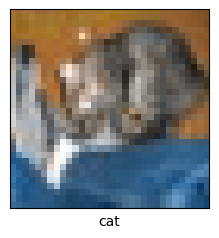

In [ ]:
show_image(x_test_adv[0],[prediction_labels[0]])
show_image(prediction_images1[0],[prediction_labels[0]])

###### Postprocessing Defenses

In [ ]:
from art.defences.postprocessor import GaussianNoise

[3 8 8 0 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 4 9 4 2 4 0 9 6 6 5 4 5 9 2 4
 9 9 5 4 6 5 6 0 9 3 8 7 2 9 8 5 3 8 8 7 7 5 3 7 3 6 9 2 1 2 3 7 2 8 8 0 2
 9 3 3 8 8 9 1 7 2 5 2 7 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 4 6 1 2 3 4 1 5]
Accuracy: 0.9


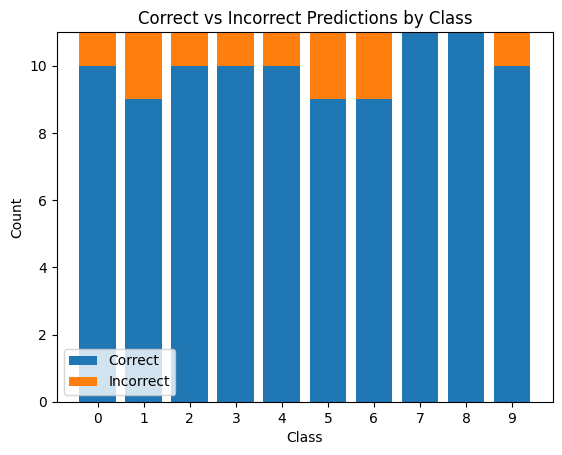

In [ ]:
# Define the postprocessing defense
noise = GaussianNoise(scale=0.2)
# Apply the defense to the classifier
classifier.postprocessing_defences = [noise]
plot_pedictions(classifier,prediction_labels1, prediction_images1)

######  Trainer Defenses

In [ ]:
from art.defences.trainer import AdversarialTrainerMadryPGD

In [ ]:
x_train_preprocessed, y_train_preprocessed = preprocessor(x_test,y_test)

In [ ]:
#Load the victim model
classifier_url = "https://tfhub.dev/deepmind/ganeval-cifar10-convnet/1"
IMAGE_SHAPE = (32, 32) 
classifier1 = KerasClassifier(model=tf.keras.Sequential([hub.KerasLayer(classifier_url, input_shape=IMAGE_SHAPE+(3,))]), clip_values=(0, 1))

In [ ]:
# Create an adversarial trainer with Madry's PGD
classifier1.model.compile(optimizer="adam", loss="sparse_categorical_crossentropy")

trainer = AdversarialTrainerMadryPGD(classifier1, nb_epochs=1, eps=0.1, eps_step=1, batch_size=16)

# Fit the adversarial trainer on preprocessed data
trainer.fit(x_train_preprocessed, y_train)

Precompute adv samples:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial training epochs:   0%|          | 0/1 [00:00<?, ?it/s]

[3 8 8 0 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 4 9 4 2 4 0 9 6 6 5 4 5 9 2 4
 9 9 5 4 6 5 6 0 9 3 8 7 2 9 8 5 3 8 8 7 7 5 3 7 3 6 9 2 1 2 3 7 2 8 8 0 2
 9 3 3 8 8 9 1 7 2 5 2 7 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 4 6 1 2 3 4 1 5]
Accuracy: 0.9


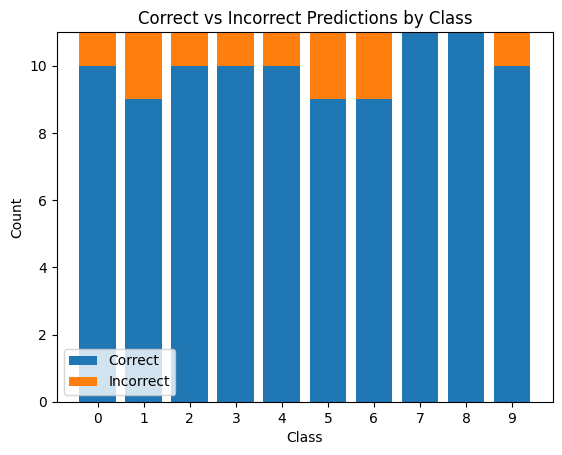

In [ ]:
plot_pedictions(classifier1,prediction_labels1, prediction_images1)

######Transformer Defenses

In [ ]:
from art.defences.transformer.evasion import DefensiveDistillation

In [ ]:
# Define the defense
defense = DefensiveDistillation(classifier=classifier1, batch_size=128, nb_epochs=20)

# Fit the defense
defense.fit(x_train, y_train)

# Get the transformed classifier
transformed_classifier = defense.classifier

[3 8 8 0 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 4 9 4 2 4 0 9 6 6 5 4 5 9 2 4
 9 9 5 4 6 5 6 0 9 3 8 7 2 9 8 5 3 8 8 7 7 5 3 7 3 6 9 2 1 2 3 7 2 8 8 0 2
 9 3 3 8 8 9 1 7 2 5 2 7 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 4 6 1 2 3 4 1 5]
Accuracy: 0.9


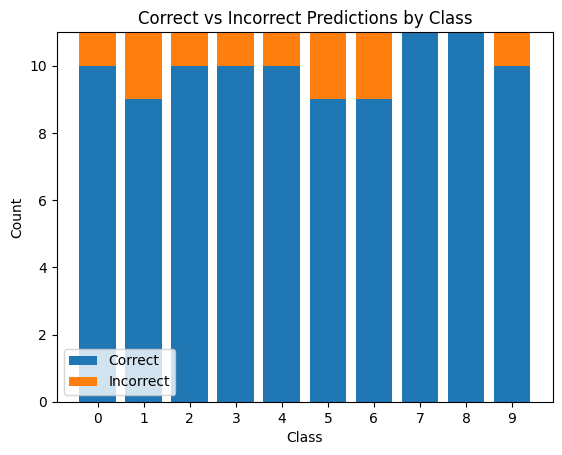

In [ ]:
plot_pedictions(transformed_classifier,prediction_labels1, prediction_images1)

###### Detector defenses: 

In [ ]:
# Create an adversarial trainer with Madry's PGD
classifier1.model.compile(optimizer="adam", loss="sparse_categorical_crossentropy")

trainer = AdversarialTrainerMadryPGD(classifier1, nb_epochs=6, eps=0.2, eps_step=0.1, batch_size=128)

# Fit the adversarial trainer on preprocessed data
trainer.fit(x_test_adv, prediction_labels)

Precompute adv samples:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial training epochs:   0%|          | 0/6 [00:00<?, ?it/s]

[3 8 8 0 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 4 9 5 2 4 0 9 6 6 5 4 5 9 2 4
 9 9 5 4 6 5 6 0 9 3 9 7 6 9 8 5 3 8 8 7 7 5 3 7 5 6 3 2 1 2 3 7 2 8 8 0 2
 9 3 3 8 8 9 1 7 2 5 2 7 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 4 6 1 2 3 4 1 5]
Accuracy: 0.9272727272727272


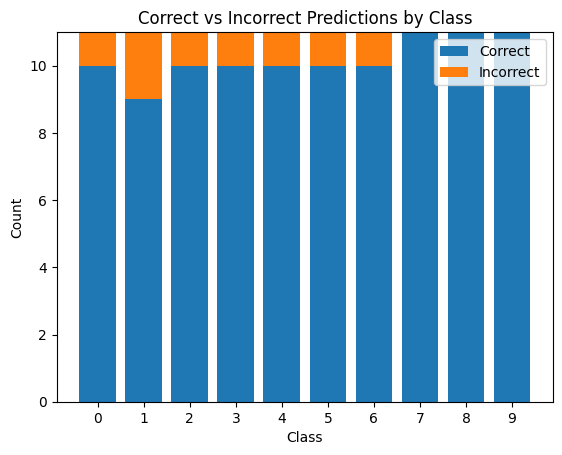

In [ ]:
plot_pedictions(classifier1,prediction_labels, x_test_adv)

###6 Projected Gradient Descent WB


In [ ]:
from art.attacks.evasion import ProjectedGradientDescent

#### ProjectedGradientDescent UnTargeted

In [ ]:
pgd = ProjectedGradientDescent(estimator=classifier,batch_size=32)

In [ ]:
pgd_adv = pgd.generate(prediction_images, prediction_labels)

PGD - Random Initializations:   0%|          | 0/1 [00:00<?, ?it/s]

PGD - Iterations:   0%|          | 0/100 [00:00<?, ?it/s]

PGD - Random Initializations:   0%|          | 0/1 [00:00<?, ?it/s]

PGD - Iterations:   0%|          | 0/100 [00:00<?, ?it/s]

PGD - Random Initializations:   0%|          | 0/1 [00:00<?, ?it/s]

PGD - Iterations:   0%|          | 0/100 [00:00<?, ?it/s]

PGD - Random Initializations:   0%|          | 0/1 [00:00<?, ?it/s]

PGD - Iterations:   0%|          | 0/100 [00:00<?, ?it/s]

##### plots on Orginal model using adversial dataset generated using  ProjectedGradientDescent targeted

[6 8 8 2 2 6 3 9 2 1 2 9 9 7 2 6 1 9 2 6 3 0 4 9 4 2 6 2 2 6 6 4 2 9 6 2 9
 7 0 5 4 1 5 6 0 6 6 9 5 6 6 8 6 6 8 0 6 1 6 3 4 5 2 4 4 3 1 9 2 2 6 0 6 4
 0 2 3 9 8 9 5 4 0 5 1 7 9 0 6 4 4 3 7 9 4 2 2 1 2 0 2 1 4 6 4 2 2 4 2 2]
Accuracy: 0.34545454545454546


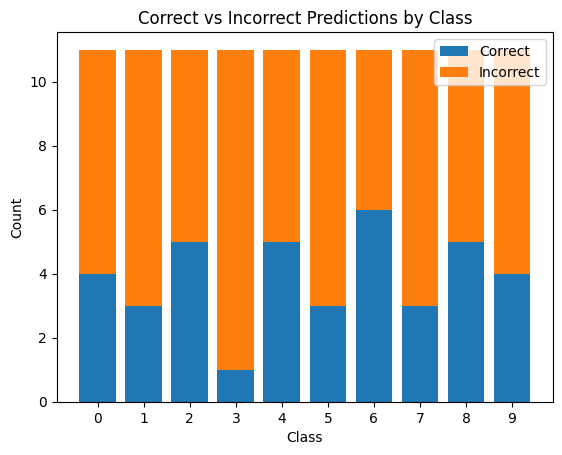

In [ ]:
plot_pedictions(classifier,prediction_labels,pgd_adv)

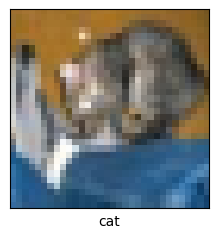

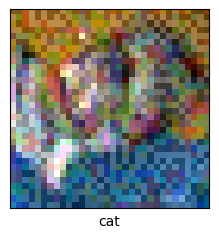

In [ ]:
show_image(prediction_images[0],[prediction_labels[0]])
show_image(pgd_adv[0],[prediction_labels[0]])

##### Defenses

In [ ]:
x_test_adv = pgd_adv

###### Preprocessing Defenses

In [ ]:
from art.defences.preprocessor import JpegCompression

[2 8 8 2 2 4 3 9 2 1 2 9 9 7 2 6 2 9 2 6 3 0 4 9 4 2 6 2 2 6 6 4 2 9 6 2 9
 7 0 5 4 1 5 2 0 4 3 8 2 2 1 8 2 4 8 0 6 1 2 3 4 3 2 4 4 3 1 9 2 2 4 2 6 4
 0 2 3 9 8 9 5 4 3 5 1 7 9 0 4 4 4 2 7 9 4 3 2 1 2 0 2 1 4 6 4 2 2 4 2 2]
Accuracy: 0.35454545454545455


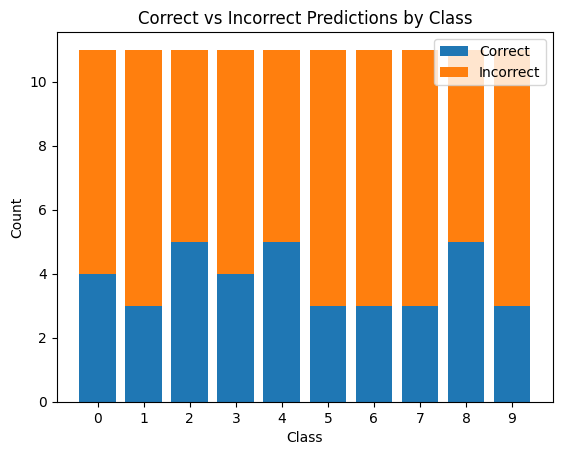

In [ ]:
# Apply preprocessor defense
preprocessor = JpegCompression(clip_values=(0,1),channels_first=True, apply_fit=True, apply_predict=True)
prediction_images1, prediction_labels1 = preprocessor(x_test_adv, prediction_labels)
plot_pedictions(classifier ,prediction_labels1, prediction_images1)  

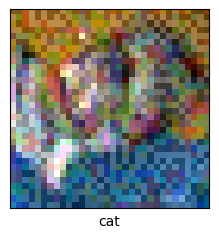

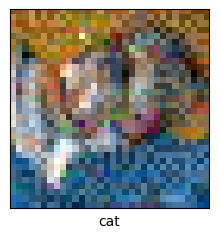

In [ ]:
show_image(x_test_adv[0],[prediction_labels[0]])
show_image(prediction_images1[0],[prediction_labels[0]])

###### Postprocessing Defenses

In [ ]:
from art.defences.postprocessor import GaussianNoise

[2 8 8 2 2 4 3 9 2 1 2 9 9 7 2 6 2 9 2 6 3 0 4 9 4 2 6 2 2 6 6 4 2 9 6 2 9
 7 0 5 4 1 5 2 0 4 3 8 2 2 1 8 2 6 8 0 2 1 2 3 5 3 2 4 4 3 1 9 2 2 4 2 6 4
 0 2 3 9 8 9 5 4 0 5 1 7 9 0 4 4 4 2 7 9 4 3 2 1 2 0 2 1 4 6 4 2 2 4 2 2]
Accuracy: 0.36363636363636365


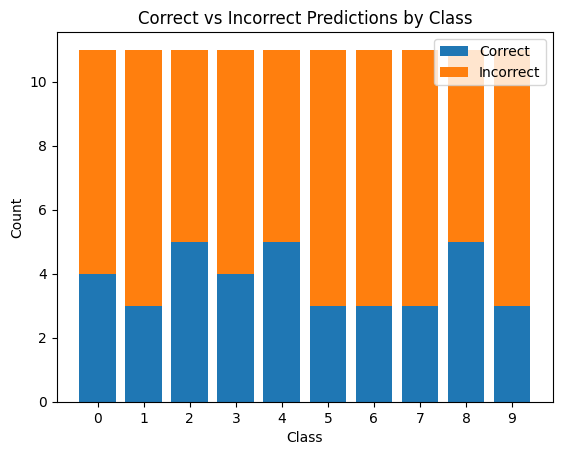

In [ ]:
# Define the postprocessing defense
noise = GaussianNoise(scale=0.2)
# Apply the defense to the classifier
classifier.postprocessing_defences = [noise]
plot_pedictions(classifier,prediction_labels1, prediction_images1)

######  Trainer Defenses

In [ ]:
from art.defences.trainer import AdversarialTrainerMadryPGD

In [ ]:
x_train_preprocessed, y_train_preprocessed = preprocessor(x_test,y_test)

In [ ]:
#Load the victim model
classifier_url = "https://tfhub.dev/deepmind/ganeval-cifar10-convnet/1"
IMAGE_SHAPE = (32, 32) 
classifier1 = KerasClassifier(model=tf.keras.Sequential([hub.KerasLayer(classifier_url, input_shape=IMAGE_SHAPE+(3,))]), clip_values=(0, 1))

In [ ]:
# Create an adversarial trainer with Madry's PGD
classifier1.model.compile(optimizer="adam", loss="sparse_categorical_crossentropy")

trainer = AdversarialTrainerMadryPGD(classifier1, nb_epochs=1, eps=0.1, eps_step=1, batch_size=16)

# Fit the adversarial trainer on preprocessed data
trainer.fit(x_train_preprocessed, y_train)

Precompute adv samples:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial training epochs:   0%|          | 0/1 [00:00<?, ?it/s]

[2 8 8 2 2 4 3 9 2 1 2 9 9 7 2 6 2 9 2 6 3 0 4 9 4 2 6 2 2 6 6 4 2 9 6 2 9
 7 0 5 4 1 5 2 0 4 3 8 2 2 1 8 2 4 8 0 6 1 2 3 5 3 2 4 4 3 1 9 2 2 4 2 6 4
 0 2 3 9 8 9 5 4 9 5 1 7 9 0 4 4 4 2 7 9 4 3 2 1 2 0 2 1 4 6 4 2 2 4 2 2]
Accuracy: 0.34545454545454546


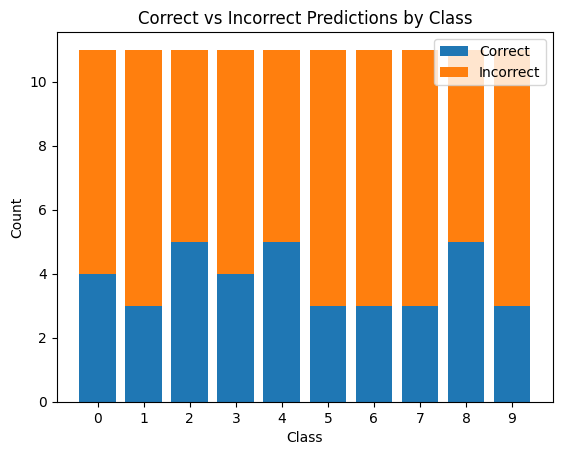

In [ ]:
plot_pedictions(classifier1,prediction_labels1, prediction_images1)

######Transformer Defenses

In [ ]:
from art.defences.transformer.evasion import DefensiveDistillation

In [ ]:
# Define the defense
defense = DefensiveDistillation(classifier=classifier1, batch_size=128, nb_epochs=20)

# Fit the defense
defense.fit(x_train, y_train)

# Get the transformed classifier
transformed_classifier = defense.classifier

[2 8 8 2 2 4 3 9 2 1 2 9 9 7 2 6 2 9 2 6 3 0 4 9 4 2 6 2 2 6 6 4 2 9 6 2 9
 7 0 5 4 1 5 2 0 4 3 8 2 2 1 8 2 4 8 0 6 1 2 3 5 3 2 4 4 3 1 9 2 2 4 2 6 4
 0 2 3 9 8 9 5 4 9 5 1 7 9 0 4 4 4 2 7 9 4 3 2 1 2 0 2 1 4 6 4 2 2 4 2 2]
Accuracy: 0.34545454545454546


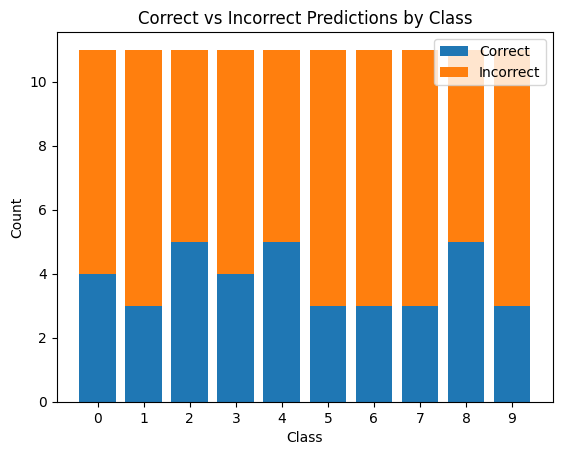

In [ ]:
plot_pedictions(transformed_classifier,prediction_labels1, prediction_images1)

###### Detector defenses: 

In [ ]:
# Create an adversarial trainer with Madry's PGD
classifier1.model.compile(optimizer="adam", loss="sparse_categorical_crossentropy")

trainer = AdversarialTrainerMadryPGD(classifier1, nb_epochs=6, eps=0.2, eps_step=0.1, batch_size=128)

# Fit the adversarial trainer on preprocessed data
trainer.fit(x_test_adv, prediction_labels)

Precompute adv samples:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial training epochs:   0%|          | 0/6 [00:00<?, ?it/s]

[6 8 8 2 2 6 3 9 2 1 2 9 9 7 2 6 1 9 2 6 3 0 4 9 4 2 6 2 6 6 6 4 2 9 6 2 9
 7 0 5 4 1 5 6 0 6 6 9 5 6 6 8 6 6 8 0 6 1 6 3 4 5 2 4 4 3 1 9 2 2 6 0 6 4
 0 2 3 9 8 9 5 4 0 5 1 7 9 0 6 4 4 3 7 9 4 2 2 1 2 0 2 1 4 6 4 2 2 4 2 2]
Accuracy: 0.35454545454545455


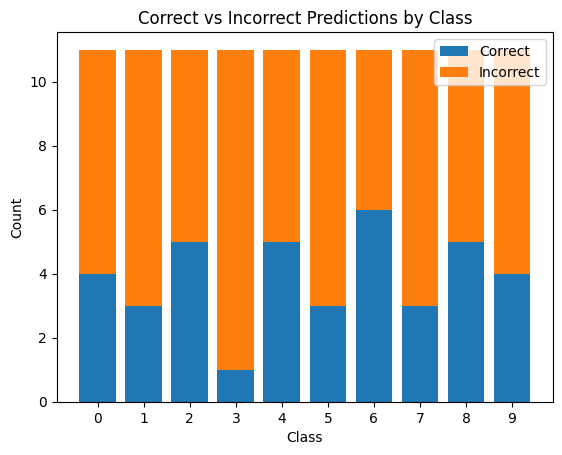

In [ ]:
plot_pedictions(classifier1,prediction_labels, x_test_adv)

#### ProjectedGradientDescent Targeted

In [ ]:
pgd = ProjectedGradientDescent(estimator=classifier,batch_size=32,targeted=True)

In [ ]:
pgd_adv = pgd.generate(prediction_images, prediction_labels)

PGD - Random Initializations:   0%|          | 0/1 [00:00<?, ?it/s]

PGD - Iterations:   0%|          | 0/100 [00:00<?, ?it/s]

PGD - Random Initializations:   0%|          | 0/1 [00:00<?, ?it/s]

PGD - Iterations:   0%|          | 0/100 [00:00<?, ?it/s]

PGD - Random Initializations:   0%|          | 0/1 [00:00<?, ?it/s]

PGD - Iterations:   0%|          | 0/100 [00:00<?, ?it/s]

PGD - Random Initializations:   0%|          | 0/1 [00:00<?, ?it/s]

PGD - Iterations:   0%|          | 0/100 [00:00<?, ?it/s]

##### plots on Orginal model using adversial dataset generated using  ProjectedGradientDescent targeted

[2 8 8 0 6 6 9 6 3 1 0 6 2 7 9 2 2 2 6 6 6 0 4 9 2 2 2 2 4 2 6 6 4 6 6 2 2
 1 6 5 4 2 5 1 0 0 0 9 2 6 1 8 6 2 8 2 2 6 6 3 6 5 6 6 6 2 2 3 0 2 6 2 2 6
 9 2 3 8 8 9 1 0 3 5 2 7 9 0 2 4 2 0 7 4 4 2 1 6 4 0 0 1 4 6 2 2 6 4 6 0]
Accuracy: 0.4818181818181818


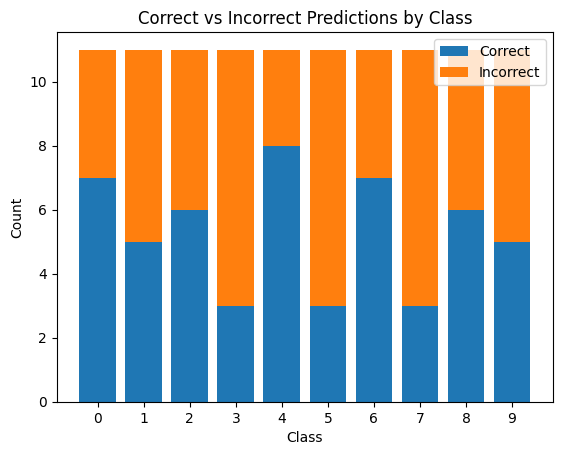

In [ ]:
plot_pedictions(classifier,prediction_labels,pgd_adv)

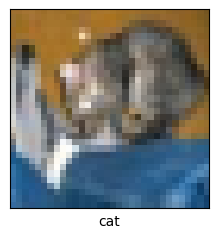

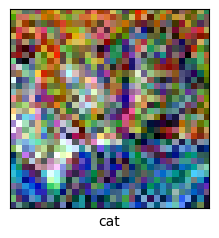

In [ ]:
show_image(prediction_images[0],[prediction_labels[0]])
show_image(pgd_adv[0],[prediction_labels[0]])

##### Defenses

In [ ]:
x_test_adv = pgd_adv

###### Preprocessing Defenses

In [ ]:
from art.defences.preprocessor import JpegCompression

[2 8 8 2 6 4 9 0 3 1 0 6 2 7 2 2 2 2 6 6 6 0 4 9 2 2 4 2 2 2 6 4 4 2 6 2 2
 1 4 5 4 2 5 0 0 0 2 8 4 6 1 8 6 2 8 2 2 2 4 3 6 3 6 6 2 2 2 3 2 2 8 2 2 2
 0 2 3 8 8 9 1 9 2 5 2 7 9 0 2 4 4 0 7 2 4 2 1 1 4 0 0 1 4 6 2 2 6 4 2 2]
Accuracy: 0.4818181818181818


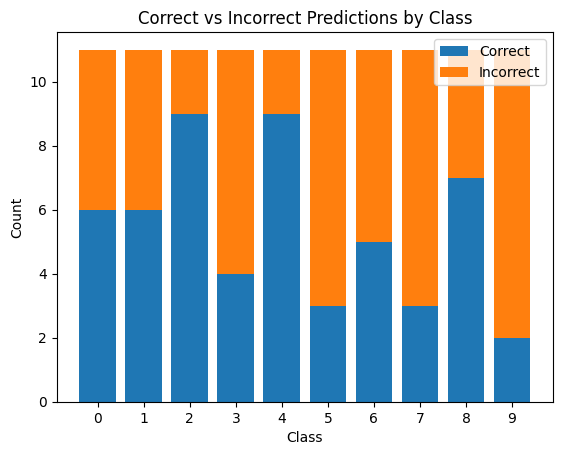

In [ ]:
# Apply preprocessor defense
preprocessor = JpegCompression(clip_values=(0,1),channels_first=True, apply_fit=True, apply_predict=True)
prediction_images1, prediction_labels1 = preprocessor(x_test_adv, prediction_labels)
plot_pedictions(classifier ,prediction_labels1, prediction_images1)  

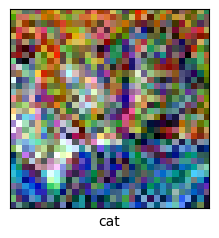

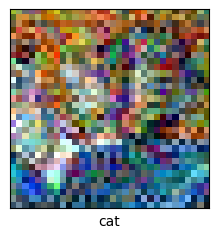

In [ ]:
show_image(x_test_adv[0],[prediction_labels[0]])
show_image(prediction_images1[0],[prediction_labels[0]])

###### Postprocessing Defenses

In [ ]:
from art.defences.postprocessor import GaussianNoise

[2 8 8 9 6 4 9 6 3 1 0 6 2 7 2 2 2 2 6 6 6 0 4 9 2 2 4 2 2 2 6 4 4 2 6 2 2
 1 4 5 4 2 5 0 0 0 0 8 4 6 1 8 6 2 8 2 2 2 4 3 6 3 6 6 2 2 2 2 2 2 8 2 2 2
 0 2 3 8 8 9 1 9 2 5 2 7 9 0 2 4 4 0 7 2 2 2 1 1 4 0 2 1 4 6 2 2 6 4 2 2]
Accuracy: 0.509090909090909


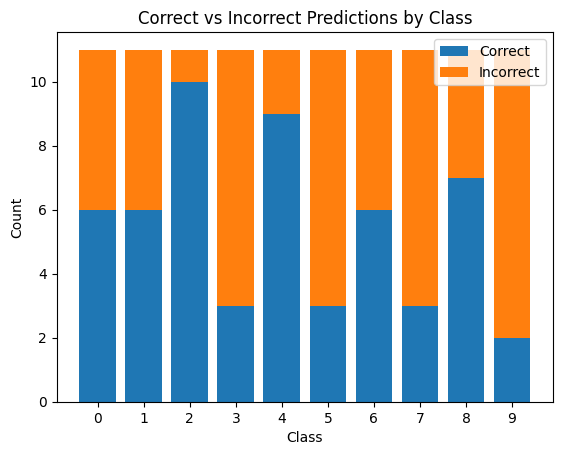

In [ ]:
# Define the postprocessing defense
noise = GaussianNoise(scale=0.2)
# Apply the defense to the classifier
classifier.postprocessing_defences = [noise]
plot_pedictions(classifier,prediction_labels1, prediction_images1)

######  Trainer Defenses

In [ ]:
from art.defences.trainer import AdversarialTrainerMadryPGD

In [ ]:
x_train_preprocessed, y_train_preprocessed = preprocessor(x_test,y_test)

In [ ]:
#Load the victim model
classifier_url = "https://tfhub.dev/deepmind/ganeval-cifar10-convnet/1"
IMAGE_SHAPE = (32, 32) 
classifier1 = KerasClassifier(model=tf.keras.Sequential([hub.KerasLayer(classifier_url, input_shape=IMAGE_SHAPE+(3,))]), clip_values=(0, 1))

In [ ]:
# Create an adversarial trainer with Madry's PGD
classifier1.model.compile(optimizer="adam", loss="sparse_categorical_crossentropy")

trainer = AdversarialTrainerMadryPGD(classifier1, nb_epochs=1, eps=0.1, eps_step=1, batch_size=16)

# Fit the adversarial trainer on preprocessed data
trainer.fit(x_train_preprocessed, y_train)

Precompute adv samples:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial training epochs:   0%|          | 0/1 [00:00<?, ?it/s]

[2 8 8 2 6 4 9 0 3 1 0 6 2 7 2 2 2 2 6 6 6 0 4 9 2 2 4 2 2 2 6 4 4 2 6 2 2
 1 4 5 4 2 5 0 0 0 0 8 4 6 1 8 6 2 8 2 2 2 4 3 6 3 6 6 2 2 2 2 2 2 8 2 2 2
 2 2 3 8 8 9 1 9 2 5 2 7 9 0 2 4 4 0 7 2 4 2 1 1 4 0 2 1 4 6 2 2 6 4 2 2]
Accuracy: 0.4909090909090909


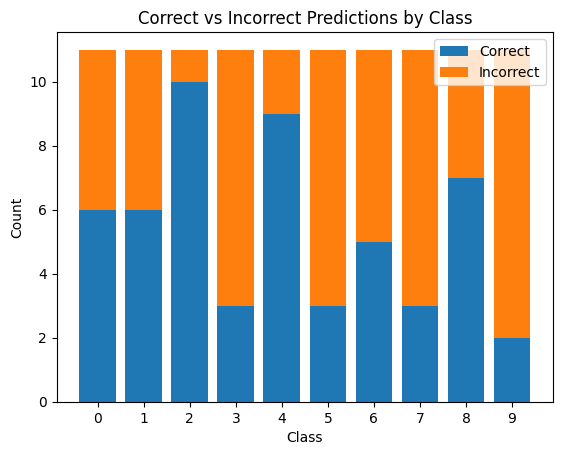

In [ ]:
plot_pedictions(classifier1,prediction_labels1, prediction_images1)

######Transformer Defenses

In [ ]:
from art.defences.transformer.evasion import DefensiveDistillation

In [ ]:
# Define the defense
defense = DefensiveDistillation(classifier=classifier1, batch_size=128, nb_epochs=20)

# Fit the defense
defense.fit(x_train, y_train)

# Get the transformed classifier
transformed_classifier = defense.classifier

[2 8 8 2 6 4 9 0 3 1 0 6 2 7 2 2 2 2 6 6 6 0 4 9 2 2 4 2 2 2 6 4 4 2 6 2 2
 1 4 5 4 2 5 0 0 0 0 8 4 6 1 8 6 2 8 2 2 2 4 3 6 3 6 6 2 2 2 2 2 2 8 2 2 2
 2 2 3 8 8 9 1 9 2 5 2 7 9 0 2 4 4 0 7 2 4 2 1 1 4 0 2 1 4 6 2 2 6 4 2 2]
Accuracy: 0.4909090909090909


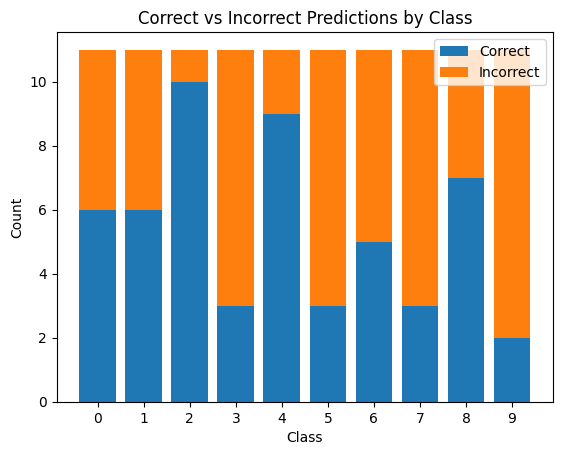

In [ ]:
plot_pedictions(transformed_classifier,prediction_labels1, prediction_images1)

###### Detector defenses: 

In [ ]:
# Create an adversarial trainer with Madry's PGD
classifier1.model.compile(optimizer="adam", loss="sparse_categorical_crossentropy")

trainer = AdversarialTrainerMadryPGD(classifier1, nb_epochs=6, eps=0.2, eps_step=0.1, batch_size=128)

# Fit the adversarial trainer on preprocessed data
trainer.fit(x_test_adv, prediction_labels)

Precompute adv samples:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial training epochs:   0%|          | 0/6 [00:00<?, ?it/s]

[2 8 8 0 6 6 9 6 3 1 0 6 2 7 9 1 2 2 6 6 6 0 4 9 2 2 2 2 4 2 6 6 4 2 6 2 2
 1 6 5 4 2 5 1 0 0 0 9 2 6 1 8 6 2 8 2 2 6 6 3 6 5 6 6 6 2 2 3 0 2 6 2 2 6
 9 2 3 8 8 9 1 0 3 5 2 7 9 0 2 4 2 0 7 4 4 2 1 6 4 0 1 1 4 6 2 2 6 4 6 0]
Accuracy: 0.4818181818181818


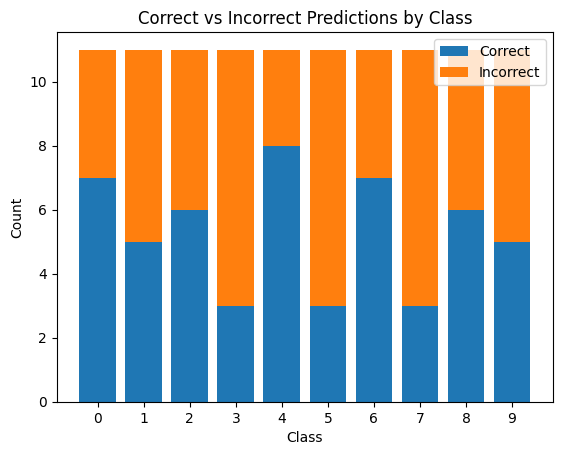

In [ ]:
plot_pedictions(classifier1,prediction_labels, x_test_adv)

###7 Universal Pertubation Attack WB


In [ ]:
from art.attacks.evasion import UniversalPerturbation

#### UniversalPerturbation 

In [ ]:
uni = UniversalPerturbation(classifier=classifier, max_iter=1)

In [ ]:
uni_adv = uni.generate(prediction_images, prediction_labels)

Universal perturbation:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

DeepFool:   0%|          | 0/1 [00:00<?, ?it/s]

##### plots on Orginal model using adversial dataset generated using  UniversalPerturbation Untargeted

[3 8 8 6 6 6 9 6 6 6 0 9 6 7 9 8 5 2 8 6 9 3 6 9 4 2 5 6 2 6 6 5 4 2 9 2 4
 9 9 5 4 6 2 6 0 9 3 6 4 6 9 6 6 3 8 8 7 2 6 6 7 3 6 2 2 4 2 3 7 6 8 8 6 5
 9 3 3 8 6 1 1 3 6 6 6 3 9 0 3 4 3 0 7 4 4 3 1 1 4 0 2 1 6 6 1 2 6 4 1 5]
Accuracy: 0.6636363636363637


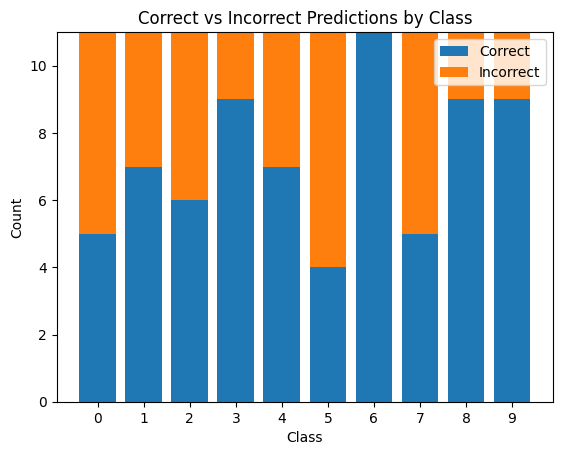

In [ ]:
plot_pedictions(classifier,prediction_labels,uni_adv)

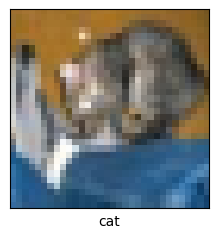

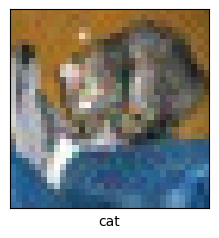

In [ ]:
show_image(prediction_images[0],[prediction_labels[0]])
show_image(uni_adv[0],[prediction_labels[0]])

##### Defenses

In [ ]:
x_test_adv = uni_adv

###### Preprocessing Defenses

In [ ]:
from art.defences.preprocessor import JpegCompression

[3 8 8 2 6 6 1 6 3 1 8 9 3 7 9 8 5 3 8 6 1 3 2 9 4 3 3 0 9 6 6 2 4 3 9 2 4
 9 9 5 4 6 3 6 0 9 3 6 4 6 9 4 3 3 8 8 7 3 3 3 4 3 6 3 2 1 2 3 2 3 8 8 0 2
 9 3 3 8 8 1 1 7 2 6 2 3 9 0 3 3 3 0 3 4 4 3 1 1 4 0 2 1 0 2 1 2 6 4 1 5]
Accuracy: 0.7


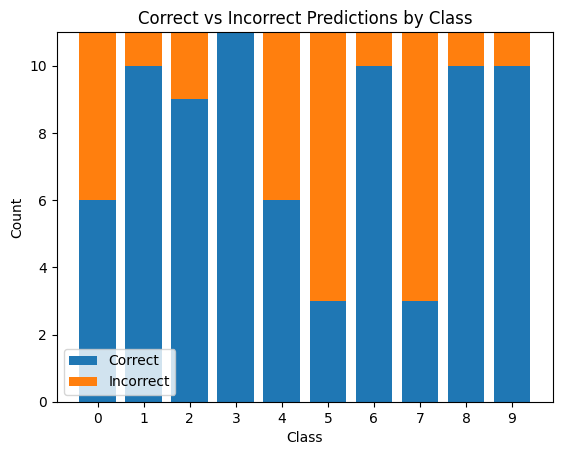

In [ ]:
# Apply preprocessor defense
preprocessor = JpegCompression(clip_values=(0,1),channels_first=True, apply_fit=True, apply_predict=True)
prediction_images1, prediction_labels1 = preprocessor(x_test_adv, prediction_labels)
plot_pedictions(classifier ,prediction_labels1, prediction_images1)  

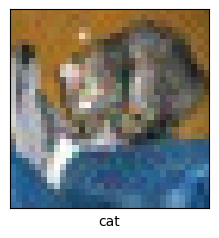

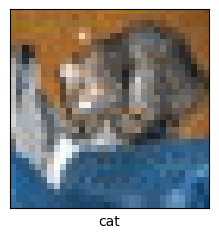

In [ ]:
show_image(x_test_adv[0],[prediction_labels[0]])
show_image(prediction_images1[0],[prediction_labels[0]])

###### Postprocessing Defenses

In [ ]:
from art.defences.postprocessor import GaussianNoise

[3 8 8 2 6 6 1 6 3 1 8 9 6 7 9 8 5 3 8 6 1 3 2 9 4 3 3 0 9 6 6 2 4 3 9 2 4
 9 9 5 4 6 3 6 0 9 3 6 4 6 9 4 3 3 8 8 7 3 3 3 4 3 6 3 2 1 2 3 7 3 8 8 0 2
 9 3 3 8 8 1 1 7 2 6 2 3 9 0 3 3 3 0 3 4 6 3 1 1 4 0 2 1 0 2 1 2 6 4 1 5]
Accuracy: 0.7272727272727273


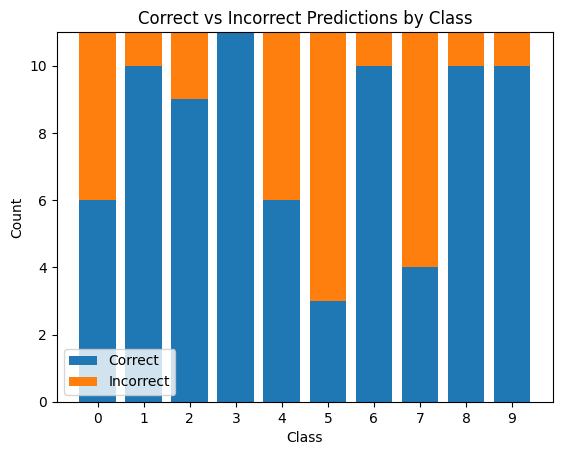

In [ ]:
# Define the postprocessing defense
noise = GaussianNoise(scale=0.2)
# Apply the defense to the classifier
classifier.postprocessing_defences = [noise]
plot_pedictions(classifier,prediction_labels1, prediction_images1)

######  Trainer Defenses

In [ ]:
from art.defences.trainer import AdversarialTrainerMadryPGD

In [ ]:
x_train_preprocessed, y_train_preprocessed = preprocessor(x_test,y_test)

In [ ]:
#Load the victim model
classifier_url = "https://tfhub.dev/deepmind/ganeval-cifar10-convnet/1"
IMAGE_SHAPE = (32, 32) 
classifier1 = KerasClassifier(model=tf.keras.Sequential([hub.KerasLayer(classifier_url, input_shape=IMAGE_SHAPE+(3,))]), clip_values=(0, 1))

In [ ]:
# Create an adversarial trainer with Madry's PGD
classifier1.model.compile(optimizer="adam", loss="sparse_categorical_crossentropy")

trainer = AdversarialTrainerMadryPGD(classifier1, nb_epochs=1, eps=0.1, eps_step=1, batch_size=16)

# Fit the adversarial trainer on preprocessed data
trainer.fit(x_train_preprocessed, y_train)

Precompute adv samples:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial training epochs:   0%|          | 0/1 [00:00<?, ?it/s]

[3 8 8 2 6 6 1 6 3 1 8 9 6 7 9 8 5 3 8 6 1 3 2 9 4 3 3 0 9 6 6 2 4 3 9 2 4
 9 9 5 4 6 3 6 0 9 3 6 4 6 9 4 3 3 8 8 7 3 3 3 4 3 6 3 2 1 2 3 7 3 8 8 0 2
 9 3 3 8 8 1 1 7 2 6 2 3 9 0 3 3 3 0 3 4 4 3 1 1 4 0 2 1 0 2 1 2 6 4 1 5]
Accuracy: 0.7181818181818181


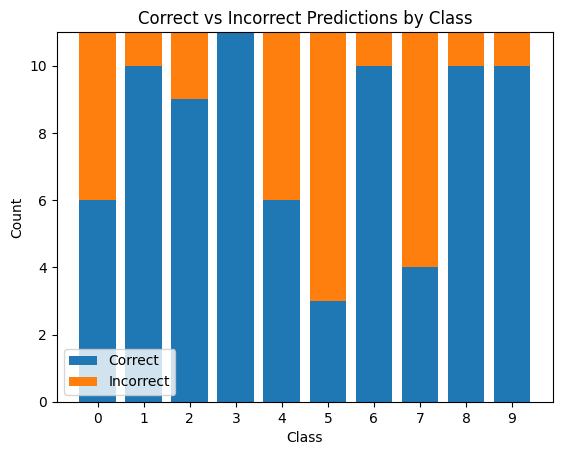

In [ ]:
plot_pedictions(classifier1,prediction_labels1, prediction_images1)

######Transformer Defenses

In [ ]:
from art.defences.transformer.evasion import DefensiveDistillation

In [ ]:
# Define the defense
defense = DefensiveDistillation(classifier=classifier1, batch_size=128, nb_epochs=20)

# Fit the defense
defense.fit(x_train, y_train)

# Get the transformed classifier
transformed_classifier = defense.classifier

[3 8 8 2 6 6 1 6 3 1 8 9 6 7 9 8 5 3 8 6 1 3 2 9 4 3 3 0 9 6 6 2 4 3 9 2 4
 9 9 5 4 6 3 6 0 9 3 6 4 6 9 4 3 3 8 8 7 3 3 3 4 3 6 3 2 1 2 3 7 3 8 8 0 2
 9 3 3 8 8 1 1 7 2 6 2 3 9 0 3 3 3 0 3 4 4 3 1 1 4 0 2 1 0 2 1 2 6 4 1 5]
Accuracy: 0.7181818181818181


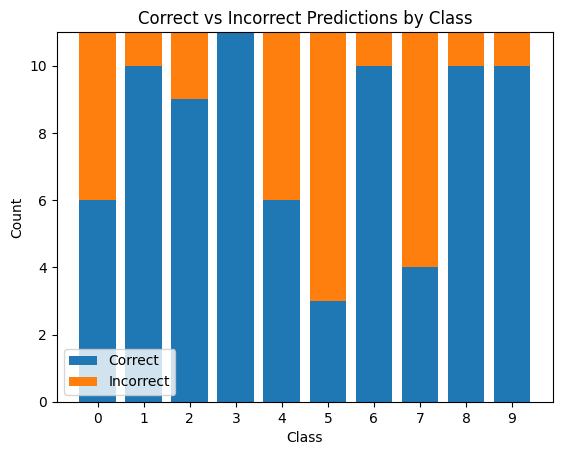

In [ ]:
plot_pedictions(transformed_classifier,prediction_labels1, prediction_images1)

###### Detector defenses: 

In [ ]:
# Create an adversarial trainer with Madry's PGD
classifier1.model.compile(optimizer="adam", loss="sparse_categorical_crossentropy")

trainer = AdversarialTrainerMadryPGD(classifier1, nb_epochs=6, eps=0.2, eps_step=0.1, batch_size=128)

# Fit the adversarial trainer on preprocessed data
trainer.fit(x_test_adv, prediction_labels)

Precompute adv samples:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial training epochs:   0%|          | 0/6 [00:00<?, ?it/s]

[3 8 8 6 6 6 9 6 6 6 0 6 6 7 9 8 5 2 8 6 9 3 6 9 4 2 3 6 2 6 6 5 4 2 9 2 4
 9 9 5 4 6 2 6 0 9 3 6 4 6 9 6 6 3 8 8 7 3 6 6 7 3 6 2 2 4 2 3 7 6 8 8 6 5
 9 3 3 8 6 1 1 3 6 6 6 3 9 0 3 4 3 0 7 4 4 3 1 1 4 0 2 1 6 6 1 2 6 4 1 5]
Accuracy: 0.6454545454545455


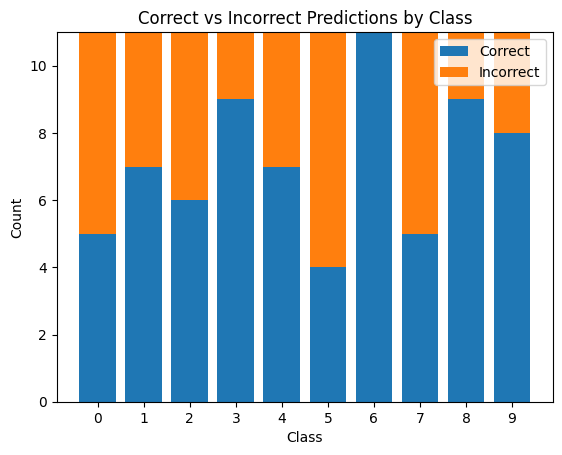

In [ ]:
plot_pedictions(classifier1,prediction_labels, x_test_adv)

###8 SaliencyMapMethod WB


In [ ]:
from art.attacks.evasion import SaliencyMapMethod

#### SaliencyMapMethod 

In [ ]:
saliency_map = SaliencyMapMethod(classifier=classifier)

In [ ]:
saliency_adv = saliency_map.generate(prediction_images, prediction_labels)

JSMA:   0%|          | 0/110 [00:00<?, ?it/s]

##### plots on Orginal model using adversial dataset generated using  SaliencyMapMethod Untargeted

[3 8 8 0 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 4 9 5 2 4 0 9 6 6 5 4 5 9 2 4
 1 9 5 4 6 5 6 0 9 3 9 7 6 9 8 0 3 8 8 7 7 4 6 7 3 6 3 2 1 2 3 7 2 8 8 0 2
 9 3 3 8 8 1 1 7 2 5 2 7 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 4 2 1 2 5 4 1 5]
Accuracy: 1.0


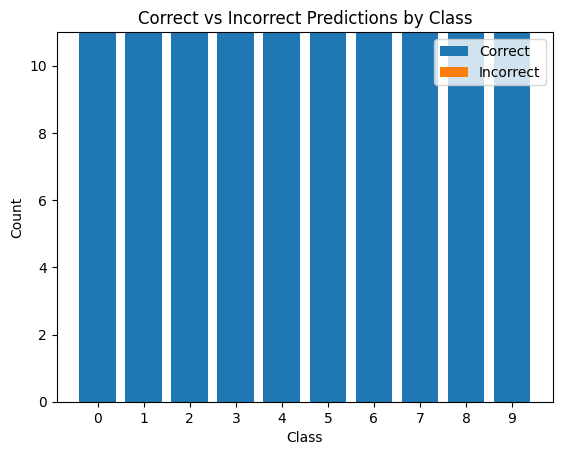

In [ ]:
plot_pedictions(classifier,prediction_labels,saliency_adv)

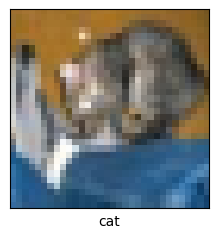

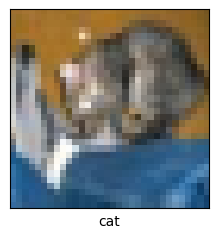

In [ ]:
show_image(prediction_images[0],[prediction_labels[0]])
show_image(saliency_adv[0],[prediction_labels[0]])

##### Defenses

In [ ]:
x_test_adv = saliency_adv

###### Preprocessing Defenses

In [ ]:
from art.defences.preprocessor import JpegCompression

[3 8 8 0 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 4 9 4 2 4 0 9 6 6 5 4 5 9 2 4
 9 9 5 4 6 5 6 0 9 3 8 7 2 9 8 5 3 8 8 7 7 5 6 7 3 6 9 2 1 2 3 7 2 8 8 0 2
 9 3 3 8 8 1 1 7 2 5 2 7 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 4 6 1 2 3 4 1 5]
Accuracy: 0.9181818181818182


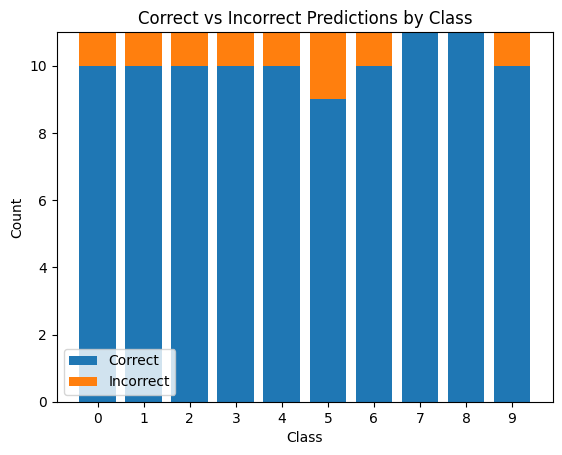

In [ ]:
# Apply preprocessor defense
preprocessor = JpegCompression(clip_values=(0,1),channels_first=True, apply_fit=True, apply_predict=True)
prediction_images1, prediction_labels1 = preprocessor(x_test_adv, prediction_labels)
plot_pedictions(classifier ,prediction_labels1, prediction_images1)  

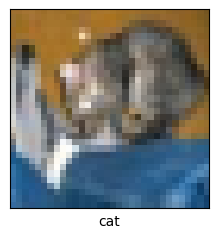

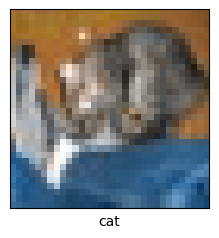

In [ ]:
show_image(x_test_adv[0],[prediction_labels[0]])
show_image(prediction_images1[0],[prediction_labels[0]])

###### Postprocessing Defenses

In [ ]:
from art.defences.postprocessor import GaussianNoise

[3 8 8 0 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 4 9 4 2 4 0 9 6 6 5 4 5 9 2 4
 9 9 5 4 6 5 6 0 9 3 8 7 2 9 8 5 3 8 8 7 7 5 6 7 3 6 9 2 1 2 3 7 2 8 8 0 2
 9 3 3 8 8 1 1 7 2 5 2 7 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 4 6 1 2 3 4 1 5]
Accuracy: 0.9181818181818182


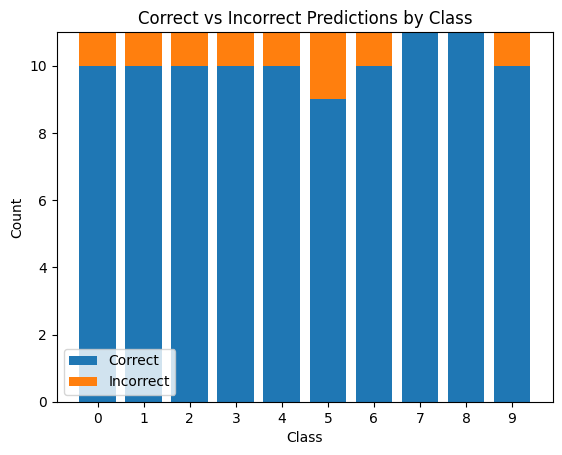

In [ ]:
# Define the postprocessing defense
noise = GaussianNoise(scale=0.2)
# Apply the defense to the classifier
classifier.postprocessing_defences = [noise]
plot_pedictions(classifier,prediction_labels1, prediction_images1)

######  Trainer Defenses

In [ ]:
from art.defences.trainer import AdversarialTrainerMadryPGD

In [ ]:
x_train_preprocessed, y_train_preprocessed = preprocessor(x_test,y_test)

In [ ]:
#Load the victim model
classifier_url = "https://tfhub.dev/deepmind/ganeval-cifar10-convnet/1"
IMAGE_SHAPE = (32, 32) 
classifier1 = KerasClassifier(model=tf.keras.Sequential([hub.KerasLayer(classifier_url, input_shape=IMAGE_SHAPE+(3,))]), clip_values=(0, 1))

In [ ]:
# Create an adversarial trainer with Madry's PGD
classifier1.model.compile(optimizer="adam", loss="sparse_categorical_crossentropy")

trainer = AdversarialTrainerMadryPGD(classifier1, nb_epochs=1, eps=0.1, eps_step=1, batch_size=16)

# Fit the adversarial trainer on preprocessed data
trainer.fit(x_train_preprocessed, y_train)

Precompute adv samples:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial training epochs:   0%|          | 0/1 [00:00<?, ?it/s]

[3 8 8 0 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 4 9 4 2 4 0 9 6 6 5 4 5 9 2 4
 9 9 5 4 6 5 6 0 9 3 8 7 2 9 8 5 3 8 8 7 7 5 6 7 3 6 9 2 1 2 3 7 2 8 8 0 2
 9 3 3 8 8 1 1 7 2 5 2 7 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 4 6 1 2 3 4 1 5]
Accuracy: 0.9181818181818182


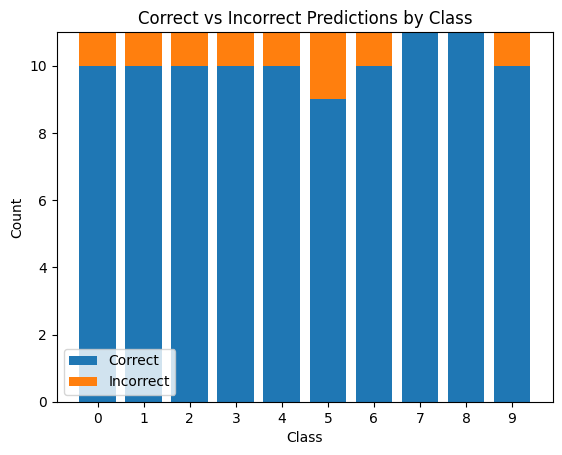

In [ ]:
plot_pedictions(classifier1,prediction_labels1, prediction_images1)

######Transformer Defenses

In [ ]:
from art.defences.transformer.evasion import DefensiveDistillation

In [ ]:
# Define the defense
defense = DefensiveDistillation(classifier=classifier1, batch_size=128, nb_epochs=20)

# Fit the defense
defense.fit(x_train, y_train)

# Get the transformed classifier
transformed_classifier = defense.classifier

[3 8 8 0 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 4 9 4 2 4 0 9 6 6 5 4 5 9 2 4
 9 9 5 4 6 5 6 0 9 3 8 7 2 9 8 5 3 8 8 7 7 5 6 7 3 6 9 2 1 2 3 7 2 8 8 0 2
 9 3 3 8 8 1 1 7 2 5 2 7 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 4 6 1 2 3 4 1 5]
Accuracy: 0.9181818181818182


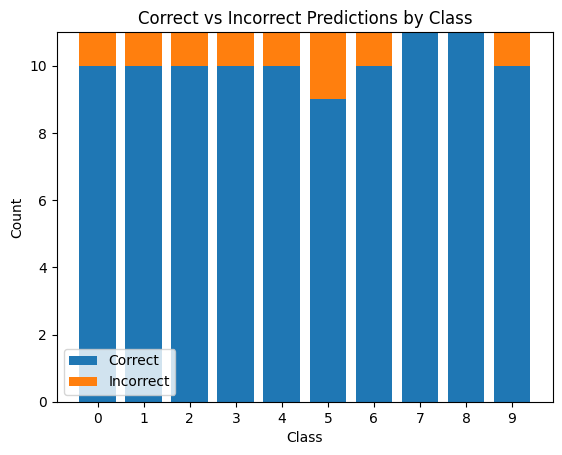

In [ ]:
plot_pedictions(transformed_classifier,prediction_labels1, prediction_images1)

###### Detector defenses: 

In [ ]:
# Create an adversarial trainer with Madry's PGD
classifier1.model.compile(optimizer="adam", loss="sparse_categorical_crossentropy")

trainer = AdversarialTrainerMadryPGD(classifier1, nb_epochs=6, eps=0.2, eps_step=0.1, batch_size=128)

# Fit the adversarial trainer on preprocessed data
trainer.fit(x_test_adv, prediction_labels)

Precompute adv samples:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial training epochs:   0%|          | 0/6 [00:00<?, ?it/s]

[3 8 8 0 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 4 9 5 2 4 0 9 6 6 5 4 5 9 2 4
 1 9 5 4 6 5 6 0 9 3 9 7 6 9 8 0 3 8 8 7 7 4 6 7 3 6 3 2 1 2 3 7 2 8 8 0 2
 9 3 3 8 8 1 1 7 2 5 2 7 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 4 2 1 2 5 4 1 5]
Accuracy: 1.0


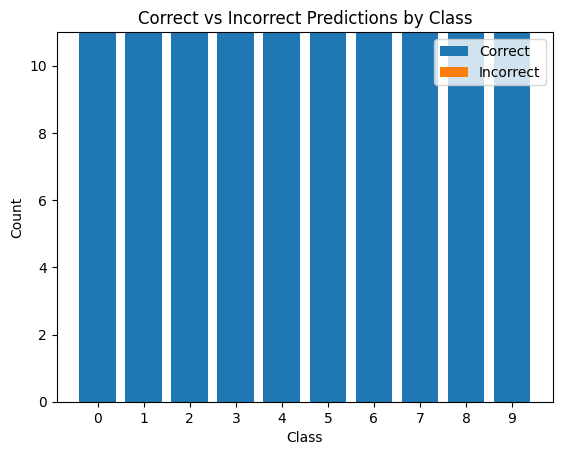

In [ ]:
plot_pedictions(classifier1,prediction_labels, x_test_adv)

###9 NewtonFool WB


In [ ]:
from art.attacks.evasion import NewtonFool

#### NewtonFool 

In [ ]:
ntf = NewtonFool(classifier=classifier)

In [ ]:
ntf_adv = ntf.generate(prediction_images, prediction_labels)

NewtonFool:   0%|          | 0/110 [00:00<?, ?it/s]

##### plots on Orginal model using adversial dataset generated using  NewtonFool Untargeted

[5 0 1 3 2 3 5 4 5 9 5 2 3 1 0 6 3 2 4 9 1 6 6 1 3 0 5 4 1 2 3 2 8 3 0 9 5
 1 3 2 3 2 3 9 8 1 6 8 4 2 6 4 0 5 3 5 3 3 3 6 6 3 0 1 6 8 1 5 4 8 3 0 4 5
 0 7 5 5 2 1 9 3 7 3 1 3 1 1 2 5 2 2 4 7 3 6 9 2 7 2 6 9 0 3 3 6 5 2 9 2]
Accuracy: 0.05454545454545454


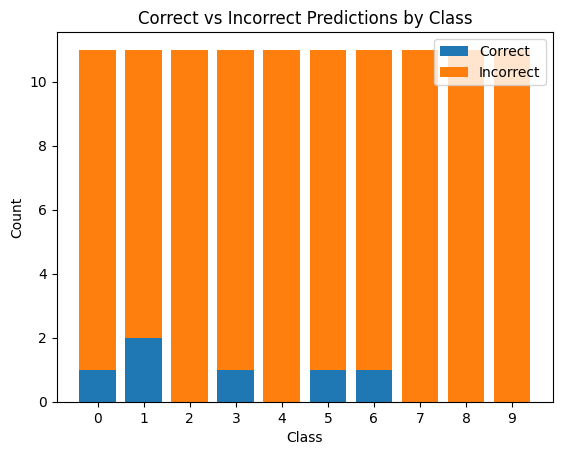

In [ ]:
plot_pedictions(classifier,prediction_labels,ntf_adv)

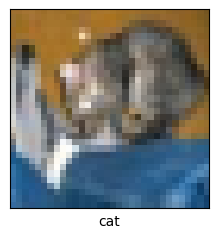

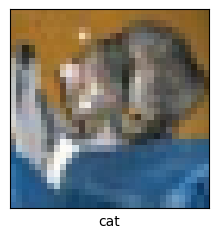

In [ ]:
show_image(prediction_images[0],[prediction_labels[0]])
show_image(ntf_adv[0],[prediction_labels[0]])

##### Defenses

In [ ]:
x_test_adv = ntf_adv

###### Preprocessing Defenses

In [ ]:
from art.defences.preprocessor import JpegCompression

[3 8 1 9 6 6 9 6 5 9 3 9 3 7 9 6 3 2 8 6 1 6 6 9 4 2 4 0 1 6 3 5 4 5 9 2 4
 1 9 5 4 6 3 6 8 9 3 8 4 2 6 6 3 5 8 8 5 3 3 6 7 3 6 1 6 1 1 3 7 3 8 8 0 2
 9 3 3 8 8 1 9 7 7 3 2 3 9 1 3 4 2 0 4 4 8 3 9 1 4 2 6 9 0 3 1 2 5 2 1 6]
Accuracy: 0.5818181818181818


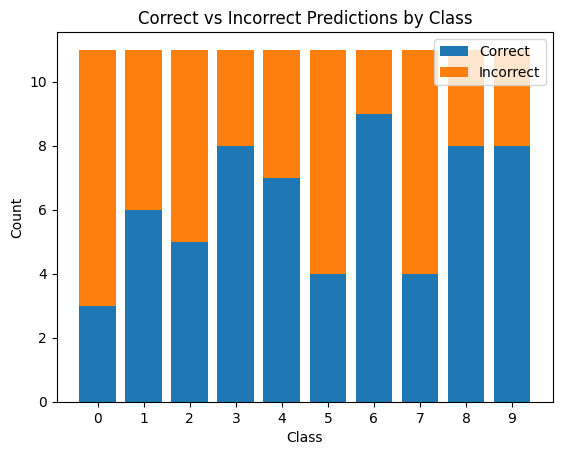

In [ ]:
# Apply preprocessor defense
preprocessor = JpegCompression(clip_values=(0,1),channels_first=True, apply_fit=True, apply_predict=True)
prediction_images1, prediction_labels1 = preprocessor(x_test_adv, prediction_labels)
plot_pedictions(classifier ,prediction_labels1, prediction_images1)  

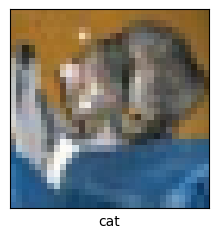

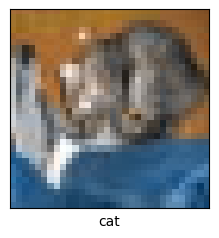

In [ ]:
show_image(x_test_adv[0],[prediction_labels[0]])
show_image(prediction_images1[0],[prediction_labels[0]])

###### Postprocessing Defenses

In [ ]:
from art.defences.postprocessor import GaussianNoise

[3 8 1 9 6 6 9 6 5 9 3 9 3 7 9 6 3 2 8 6 1 3 8 9 4 2 4 0 1 6 3 5 4 5 9 2 4
 1 9 5 4 6 5 6 8 9 3 8 4 2 6 6 3 5 8 8 5 3 3 6 4 3 6 9 6 1 1 3 7 3 8 8 0 2
 9 3 3 8 8 1 1 7 7 3 2 3 9 1 3 3 2 0 4 4 8 3 9 1 4 2 6 9 0 3 1 2 5 4 1 5]
Accuracy: 0.5909090909090909


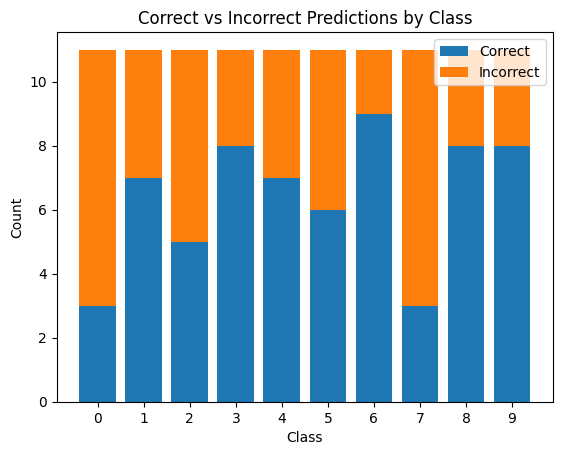

In [ ]:
# Define the postprocessing defense
noise = GaussianNoise(scale=0.2)
# Apply the defense to the classifier
classifier.postprocessing_defences = [noise]
plot_pedictions(classifier,prediction_labels1, prediction_images1)

######  Trainer Defenses

In [ ]:
from art.defences.trainer import AdversarialTrainerMadryPGD

In [ ]:
x_train_preprocessed, y_train_preprocessed = preprocessor(x_test,y_test)

In [ ]:
#Load the victim model
classifier_url = "https://tfhub.dev/deepmind/ganeval-cifar10-convnet/1"
IMAGE_SHAPE = (32, 32) 
classifier1 = KerasClassifier(model=tf.keras.Sequential([hub.KerasLayer(classifier_url, input_shape=IMAGE_SHAPE+(3,))]), clip_values=(0, 1))

In [ ]:
# Create an adversarial trainer with Madry's PGD
classifier1.model.compile(optimizer="adam", loss="sparse_categorical_crossentropy")

trainer = AdversarialTrainerMadryPGD(classifier1, nb_epochs=1, eps=0.1, eps_step=1, batch_size=16)

# Fit the adversarial trainer on preprocessed data
trainer.fit(x_train_preprocessed, y_train)

Precompute adv samples:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial training epochs:   0%|          | 0/1 [00:00<?, ?it/s]

[3 8 1 9 6 6 9 6 5 9 3 9 3 7 9 6 3 2 8 6 1 6 8 9 4 2 4 0 1 6 3 5 4 5 9 2 4
 1 9 5 4 6 5 6 8 9 3 8 4 2 6 6 3 5 8 8 5 3 3 6 4 3 6 1 6 1 1 3 7 3 8 8 0 2
 9 3 3 8 8 1 1 7 7 3 2 3 9 1 3 3 2 0 4 4 8 3 9 1 4 2 6 9 0 3 1 2 5 2 1 5]
Accuracy: 0.5727272727272728


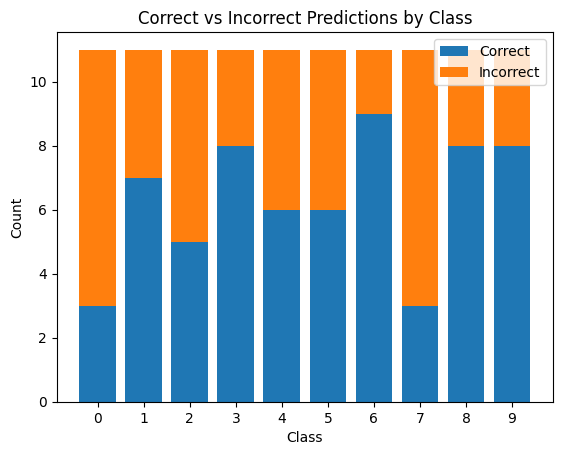

In [ ]:
plot_pedictions(classifier1,prediction_labels1, prediction_images1)

######Transformer Defenses

In [ ]:
from art.defences.transformer.evasion import DefensiveDistillation

In [ ]:
# Define the defense
defense = DefensiveDistillation(classifier=classifier1, batch_size=128, nb_epochs=20)

# Fit the defense
defense.fit(x_train, y_train)

# Get the transformed classifier
transformed_classifier = defense.classifier

[3 8 1 9 6 6 9 6 5 9 3 9 3 7 9 6 3 2 8 6 1 6 8 9 4 2 4 0 1 6 3 5 4 5 9 2 4
 1 9 5 4 6 5 6 8 9 3 8 4 2 6 6 3 5 8 8 5 3 3 6 4 3 6 1 6 1 1 3 7 3 8 8 0 2
 9 3 3 8 8 1 1 7 7 3 2 3 9 1 3 3 2 0 4 4 8 3 9 1 4 2 6 9 0 3 1 2 5 2 1 5]
Accuracy: 0.5727272727272728


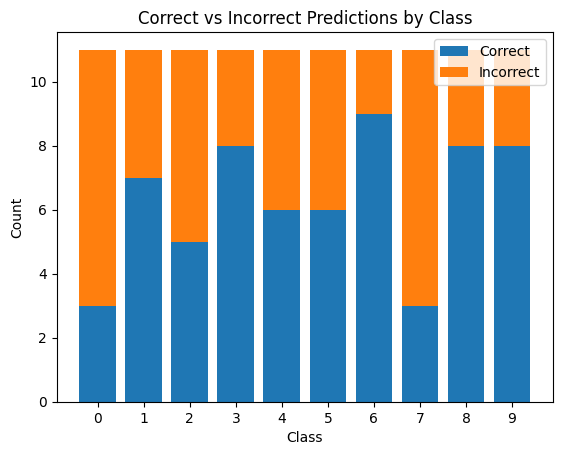

In [ ]:
plot_pedictions(transformed_classifier,prediction_labels1, prediction_images1)

###### Detector defenses: 

In [ ]:
# Create an adversarial trainer with Madry's PGD
classifier1.model.compile(optimizer="adam", loss="sparse_categorical_crossentropy")

trainer = AdversarialTrainerMadryPGD(classifier1, nb_epochs=6, eps=0.2, eps_step=0.1, batch_size=128)

# Fit the adversarial trainer on preprocessed data
trainer.fit(x_test_adv, prediction_labels)

Precompute adv samples:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial training epochs:   0%|          | 0/6 [00:00<?, ?it/s]

[5 0 1 3 9 3 5 4 5 9 5 2 3 1 0 6 3 2 4 9 1 6 6 1 3 0 5 4 1 2 3 2 8 3 0 9 5
 1 3 2 3 2 3 1 8 1 6 8 4 2 6 4 0 5 3 5 3 3 3 6 6 3 0 1 6 8 1 5 4 8 3 3 4 5
 0 7 5 5 2 1 9 3 7 3 1 3 1 1 6 5 2 2 4 7 3 6 9 2 7 2 6 9 0 3 3 6 5 2 9 2]
Accuracy: 0.05454545454545454


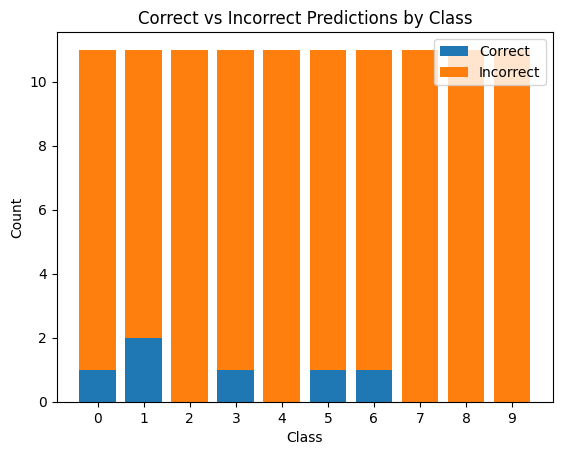

In [ ]:
plot_pedictions(classifier1,prediction_labels, x_test_adv)

##1.1 Comparison of Attacks on CIFAR-10 Black box

###1 ZooAttack BB


In [ ]:
from art.attacks.evasion import ZooAttack

#### ZooAttack UnTargeted

In [ ]:
zatk = ZooAttack(classifier=classifier, max_iter = 1, binary_search_steps=5)

In [ ]:
zatk_adv = zatk.generate(prediction_images, prediction_labels)

ZOO:   0%|          | 0/110 [00:00<?, ?it/s]

##### plots on Orginal model using adversial dataset generated using  ZooAttack Untargeted

[3 8 8 0 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 4 9 5 2 4 0 9 6 6 5 4 5 9 2 4
 9 9 5 4 6 5 6 0 9 3 9 7 6 9 8 5 3 8 8 7 7 5 3 7 5 6 3 2 1 2 3 7 2 8 8 0 2
 9 3 3 8 8 9 1 7 2 5 2 7 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 4 6 1 2 3 4 1 5]
Accuracy: 0.9272727272727272


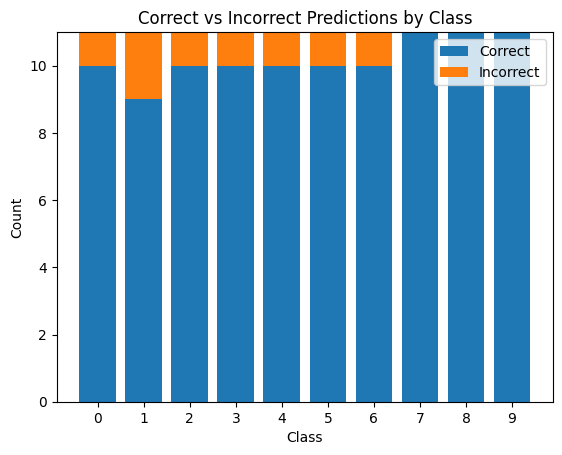

In [ ]:
plot_pedictions(classifier,prediction_labels,zatk_adv)

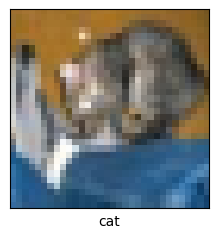

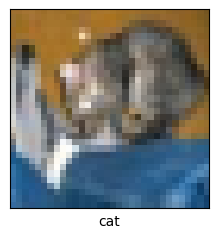

In [ ]:
show_image(prediction_images[0],[prediction_labels[0]])
show_image(zatk_adv[0],[prediction_labels[0]])

##### Defenses

In [ ]:
x_test_adv = zatk_adv

###### Preprocessing Defenses

In [ ]:
from art.defences.preprocessor import JpegCompression

[3 8 8 0 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 4 9 4 2 4 0 9 6 6 5 4 5 9 2 4
 9 9 5 4 6 5 6 0 9 3 8 7 2 9 8 5 3 8 8 7 7 5 3 7 3 6 9 2 1 2 3 7 2 8 8 0 2
 9 3 3 8 8 9 1 7 2 5 2 7 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 4 6 1 2 3 4 1 5]
Accuracy: 0.9090909090909091


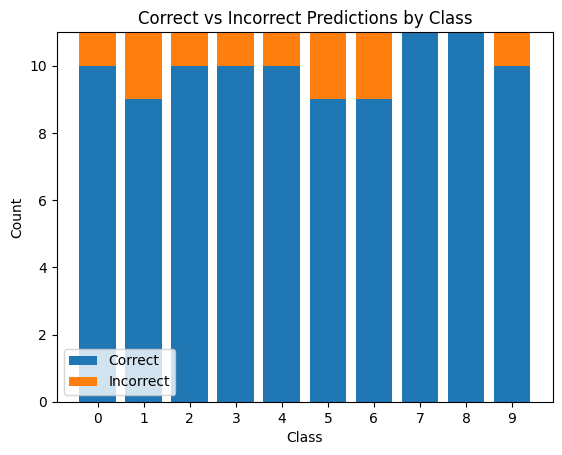

In [ ]:
# Apply preprocessor defense
preprocessor = JpegCompression(clip_values=(0,1),channels_first=True, apply_fit=True, apply_predict=True)
prediction_images1, prediction_labels1 = preprocessor(x_test_adv, prediction_labels)
plot_pedictions(classifier ,prediction_labels1, prediction_images1)  

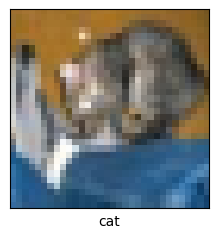

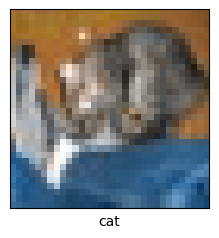

In [ ]:
show_image(x_test_adv[0],[prediction_labels[0]])
show_image(prediction_images1[0],[prediction_labels[0]])

###### Postprocessing Defenses

In [ ]:
from art.defences.postprocessor import GaussianNoise

[3 8 8 0 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 4 9 4 2 4 0 9 6 6 5 4 5 9 2 4
 9 9 5 4 6 5 6 0 9 3 8 7 2 9 8 5 3 8 8 7 7 5 3 7 3 6 9 2 1 2 3 7 2 8 8 0 2
 9 3 3 8 8 9 1 7 2 5 2 7 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 4 6 1 2 3 4 1 5]
Accuracy: 0.9090909090909091


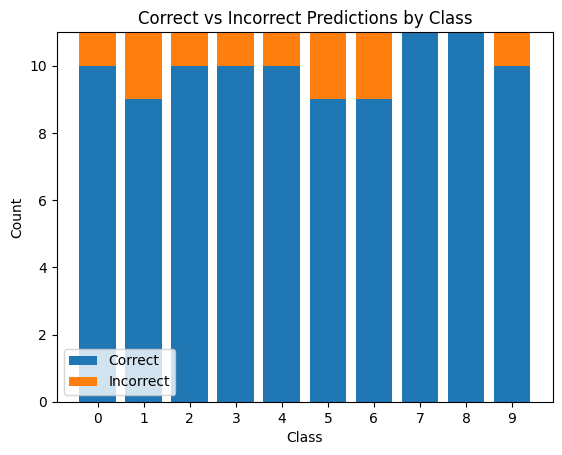

In [ ]:
# Define the postprocessing defense
noise = GaussianNoise(scale=0.2)
# Apply the defense to the classifier
classifier.postprocessing_defences = [noise]
plot_pedictions(classifier,prediction_labels1, prediction_images1)

######  Trainer Defenses

In [ ]:
from art.defences.trainer import AdversarialTrainerMadryPGD

In [ ]:
x_train_preprocessed, y_train_preprocessed = preprocessor(x_test,y_test)

In [ ]:
#Load the victim model
classifier_url = "https://tfhub.dev/deepmind/ganeval-cifar10-convnet/1"
IMAGE_SHAPE = (32, 32) 
classifier1 = KerasClassifier(model=tf.keras.Sequential([hub.KerasLayer(classifier_url, input_shape=IMAGE_SHAPE+(3,))]), clip_values=(0, 1))

In [ ]:
# Create an adversarial trainer with Madry's PGD
classifier1.model.compile(optimizer="adam", loss="sparse_categorical_crossentropy")

trainer = AdversarialTrainerMadryPGD(classifier1, nb_epochs=1, eps=0.1, eps_step=1, batch_size=16)

# Fit the adversarial trainer on preprocessed data
trainer.fit(x_train_preprocessed, y_train)

Precompute adv samples:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial training epochs:   0%|          | 0/1 [00:00<?, ?it/s]

[3 8 8 0 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 4 9 4 2 4 0 9 6 6 5 4 5 9 2 4
 9 9 5 4 6 5 6 0 9 3 8 7 2 9 8 5 3 8 8 7 7 5 3 7 3 6 9 2 1 2 3 7 2 8 8 0 2
 9 3 3 8 8 9 1 7 2 5 2 7 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 4 6 1 2 3 4 1 5]
Accuracy: 0.9


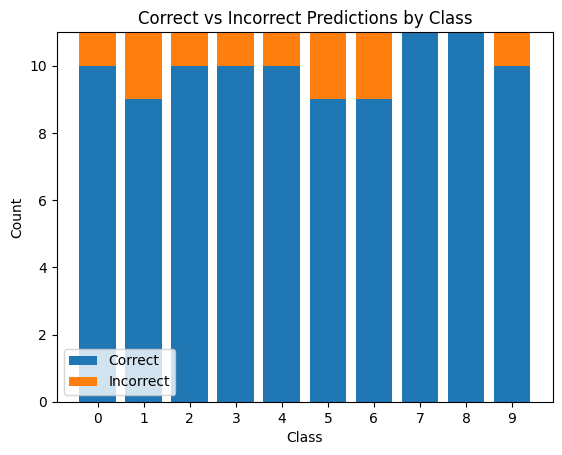

In [ ]:
plot_pedictions(classifier1,prediction_labels1, prediction_images1)

######Transformer Defenses

In [ ]:
from art.defences.transformer.evasion import DefensiveDistillation

In [ ]:
# Define the defense
defense = DefensiveDistillation(classifier=classifier1, batch_size=128, nb_epochs=20)

# Fit the defense
defense.fit(x_train, y_train)

# Get the transformed classifier
transformed_classifier = defense.classifier

[3 8 8 0 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 4 9 4 2 4 0 9 6 6 5 4 5 9 2 4
 9 9 5 4 6 5 6 0 9 3 8 7 2 9 8 5 3 8 8 7 7 5 3 7 3 6 9 2 1 2 3 7 2 8 8 0 2
 9 3 3 8 8 9 1 7 2 5 2 7 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 4 6 1 2 3 4 1 5]
Accuracy: 0.9


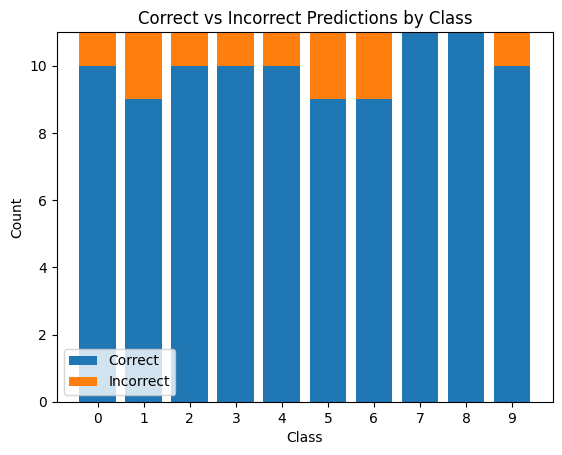

In [ ]:
plot_pedictions(transformed_classifier,prediction_labels1, prediction_images1)

###### Detector defenses: 

In [ ]:
# Create an adversarial trainer with Madry's PGD
classifier1.model.compile(optimizer="adam", loss="sparse_categorical_crossentropy")

trainer = AdversarialTrainerMadryPGD(classifier1, nb_epochs=6, eps=0.2, eps_step=0.1, batch_size=128)

# Fit the adversarial trainer on preprocessed data
trainer.fit(x_test_adv, prediction_labels)

Precompute adv samples:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial training epochs:   0%|          | 0/6 [00:00<?, ?it/s]

[3 8 8 0 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 4 9 5 2 4 0 9 6 6 5 4 5 9 2 4
 9 9 5 4 6 5 6 0 9 3 9 7 6 9 8 5 3 8 8 7 7 5 3 7 5 6 3 2 1 2 3 7 2 8 8 0 2
 9 3 3 8 8 9 1 7 2 5 2 7 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 4 6 1 2 3 4 1 5]
Accuracy: 0.9272727272727272


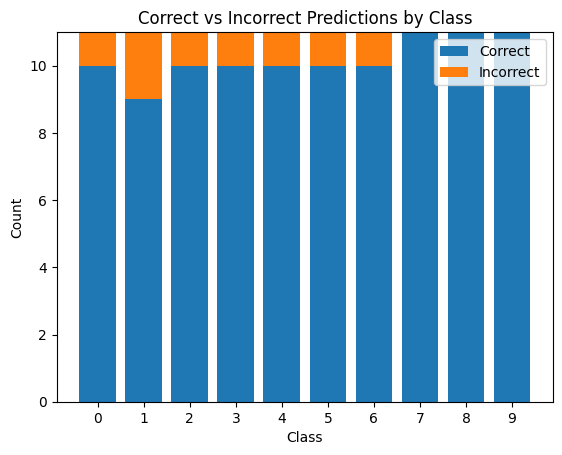

In [ ]:
plot_pedictions(classifier1,prediction_labels, x_test_adv)

#### ZooAttack Targeted

In [ ]:
zatk = ZooAttack(classifier=classifier, max_iter = 1, binary_search_steps=5, targeted=True)

In [ ]:
zatk_adv = zatk.generate(prediction_images, prediction_labels)

ZOO:   0%|          | 0/110 [00:00<?, ?it/s]

##### plots on Orginal model using adversial dataset generated using  ZooAttack targeted

[3 8 8 0 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 4 9 5 2 4 0 9 6 6 5 4 5 9 2 4
 1 9 5 4 6 5 6 0 9 3 9 7 6 9 8 5 3 8 8 7 7 5 3 7 5 6 3 2 1 2 3 7 2 8 8 0 2
 9 3 3 8 8 9 1 7 2 5 2 7 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 4 6 1 2 3 4 1 5]
Accuracy: 0.9363636363636364


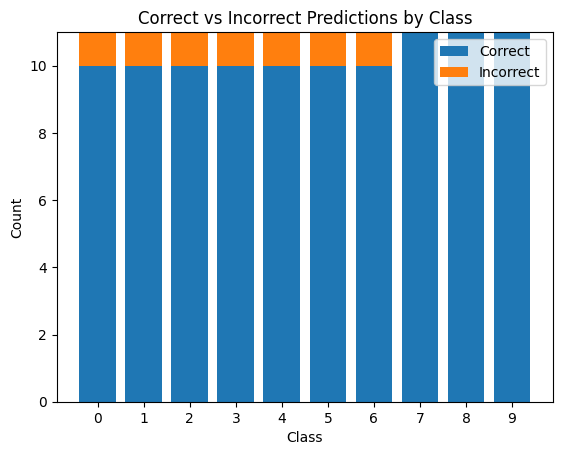

In [ ]:
plot_pedictions(classifier,prediction_labels,zatk_adv)

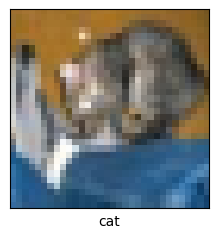

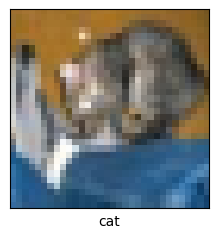

In [ ]:
show_image(prediction_images[0],[prediction_labels[0]])
show_image(zatk_adv[0],[prediction_labels[0]])

##### Defenses

In [ ]:
x_test_adv = zatk_adv

###### Preprocessing Defenses

In [ ]:
from art.defences.preprocessor import JpegCompression

[3 8 8 0 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 4 9 4 2 4 0 9 6 6 5 4 5 9 2 4
 9 9 5 4 6 5 6 0 9 3 8 7 2 9 8 5 3 8 8 7 7 5 3 7 3 6 9 2 1 2 3 7 2 8 8 0 2
 9 3 3 8 8 9 1 7 2 5 2 7 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 4 6 1 2 3 4 1 5]
Accuracy: 0.9


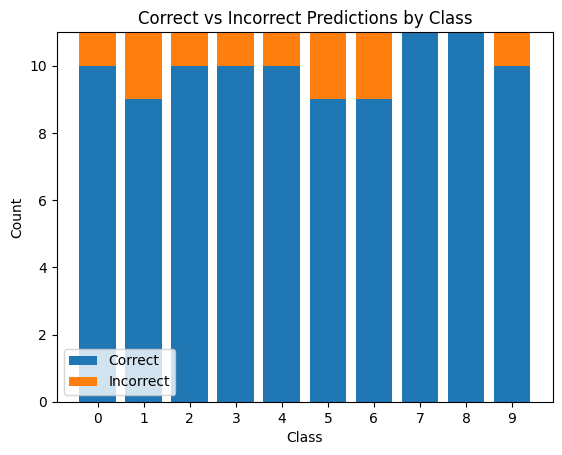

In [ ]:
# Apply preprocessor defense
preprocessor = JpegCompression(clip_values=(0,1),channels_first=True, apply_fit=True, apply_predict=True)
prediction_images1, prediction_labels1 = preprocessor(x_test_adv, prediction_labels)
plot_pedictions(classifier ,prediction_labels1, prediction_images1)  

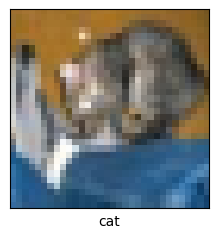

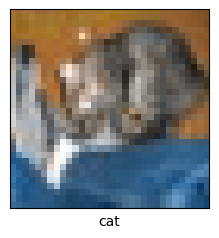

In [ ]:
show_image(x_test_adv[0],[prediction_labels[0]])
show_image(prediction_images1[0],[prediction_labels[0]])

###### Postprocessing Defenses

In [ ]:
from art.defences.postprocessor import GaussianNoise

[3 8 8 0 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 4 9 4 2 4 0 9 6 6 5 4 5 9 2 4
 9 9 5 4 6 5 6 0 9 3 8 7 2 9 8 5 3 8 8 7 7 5 3 7 3 6 9 2 1 2 3 7 2 8 8 0 2
 9 3 3 8 8 1 1 7 2 5 2 7 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 4 6 1 2 3 4 1 5]
Accuracy: 0.9


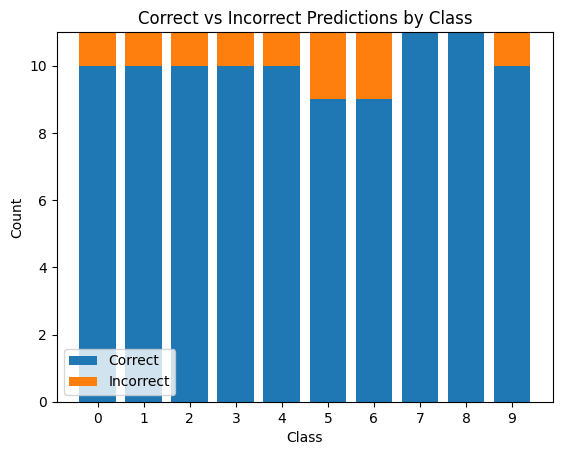

In [ ]:
# Define the postprocessing defense
noise = GaussianNoise(scale=0.2)
# Apply the defense to the classifier
classifier.postprocessing_defences = [noise]
plot_pedictions(classifier,prediction_labels1, prediction_images1)

######  Trainer Defenses

In [ ]:
from art.defences.trainer import AdversarialTrainerMadryPGD

In [ ]:
x_train_preprocessed, y_train_preprocessed = preprocessor(x_test,y_test)

In [ ]:
#Load the victim model
classifier_url = "https://tfhub.dev/deepmind/ganeval-cifar10-convnet/1"
IMAGE_SHAPE = (32, 32) 
classifier1 = KerasClassifier(model=tf.keras.Sequential([hub.KerasLayer(classifier_url, input_shape=IMAGE_SHAPE+(3,))]), clip_values=(0, 1))

In [ ]:
# Create an adversarial trainer with Madry's PGD
classifier1.model.compile(optimizer="adam", loss="sparse_categorical_crossentropy")

trainer = AdversarialTrainerMadryPGD(classifier1, nb_epochs=1, eps=0.1, eps_step=1, batch_size=16)

# Fit the adversarial trainer on preprocessed data
trainer.fit(x_train_preprocessed, y_train)

Precompute adv samples:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial training epochs:   0%|          | 0/1 [00:00<?, ?it/s]

[3 8 8 0 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 4 9 4 2 4 0 9 6 6 5 4 5 9 2 4
 9 9 5 4 6 5 6 0 9 3 8 7 2 9 8 5 3 8 8 7 7 5 3 7 3 6 9 2 1 2 3 7 2 8 8 0 2
 9 3 3 8 8 9 1 7 2 5 2 7 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 4 6 1 2 3 4 1 5]
Accuracy: 0.9


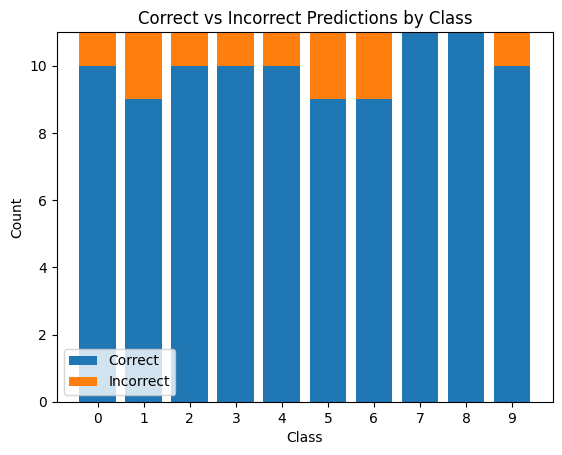

In [ ]:
plot_pedictions(classifier1,prediction_labels1, prediction_images1)

######Transformer Defenses

In [ ]:
from art.defences.transformer.evasion import DefensiveDistillation

In [ ]:
# Define the defense
defense = DefensiveDistillation(classifier=classifier1, batch_size=128, nb_epochs=20)

# Fit the defense
defense.fit(x_train, y_train)

# Get the transformed classifier
transformed_classifier = defense.classifier

[3 8 8 0 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 4 9 4 2 4 0 9 6 6 5 4 5 9 2 4
 9 9 5 4 6 5 6 0 9 3 8 7 2 9 8 5 3 8 8 7 7 5 3 7 3 6 9 2 1 2 3 7 2 8 8 0 2
 9 3 3 8 8 9 1 7 2 5 2 7 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 4 6 1 2 3 4 1 5]
Accuracy: 0.9


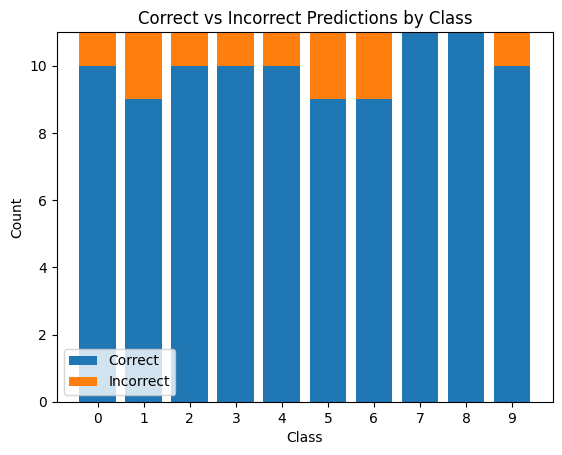

In [ ]:
plot_pedictions(transformed_classifier,prediction_labels1, prediction_images1)

###### Detector defenses: 

In [ ]:
# Create an adversarial trainer with Madry's PGD
classifier1.model.compile(optimizer="adam", loss="sparse_categorical_crossentropy")

trainer = AdversarialTrainerMadryPGD(classifier1, nb_epochs=6, eps=0.2, eps_step=0.1, batch_size=128)

# Fit the adversarial trainer on preprocessed data
trainer.fit(x_test_adv, prediction_labels)

Precompute adv samples:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial training epochs:   0%|          | 0/6 [00:00<?, ?it/s]

[3 8 8 0 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 4 9 5 2 4 0 9 6 6 5 4 5 9 2 4
 9 9 5 4 6 5 6 0 9 3 9 7 6 9 8 5 3 8 8 7 7 5 3 7 5 6 3 2 1 2 3 7 2 8 8 0 2
 9 3 3 8 8 9 1 7 2 5 2 7 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 4 6 1 2 3 4 1 5]
Accuracy: 0.9272727272727272


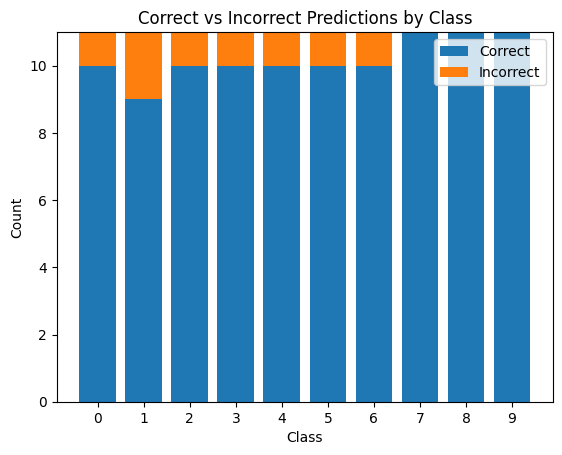

In [ ]:
plot_pedictions(classifier1,prediction_labels, x_test_adv)

###2 HopSkipJump BB


In [ ]:
from art.attacks.evasion import HopSkipJump

#### HopSkipJump UnTargeted

In [ ]:
hsj = HopSkipJump(classifier=classifier,max_iter=1,max_eval=100)

In [ ]:
hsj_adv = hsj.generate(prediction_images, prediction_labels)

HopSkipJump:   0%|          | 0/110 [00:00<?, ?it/s]

##### plots on Orginal model using adversial dataset generated using  HopSkipJump Untargeted

[6 6 6 6 0 0 6 0 6 9 5 6 6 2 6 6 2 2 6 2 2 3 2 6 4 6 6 6 6 2 3 6 6 6 6 6 6
 6 4 6 6 2 2 1 6 6 6 8 4 2 6 6 2 6 6 6 2 6 6 6 6 3 2 9 6 6 6 6 6 6 6 6 6 6
 6 6 6 6 6 6 6 6 6 6 6 3 6 6 6 6 2 2 6 6 4 6 6 6 6 6 6 6 2 3 6 6 6 6 6 6]
Accuracy: 0.01818181818181818


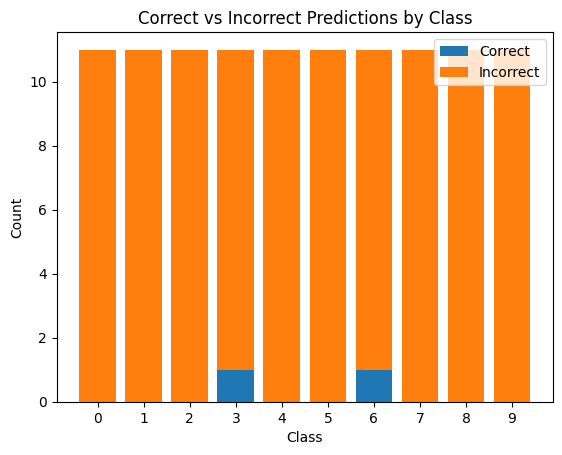

In [ ]:
plot_pedictions(classifier,prediction_labels,hsj_adv)

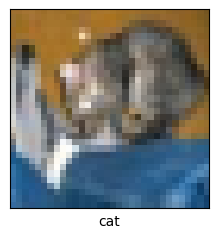

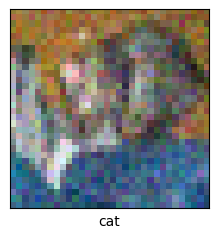

In [ ]:
show_image(prediction_images[0],[prediction_labels[0]])
show_image(hsj_adv[0],[prediction_labels[0]])

##### Defenses

In [ ]:
x_test_adv = hsj_adv

###### Preprocessing Defenses

In [ ]:
from art.defences.preprocessor import JpegCompression

[6 6 6 6 0 0 6 0 6 9 3 6 2 4 6 6 2 2 6 2 6 3 2 6 4 6 2 6 6 2 2 6 6 6 6 6 6
 6 4 6 2 2 2 1 6 6 3 8 4 6 6 4 4 6 6 4 2 2 6 6 4 3 1 9 6 6 6 2 6 6 6 6 6 6
 2 6 6 4 6 3 6 4 6 6 2 3 6 6 6 6 3 2 4 6 4 6 6 6 6 6 6 4 6 6 6 6 6 6 6 6]
Accuracy: 0.045454545454545456


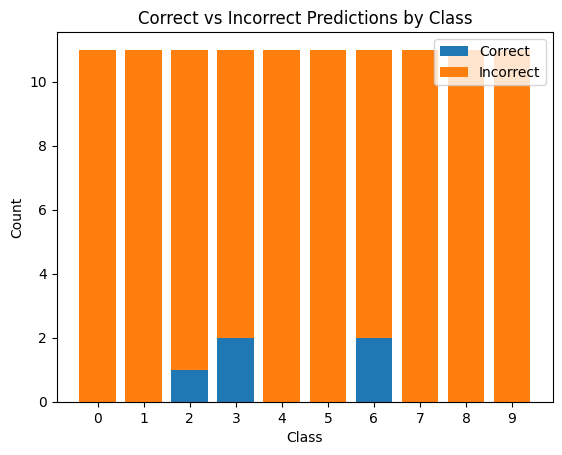

In [ ]:
# Apply preprocessor defense
preprocessor = JpegCompression(clip_values=(0,1),channels_first=True, apply_fit=True, apply_predict=True)
prediction_images1, prediction_labels1 = preprocessor(x_test_adv, prediction_labels)
plot_pedictions(classifier ,prediction_labels1, prediction_images1)  

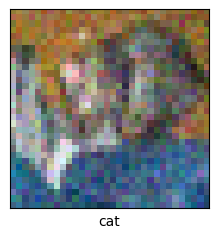

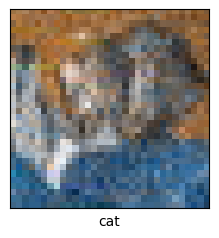

In [ ]:
show_image(x_test_adv[0],[prediction_labels[0]])
show_image(prediction_images1[0],[prediction_labels[0]])

###### Postprocessing Defenses

In [ ]:
from art.defences.postprocessor import GaussianNoise

[6 6 6 6 0 0 6 0 6 9 3 6 2 4 6 6 2 2 6 2 3 3 2 6 4 6 2 6 6 2 2 6 6 6 6 6 6
 6 4 6 2 2 2 1 6 6 3 8 4 6 6 4 4 6 6 4 2 2 3 6 4 3 1 9 6 6 6 2 6 6 8 2 6 6
 2 6 6 4 6 3 6 4 6 6 6 3 6 6 6 6 3 2 4 6 4 6 6 6 6 6 6 4 6 6 6 6 6 6 6 6]
Accuracy: 0.05454545454545454


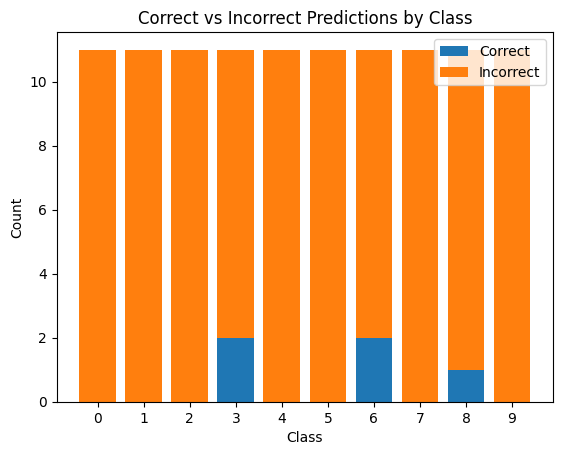

In [ ]:
# Define the postprocessing defense
noise = GaussianNoise(scale=0.2)
# Apply the defense to the classifier
classifier.postprocessing_defences = [noise]
plot_pedictions(classifier,prediction_labels1, prediction_images1)

######  Trainer Defenses

In [ ]:
from art.defences.trainer import AdversarialTrainerMadryPGD

In [ ]:
x_train_preprocessed, y_train_preprocessed = preprocessor(x_test,y_test)

In [ ]:
#Load the victim model
classifier_url = "https://tfhub.dev/deepmind/ganeval-cifar10-convnet/1"
IMAGE_SHAPE = (32, 32) 
classifier1 = KerasClassifier(model=tf.keras.Sequential([hub.KerasLayer(classifier_url, input_shape=IMAGE_SHAPE+(3,))]), clip_values=(0, 1))

In [ ]:
# Create an adversarial trainer with Madry's PGD
classifier1.model.compile(optimizer="adam", loss="sparse_categorical_crossentropy")

trainer = AdversarialTrainerMadryPGD(classifier1, nb_epochs=1, eps=0.1, eps_step=1, batch_size=16)

# Fit the adversarial trainer on preprocessed data
trainer.fit(x_train_preprocessed, y_train)

Precompute adv samples:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial training epochs:   0%|          | 0/1 [00:00<?, ?it/s]

[6 6 6 6 0 0 6 0 6 9 3 6 2 4 6 6 2 2 6 2 6 3 2 6 4 6 2 6 6 2 2 6 6 6 6 6 6
 6 4 6 2 2 2 1 6 6 3 8 4 6 6 4 4 6 6 4 2 2 6 6 4 3 1 9 6 6 6 2 6 6 6 6 6 6
 2 6 6 4 6 3 6 4 6 6 2 3 6 6 6 6 3 2 4 6 4 6 6 6 6 6 6 4 6 6 6 6 6 6 6 6]
Accuracy: 0.045454545454545456


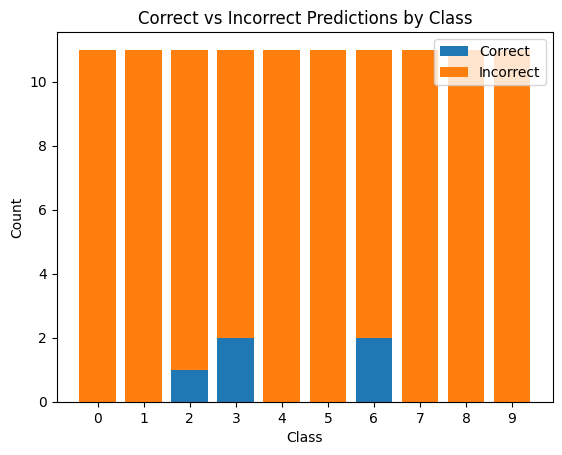

In [ ]:
plot_pedictions(classifier1,prediction_labels1, prediction_images1)

######Transformer Defenses

In [ ]:
from art.defences.transformer.evasion import DefensiveDistillation

In [ ]:
# Define the defense
defense = DefensiveDistillation(classifier=classifier1, batch_size=128, nb_epochs=20)

# Fit the defense
defense.fit(x_train, y_train)

# Get the transformed classifier
transformed_classifier = defense.classifier

[6 6 6 6 0 0 6 0 6 9 3 6 2 4 6 6 2 2 6 2 6 3 2 6 4 6 2 6 6 2 2 6 6 6 6 6 6
 6 4 6 2 2 2 1 6 6 3 8 4 6 6 4 4 6 6 4 2 2 6 6 4 3 1 9 6 6 6 2 6 6 6 6 6 6
 2 6 6 4 6 3 6 4 6 6 2 3 6 6 6 6 3 2 4 6 4 6 6 6 6 6 6 4 6 6 6 6 6 6 6 6]
Accuracy: 0.045454545454545456


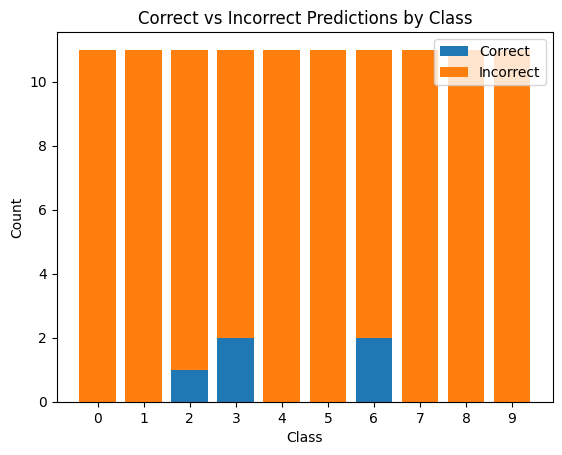

In [ ]:
plot_pedictions(transformed_classifier,prediction_labels1, prediction_images1)

###### Detector defenses: 

In [ ]:
# Create an adversarial trainer with Madry's PGD
classifier1.model.compile(optimizer="adam", loss="sparse_categorical_crossentropy")

trainer = AdversarialTrainerMadryPGD(classifier1, nb_epochs=6, eps=0.2, eps_step=0.1, batch_size=128)

# Fit the adversarial trainer on preprocessed data
trainer.fit(x_test_adv, prediction_labels)

Precompute adv samples:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial training epochs:   0%|          | 0/6 [00:00<?, ?it/s]

[6 6 6 6 0 0 6 0 6 9 5 6 6 2 6 6 2 2 6 2 2 3 2 6 4 6 6 6 6 2 3 6 6 6 6 6 6
 6 4 6 6 2 2 1 6 6 6 8 4 2 6 6 2 6 6 6 2 6 6 6 6 3 2 9 6 6 6 6 6 6 6 6 6 6
 6 6 6 6 6 6 6 6 6 6 6 3 6 6 6 6 2 2 6 6 4 6 6 6 6 6 6 6 2 3 6 6 6 6 6 6]
Accuracy: 0.01818181818181818


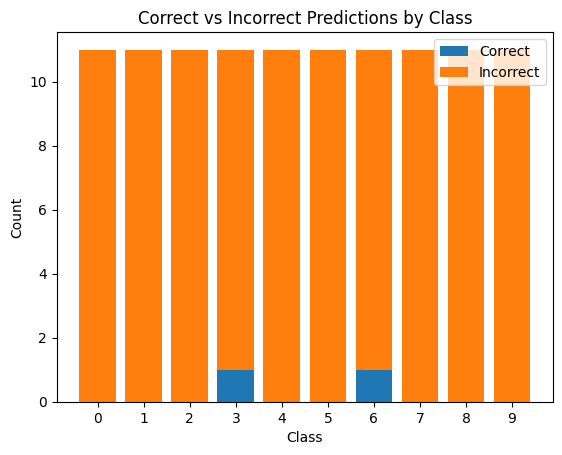

In [ ]:
plot_pedictions(classifier1,prediction_labels, x_test_adv)

#### HopSkipJump Targeted

In [ ]:
hsj = HopSkipJump(classifier=classifier,max_iter=1,max_eval=100, targeted = True)

In [ ]:
hsj_adv = hsj.generate(prediction_images, prediction_labels)

HopSkipJump:   0%|          | 0/110 [00:00<?, ?it/s]

##### plots on Orginal model using adversial dataset generated using  HopSkipJump targeted

[3 8 8 0 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 4 9 5 2 4 0 9 6 6 5 4 5 9 2 4
 1 9 5 4 6 5 6 0 9 3 9 7 6 9 8 0 3 8 8 7 7 5 6 7 5 6 3 2 1 2 3 7 2 8 8 0 2
 9 3 3 8 8 9 1 7 2 5 2 7 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 4 2 1 2 3 4 1 5]
Accuracy: 0.9636363636363636


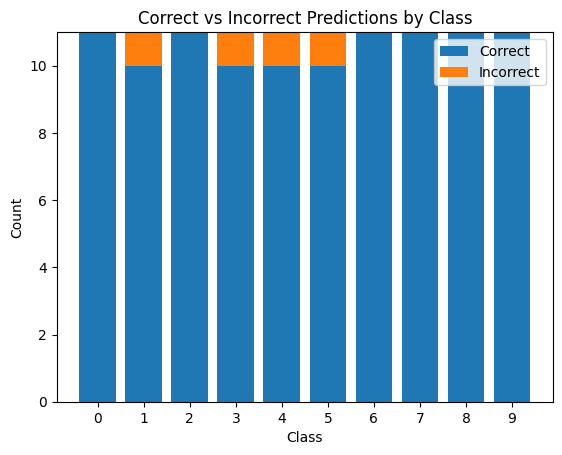

In [ ]:
plot_pedictions(classifier,prediction_labels,hsj_adv)

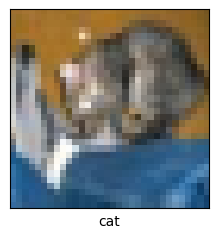

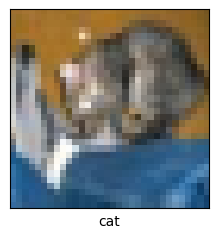

In [ ]:
show_image(prediction_images[0],[prediction_labels[0]])
show_image(hsj_adv[0],[prediction_labels[0]])

##### Defenses

In [ ]:
x_test_adv = hsj_adv

###### Preprocessing Defenses

In [ ]:
from art.defences.preprocessor import JpegCompression

[3 8 8 0 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 4 9 4 2 4 0 9 6 6 5 4 5 9 2 4
 1 9 5 4 6 5 6 0 9 3 8 7 2 9 8 6 3 8 8 7 7 5 6 7 3 6 9 2 1 2 3 7 2 8 8 0 2
 9 3 3 8 8 9 1 7 2 5 2 7 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 4 6 1 2 3 4 1 5]
Accuracy: 0.9181818181818182


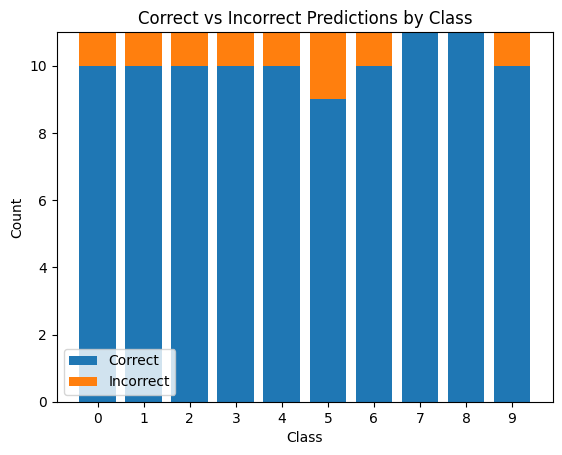

In [ ]:
# Apply preprocessor defense
preprocessor = JpegCompression(clip_values=(0,1),channels_first=True, apply_fit=True, apply_predict=True)
prediction_images1, prediction_labels1 = preprocessor(x_test_adv, prediction_labels)
plot_pedictions(classifier ,prediction_labels1, prediction_images1)  

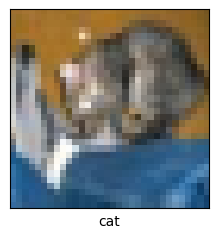

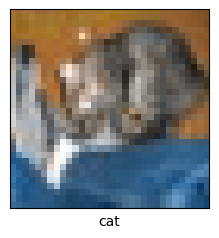

In [ ]:
show_image(x_test_adv[0],[prediction_labels[0]])
show_image(prediction_images1[0],[prediction_labels[0]])

###### Postprocessing Defenses

In [ ]:
from art.defences.postprocessor import GaussianNoise

[3 8 8 0 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 4 9 4 2 4 0 9 6 6 5 4 5 9 2 4
 1 9 5 4 6 5 6 0 9 3 8 7 2 9 8 6 3 8 8 7 7 5 6 7 3 6 9 2 1 2 3 7 2 8 8 0 2
 9 3 3 8 8 9 1 7 2 5 2 7 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 4 6 1 2 3 4 1 5]
Accuracy: 0.9181818181818182


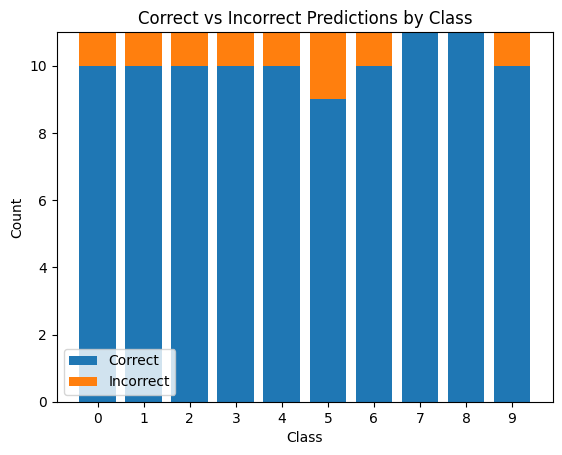

In [ ]:
# Define the postprocessing defense
noise = GaussianNoise(scale=0.2)
# Apply the defense to the classifier
classifier.postprocessing_defences = [noise]
plot_pedictions(classifier,prediction_labels1, prediction_images1)

######  Trainer Defenses

In [ ]:
from art.defences.trainer import AdversarialTrainerMadryPGD

In [ ]:
x_train_preprocessed, y_train_preprocessed = preprocessor(x_test,y_test)

In [ ]:
#Load the victim model
classifier_url = "https://tfhub.dev/deepmind/ganeval-cifar10-convnet/1"
IMAGE_SHAPE = (32, 32) 
classifier1 = KerasClassifier(model=tf.keras.Sequential([hub.KerasLayer(classifier_url, input_shape=IMAGE_SHAPE+(3,))]), clip_values=(0, 1))

In [ ]:
# Create an adversarial trainer with Madry's PGD
classifier1.model.compile(optimizer="adam", loss="sparse_categorical_crossentropy")

trainer = AdversarialTrainerMadryPGD(classifier1, nb_epochs=1, eps=0.1, eps_step=1, batch_size=16)

# Fit the adversarial trainer on preprocessed data
trainer.fit(x_train_preprocessed, y_train)

Precompute adv samples:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial training epochs:   0%|          | 0/1 [00:00<?, ?it/s]

[3 8 8 0 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 4 9 4 2 4 0 9 6 6 5 4 5 9 2 4
 1 9 5 4 6 5 6 0 9 3 8 7 2 9 8 6 3 8 8 7 7 5 6 7 3 6 9 2 1 2 3 7 2 8 8 0 2
 9 3 3 8 8 9 1 7 2 5 2 7 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 4 6 1 2 3 4 1 5]
Accuracy: 0.9181818181818182


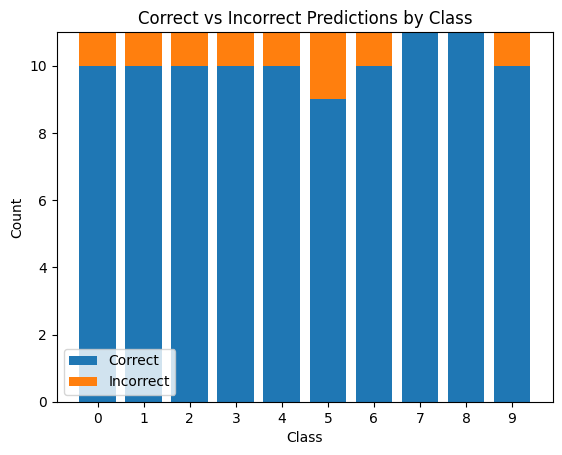

In [ ]:
plot_pedictions(classifier1,prediction_labels1, prediction_images1)

######Transformer Defenses

In [ ]:
from art.defences.transformer.evasion import DefensiveDistillation

In [ ]:
# Define the defense
defense = DefensiveDistillation(classifier=classifier1, batch_size=128, nb_epochs=20)

# Fit the defense
defense.fit(x_train, y_train)

# Get the transformed classifier
transformed_classifier = defense.classifier

[3 8 8 0 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 4 9 4 2 4 0 9 6 6 5 4 5 9 2 4
 1 9 5 4 6 5 6 0 9 3 8 7 2 9 8 6 3 8 8 7 7 5 6 7 3 6 9 2 1 2 3 7 2 8 8 0 2
 9 3 3 8 8 9 1 7 2 5 2 7 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 4 6 1 2 3 4 1 5]
Accuracy: 0.9181818181818182


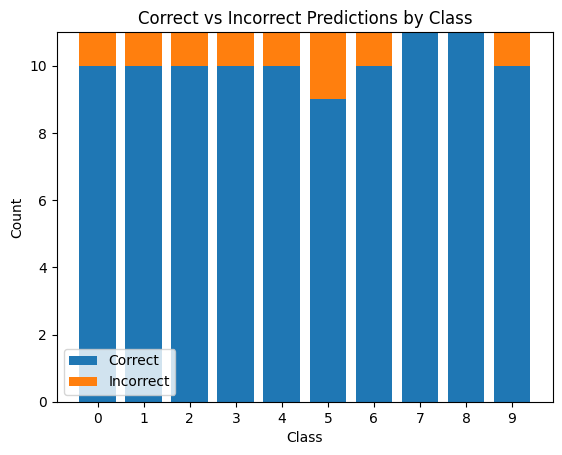

In [ ]:
plot_pedictions(transformed_classifier,prediction_labels1, prediction_images1)

###### Detector defenses: 

In [ ]:
# Create an adversarial trainer with Madry's PGD
classifier1.model.compile(optimizer="adam", loss="sparse_categorical_crossentropy")

trainer = AdversarialTrainerMadryPGD(classifier1, nb_epochs=6, eps=0.2, eps_step=0.1, batch_size=128)

# Fit the adversarial trainer on preprocessed data
trainer.fit(x_test_adv, prediction_labels)

Precompute adv samples:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial training epochs:   0%|          | 0/6 [00:00<?, ?it/s]

[3 8 8 0 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 4 9 5 2 4 0 9 6 6 5 4 5 9 2 4
 1 9 5 4 6 5 6 0 9 3 9 7 6 9 8 0 3 8 8 7 7 5 6 7 5 6 3 2 1 2 3 7 2 8 8 0 2
 9 3 3 8 8 9 1 7 2 5 2 7 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 4 2 1 2 3 4 1 5]
Accuracy: 0.9636363636363636


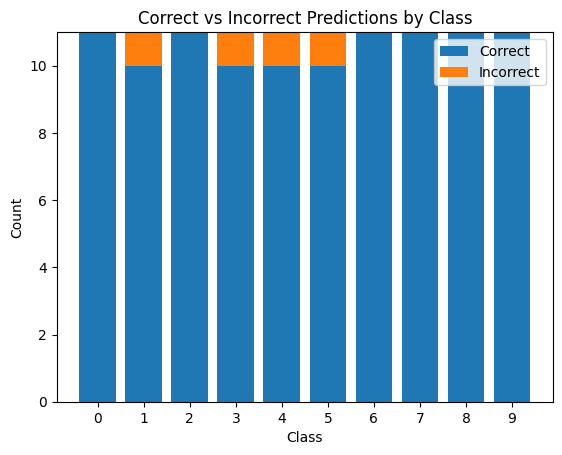

In [ ]:
plot_pedictions(classifier1,prediction_labels, x_test_adv)

###3 SquareAttack BB


In [ ]:
from art.attacks.evasion import SquareAttack

#### SquareAttack 

In [ ]:
square = SquareAttack(estimator=classifier)

In [ ]:
square_adv = square.generate(prediction_images, prediction_labels)

SquareAttack - restarts:   0%|          | 0/1 [00:00<?, ?it/s]

SquareAttack - iterations:   0%|          | 0/100 [00:00<?, ?it/s]

##### plots on Orginal model using adversial dataset generated using  SquareAttack Untargeted

[6 5 5 3 1 5 6 3 5 9 5 6 9 6 6 6 6 1 5 9 5 6 5 5 6 5 5 6 6 4 3 6 6 3 6 6 6
 1 6 6 6 0 6 5 9 5 5 6 6 5 5 5 5 6 6 5 6 4 5 3 5 5 9 6 6 6 3 6 1 5 5 5 9 5
 6 5 5 5 5 9 3 6 5 3 6 5 6 6 6 6 5 6 6 5 9 6 5 9 6 3 6 6 6 6 5 6 3 6 3 9]
Accuracy: 0.0


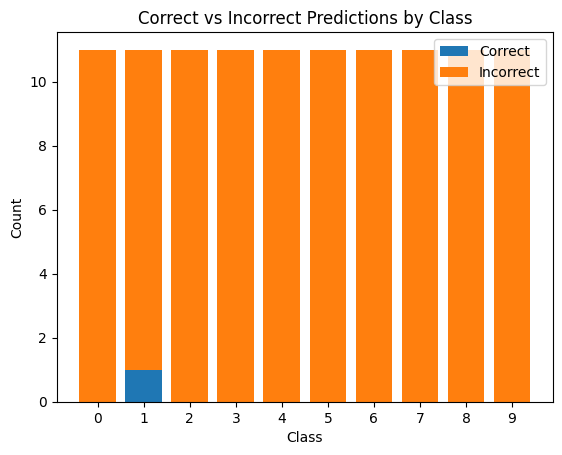

In [ ]:
plot_pedictions(classifier,prediction_labels,square_adv)

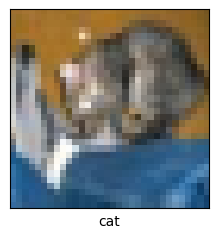

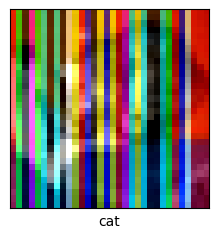

In [ ]:
show_image(prediction_images[0],[prediction_labels[0]])
show_image(square_adv[0],[prediction_labels[0]])

##### Defenses

In [ ]:
x_test_adv = square_adv

###### Preprocessing Defenses

In [ ]:
from art.defences.preprocessor import JpegCompression

[6 5 6 3 1 3 3 3 5 9 6 6 9 6 6 6 9 6 6 6 5 5 6 5 6 5 5 6 6 6 3 6 6 5 6 6 6
 9 6 6 6 0 6 6 1 5 5 6 6 5 5 6 5 6 6 6 6 6 5 3 5 3 9 6 6 6 5 6 1 3 5 6 3 5
 6 6 5 5 5 9 3 6 5 3 6 5 6 6 6 6 5 6 6 5 9 6 5 3 6 9 6 6 6 6 5 6 3 6 5 9]
Accuracy: 0.05454545454545454


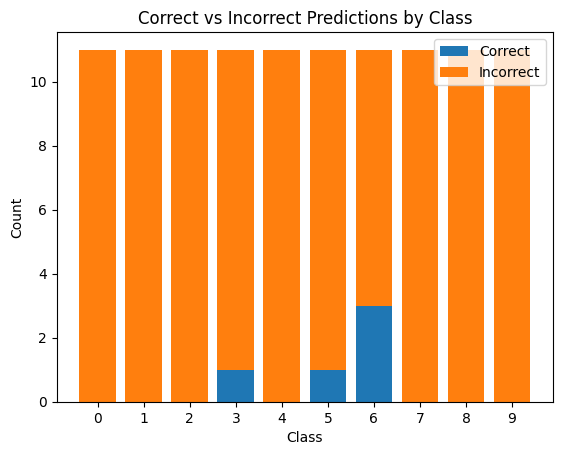

In [ ]:
# Apply preprocessor defense
preprocessor = JpegCompression(clip_values=(0,1),channels_first=True, apply_fit=True, apply_predict=True)
prediction_images1, prediction_labels1 = preprocessor(x_test_adv, prediction_labels)
plot_pedictions(classifier ,prediction_labels1, prediction_images1)  

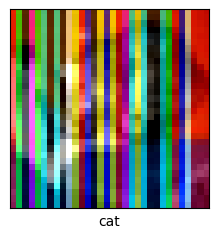

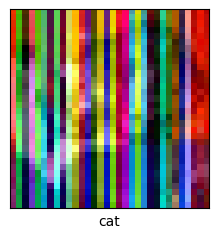

In [ ]:
show_image(x_test_adv[0],[prediction_labels[0]])
show_image(prediction_images1[0],[prediction_labels[0]])

###### Postprocessing Defenses

In [ ]:
from art.defences.postprocessor import GaussianNoise

[6 5 6 3 6 3 3 3 5 9 6 6 9 6 6 6 9 1 6 6 5 5 6 5 6 5 6 6 6 6 3 6 6 3 6 6 6
 9 6 6 6 6 6 6 1 5 5 6 6 5 5 6 5 6 6 6 6 6 5 3 5 3 9 6 6 6 5 6 6 3 5 6 9 5
 6 6 5 5 5 9 3 6 5 3 6 5 6 6 6 6 5 5 6 5 9 6 5 3 6 9 6 6 6 6 5 6 3 6 5 9]
Accuracy: 0.05454545454545454


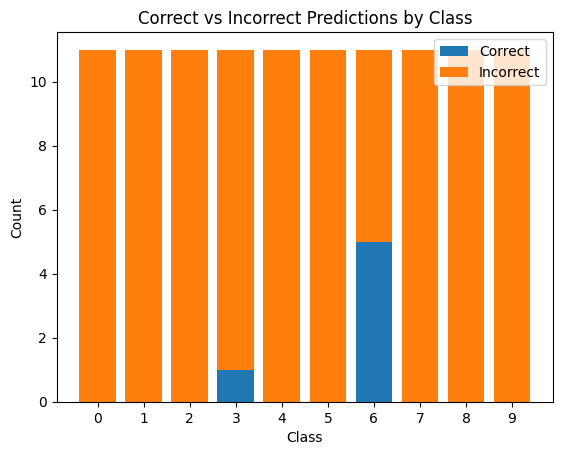

In [ ]:
# Define the postprocessing defense
noise = GaussianNoise(scale=0.2)
# Apply the defense to the classifier
classifier.postprocessing_defences = [noise]
plot_pedictions(classifier,prediction_labels1, prediction_images1)

######  Trainer Defenses

In [ ]:
from art.defences.trainer import AdversarialTrainerMadryPGD

In [ ]:
x_train_preprocessed, y_train_preprocessed = preprocessor(x_test,y_test)

In [ ]:
#Load the victim model
classifier_url = "https://tfhub.dev/deepmind/ganeval-cifar10-convnet/1"
IMAGE_SHAPE = (32, 32) 
classifier1 = KerasClassifier(model=tf.keras.Sequential([hub.KerasLayer(classifier_url, input_shape=IMAGE_SHAPE+(3,))]), clip_values=(0, 1))

In [ ]:
# Create an adversarial trainer with Madry's PGD
classifier1.model.compile(optimizer="adam", loss="sparse_categorical_crossentropy")

trainer = AdversarialTrainerMadryPGD(classifier1, nb_epochs=1, eps=0.1, eps_step=1, batch_size=16)

# Fit the adversarial trainer on preprocessed data
trainer.fit(x_train_preprocessed, y_train)

Precompute adv samples:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial training epochs:   0%|          | 0/1 [00:00<?, ?it/s]

[6 5 6 3 1 3 3 3 5 9 6 6 9 6 6 6 9 1 6 6 5 5 6 5 6 5 6 6 6 4 3 6 6 5 6 6 6
 9 6 6 6 6 6 6 1 5 5 6 6 5 5 6 5 6 6 6 6 6 5 3 5 3 9 6 6 6 5 6 1 3 5 6 3 5
 6 6 5 5 5 9 3 6 5 3 6 5 6 6 6 6 5 6 6 5 9 6 5 3 6 9 6 6 6 6 5 6 3 6 5 9]
Accuracy: 0.045454545454545456


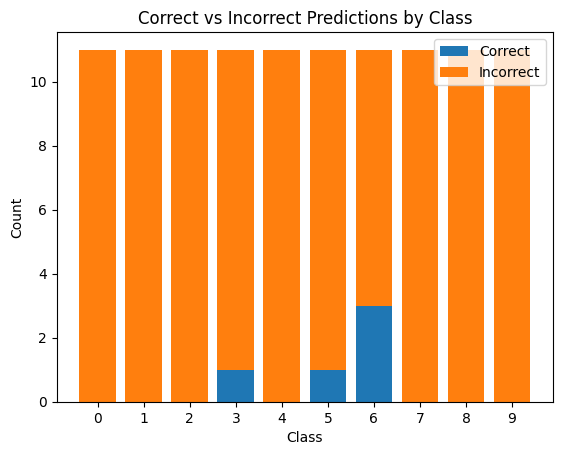

In [ ]:
plot_pedictions(classifier1,prediction_labels1, prediction_images1)

######Transformer Defenses

In [ ]:
from art.defences.transformer.evasion import DefensiveDistillation

In [ ]:
# Define the defense
defense = DefensiveDistillation(classifier=classifier1, batch_size=128, nb_epochs=20)

# Fit the defense
defense.fit(x_train, y_train)

# Get the transformed classifier
transformed_classifier = defense.classifier

[6 5 6 3 1 3 3 3 5 9 6 6 9 6 6 6 9 1 6 6 5 5 6 5 6 5 6 6 6 4 3 6 6 5 6 6 6
 9 6 6 6 6 6 6 1 5 5 6 6 5 5 6 5 6 6 6 6 6 5 3 5 3 9 6 6 6 5 6 1 3 5 6 3 5
 6 6 5 5 5 9 3 6 5 3 6 5 6 6 6 6 5 6 6 5 9 6 5 3 6 9 6 6 6 6 5 6 3 6 5 9]
Accuracy: 0.045454545454545456


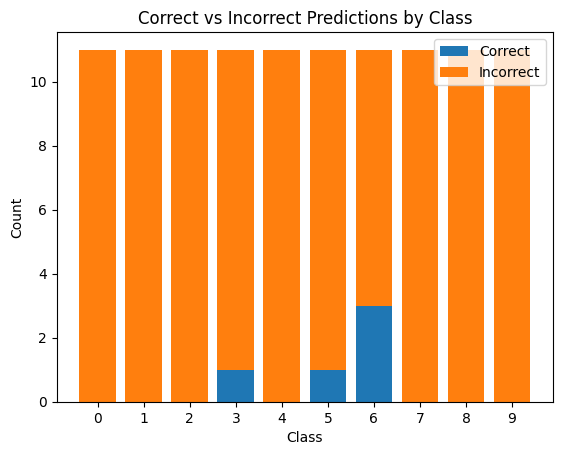

In [ ]:
plot_pedictions(transformed_classifier,prediction_labels1, prediction_images1)

###### Detector defenses: 

In [ ]:
# Create an adversarial trainer with Madry's PGD
classifier1.model.compile(optimizer="adam", loss="sparse_categorical_crossentropy")

trainer = AdversarialTrainerMadryPGD(classifier1, nb_epochs=6, eps=0.2, eps_step=0.1, batch_size=128)

# Fit the adversarial trainer on preprocessed data
trainer.fit(x_test_adv, prediction_labels)

Precompute adv samples:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial training epochs:   0%|          | 0/6 [00:00<?, ?it/s]

[6 5 5 3 1 5 6 3 5 9 5 6 9 6 6 6 6 1 5 9 5 6 5 5 6 5 5 6 6 4 3 6 6 3 6 6 6
 9 6 6 6 0 6 5 9 5 5 6 6 5 6 6 5 6 6 5 6 6 5 3 5 5 9 6 6 6 3 6 1 5 5 5 9 5
 6 5 5 5 5 9 3 6 5 3 6 5 6 6 6 6 5 6 6 5 9 6 5 9 6 3 6 6 6 6 5 6 3 6 3 9]
Accuracy: 0.0


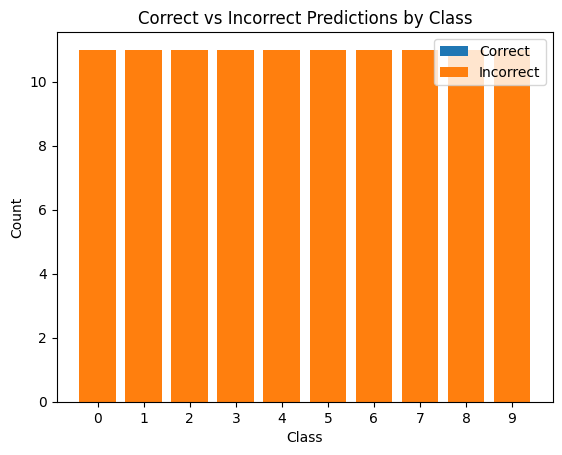

In [ ]:
plot_pedictions(classifier1,prediction_labels, x_test_adv)

###4 BoundaryAttack BB


In [ ]:
from art.attacks.evasion import BoundaryAttack

#### BoundaryAttack 

In [ ]:
boundary = BoundaryAttack(estimator=classifier)

In [ ]:
boundary_adv = boundary.generate(prediction_images, prediction_labels)

Boundary attack:   0%|          | 0/110 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/5000 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/5000 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/5000 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/5000 [00:00<?, ?it/s]

##### plots on Orginal model using adversial dataset generated using  BoundaryAttack Untargeted

[3 8 8 0 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 4 9 5 2 4 0 9 6 6 5 4 5 9 2 4
 9 9 5 4 6 5 6 0 9 3 0 7 6 9 8 6 3 8 8 7 7 5 3 7 6 6 3 2 1 2 3 7 2 8 8 0 2
 9 3 3 8 8 9 1 7 2 5 2 7 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 4 6 1 2 3 4 1 5]
Accuracy: 0.9363636363636364


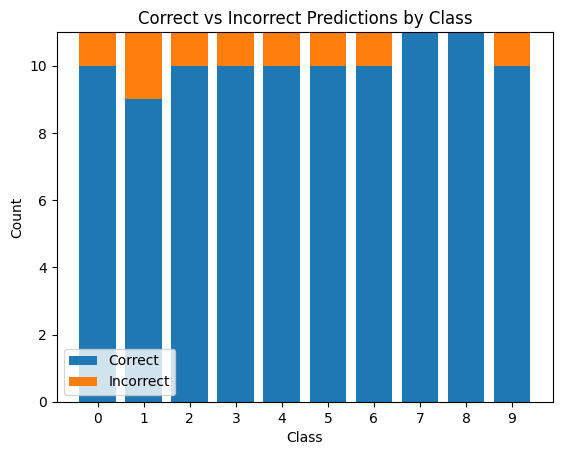

In [ ]:
plot_pedictions(classifier,prediction_labels,boundary_adv)

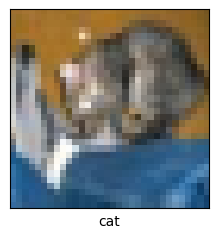

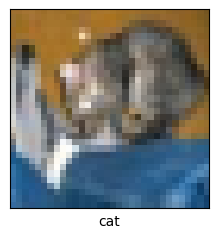

In [ ]:
show_image(prediction_images[0],[prediction_labels[0]])
show_image(boundary_adv[0],[prediction_labels[0]])

##### Defenses

In [ ]:
x_test_adv = boundary_adv

###### Preprocessing Defenses

In [ ]:
from art.defences.preprocessor import JpegCompression

[3 8 8 0 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 4 9 4 2 4 0 9 6 6 5 4 5 9 2 4
 9 9 5 4 6 5 6 0 9 3 8 7 2 9 8 2 3 8 8 7 7 5 3 7 6 6 9 2 1 2 3 7 2 8 8 0 2
 9 3 3 8 8 9 1 7 2 5 2 7 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 4 6 1 2 3 4 1 5]
Accuracy: 0.9


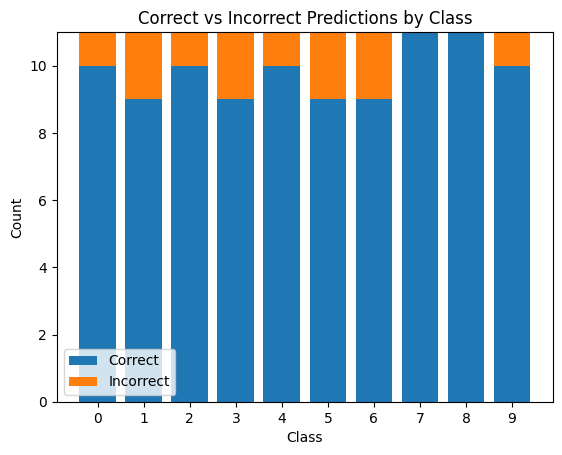

In [ ]:
# Apply preprocessor defense
preprocessor = JpegCompression(clip_values=(0,1),channels_first=True, apply_fit=True, apply_predict=True)
prediction_images1, prediction_labels1 = preprocessor(x_test_adv, prediction_labels)
plot_pedictions(classifier ,prediction_labels1, prediction_images1)  

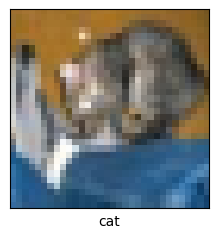

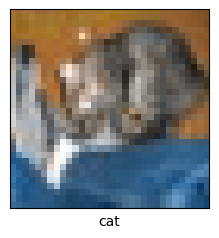

In [ ]:
show_image(x_test_adv[0],[prediction_labels[0]])
show_image(prediction_images1[0],[prediction_labels[0]])

###### Postprocessing Defenses

In [ ]:
from art.defences.postprocessor import GaussianNoise

[3 8 8 0 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 4 9 4 2 4 0 9 6 6 5 4 5 9 2 4
 9 9 5 4 6 5 6 0 9 3 8 7 2 9 8 2 3 8 8 7 7 5 3 7 6 6 9 2 1 2 3 7 2 8 8 0 2
 9 3 3 8 8 9 1 7 2 5 2 7 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 4 6 1 2 3 4 1 5]
Accuracy: 0.8909090909090909


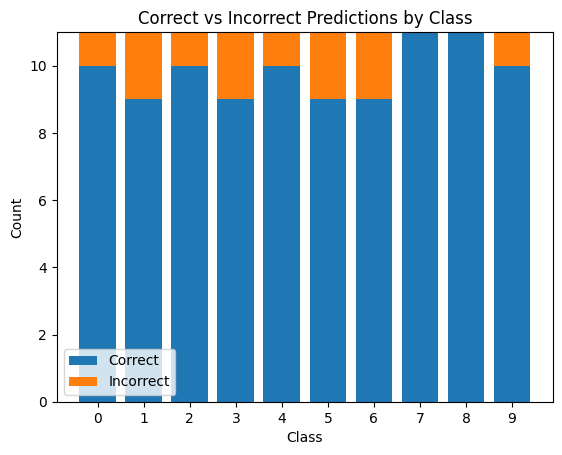

In [ ]:
# Define the postprocessing defense
noise = GaussianNoise(scale=0.2)
# Apply the defense to the classifier
classifier.postprocessing_defences = [noise]
plot_pedictions(classifier,prediction_labels1, prediction_images1)

######  Trainer Defenses

In [ ]:
from art.defences.trainer import AdversarialTrainerMadryPGD

In [ ]:
x_train_preprocessed, y_train_preprocessed = preprocessor(x_test,y_test)

In [ ]:
#Load the victim model
classifier_url = "https://tfhub.dev/deepmind/ganeval-cifar10-convnet/1"
IMAGE_SHAPE = (32, 32) 
classifier1 = KerasClassifier(model=tf.keras.Sequential([hub.KerasLayer(classifier_url, input_shape=IMAGE_SHAPE+(3,))]), clip_values=(0, 1))

In [ ]:
# Create an adversarial trainer with Madry's PGD
classifier1.model.compile(optimizer="adam", loss="sparse_categorical_crossentropy")

trainer = AdversarialTrainerMadryPGD(classifier1, nb_epochs=1, eps=0.1, eps_step=1, batch_size=16)

# Fit the adversarial trainer on preprocessed data
trainer.fit(x_train_preprocessed, y_train)

Precompute adv samples:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial training epochs:   0%|          | 0/1 [00:00<?, ?it/s]

[3 8 8 0 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 4 9 4 2 4 0 9 6 6 5 4 5 9 2 4
 9 9 5 4 6 5 6 0 9 3 8 7 2 9 8 2 3 8 8 7 7 5 3 7 6 6 9 2 1 2 3 7 2 8 8 0 2
 9 3 3 8 8 9 1 7 2 5 2 7 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 4 6 1 2 3 4 1 5]
Accuracy: 0.8909090909090909


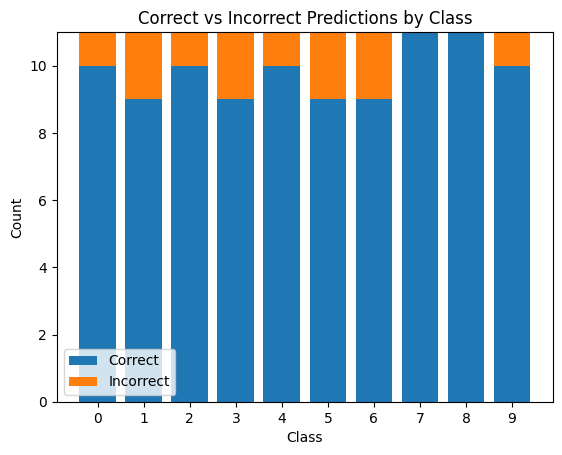

In [ ]:
plot_pedictions(classifier1,prediction_labels1, prediction_images1)

######Transformer Defenses

In [ ]:
from art.defences.transformer.evasion import DefensiveDistillation

In [ ]:
# Define the defense
defense = DefensiveDistillation(classifier=classifier1, batch_size=128, nb_epochs=20)

# Fit the defense
defense.fit(x_train, y_train)

# Get the transformed classifier
transformed_classifier = defense.classifier

[3 8 8 0 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 4 9 4 2 4 0 9 6 6 5 4 5 9 2 4
 9 9 5 4 6 5 6 0 9 3 8 7 2 9 8 2 3 8 8 7 7 5 3 7 6 6 9 2 1 2 3 7 2 8 8 0 2
 9 3 3 8 8 9 1 7 2 5 2 7 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 4 6 1 2 3 4 1 5]
Accuracy: 0.8909090909090909


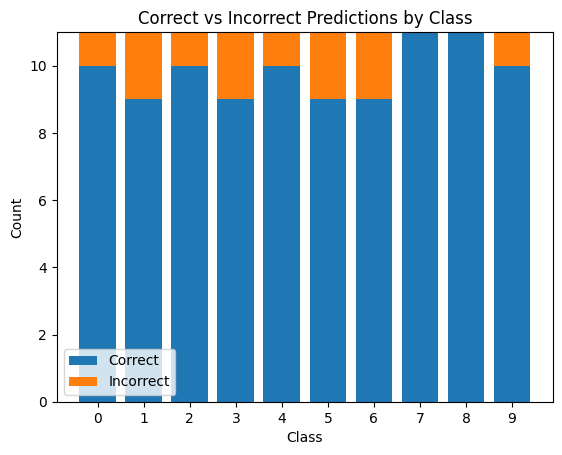

In [ ]:
plot_pedictions(transformed_classifier,prediction_labels1, prediction_images1)

###### Detector defenses: 

In [ ]:
# Create an adversarial trainer with Madry's PGD
classifier1.model.compile(optimizer="adam", loss="sparse_categorical_crossentropy")

trainer = AdversarialTrainerMadryPGD(classifier1, nb_epochs=6, eps=0.2, eps_step=0.1, batch_size=128)

# Fit the adversarial trainer on preprocessed data
trainer.fit(x_test_adv, prediction_labels)

Precompute adv samples:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial training epochs:   0%|          | 0/6 [00:00<?, ?it/s]

[3 8 8 0 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 4 9 5 2 4 0 9 6 6 5 4 5 9 2 4
 9 9 5 4 6 5 6 0 9 3 9 7 6 9 8 6 3 8 8 7 7 5 3 7 6 6 3 2 1 2 3 7 2 8 8 0 2
 9 3 3 8 8 9 1 7 2 5 2 7 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 4 6 1 2 3 4 1 5]
Accuracy: 0.9272727272727272


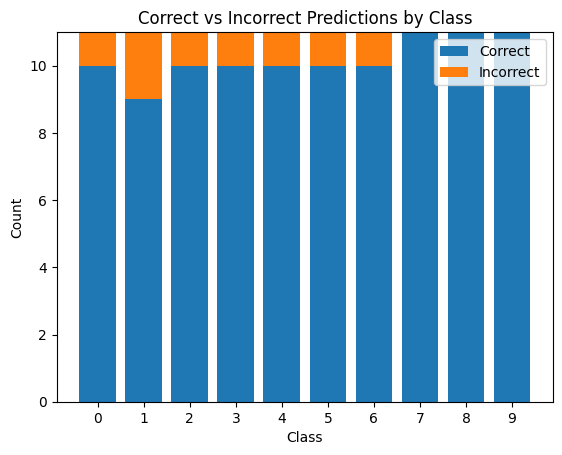

In [ ]:
plot_pedictions(classifier1,prediction_labels, x_test_adv)

###5 SpatialTransformation BB

In [ ]:
from art.attacks.evasion import SpatialTransformation

#### SpatialTransformation

In [ ]:
spatial = SpatialTransformation(classifier=classifier, num_translations=20, num_rotations=20, max_rotation = 15)

In [ ]:
spatial_adv = spatial.generate(prediction_images, prediction_labels)

Spatial transformation:   0%|          | 0/20 [00:00<?, ?it/s]

##### plots on Orginal model using adversial dataset generated using  SpatialTransformation Untargeted

[3 0 0 1 6 6 1 6 3 1 0 9 5 7 9 6 5 7 0 6 7 0 4 9 3 2 5 0 9 6 6 5 4 5 9 2 4
 1 9 5 1 6 5 6 0 9 3 9 7 6 9 8 0 3 8 8 7 7 3 3 7 5 6 3 2 1 2 3 7 3 0 8 0 2
 9 3 3 0 8 1 1 7 7 9 2 3 9 0 3 4 0 0 7 4 5 3 1 1 4 0 3 1 3 2 1 2 3 2 1 5]
Accuracy: 0.8090909090909091


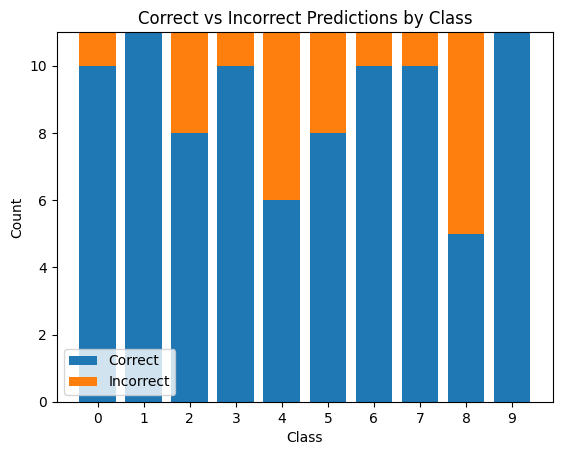

In [ ]:
plot_pedictions(classifier,prediction_labels,spatial_adv)

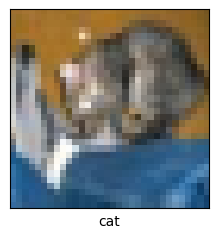

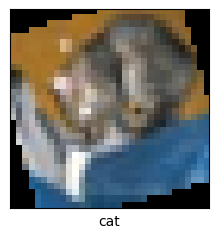

In [ ]:
show_image(prediction_images[0],[prediction_labels[0]])
show_image(spatial_adv[0],[prediction_labels[0]])

##### Defenses

In [ ]:
x_test_adv = spatial_adv

###### Preprocessing Defenses

In [ ]:
from art.defences.preprocessor import JpegCompression

[3 0 0 1 6 6 1 6 3 1 0 9 5 7 9 6 5 7 0 6 9 0 4 9 3 2 3 0 9 6 6 5 3 5 0 2 4
 1 9 5 1 6 5 6 0 9 3 1 4 6 9 8 4 3 8 9 7 7 5 3 7 3 6 3 2 1 2 3 7 3 0 8 0 2
 0 3 3 0 8 1 1 3 7 3 2 0 9 0 3 0 0 0 5 4 5 3 1 1 6 0 3 1 3 6 1 2 5 2 1 5]
Accuracy: 0.7090909090909091


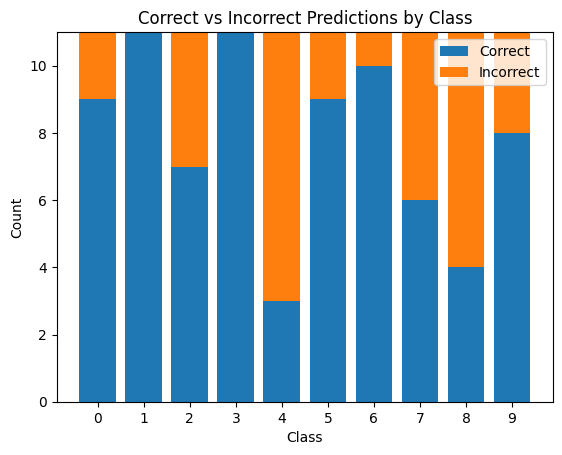

In [ ]:
# Apply preprocessor defense
preprocessor = JpegCompression(clip_values=(0,1),channels_first=True, apply_fit=True, apply_predict=True)
prediction_images1, prediction_labels1 = preprocessor(x_test_adv, prediction_labels)
plot_pedictions(classifier ,prediction_labels1, prediction_images1)  

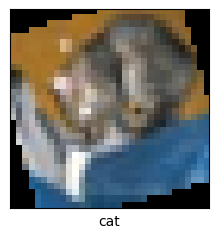

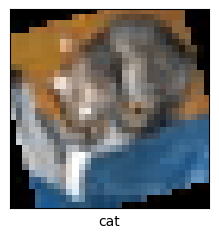

In [ ]:
show_image(x_test_adv[0],[prediction_labels[0]])
show_image(prediction_images1[0],[prediction_labels[0]])

###### Postprocessing Defenses

In [ ]:
from art.defences.postprocessor import GaussianNoise

[3 0 0 1 6 6 1 6 3 1 0 9 5 7 9 6 5 7 0 6 9 0 4 9 3 2 3 0 9 6 6 5 3 5 0 2 4
 1 9 5 1 6 5 6 0 9 3 1 4 6 9 8 4 3 8 9 7 7 5 3 7 3 6 3 2 1 2 3 7 3 0 8 0 2
 0 3 3 0 8 1 1 3 7 3 2 0 9 0 3 0 0 0 5 4 3 3 1 1 6 0 3 1 3 6 1 2 5 2 1 5]
Accuracy: 0.7090909090909091


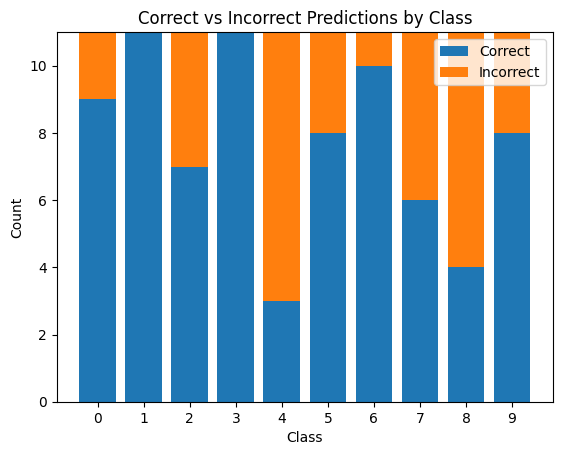

In [ ]:
# Define the postprocessing defense
noise = GaussianNoise(scale=0.2)
# Apply the defense to the classifier
classifier.postprocessing_defences = [noise]
plot_pedictions(classifier,prediction_labels1, prediction_images1)

######  Trainer Defenses

In [ ]:
from art.defences.trainer import AdversarialTrainerMadryPGD

In [ ]:
x_train_preprocessed, y_train_preprocessed = preprocessor(x_test,y_test)

In [ ]:
#Load the victim model
classifier_url = "https://tfhub.dev/deepmind/ganeval-cifar10-convnet/1"
IMAGE_SHAPE = (32, 32) 
classifier1 = KerasClassifier(model=tf.keras.Sequential([hub.KerasLayer(classifier_url, input_shape=IMAGE_SHAPE+(3,))]), clip_values=(0, 1))

In [ ]:
# Create an adversarial trainer with Madry's PGD
classifier1.model.compile(optimizer="adam", loss="sparse_categorical_crossentropy")

trainer = AdversarialTrainerMadryPGD(classifier1, nb_epochs=1, eps=0.1, eps_step=1, batch_size=16)

# Fit the adversarial trainer on preprocessed data
trainer.fit(x_train_preprocessed, y_train)

Precompute adv samples:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial training epochs:   0%|          | 0/1 [00:00<?, ?it/s]

[3 0 0 1 6 6 1 6 3 1 0 9 5 7 9 6 5 7 0 6 9 0 4 9 3 2 3 0 9 6 6 5 3 5 0 2 4
 1 9 5 1 6 5 6 0 9 3 1 4 6 9 8 4 3 8 9 7 7 5 3 7 3 6 3 2 1 2 3 7 3 0 8 0 2
 0 3 3 0 8 1 1 3 7 3 2 0 9 0 3 0 0 0 5 4 5 3 1 1 6 0 3 1 3 6 1 2 5 2 1 5]
Accuracy: 0.7090909090909091


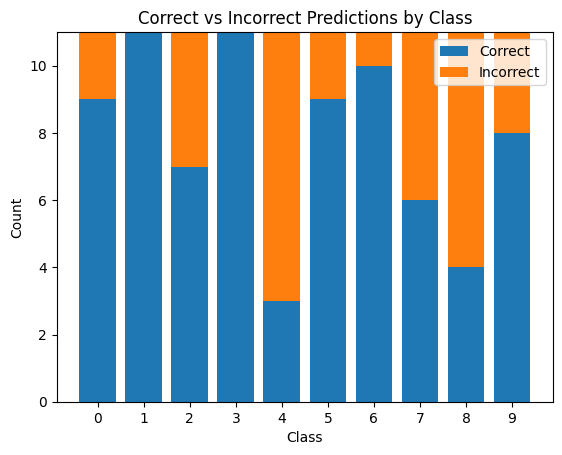

In [ ]:
plot_pedictions(classifier1,prediction_labels1, prediction_images1)

######Transformer Defenses

In [ ]:
from art.defences.transformer.evasion import DefensiveDistillation

In [ ]:
# Define the defense
defense = DefensiveDistillation(classifier=classifier1, batch_size=128, nb_epochs=20)

# Fit the defense
defense.fit(x_train, y_train)

# Get the transformed classifier
transformed_classifier = defense.classifier

[3 0 0 1 6 6 1 6 3 1 0 9 5 7 9 6 5 7 0 6 9 0 4 9 3 2 3 0 9 6 6 5 3 5 0 2 4
 1 9 5 1 6 5 6 0 9 3 1 4 6 9 8 4 3 8 9 7 7 5 3 7 3 6 3 2 1 2 3 7 3 0 8 0 2
 0 3 3 0 8 1 1 3 7 3 2 0 9 0 3 0 0 0 5 4 5 3 1 1 6 0 3 1 3 6 1 2 5 2 1 5]
Accuracy: 0.7090909090909091


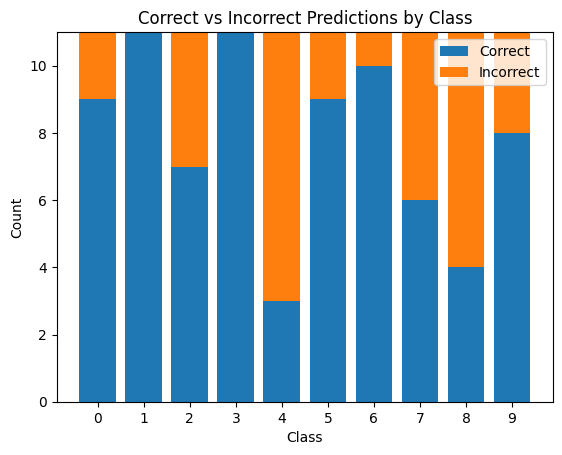

In [ ]:
plot_pedictions(transformed_classifier,prediction_labels1, prediction_images1)

###### Detector defenses: 

In [ ]:
# Create an adversarial trainer with Madry's PGD
classifier1.model.compile(optimizer="adam", loss="sparse_categorical_crossentropy")

trainer = AdversarialTrainerMadryPGD(classifier1, nb_epochs=6, eps=0.2, eps_step=0.1, batch_size=128)

# Fit the adversarial trainer on preprocessed data
trainer.fit(x_test_adv, prediction_labels)

Precompute adv samples:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial training epochs:   0%|          | 0/6 [00:00<?, ?it/s]

[3 0 0 1 6 6 1 6 3 1 0 9 5 7 9 6 5 7 0 6 7 0 4 9 3 2 5 0 9 6 6 5 4 5 9 2 4
 1 9 5 1 6 5 6 0 9 3 9 7 6 9 8 0 3 8 8 7 7 3 3 7 5 6 3 2 1 2 3 7 3 0 8 0 2
 9 3 3 0 8 1 1 7 7 9 2 3 9 0 3 4 0 0 7 4 5 3 1 1 4 0 3 1 3 2 1 2 3 2 1 5]
Accuracy: 0.8090909090909091


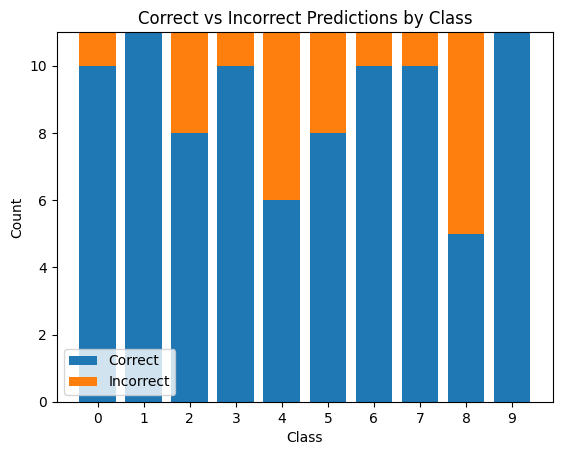

In [ ]:
plot_pedictions(classifier1,prediction_labels, x_test_adv)

###6 Geometric Decision-based BB


In [ ]:
from art.attacks.evasion import GeoDA

#### Geometric Decision-based

In [ ]:
geoda = GeoDA(estimator=classifier)

In [ ]:
geoda_adv = geoda.generate(prediction_images, prediction_labels)

##### plots on Orginal model using adversial dataset generated using  Geometric Decision-based Untargeted

[6 8 8 0 6 6 7 6 6 6 0 0 5 6 5 8 2 7 8 1 9 6 0 6 2 2 4 6 9 6 6 6 9 6 0 2 6
 9 9 2 4 6 5 1 0 9 6 6 4 1 9 6 5 6 6 2 2 6 5 3 6 5 0 3 2 1 2 3 0 6 8 8 0 6
 0 3 3 0 0 9 9 3 5 5 6 3 0 6 6 4 2 5 2 6 2 2 1 2 4 6 2 2 0 6 1 6 3 6 6 5]
Accuracy: 0.37272727272727274


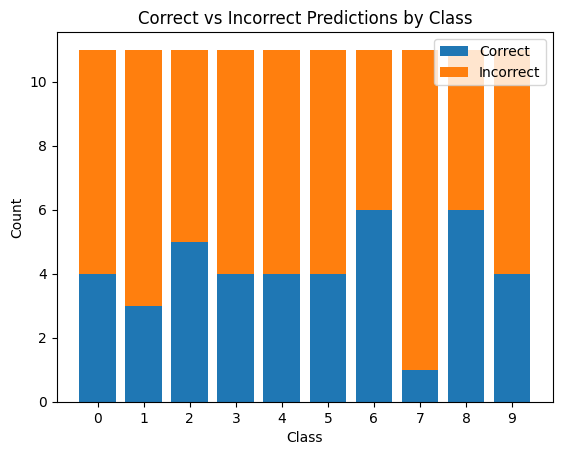

In [ ]:
plot_pedictions(classifier,prediction_labels,geoda_adv)

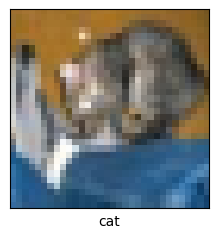

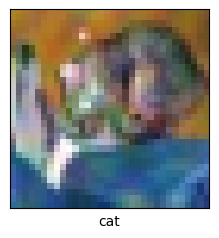

In [ ]:
show_image(prediction_images[0],[prediction_labels[0]])
show_image(geoda_adv[0],[prediction_labels[0]])

##### Defenses

In [ ]:
x_test_adv = geoda_adv

###### Preprocessing Defenses

In [ ]:
from art.defences.preprocessor import JpegCompression

[3 8 8 0 1 6 1 6 3 9 3 9 5 7 0 8 5 7 8 6 7 6 4 9 5 2 4 0 5 6 6 5 4 5 0 2 5
 9 9 5 4 6 5 6 0 9 3 8 4 6 9 8 5 3 8 8 7 7 5 3 7 3 0 1 2 8 2 3 7 2 8 8 0 2
 9 3 3 8 8 9 1 3 5 5 6 7 9 0 3 4 0 0 7 4 0 3 1 1 4 6 0 0 4 6 1 2 3 4 1 2]
Accuracy: 0.7


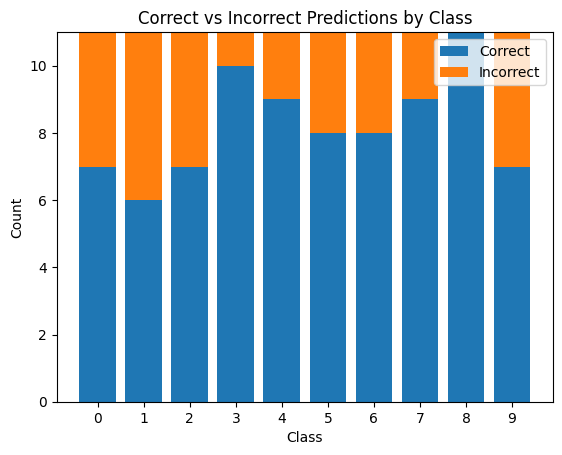

In [ ]:
# Apply preprocessor defense
preprocessor = JpegCompression(clip_values=(0,1),channels_first=True, apply_fit=True, apply_predict=True)
prediction_images1, prediction_labels1 = preprocessor(x_test_adv, prediction_labels)
plot_pedictions(classifier ,prediction_labels1, prediction_images1)  

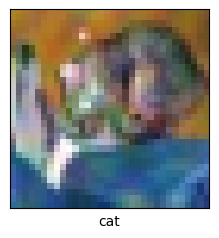

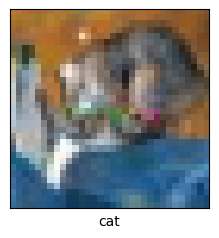

In [ ]:
show_image(x_test_adv[0],[prediction_labels[0]])
show_image(prediction_images1[0],[prediction_labels[0]])

###### Postprocessing Defenses

In [ ]:
from art.defences.postprocessor import GaussianNoise

[3 8 8 0 1 6 1 6 3 9 3 9 5 7 0 8 5 7 8 6 7 6 4 9 5 2 4 0 5 6 6 5 4 5 0 2 5
 9 9 5 4 1 5 6 0 9 3 8 4 1 9 8 5 3 8 3 7 7 5 3 7 3 6 1 6 8 2 3 7 2 8 8 0 2
 9 3 3 8 8 9 1 3 5 5 6 7 9 6 3 4 0 0 7 4 0 3 1 1 4 0 0 0 4 6 1 2 3 4 1 2]
Accuracy: 0.7181818181818181


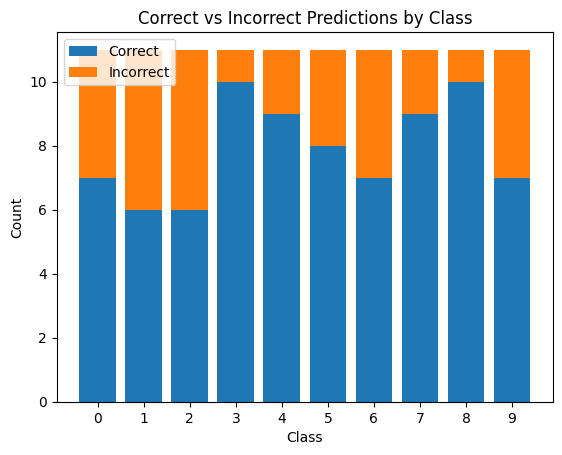

In [ ]:
# Define the postprocessing defense
noise = GaussianNoise(scale=0.2)
# Apply the defense to the classifier
classifier.postprocessing_defences = [noise]
plot_pedictions(classifier,prediction_labels1, prediction_images1)

######  Trainer Defenses

In [ ]:
from art.defences.trainer import AdversarialTrainerMadryPGD

In [ ]:
x_train_preprocessed, y_train_preprocessed = preprocessor(x_test,y_test)

In [ ]:
#Load the victim model
classifier_url = "https://tfhub.dev/deepmind/ganeval-cifar10-convnet/1"
IMAGE_SHAPE = (32, 32) 
classifier1 = KerasClassifier(model=tf.keras.Sequential([hub.KerasLayer(classifier_url, input_shape=IMAGE_SHAPE+(3,))]), clip_values=(0, 1))

In [ ]:
# Create an adversarial trainer with Madry's PGD
classifier1.model.compile(optimizer="adam", loss="sparse_categorical_crossentropy")

trainer = AdversarialTrainerMadryPGD(classifier1, nb_epochs=1, eps=0.1, eps_step=1, batch_size=16)

# Fit the adversarial trainer on preprocessed data
trainer.fit(x_train_preprocessed, y_train)

Precompute adv samples:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial training epochs:   0%|          | 0/1 [00:00<?, ?it/s]

[3 8 8 0 1 6 1 6 3 9 3 9 5 7 0 8 5 7 8 6 7 6 0 9 5 2 4 0 5 6 6 5 4 5 0 2 5
 9 9 5 4 6 5 6 0 9 3 8 4 1 9 8 5 3 8 8 7 7 5 3 7 3 0 1 6 8 2 3 7 2 8 8 0 2
 9 3 3 8 8 9 1 3 5 3 6 7 9 6 3 4 0 0 7 4 0 3 1 1 4 6 0 0 4 6 1 2 3 4 1 2]
Accuracy: 0.7


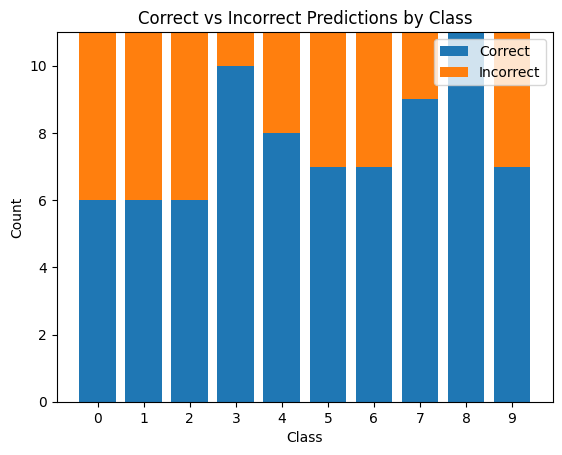

In [ ]:
plot_pedictions(classifier1,prediction_labels1, prediction_images1)

######Transformer Defenses

In [ ]:
from art.defences.transformer.evasion import DefensiveDistillation

In [ ]:
# Define the defense
defense = DefensiveDistillation(classifier=classifier1, batch_size=128, nb_epochs=20)

# Fit the defense
defense.fit(x_train, y_train)

# Get the transformed classifier
transformed_classifier = defense.classifier

[3 8 8 0 1 6 1 6 3 9 3 9 5 7 0 8 5 7 8 6 7 6 0 9 5 2 4 0 5 6 6 5 4 5 0 2 5
 9 9 5 4 6 5 6 0 9 3 8 4 1 9 8 5 3 8 8 7 7 5 3 7 3 0 1 6 8 2 3 7 2 8 8 0 2
 9 3 3 8 8 9 1 3 5 3 6 7 9 6 3 4 0 0 7 4 0 3 1 1 4 6 0 0 4 6 1 2 3 4 1 2]
Accuracy: 0.7


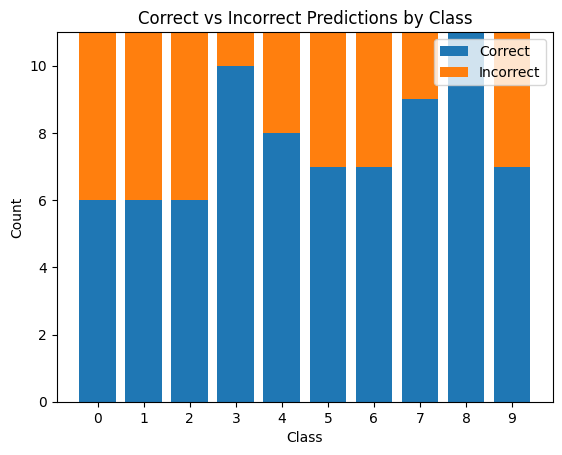

In [ ]:
plot_pedictions(transformed_classifier,prediction_labels1, prediction_images1)

###### Detector defenses: 

In [ ]:
# Create an adversarial trainer with Madry's PGD
classifier1.model.compile(optimizer="adam", loss="sparse_categorical_crossentropy")

trainer = AdversarialTrainerMadryPGD(classifier1, nb_epochs=6, eps=0.2, eps_step=0.1, batch_size=128)

# Fit the adversarial trainer on preprocessed data
trainer.fit(x_test_adv, prediction_labels)

Precompute adv samples:   0%|          | 0/1 [00:00<?, ?it/s]

Adversarial training epochs:   0%|          | 0/6 [00:00<?, ?it/s]

[6 0 8 0 1 6 1 0 6 1 0 9 6 6 6 8 2 7 8 1 9 6 0 6 2 2 5 6 9 6 6 6 9 5 9 2 6
 9 9 2 2 6 5 6 6 5 6 6 4 1 9 6 5 6 6 2 2 6 5 3 6 5 0 1 2 8 0 3 0 2 0 8 0 6
 0 3 3 0 0 9 9 3 5 7 6 3 0 6 6 6 2 0 2 6 2 2 1 2 4 6 2 2 0 6 1 6 3 6 0 2]
Accuracy: 0.3090909090909091


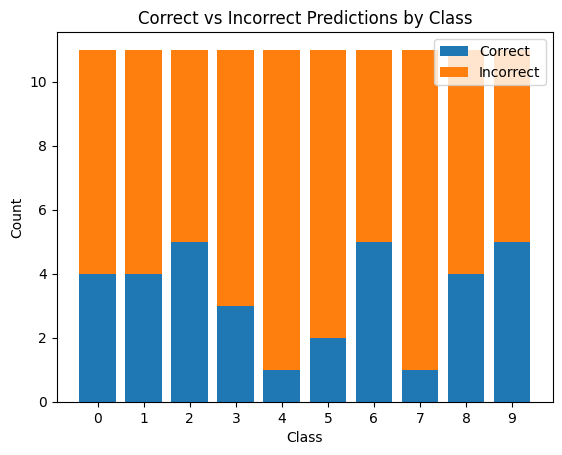

In [ ]:
plot_pedictions(classifier1,prediction_labels, x_test_adv)

##Not working or taking long time for execution 

###VirtualAdversarialMethod


In [ ]:
from art.attacks.evasion import VirtualAdversarialMethod

#### VirtualAdversarialMethod UnTargeted

In [ ]:
vam = VirtualAdversarialMethod(classifier=classifier)

In [ ]:
vam_adv = vam.generate(prediction_images, prediction_labels)

##### plots on Orginal model using adversial dataset generated using  VirtualAdversarialMethod Untargeted

In [ ]:
plot_pedictions(classifier,prediction_labels,vam_adv)

In [ ]:
show_image(prediction_images[0],[prediction_labels[0]])
show_image(vam_adv[0],[prediction_labels[0]])

###ThresholdAttack


In [ ]:
from art.attacks.evasion import ThresholdAttack

In [ ]:
!pip install cma

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 260.7/260.7 kB 21.1 MB/s eta 0:00:00


#### ThresholdAttack UnTargeted

In [ ]:
thresh = ThresholdAttack(classifier=classifier,th=.01)

In [ ]:
thresh_adv = thresh.generate(prediction_images, prediction_labels)

##### plots on Orginal model using adversial dataset generated using  ThresholdAttack Untargeted

In [ ]:
plot_pedictions(classifier,prediction_labels,thresh_adv)

In [ ]:
show_image(prediction_images[0],[prediction_labels[0]])
show_image(thresh_adv[0],[prediction_labels[0]])

#### ThresholdAttack Targeted

In [ ]:
thresh = ThresholdAttack(classifier=classifier,th=.01, targeted = True)

In [ ]:
thresh_adv = thresh.generate(prediction_images, prediction_labels)

##### plots on Orginal model using adversial dataset generated using  ThresholdAttack targeted

In [ ]:
plot_pedictions(classifier,prediction_labels,thresh_adv)

In [ ]:
show_image(prediction_images[0],[prediction_labels[0]])
show_image(thresh_adv[0],[prediction_labels[0]])

###PixelAttack


In [ ]:
from art.attacks.evasion import PixelAttack

#### PixelAttack UnTargeted

In [ ]:
pixel = PixelAttack(classifier=classifier, es=0)

In [ ]:
pixel_adv = pixel.generate(prediction_images, prediction_labels)

##### plots on Orginal model using adversial dataset generated using  PixelAttack Untargeted

In [ ]:
plot_pedictions(classifier,prediction_labels,pixel_adv)

In [ ]:
show_image(prediction_images[0],[prediction_labels[0]])
show_image(pixel_adv[0],[prediction_labels[0]])

#### PixelAttack Targeted

In [ ]:
pixel = PixelAttack(classifier=classifier,th=0.1, targeted = True)

In [ ]:
pixel_adv = thresh.generate(prediction_images, prediction_labels)

##### plots on Orginal model using adversial dataset generated using  PixelAttack targeted

In [ ]:
plot_pedictions(classifier,prediction_labels,pixel_adv)

In [ ]:
plot_pedictions(classifier,prediction_labels,pixel_adv)

###SimBA


In [ ]:
from art.attacks.evasion import SimBA

#### SimBA UnTargeted

In [ ]:
simba = SimBA(classifier=classifier)

In [ ]:
simba_adv = simba.generate(prediction_images, prediction_labels)

##### plots on Orginal model using adversial dataset generated using  SimBA Untargeted

In [ ]:
plot_pedictions(classifier,prediction_labels,simba_adv)

In [ ]:
show_image(prediction_images[0],[prediction_labels[0]])
show_image(simba_adv[0],[prediction_labels[0]])

## 1.3 Attack Transferability and Black-Box Attacks

In [ ]:
import numpy as np
import tensorflow as tf
import tensorflow_hub as hub
from art.estimators.classification import KerasClassifier
from art.utils import load_dataset
from sklearn.utils import shuffle

# Load the victim model
classifier_url = "https://tfhub.dev/deepmind/ganeval-cifar10-convnet/1"
IMAGE_SHAPE = (32, 32)
classifier = KerasClassifier(model=tf.keras.Sequential([hub.KerasLayer(classifier_url, input_shape=IMAGE_SHAPE+(3,))]), clip_values=(0, 1))

# Load the CIFAR-10 dataset and normalize the pixel values to be between 0 and 1
(x_train, y_train), (x_test, y_test), min_pixel_value, max_pixel_value = load_dataset("cifar10")
x_train, x_test = x_train / 255.0, x_test / 255.0

# Generate synthetic data for training a substitute model using Jacobian-based dataset augmentation
substitute_data = []
num_augmented_examples = 10000
num_original_examples = 50000
augment_ratio = num_augmented_examples // num_original_examples
for i in range(num_original_examples):
    image = x_train[i]
    label = y_train[i]
    substitute_data.append((image, label))
    for j in range(augment_ratio):
        target = np.zeros((1, 10))
        target[0, label] = 1
        jacobian = tf.gradients(classifier.model(image[np.newaxis, ...]), image)[0]
        perturbation = tf.sign(jacobian)
        perturbed_image = image + 0.5 * perturbation.numpy()
        substitute_data.append((perturbed_image, label))
#substitute_data = shuffle(substitute_data)

In [ ]:
substitute_x=[]
substitute_y=[]
for val in substitute_data:

  substitute_x.append(val[0])
  substitute_y.append(val[1])

In [ ]:
substitute_x = np.array(substitute_x)
substitute_y = np.array(substitute_y)

In [ ]:

substitute = tf.keras.Sequential([
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=IMAGE_SHAPE+(3,)),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(10, activation='softmax')
])
substitute.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])


In [ ]:
substitute.fit(substitute_x, substitute_y, epochs=15)

Train on 50000 samples
Epoch 1/15
50000/50000 [==============================] - 15s 300us/sample - loss: 2.3028 - accuracy: 0.0988
Epoch 2/15
50000/50000 [==============================] - 6s 113us/sample - loss: 2.3028 - accuracy: 0.0985
Epoch 3/15
50000/50000 [==============================] - 9s 180us/sample - loss: 2.3028 - accuracy: 0.0990
Epoch 4/15
50000/50000 [==============================] - 7s 144us/sample - loss: 2.3027 - accuracy: 0.1007
Epoch 5/15
50000/50000 [==============================] - 9s 175us/sample - loss: 2.3028 - accuracy: 0.0976
Epoch 6/15
50000/50000 [==============================] - 8s 160us/sample - loss: 2.3028 - accuracy: 0.0981
Epoch 7/15
50000/50000 [==============================] - 10s 191us/sample - loss: 2.3028 - accuracy: 0.0968
Epoch 8/15
50000/50000 [==============================] - 8s 164us/sample - loss: 2.3027 - accuracy: 0.0998
Epoch 9/15
50000/50000 [==============================] - 7s 144us/sample - loss: 2.3028 - accuracy: 0.0989
Epo

In [ ]:
substitute_classifier = KerasClassifier(model=substitute, clip_values=(0, 1))

In [ ]:
from art.attacks.evasion import FastGradientMethod
from art.attacks.evasion import AdversarialPatch
from art.attacks.evasion import ElasticNet

In [ ]:
# Define the FGM attack
attack = FastGradientMethod(estimator=substitute_classifier, eps=0.1, targeted=False)
x_test_adv = attack.generate(x=prediction_images)

In [ ]:
import numpy as np

patch_shape = (16, 16, 3)

attack = AdversarialPatch(classifier=substitute_classifier, patch_shape=patch_shape, targeted=False)

# Generate adversarial patches using the AdversarialPatch attack
adv_patches = attack.generate(prediction_images, y=tf.keras.utils.to_categorical(prediction_labels, 10))
# Apply the adversarial patches to the images
adv_images = attack.apply_patch(prediction_images, scale=0.3, patch_external=adv_patches[0])

Adversarial Patch Numpy:   0%|          | 0/500 [00:00<?, ?it/s]

In [ ]:
elastic_net = ElasticNet(classifier=substitute_classifier,batch_size=1,max_iter=5,learning_rate=0.3,)
elastic_adv = elastic_net.generate(prediction_images, prediction_labels)

EAD:   0%|          | 0/110 [00:00<?, ?it/s]

### Plots on Orginal model using orgnil classified test data set and adversial classified test dataset

/usr/local/lib/python3.10/dist-packages/keras/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


[3 8 8 0 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 4 9 5 2 4 0 9 6 6 5 4 5 9 2 4
 9 9 5 4 6 5 6 0 9 3 9 7 6 9 8 5 3 8 8 7 7 5 3 7 5 6 3 2 1 2 3 7 2 8 8 0 2
 9 3 3 8 8 9 1 7 2 5 2 7 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 4 6 1 2 3 4 1 5]
Accuracy: 0.9272727272727272


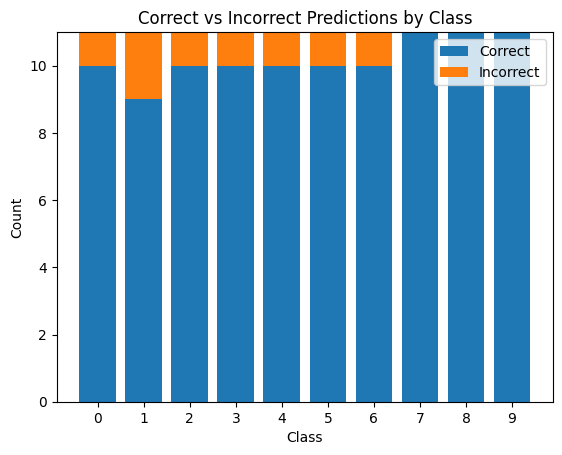

In [ ]:
plot_pedictions(classifier,prediction_labels,prediction_images)  

[6 1 6 2 6 6 6 6 6 6 6 9 6 7 9 6 6 2 8 6 6 6 6 9 6 2 6 6 6 6 6 6 6 6 6 6 6
 6 9 6 6 6 2 6 0 9 2 6 4 6 6 6 6 6 6 3 2 2 6 6 4 6 6 6 6 6 2 1 6 6 6 6 6 2
 6 6 6 8 6 6 1 6 2 6 6 6 6 6 6 6 3 0 4 6 6 3 6 1 4 6 6 1 6 3 6 2 6 6 1 5]
Accuracy: 0.3


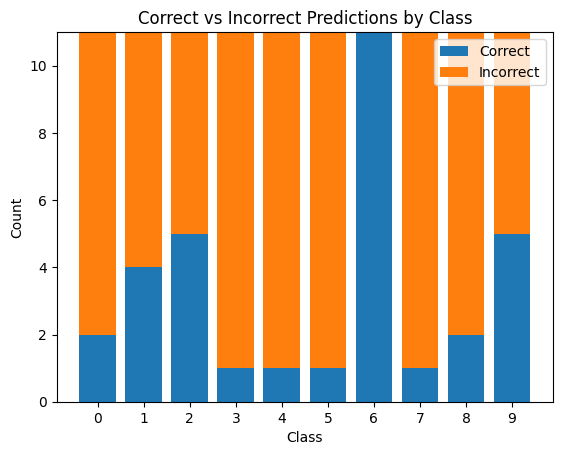

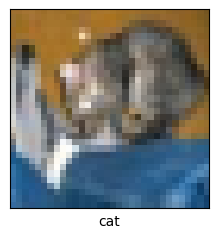

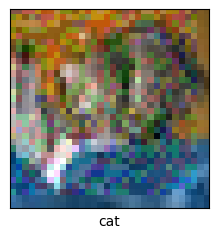

In [ ]:
plot_pedictions(classifier,prediction_labels,x_test_adv)  #using FGM White box evasion
show_image(prediction_images[0],[prediction_labels[0]])
show_image(x_test_adv[0],[prediction_labels[0]])

[3 8 8 0 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 2 9 4 2 4 0 9 6 6 5 4 5 9 2 7
 1 9 5 4 6 5 6 0 9 3 0 7 2 9 8 2 3 8 8 7 7 5 3 7 5 6 3 2 1 2 3 7 3 8 8 0 2
 9 3 3 8 8 1 1 7 2 5 2 2 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 4 6 1 2 3 4 1 5]
Accuracy: 0.8818181818181818


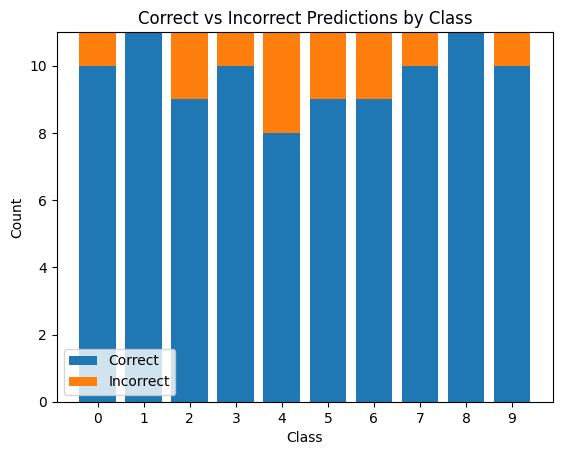

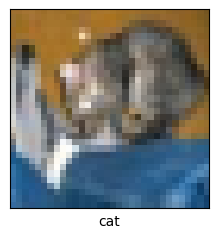

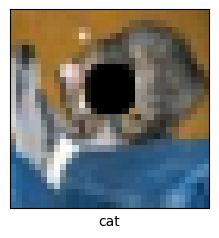

In [ ]:
plot_pedictions(classifier,prediction_labels,adv_images)  #using AdversarialPatch White box evasion
show_image(prediction_images[0],[prediction_labels[0]])
show_image(adv_images[0],[prediction_labels[0]])

[3 8 8 0 6 6 1 6 3 1 6 9 5 7 9 8 5 7 8 6 7 0 4 9 5 2 4 0 9 6 6 5 4 5 9 2 4
 9 9 5 4 6 5 6 0 9 3 9 7 6 9 8 0 3 8 8 7 7 5 3 7 5 6 3 2 1 2 3 7 2 8 8 1 2
 9 3 3 8 8 9 1 7 2 5 2 7 9 0 3 4 0 3 7 4 5 3 1 1 4 8 2 1 4 6 1 2 3 4 1 5]
Accuracy: 0.9


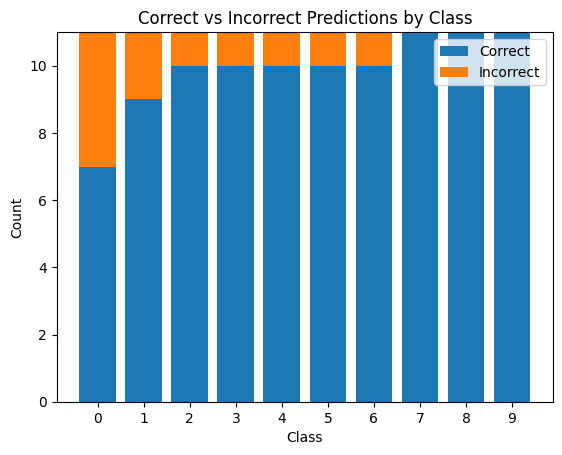

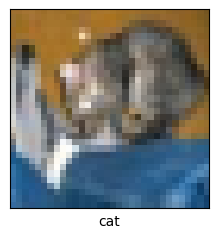

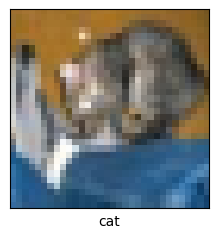

In [ ]:
plot_pedictions(classifier,prediction_labels,elastic_adv)  #using Elastic Net White box evasion
show_image(prediction_images[0],[prediction_labels[0]])
show_image(elastic_adv[0],[prediction_labels[0]])

## 1.4 A. Evasion Attacks on Text data

In [ ]:
import numpy as np
from tensorflow import keras
from tensorflow.keras import layers

max_features = 20000  # Only consider the top 20k words
maxlen = 200  # Only consider the first 200 words of each movie review

In [ ]:
(x_train, y_train), (x_val, y_val) = keras.datasets.imdb.load_data(num_words=max_features)
print(len(x_train), "Training sequences")
print(len(x_val), "Validation sequences")
x_train = keras.preprocessing.sequence.pad_sequences(x_train, maxlen=maxlen)
x_val = keras.preprocessing.sequence.pad_sequences(x_val, maxlen=maxlen)

25000 Training sequences
25000 Validation sequences


In [ ]:
prediction_x=[]
prediction_y=[]

classes_to_predict_new= {}
for i in range(2):
     classes_to_predict_new.update({i:[]})


for x,y in zip(x_val,y_val):
  if len(classes_to_predict_new[y])<100:
    prediction_x.append(x)
    prediction_y.append(y)
    classes_to_predict_new[y].append(x)

prediction_x = np.array(prediction_x)
prediction_y = np.array(prediction_y)
print(prediction_y)

[0 1 1 0 1 1 1 0 0 1 1 0 0 0 1 0 1 0 0 0 1 1 1 1 1 1 0 1 1 0 1 1 0 0 0 0 1
 1 0 0 1 1 0 1 1 1 0 0 0 1 0 0 1 1 1 1 1 1 0 0 0 0 1 0 0 1 0 1 1 1 1 1 1 0
 0 0 0 1 0 0 1 0 1 1 0 0 0 1 0 1 1 1 0 1 1 0 1 1 0 0 1 1 0 0 0 0 0 0 1 1 1
 0 0 0 0 0 1 0 1 1 0 0 0 1 1 1 1 0 0 0 1 0 0 1 1 0 0 0 0 0 1 0 1 0 0 1 1 0
 1 0 0 0 0 1 0 1 0 1 0 1 0 0 0 0 1 0 0 1 0 0 0 1 0 1 1 0 1 0 0 0 0 0 0 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]


In [ ]:
# Input for variable-length sequences of integers
inputs = keras.Input(shape=(None,), dtype="int32")
# Embed each integer in a 128-dimensional vector
x = layers.Embedding(max_features, 128)(inputs)
# Add 2 bidirectional LSTMs
x = layers.Bidirectional(layers.LSTM(64, return_sequences=True))(x)
x = layers.Bidirectional(layers.LSTM(64))(x)
# Add a classifier
outputs = layers.Dense(1, activation="sigmoid")(x)
model = keras.Model(inputs, outputs)
model.summary()

Model: "model_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, None)]            0         
                                                                 
 embedding_5 (Embedding)     (None, None, 128)         2560000   
                                                                 
 bidirectional_10 (Bidirecti  (None, None, 128)        98816     
 onal)                                                           
                                                                 
 bidirectional_11 (Bidirecti  (None, 128)              98816     
 onal)                                                           
                                                                 
 dense_5 (Dense)             (None, 1)                 129       
                                                                 
Total params: 2,757,761
Trainable params: 2,757,761
Non-tra

In [ ]:
model.compile("adam", "binary_crossentropy", metrics=["accuracy"])
model.fit(x_train, y_train, batch_size=250, epochs=3, validation_split=0.2)

Train on 20000 samples, validate on 5000 samples
Epoch 1/3
20000/20000 [==============================] - ETA: 0s - loss: 0.4838 - accuracy: 0.7519

/usr/local/lib/python3.9/dist-packages/keras/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates


20000/20000 [==============================] - 75s 4ms/sample - loss: 0.4838 - accuracy: 0.7519 - val_loss: 0.3369 - val_accuracy: 0.8538
Epoch 2/3
20000/20000 [==============================] - 70s 3ms/sample - loss: 0.2062 - accuracy: 0.9217 - val_loss: 0.3203 - val_accuracy: 0.8704
Epoch 3/3
20000/20000 [==============================] - 69s 3ms/sample - loss: 0.1270 - accuracy: 0.9564 - val_loss: 0.3797 - val_accuracy: 0.8708


In [ ]:
#Fuction to plot correct preditions and accuracy for a model 
import matplotlib.pyplot as plt

def plot_pedictions(model,prediction_y,prediction_x):
  # Make predictions on the test data
  predictions = model.predict(prediction_x).reshape(1,-1)[0]
  # Get the predicted classes
  predicted_classes=np.round(predictions).flatten()
  accuracy = np.sum(predicted_classes == prediction_y) / len(prediction_y)
  print("Accuracy:", accuracy)

  # Make predictions on the test data
  x_test=prediction_x
  y_test=prediction_y
  y_pred = predicted_classes
  # Compute the number of correct and incorrect predictions in each class
  correct_0 = np.sum((y_test == 0) & (y_pred == 0))
  correct_1 = np.sum((y_test == 1) & (y_pred == 1))
  incorrect_0 = np.sum((y_test == 0) & (y_pred == 1))
  incorrect_1 = np.sum((y_test == 1) & (y_pred == 0))
  # Plot the results
  fig, ax = plt.subplots()
  ax.bar([0, 1], [correct_0, correct_1], label='Correct', color='green')
  ax.bar([0, 1], [incorrect_0, incorrect_1], label='Incorrect', bottom=[correct_0, correct_1], color='red')
  ax.set_xticks([0, 1])
  ax.set_xticklabels(['Negative', 'Positive'])
  ax.set_xlabel('True label')
  ax.set_ylabel('Number of predictions')
  ax.set_title('Number of correct and incorrect predictions')
  ax.legend()
  plt.show()

### Plots on Orginal model using orgnil classified test data set

/usr/local/lib/python3.9/dist-packages/keras/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


Accuracy: 0.86


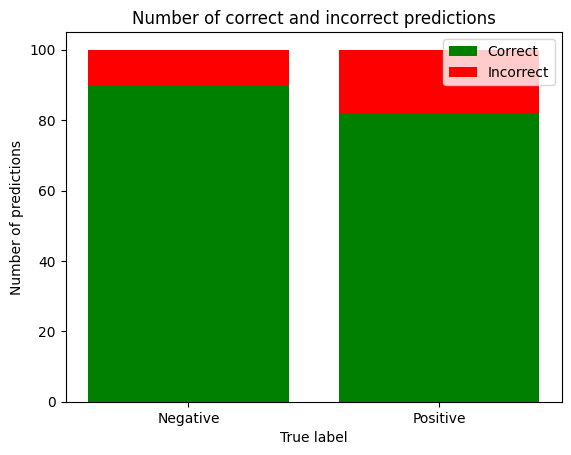

In [ ]:
plot_pedictions(model,prediction_y,prediction_x)

### Implementing adversial attack on text classifier

In [ ]:
# Choose a clean input data point from the validation set
input_data = prediction_x[0]
#test_data[0:1]

# Define a custom loss function that computes the Jacobian matrix
def jacobian_loss(y_true, y_pred):
    # Compute the Jacobian matrix of the model's output with respect to the input data
    grads = keras.backend.gradients(y_pred, inputs)[0]
    # Compute the Jacobian matrix by flattening the gradients
    jacobian = keras.backend.batch_flatten(grads)
    return jacobian

In [ ]:
from itertools import permutations
def imdb_attack(model, input_data, prediction_true, max_epoches , epsilon):
  epoch = 1
  pertributed_data = input_data
  jacobian = model.predict(input_data.reshape(1,-1), verbose=0, callbacks=[keras.callbacks.LambdaCallback(on_epoch_end=lambda epoch, logs: print(jacobian_loss(prediction_true, model(pertributed_data))))])
  while np.round(model.predict(pertributed_data.reshape(1,-1)))[0][0]  == prediction_true:
    if epoch == max_epoches:
      break
    perturbation = epsilon * np.sign(jacobian)
    pertributed_data = perturbation + pertributed_data
    epoch=epoch+1
  if np.round(model.predict(pertributed_data.reshape(1,-1)))[0][0]  != prediction_true:
    print('Advisary generated')
  else:
    print('Advisary failed')
  return pertributed_data

In [ ]:
from tqdm import tqdm
adv_data = [imdb_attack(model, input_data, prediction_true, 20 , 0.1).reshape(200,-1) for input_data,prediction_true in tqdm(zip(prediction_x,prediction_y))]


0it [00:00, ?it/s]
1it [00:01,  1.96s/it]

Advisary generated



2it [00:04,  2.11s/it]

Advisary failed



3it [00:06,  2.15s/it]

Advisary failed



4it [00:08,  2.17s/it]

Advisary failed



5it [00:10,  2.17s/it]

Advisary failed



6it [00:13,  2.45s/it]

Advisary failed



7it [00:15,  2.37s/it]

Advisary failed



8it [00:18,  2.32s/it]

Advisary failed



9it [00:18,  1.69s/it]

Advisary generated



10it [00:20,  1.83s/it]

Advisary failed



11it [00:22,  1.93s/it]

Advisary failed



12it [00:24,  1.92s/it]

Advisary generated



13it [00:27,  2.07s/it]

Advisary failed



14it [00:28,  1.86s/it]

Advisary generated



15it [00:30,  1.96s/it]

Advisary failed



16it [00:31,  1.76s/it]

Advisary generated



17it [00:34,  1.89s/it]

Advisary failed



18it [00:35,  1.76s/it]

Advisary generated



19it [00:38,  2.09s/it]

Advisary failed



20it [00:39,  1.84s/it]

Advisary generated



21it [00:41,  1.68s/it]

Advisary generated



22it [00:42,  1.56s/it]

Advisary generated



23it [00:43,  1.48s/it]

Advisary generated



24it [00:45,  1.68s/it]

Advisary failed



25it [00:46,  1.28s/it]

Advisary generated



26it [00:48,  1.71s/it]

Advisary failed



27it [00:50,  1.67s/it]

Advisary generated



28it [00:52,  1.82s/it]

Advisary failed



29it [00:54,  1.94s/it]

Advisary failed



30it [00:56,  1.74s/it]

Advisary generated



31it [00:58,  1.87s/it]

Advisary failed



32it [00:58,  1.40s/it]

Advisary generated



33it [01:01,  1.82s/it]

Advisary failed



34it [01:02,  1.71s/it]

Advisary generated



35it [01:04,  1.59s/it]

Advisary generated



36it [01:05,  1.50s/it]

Advisary generated



37it [01:07,  1.70s/it]

Advisary failed



38it [01:08,  1.58s/it]

Advisary generated



39it [01:10,  1.50s/it]

Advisary generated



40it [01:11,  1.44s/it]

Advisary generated



41it [01:13,  1.58s/it]

Advisary generated



42it [01:15,  1.83s/it]

Advisary failed



43it [01:17,  1.94s/it]

Advisary failed



44it [01:20,  2.02s/it]

Advisary failed



45it [01:22,  2.07s/it]

Advisary failed



46it [01:24,  2.21s/it]

Advisary failed



47it [01:26,  2.08s/it]

Advisary generated



48it [01:28,  2.12s/it]

Advisary failed



49it [01:31,  2.14s/it]

Advisary failed



50it [01:31,  1.59s/it]

Advisary generated



51it [01:32,  1.50s/it]

Advisary generated



52it [01:33,  1.44s/it]

Advisary generated



53it [01:36,  1.66s/it]

Advisary failed



54it [01:39,  2.05s/it]

Advisary failed



55it [01:41,  2.09s/it]

Advisary failed



56it [01:41,  1.56s/it]

Advisary generated



57it [01:43,  1.73s/it]

Advisary failed



58it [01:45,  1.87s/it]

Advisary failed



59it [01:48,  1.96s/it]

Advisary failed



60it [01:50,  1.94s/it]

Advisary generated



61it [01:51,  1.82s/it]

Advisary generated



62it [01:52,  1.66s/it]

Advisary generated



63it [01:54,  1.81s/it]

Advisary failed



64it [01:56,  1.66s/it]

Advisary generated



65it [01:57,  1.55s/it]

Advisary generated



66it [01:58,  1.47s/it]

Advisary generated



67it [01:59,  1.12s/it]

Advisary generated



68it [02:01,  1.58s/it]

Advisary failed



69it [02:04,  1.86s/it]

Advisary failed



70it [02:06,  1.96s/it]

Advisary failed



71it [02:08,  2.02s/it]

Advisary failed



72it [02:10,  2.08s/it]

Advisary failed



73it [02:13,  2.18s/it]

Advisary failed



74it [02:15,  2.09s/it]

Advisary generated



75it [02:16,  1.85s/it]

Advisary generated



76it [02:16,  1.40s/it]

Advisary generated



77it [02:18,  1.63s/it]

Advisary failed



78it [02:20,  1.53s/it]

Advisary generated



79it [02:21,  1.47s/it]

Advisary generated



80it [02:22,  1.42s/it]

Advisary generated



81it [02:23,  1.09s/it]

Advisary generated



82it [02:25,  1.49s/it]

Advisary failed



83it [02:28,  1.87s/it]

Advisary failed



84it [02:28,  1.40s/it]

Advisary generated



85it [02:30,  1.37s/it]

Advisary generated



86it [02:31,  1.36s/it]

Advisary generated



87it [02:32,  1.34s/it]

Advisary generated



88it [02:34,  1.59s/it]

Advisary failed



89it [02:36,  1.51s/it]

Advisary generated



90it [02:37,  1.50s/it]

Advisary generated



91it [02:40,  1.90s/it]

Advisary failed



92it [02:42,  1.99s/it]

Advisary failed



93it [02:43,  1.78s/it]

Advisary generated



94it [02:45,  1.64s/it]

Advisary generated



95it [02:47,  1.81s/it]

Advisary failed



96it [02:49,  1.98s/it]

Advisary failed



97it [02:52,  2.23s/it]

Advisary failed



98it [02:54,  2.21s/it]

Advisary failed



99it [02:56,  1.93s/it]

Advisary generated



100it [02:57,  1.74s/it]

Advisary generated



101it [02:57,  1.31s/it]

Advisary generated



102it [02:58,  1.01s/it]

Advisary generated



103it [03:00,  1.36s/it]

Advisary failed



104it [03:01,  1.36s/it]

Advisary generated



105it [03:03,  1.55s/it]

Advisary generated



106it [03:05,  1.76s/it]

Advisary failed



107it [03:07,  1.62s/it]

Advisary generated



108it [03:08,  1.53s/it]

Advisary generated



109it [03:10,  1.71s/it]

Advisary failed



110it [03:12,  1.86s/it]

Advisary failed



111it [03:14,  1.75s/it]

Advisary generated



112it [03:17,  2.06s/it]

Advisary failed



113it [03:17,  1.54s/it]

Advisary generated



114it [03:17,  1.17s/it]

Advisary generated



115it [03:19,  1.46s/it]

Advisary failed



116it [03:21,  1.42s/it]

Advisary generated



117it [03:23,  1.65s/it]

Advisary failed



118it [03:24,  1.54s/it]

Advisary generated



119it [03:27,  1.90s/it]

Advisary failed



120it [03:29,  2.09s/it]

Advisary failed



121it [03:31,  1.85s/it]

Advisary generated



122it [03:31,  1.40s/it]

Advisary generated



123it [03:32,  1.36s/it]

Advisary generated



124it [03:34,  1.60s/it]

Advisary failed



125it [03:37,  1.77s/it]

Advisary failed



126it [03:39,  2.09s/it]

Advisary failed



127it [03:40,  1.60s/it]

Advisary generated



128it [03:42,  1.77s/it]

Advisary failed



129it [03:44,  1.89s/it]

Advisary failed



130it [03:46,  1.71s/it]

Advisary generated



131it [03:47,  1.59s/it]

Advisary generated



132it [03:49,  1.76s/it]

Advisary failed



133it [03:51,  1.70s/it]

Advisary generated



134it [03:53,  2.02s/it]

Advisary failed



135it [03:54,  1.51s/it]

Advisary generated



136it [03:55,  1.44s/it]

Advisary generated



137it [03:56,  1.41s/it]

Advisary generated



138it [03:58,  1.38s/it]

Advisary generated



139it [03:59,  1.36s/it]

Advisary generated



140it [04:00,  1.34s/it]

Advisary generated



141it [04:03,  1.65s/it]

Advisary failed



142it [04:05,  1.75s/it]

Advisary generated



143it [04:07,  1.87s/it]

Advisary failed



144it [04:09,  1.96s/it]

Advisary failed



145it [04:11,  2.03s/it]

Advisary failed



146it [04:11,  1.52s/it]

Advisary generated



147it [04:12,  1.16s/it]

Advisary generated



148it [04:12,  1.11it/s]

Advisary generated



149it [04:14,  1.29s/it]

Advisary failed



150it [04:16,  1.47s/it]

Advisary generated



151it [04:18,  1.74s/it]

Advisary failed



152it [04:20,  1.60s/it]

Advisary generated



153it [04:20,  1.22s/it]

Advisary generated



154it [04:22,  1.51s/it]

Advisary failed



155it [04:23,  1.15s/it]

Advisary generated



156it [04:25,  1.46s/it]

Advisary failed



157it [04:27,  1.74s/it]

Advisary failed



158it [04:30,  2.06s/it]

Advisary failed



159it [04:31,  1.83s/it]

Advisary generated



160it [04:33,  1.68s/it]

Advisary generated



161it [04:34,  1.56s/it]

Advisary generated



162it [04:35,  1.48s/it]

Advisary generated



163it [04:37,  1.70s/it]

Advisary failed



164it [04:39,  1.57s/it]

Advisary generated



165it [04:42,  2.01s/it]

Advisary failed



166it [04:44,  2.06s/it]

Advisary failed



167it [04:46,  2.09s/it]

Advisary failed



168it [04:46,  1.56s/it]

Advisary generated



169it [04:48,  1.74s/it]

Advisary failed



170it [04:50,  1.61s/it]

Advisary generated



171it [04:51,  1.52s/it]

Advisary generated



172it [04:54,  1.96s/it]

Advisary failed



173it [04:55,  1.76s/it]

Advisary generated



174it [04:58,  1.90s/it]

Advisary failed



175it [04:58,  1.43s/it]

Advisary generated



176it [04:59,  1.39s/it]

Advisary generated



177it [05:00,  1.07s/it]

Advisary generated



178it [05:02,  1.39s/it]

Advisary failed



179it [05:04,  1.72s/it]

Advisary failed



180it [05:06,  1.75s/it]

Advisary generated



181it [05:08,  1.87s/it]

Advisary failed



182it [05:09,  1.70s/it]

Advisary generated



183it [05:10,  1.28s/it]

Advisary generated



184it [05:12,  1.55s/it]

Advisary failed



185it [05:12,  1.18s/it]

Advisary generated



186it [05:15,  1.50s/it]

Advisary failed



187it [05:16,  1.49s/it]

Advisary generated



188it [05:16,  1.19s/it]

Advisary generated



189it [05:19,  1.64s/it]

Advisary failed



190it [05:21,  1.80s/it]

Advisary failed



191it [05:23,  1.66s/it]

Advisary generated



192it [05:25,  1.82s/it]

Advisary failed



193it [05:25,  1.37s/it]

Advisary generated



194it [05:27,  1.63s/it]

Advisary failed



195it [05:30,  2.04s/it]

Advisary failed



196it [05:33,  2.09s/it]

Advisary failed



197it [05:34,  1.86s/it]

Advisary generated



198it [05:36,  1.96s/it]

Advisary failed



199it [05:37,  1.76s/it]

Advisary generated



200it [05:39,  1.70s/it]

Advisary generated


In [ ]:
adv_data = np.array(adv_data).reshape(-1,200)

### Plots on Orginal model using adversial classified test dataset

Accuracy: 0.475


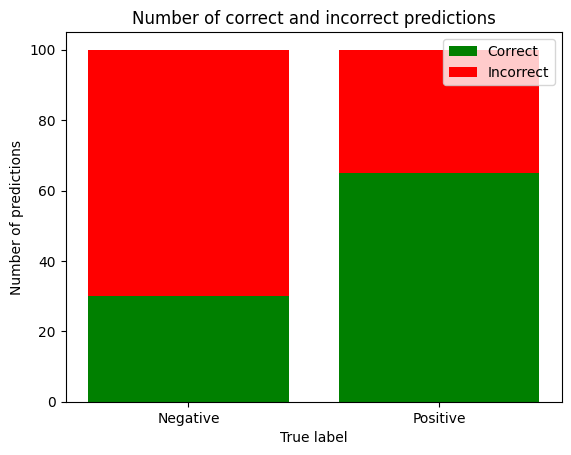

In [ ]:
plot_pedictions(model,prediction_y,adv_data)

## 1.4 B. Evasion Attacks on Text data

In [ ]:
!pip3 install textattack[tensorflow]

In [ ]:
import torch
import transformers
from textattack.datasets import Dataset
from textattack.models.wrappers import ModelWrapper
from textattack.attack_recipes import TextFoolerJin2019
from textattack.models.wrappers import HuggingFaceModelWrapper

textattack: Updating TextAttack package dependencies.
textattack: Downloading NLTK required packages.
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package omw to /root/nltk_data...
[nltk_data] Downloading package universal_tagset to /root/nltk_data...
[nltk_data]   Unzipping taggers/universal_tagset.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


In [ ]:
model = transformers.AutoModelForSequenceClassification.from_pretrained(
    "textattack/bert-base-uncased-imdb")
tokenizer = transformers.AutoTokenizer.from_pretrained(
    "textattack/bert-base-uncased-imdb")

In [ ]:
from textattack.datasets import HuggingFaceDataset


dataset = HuggingFaceDataset("imdb", None, "test")

Generating train split:   0%|          | 0/25000 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/25000 [00:00<?, ? examples/s]

Generating unsupervised split:   0%|          | 0/50000 [00:00<?, ? examples/s]

Dataset imdb downloaded and prepared to /root/.cache/huggingface/datasets/imdb/plain_text/1.0.0/2fdd8b9bcadd6e7055e742a706876ba43f19faee861df134affd7a3f60fc38a1. Subsequent calls will reuse this data.


  0%|          | 0/3 [00:00<?, ?it/s]

textattack: Loading datasets dataset imdb, split test.


In [ ]:
prediction_x=[]
prediction_y=[]

classes_to_predict_new= {}
for i in range(2):
     classes_to_predict_new.update({i:[]})


for x,y in dataset:
  if len(classes_to_predict_new[y])<25:
    prediction_x.append(x['text'])
    prediction_y.append(y)
    classes_to_predict_new[y].append(x)

In [ ]:
import matplotlib.pyplot as plt

# Define a function to preprocess the data and make predictions
def predict(review):
    # Tokenize the review
    encoded_review = tokenizer.encode_plus(
        review,
        max_length=512,
        padding='max_length',
        truncation=True,
        return_attention_mask=True,
        return_tensors='pt'
    )
    if torch.cuda.is_available():
       encoded_review = encoded_review.to('cuda')
    # Make a prediction
    outputs = model(**encoded_review)
    predicted_label = torch.argmax(outputs.logits)
    #print(encoded_review,predicted_label.item())
    return predicted_label.item()

def plot_pedictions(prediction_y,prediction_x):
  correct_0 = 0
  correct_1 = 0
  incorrect_0 = 0
  incorrect_1 = 0
  for review, y in zip(prediction_x, prediction_y):
    if predict(review)==y:
      if y == 0:
        correct_0 = correct_0+1
      else:
        correct_1 = correct_1+1
    else:
      if y == 0:
        incorrect_0 = incorrect_0+1
      else:
        incorrect_1 = incorrect_1+1
  print("Accuracy:", (correct_0+correct_1)/len(prediction_y))
  fig, ax = plt.subplots()
  ax.bar([0, 1], [correct_0, correct_1], label='Correct', color='green')
  ax.bar([0, 1], [incorrect_0, incorrect_1], label='Incorrect', bottom=[correct_0, correct_1], color='red')
  ax.set_xticks([0, 1])
  ax.set_xticklabels(['Negative', 'Positive'])
  ax.set_xlabel('True label')
  ax.set_ylabel('Number of predictions')
  ax.set_title('Number of correct and incorrect predictions')
  ax.legend()
  plt.show() 


Accuracy: 0.94


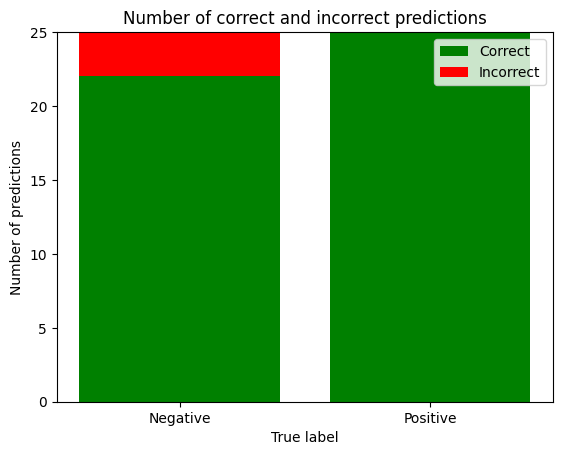

In [ ]:
plot_pedictions(prediction_y,prediction_x)

In [ ]:
# Create a custom dataset with three examples
examples = []
for x,y in zip(prediction_x,prediction_y):
  examples.append((x,y))
dataset1 = Dataset(examples)

In [ ]:
model_wrapper = HuggingFaceModelWrapper(model, tokenizer)

In [ ]:
from textattack import Attack
from textattack import Attacker
from textattack import AttackArgs
from textattack.constraints.grammaticality import PartOfSpeech
from textattack.constraints.pre_transformation import (
    InputColumnModification,
    RepeatModification,
    StopwordModification,
)
from textattack.constraints.semantics import WordEmbeddingDistance
from textattack.constraints.semantics.sentence_encoders import UniversalSentenceEncoder
from textattack.goal_functions import UntargetedClassification
from textattack.search_methods import GreedyWordSwapWIR
from textattack.transformations import WordSwapEmbedding

In [ ]:
#1) Design TextFooler Transformation 
transformation = WordSwapEmbedding(max_candidates=50)

#2) Design TextFooler Constraints RepeatModification, InputColumnModification, UniversalSentenceEncoder
stopwords = set(
            ["a", "about", "above", "across", "after", "afterwards", "again", "against", "ain", "all", "almost", "alone", "along", "already", "also", "although", "am", "among", "amongst", "an", "and", "another", "any", "anyhow", "anyone", "anything", "anyway", "anywhere", "are", "aren", "aren't", "around", "as", "at", "back", "been", "before", "beforehand", "behind", "being", "below", "beside", "besides", "between", "beyond", "both", "but", "by", "can", "cannot", "could", "couldn", "couldn't", "d", "didn", "didn't", "doesn", "doesn't", "don", "don't", "down", "due", "during", "either", "else", "elsewhere", "empty", "enough", "even", "ever", "everyone", "everything", "everywhere", "except", "first", "for", "former", "formerly", "from", "hadn", "hadn't", "hasn", "hasn't", "haven", "haven't", "he", "hence", "her", "here", "hereafter", "hereby", "herein", "hereupon", "hers", "herself", "him", "himself", "his", "how", "however", "hundred", "i", "if", "in", "indeed", "into", "is", "isn", "isn't", "it", "it's", "its", "itself", "just", "latter", "latterly", "least", "ll", "may", "me", "meanwhile", "mightn", "mightn't", "mine", "more", "moreover", "most", "mostly", "must", "mustn", "mustn't", "my", "myself", "namely", "needn", "needn't", "neither", "never", "nevertheless", "next", "no", "nobody", "none", "noone", "nor", "not", "nothing", "now", "nowhere", "o", "of", "off", "on", "once", "one", "only", "onto", "or", "other", "others", "otherwise", "our", "ours", "ourselves", "out", "over", "per", "please", "s", "same", "shan", "shan't", "she", "she's", "should've", "shouldn", "shouldn't", "somehow", "something", "sometime", "somewhere", "such", "t", "than", "that", "that'll", "the", "their", "theirs", "them", "themselves", "then", "thence", "there", "thereafter", "thereby", "therefore", "therein", "thereupon", "these", "they", "this", "those", "through", "throughout", "thru", "thus", "to", "too", "toward", "towards", "under", "unless", "until", "up", "upon", "used", "ve", "was", "wasn", "wasn't", "we", "were", "weren", "weren't", "what", "whatever", "when", "whence", "whenever", "where", "whereafter", "whereas", "whereby", "wherein", "whereupon", "wherever", "whether", "which", "while", "whither", "who", "whoever", "whole", "whom", "whose", "why", "with", "within", "without", "won", "won't", "would", "wouldn", "wouldn't", "y", "yet", "you", "you'd", "you'll", "you're", "you've", "your", "yours", "yourself", "yourselves"]
        )
constraints = [
    RepeatModification(),
    StopwordModification(stopwords=stopwords)
    ]

input_column_modification = InputColumnModification(
    ["premise", "hypothesis"], 
    {"premise"}
    )
constraints.append(input_column_modification)

use_constraint = UniversalSentenceEncoder(
            threshold=0.840845057,
            metric="angular",
            compare_against_original=False,
            window_size=15,
            skip_text_shorter_than_window=True,
        )
constraints.append(use_constraint)

#3) Design Semantic Constraints using Word Embedding
constraints.append(WordEmbeddingDistance(min_cos_sim=0.5))


#4) Replace words with the same part of speech tag of the original word
constraints.append(PartOfSpeech(allow_verb_noun_swap=True))

#define untargeted classifier using model_wrapper
goal_function = UntargetedClassification(model_wrapper)

#TextFooler employs the GreedyWordSwapWIR method to greedily chooses from a
#list of possible perturbations in order of index, after ranking indices by importance for
#substituting operations.
search_method = GreedyWordSwapWIR(wir_method="delete")
new_attack = Attack(goal_function, constraints, transformation, search_method)

textattack: Downloading https://textattack.s3.amazonaws.com/word_embeddings/paragramcf.
100%|██████████| 481M/481M [00:39<00:00, 12.3MB/s]
textattack: Unzipping file /root/.cache/textattack/tmpdzzjebm8.zip to /root/.cache/textattack/word_embeddings/paragramcf.
textattack: Successfully saved word_embeddings/paragramcf to cache.
textattack: Unknown if model of class <class 'transformers.models.bert.modeling_bert.BertForSequenceClassification'> compatible with goal function <class 'textattack.goal_functions.classification.untargeted_classification.UntargetedClassification'>.


In [ ]:
attack_args = AttackArgs(num_examples=50)

attacker = Attacker(new_attack, dataset1, attack_args)

In [ ]:
result= attacker.attack_dataset()

Attack(
  (search_method): GreedyWordSwapWIR(
    (wir_method):  delete
  )
  (goal_function):  UntargetedClassification
  (transformation):  WordSwapEmbedding(
    (max_candidates):  50
    (embedding):  WordEmbedding
  )
  (constraints): 
    (0): UniversalSentenceEncoder(
        (metric):  angular
        (threshold):  0.840845057
        (window_size):  15
        (skip_text_shorter_than_window):  True
        (compare_against_original):  False
      )
    (1): WordEmbeddingDistance(
        (embedding):  WordEmbedding
        (min_cos_sim):  0.5
        (cased):  False
        (include_unknown_words):  True
        (compare_against_original):  True
      )
    (2): PartOfSpeech(
        (tagger_type):  nltk
        (tagset):  universal
        (allow_verb_noun_swap):  True
        (compare_against_original):  True
      )
    (3): RepeatModification
    (4): StopwordModification
    (5): InputColumnModification(
        (matching_column_labels):  ['premise', 'hypothesis']
       

  2%|▏         | 1/50 [02:34<2:05:54, 154.17s/it]

--------------------------------------------- Result 1 ---------------------------------------------


[Succeeded / Failed / Skipped / Total] 1 / 0 / 0 / 1:   2%|▏         | 1/50 [02:35<2:07:06, 155.64s/it]

[[0 (100%)]] --> [[1 (68%)]]

[[I]] [[love]] sci-fi and am [[willing]] to [[put]] up with a [[lot]]. Sci-fi [[movies]]/[[TV]] are [[usually]] underfunded, under-appreciated and misunderstood. I [[tried]] to like this, I [[really]] did, but it is to [[good]] [[TV]] sci-fi as Babylon 5 is to [[Star]] [[Trek]] (the [[original]]). [[Silly]] [[prosthetics]], cheap cardboard [[sets]], [[stilted]] dialogues, [[CG]] that doesn't [[match]] the [[background]], and [[painfully]] one-dimensional characters cannot [[be]] [[overcome]] with a 'sci-fi' [[setting]]. (I'm [[sure]] there are those of you out there who [[think]] Babylon 5 is [[good]] sci-fi [[TV]]. It's not. It's [[clichéd]] and [[uninspiring]].) [[While]] [[US]] [[viewers]] [[might]] [[like]] [[emotion]] and [[character]] [[development]], sci-fi is a [[genre]] that [[does]] not [[take]] itself [[seriously]] ([[cf]]. [[Star]] [[Trek]]). It may [[treat]] [[important]] [[issues]], yet not as a [[serious]] [[philosophy]]. It's [[really]] [[d

[Succeeded / Failed / Skipped / Total] 2 / 0 / 0 / 2:   4%|▍         | 2/50 [02:43<1:05:24, 81.76s/it]

--------------------------------------------- Result 2 ---------------------------------------------
[[0 (100%)]] --> [[1 (57%)]]

Worth the entertainment value of a rental, especially if you like action movies. This one features the usual car chases, fights with the great Van Damme kick style, shooting battles with the 40 shell load shotgun, and even terrorist style bombs. All of this is entertaining and competently handled but there is nothing that really blows you away if you've seen your share before.<br /><br />The plot is made interesting by the inclusion of a rabbit, which is clever but [[hardly]] profound. Many of the characters are heavily stereotyped -- the angry veterans, the terrified illegal aliens, the crooked cops, the indifferent feds, the bitchy tough lady station head, the crooked politician, the fat federale who looks like he was typecast as the Mexican in a Hollywood movie from the 1940s. All passably acted but again nothing special.<br /><br />I thought the main vi

[Succeeded / Failed / Skipped / Total] 3 / 0 / 0 / 3:   6%|▌         | 3/50 [02:47<43:41, 55.77s/it]

--------------------------------------------- Result 3 ---------------------------------------------
[[0 (100%)]] --> [[1 (54%)]]

its a totally average film with a few semi-alright action sequences that make the plot seem a little better and remind the viewer of the classic van dam films. parts of the plot don't make sense and seem to be added in to use up time. the end plot is that of a very basic type that doesn't leave the viewer guessing and any twists are obvious from the beginning. the end scene with the flask backs don't make sense as they are added in and seem to have little relevance to the history of van dam's character. not really [[worth]] watching again, bit disappointed in the end production, even though it is apparent it was shot on a low budget certain shots and sections in the film are of poor directed quality

its a totally average film with a few semi-alright action sequences that make the plot seem a little better and remind the viewer of the classic van dam films.

[Succeeded / Failed / Skipped / Total] 4 / 0 / 1 / 5:  10%|█         | 5/50 [03:33<31:57, 42.60s/it]

--------------------------------------------- Result 4 ---------------------------------------------
[[0 (100%)]] --> [[1 (76%)]]

[[STAR]] [[RATING]]: ***** Saturday Night **** Friday Night *** Friday Morning ** Sunday Night * Monday Morning <br /><br />Former New Orleans homicide [[cop]] Jack Robideaux (Jean Claude Van Damme) is re-assigned to Columbus, a small but violent town in Mexico to help the police there with their efforts to stop a major heroin smuggling operation into their town. The culprits turn out to be ex-military, lead by former commander Benjamin Meyers (Stephen Lord, otherwise known as Jase from East Enders) who is using a special method he learned in Afghanistan to fight off his opponents. But Jack has a more personal [[reason]] for taking him down, that draws the two men into an explosive final showdown where only one will walk away alive.<br /><br />After Until Death, Van Damme [[appeared]] to [[be]] on a high, showing he could [[make]] the best straight to [[vid

[Succeeded / Failed / Skipped / Total] 5 / 0 / 1 / 6:  12%|█▏        | 6/50 [03:44<27:29, 37.49s/it]

--------------------------------------------- Result 6 ---------------------------------------------
[[0 (100%)]] --> [[1 (67%)]]

[[I]] had high [[hopes]] for this one until they changed the name to 'The Shepherd : Border Patrol, the lamest movie name ever, what was wrong with just 'The Shepherd'. This is a by the numbers action flick that tips its [[hat]] at many classic Van Damme films. There is a nice [[bit]] of action in a [[bar]] which reminded me of hard target and universal soldier but directed with no intensity or flair which is a shame. There is one great [[line]] about 'being p*ss drunk and carrying a rabbit' and some OK action scenes [[let]] down by the cheapness of it all. A lot of the times the dialogue doesn't match the characters mouth and the stunt men fall down dead a split second before even being shot. [[The]] end fight is one of the better Van Damme fights except the Director tries to go a bit too John Woo and fails also introducing [[flashbacks]] which no one real

[Succeeded / Failed / Skipped / Total] 6 / 0 / 1 / 7:  14%|█▍        | 7/50 [03:57<24:17, 33.91s/it]

--------------------------------------------- Result 7 ---------------------------------------------
[[0 (100%)]] --> [[1 (67%)]]

Isaac Florentine has made some of the best western Martial Arts action movies ever produced. In particular US Seals 2, Cold Harvest, Special Forces and Undisputed 2 are all action classics. You can tell Isaac has a real passion for the genre and his films are always eventful, creative and sharp affairs, with some of the best fight sequences an action fan could hope for. In particular he has found a muse with Scott Adkins, as talented an actor and action performer as you could hope for. This is borne out with Special Forces and Undisputed 2, but unfortunately The Shepherd just doesn't [[live]] up to their abilities.<br /><br />There is no doubt that JCVD looks better here fight-wise than he has done in years, especially in the fight he has (for pretty much no reason) in a prison cell, and in the final showdown with Scott, but look in his eyes. JCVD seems to 

[Succeeded / Failed / Skipped / Total] 7 / 0 / 1 / 8:  16%|█▌        | 8/50 [04:35<24:04, 34.40s/it]

--------------------------------------------- Result 8 ---------------------------------------------
[[0 (100%)]] --> [[1 (53%)]]

It actually pains me to say it, but this movie was horrible on [[every]] [[level]]. The blame does not lie entirely with Van Damme as you can see he tried his best, but let's face it, he's almost [[fifty]], how much more can you ask of him? [[I]] find it so hard to believe that the same people who put together Undisputed 2; arguably the best ([[western]]) martial arts movie in [[years]], [[created]] this. Everything from the plot, to the dialog, to the editing, to the overall acting was just [[horribly]] [[put]] together and in [[many]] [[cases]] [[outright]] [[boring]] and [[nonsensical]]. Scott [[Adkins]] who's fight scenes [[seemed]] more [[like]] a [[demo]] reel, was also terribly underused and not even the [[main]] villain which is such a shame because 1) [[He]] is more than [[capable]] of playing that [[role]] and 2) The [[actual]] [[main]] [[villain]

[Succeeded / Failed / Skipped / Total] 8 / 0 / 1 / 9:  18%|█▊        | 9/50 [04:51<22:10, 32.44s/it]

--------------------------------------------- Result 9 ---------------------------------------------
[[0 (100%)]] --> [[1 (68%)]]

Technically I'am a Van Damme Fan, or I was. this movie is so [[bad]] that I hated myself for [[wasting]] those 90 [[minutes]]. Do not [[let]] the name Isaac Florentine (Undisputed II) fool you, [[I]] had big [[hopes]] for this one, depending on what I saw in (Undisputed II), man.. was I [[wrong]] ??! all action fans [[wanted]] a big comeback for the classic action hero, but i guess we wont be able to see that soon, as our hero keep coming with those (going -to-a-border - far-away-town-and -kill -the-bad-guys- than-comeback- home) movies I mean for God's sake, we are in 2008, and they insist on doing those [[disappointing]] movies on every [[level]]. Why ??!!! Do your self a [[favor]], [[skip]] it.. seriously.

Technically I'am a Van Damme Fan, or I was. this movie is so [[wicked]] that I hated myself for [[lose]] those 90 [[moments]]. Do not [[gonna]] the n

[Succeeded / Failed / Skipped / Total] 9 / 0 / 1 / 10:  20%|██        | 10/50 [06:00<24:03, 36.09s/it]

--------------------------------------------- Result 10 ---------------------------------------------
[[0 (100%)]] --> [[1 (51%)]]

Honestly [[awful]] film, [[bad]] [[editing]], [[awful]] lighting, [[dire]] dialog and [[scrappy]] [[screenplay]].<br /><br />The lighting at is [[so]] [[bad]] there's [[moments]] you can't even [[see]] what's going on, [[I]] even tried to [[playing]] with the [[contrast]] and [[brightness]] [[so]] I could [[see]] something but that didn't [[help]].<br /><br />They must [[have]] [[found]] the script in a bin, the [[character]] [[development]] is just as awful and while you hardly [[expect]] [[much]] from a Jean-Claude Van Damme [[film]] this one [[manages]] to [[hit]] an all time low. You can't even laugh at the cheesy'ness.<br /><br />[[The]] [[directing]] and [[editing]] are also [[terrible]], the whole [[film]] [[follows]] an [[extremely]] [[tired]] [[routine]] and [[fails]] at [[every]] [[turn]] as it bumbles through the [[plot]] that is [[so]] weak it'

[Succeeded / Failed / Skipped / Total] 10 / 0 / 1 / 11:  22%|██▏       | 11/50 [06:28<22:57, 35.32s/it]

--------------------------------------------- Result 11 ---------------------------------------------
[[0 (100%)]] --> [[1 (61%)]]

This [[flick]] is a [[waste]] of [[time]].[[I]] [[expect]] from an [[action]] [[movie]] to have more than 2 explosions and some shooting.[[Van]] Damme's [[acting]] is awful. [[He]] never was [[much]] of an actor, but here it is [[worse]].[[He]] was definitely better in his [[earlier]] movies. His screenplay part for the whole movie was probably not more than one page of stupid nonsense one liners.The whole dialog in the [[film]] is a [[disaster]], same as the plot.The [[title]] "The [[Shepherd]]" makes no sense. Why didn't they just [[call]] it "[[Border]] patrol"? [[The]] [[fighting]] scenes could have been [[better]], but either they weren't able to afford it, or the fighting choreographer was [[suffering]] from [[lack]] of [[ideas]].[[This]] is a [[cheap]] low type of [[action]] cinema.

This [[movie]] is a [[losing]] of [[deadlines]].[[me]] [[expecting

[Succeeded / Failed / Skipped / Total] 11 / 0 / 1 / 12:  24%|██▍       | 12/50 [06:36<20:54, 33.01s/it]

--------------------------------------------- Result 12 ---------------------------------------------
[[0 (99%)]] --> [[1 (51%)]]

Blind Date (Columbia Pictures, 1934), was a decent film, but I have a few issues with this film. First of all, I don't fault the actors in this film at all, but more or less, I [[have]] a [[problem]] with the script. Also, I understand that this film was made in the 1930's and people were looking to escape reality, but the script made Ann Sothern's character look weak. She kept going back and forth between suitors and I felt as though she should have stayed with Paul Kelly's character in the end. He truly did care about her and her family and would have done anything for her and he did by giving her up in the end to [[fickle]] Neil Hamilton who in my opinion was only out for a good time. Paul Kelly's character, although a workaholic was a man of integrity and truly loved Kitty (Ann Sothern) as opposed to Neil Hamilton, while he did like her a lot, I didn't 

[Succeeded / Failed / Skipped / Total] 12 / 0 / 1 / 13:  26%|██▌       | 13/50 [07:08<20:19, 32.95s/it]

--------------------------------------------- Result 13 ---------------------------------------------
[[0 (100%)]] --> [[1 (94%)]]

I first watched this movie back in the [[mid]]/late 80's, when [[I]] was a [[kid]]. We couldn't even get all the [[way]] through it. The dialog, the [[acting]], everything about it was just beyond [[lame]].<br /><br />[[Here]] are a [[few]] [[examples]]... [[imagine]] these [[spoken]] [[real]] [[dramatically]], [[way]] over-acted: "Oreegon? You're [[going]] to Oreegon? Why would anyone [[want]] to [[go]] to Oreegon?"<br /><br />"Survivalists? [[Nobody]] ever [[told]] [[us]] about any survivalists!"<br /><br />This movie was SO [[bad]], my sister and [[I]] [[rented]] it again for her 16th birthday [[party]], just [[so]] our [[friends]] could [[sit]] around and [[laugh]] at how [[awful]] it was. I don't [[think]] we were [[able]] to [[finish]] it then either!

I first watched this movie back in the [[averages]]/late 80's, when [[me]] was a [[kiddies]]. We co

[Succeeded / Failed / Skipped / Total] 13 / 0 / 1 / 14:  28%|██▊       | 14/50 [07:21<18:55, 31.55s/it]

--------------------------------------------- Result 14 ---------------------------------------------
[[0 (100%)]] --> [[1 (70%)]]

I saw the Mogul Video VHS of this. That's another one of those old 1980s distributors whose catalog I wish I had!<br /><br />This movie was [[pretty]] [[poor]]. Though retitled "Don't Look in the Attic," the main admonition that is repeated in this is "Don't go to the villa." Just getting on the grounds of the villa is a [[bad]] idea. A character doesn't go into the attic until an hour into the movie, and actually should have done it earlier because of what is learned there.<br /><br />The movie starts in Turin, Italy in the 1950s. Two men are fighting, and a woman is telling them the villa is making them do it. One man kills the other, then regrets it, and the woman pulls out the knife and stabs him with it. She flees the villa, and after she's left a chair moves by itself (what's the point of that?), but when in the garden a hand comes up through the gro

[Succeeded / Failed / Skipped / Total] 14 / 0 / 1 / 15:  30%|███       | 15/50 [07:42<17:58, 30.81s/it]

--------------------------------------------- Result 15 ---------------------------------------------
[[0 (100%)]] --> [[1 (51%)]]

A group of heirs to a mysterious old [[mansion]] find out that they have to live in it as part of a clause in the will or be [[disinherited]], but they soon [[find]] out of its history of everybody whom had lived there before them having either died in weird [[accidents]] or having had killed each other.<br /><br />You've [[seen]] it all before, and this one is too low-budget and [[slow]] paced to [[be]] [[scary]], and doesn't [[have]] any [[real]] surprises in the [[climax]]. No special effects or gore to speak of, in [[fact]] the only really [[amusing]] [[thing]] about the whole film is the [[quality]] of the English [[dubbing]], which at times is as bad as a cheap martial [[arts]] [[movie]].<br /><br />3 out of 10, pretty low in the pecking order of 80's [[haunted]] [[house]] movies.

A group of heirs to a mysterious old [[palais]] find out that they ha

[Succeeded / Failed / Skipped / Total] 15 / 0 / 1 / 16:  32%|███▏      | 16/50 [07:49<16:37, 29.35s/it]

--------------------------------------------- Result 16 ---------------------------------------------
[[0 (100%)]] --> [[1 (62%)]]

Now, I LOVE Italian horror films. The cheesier they are, the [[better]]. [[However]], this is not cheesy Italian. This is week-old spaghetti sauce with rotting meatballs. It is [[amateur]] hour on every [[level]]. There is no [[suspense]], no horror, with just a few drops of blood scattered around to remind you that you are in fact watching a horror film. The "special effects" consist of the lights changing to red whenever the ghost (or whatever it was supposed to be) is around, and a string pulling bed sheets up and down. Oooh, can you feel the chills? The DVD quality is that of a VHS transfer (which actually helps the film more than hurts it). The dubbing is below even the lowest "bad Italian movie" standards and I gave it one star just [[because]] the dialogue is so hilarious! And what do we discover when she finally DOES look in the attic (in a scene t

[Succeeded / Failed / Skipped / Total] 16 / 0 / 1 / 17:  34%|███▍      | 17/50 [08:01<15:34, 28.30s/it]

--------------------------------------------- Result 17 ---------------------------------------------
[[0 (100%)]] --> [[1 (57%)]]

[[This]] [[cheap]], grainy-filmed Italian [[flick]] is about a couple of inheritors of a manor in the Italian countryside who head up to the house to stay, and then find themselves getting killed off by ghosts of people killed in that house.<br /><br />I wasn't impressed by this. It wasn't really that scary, mostly just the way a [[cheap]] [[Italian]] [[film]] should be. A girl, her two cousins, and one cousin's girlfriend, head to this huge house for some reason (I couldn't figure out why) and are staying there, cleaning up and checking out the place. [[Characters]] come in and out of the film, and it's quite [[boring]] at points, and the [[majority]] of deaths are quite rushed. The girlfriend is hit by a car when fleeing the house after having a dream of her death, and the scene is quite good, but then [[things]] get slow again, until a confusing end, wh

[Succeeded / Failed / Skipped / Total] 17 / 0 / 2 / 19:  38%|███▊      | 19/50 [08:09<13:19, 25.78s/it]

--------------------------------------------- Result 18 ---------------------------------------------
[[0 (100%)]] --> [[1 (57%)]]

I just finished watching this movie and am disappointed to say that I didn't enjoy it a bit. It is so [[slow]] Slow and [[uninteresting]]. This kid from Harry Potter [[plays]] a shy teenager with an rude mother, and then one day the rude mother tells the kid to find a job so that they could accommodate an old guy apparently having no place to live has started to live with his family and therefore the kid goes to work for a old lady. And this old lady who is living all alone teaches him about girls, driving car and life! I couldn't get how an 18 year old guy enjoy spending time with an [[awful]] lady in her 80s. Sorry if my comments on this movie has bothered people who might have enjoyed it, I could be wrong as I am not British and may not understand the social and their family structure and way of life. Mostly the movie is made for the British [[audience]

[Succeeded / Failed / Skipped / Total] 18 / 0 / 3 / 21:  42%|████▏     | 21/50 [08:36<11:53, 24.62s/it]

--------------------------------------------- Result 20 ---------------------------------------------
[[0 (100%)]] --> [[1 (51%)]]

Every movie I have PPV'd [[because]] [[Leonard]] Maltin praised it to the skies has blown chunks! Every single one! When will I ever learn?<br /><br />Evie is a [[raving]] Old Bag who thinks nothing of saying she's dying of breast [[cancer]] to get her way! Laura is an insufferable Medusa filled with The Holy Spirit (and her hubby's protégé)! [[Caught]] between these [[harpies]] is Medusa's dumb-as-a-rock boy who has been pressed into weed-pulling [[servitude]] by The Old Bag!<br /><br />As I said, when will I ever learn?<br /><br />I was temporarily lifted out of my malaise when The Old Bag stuck her head in a sink, but, unfortunately, she did not [[die]]. I was temporarily lifted out of my malaise again when Medusa got [[mowed]] down, but, unfortunately, she did not [[die]]. It should be a capital offense to torture audiences like this!<br /><br />Withou

[Succeeded / Failed / Skipped / Total] 19 / 0 / 3 / 22:  44%|████▍     | 22/50 [08:55<11:21, 24.32s/it]

--------------------------------------------- Result 22 ---------------------------------------------
[[0 (100%)]] --> [[1 (72%)]]

Dr Stephens (Micheal Harvey) runs a mental asylum. He has a different approach to the insane. He conducts unorthodox methods of treatment. He treats everyone like family, there are no locks on the patients doors and he lets some of the inmates act out their twisted fantasies. He lets Sergeant Jaffee (Hugh Feagin) dress and act as a soldier and Harriet (Camilla Carr) be a mother to a doll, including letting her put it to bed in a cot. Dr. Stevens is outside letting Judge Oliver W. Cameron (Gene Ross) chop a log up with an axe, it turns out to be a bad move as once Dr. Stevens back is turned the Judge plants the axe in his shoulder. Soon after Nurse Charlotte Beale (Rosie Holotik) arrives at the Sanitarium having arranged an interview with Dr. Stevens about a possible job. She is met by the head Nurse, Geraldine Masters (Annabelle Weenick as Anne McAdams) an

[Succeeded / Failed / Skipped / Total] 20 / 0 / 3 / 23:  46%|████▌     | 23/50 [09:06<10:41, 23.74s/it]

--------------------------------------------- Result 23 ---------------------------------------------
[[0 (100%)]] --> [[1 (56%)]]

The Forgotten (AKA: Don't Look In The Basement) is a very cheaply [[made]] and very [[old]] [[looking]] horror movie.<br /><br />The story is very [[slow]] and never really reaches anything [[worth]] getting excited about.<br /><br />The patients at the asylum are embarrassingly funny especially Sam and the old woman who always quotes an old saying to everyone. (Look out for the bit when she gets close to the camera, tell me you can watch without laughing!).<br /><br />[[Now]] the gore is very [[poor]] looking, with the blood looking pink in many scenes so it doesn't really [[deserve]] its place on the video nasties list!.<br /><br />Overall if you aren't looking for a fantastic horror film and have some time to spare then it's worth a watch.

The Forgotten (AKA: Don't Look In The Basement) is a very cheaply [[given]] and very [[oldest]] [[exploring]] horr

[Succeeded / Failed / Skipped / Total] 21 / 0 / 3 / 24:  48%|████▊     | 24/50 [10:38<11:31, 26.59s/it]

--------------------------------------------- Result 24 ---------------------------------------------
[[0 (100%)]] --> [[1 (54%)]]

This movie had a very unique effect on me: it [[stalled]] my [[realization]] that this movie REALLY sucks! [[It]] is disguised as a "thinker's film" in the likes of Memento and other jewels like that, but at the end, and even after a few minutes, you come to realize that this is nothing but utter [[pretentious]] cr4p. Probably written by some collage student with [[friends]] to compassionate to tell him that his writing sucks. The whole [[idea]] is  [[I]] don't even [[know]] if it [[tried]] to scratch on the [[supernatural]], or they want us to [[believe]] that because [[someone]] fills your mind (a very weak one, btw) with stupid "riddles", the kind you [[learn]] on elementary [[school]] recess, you [[suddenly]] [[come]] to the "one truth" about everything, then you [[have]] to kill someone and confess. !!! What? How, what, why, WHY? Is just like [[sayi

[Succeeded / Failed / Skipped / Total] 22 / 0 / 3 / 25:  50%|█████     | 25/50 [11:08<11:08, 26.74s/it]

--------------------------------------------- Result 25 ---------------------------------------------
[[0 (100%)]] --> [[1 (51%)]]

too [[bad]] this movie isn't. While "[[Nemesis]] Game" is [[mildly]] [[entertaining]], I found it hard to suspend my disbelief the whole length of the [[movie]], especially the situations that Sara was putting herself into. Are we supposed to believe that:<br /><br />1) this hot chick is going to go slumming unarmed around abandoned buildings and dark subway tunnels in the middle of the night just to solve some riddles?<br /><br />2) the protagonists are supposedly such experts that they play riddle games for [[fun]], but don't put the whole "I Never Sinned" riddle together until the very end...and then...and then...get this...she has to do the whole mirror thing to finally put the [[pieces]] together?? [[I]] know it was the filmmaker's [[device]] to [[show]] the [[audience]] what was [[going]] on, but do they really think we're that [[stupid]]?<br /><br /

[Succeeded / Failed / Skipped / Total] 23 / 0 / 3 / 26:  52%|█████▏    | 26/50 [11:16<10:24, 26.03s/it]

--------------------------------------------- Result 26 ---------------------------------------------
[[1 (100%)]] --> [[0 (53%)]]

Previous reviewer [[Claudio]] Carvalho gave a much better recap of the film's plot details than I could. What I recall mostly is that it was just so beautiful, in every sense - emotionally, visually, editorially - just gorgeous.<br /><br />If you like movies that are wonderful to look at, and also have emotional content to which that beauty is relevant, I think you will be glad to have [[seen]] this [[extraordinary]] and unusual work of art.<br /><br />On a scale of 1 to 10, I'd give it about an 8.75. The only reason I shy away from 9 is that it is a mood piece. If you are in the mood for a really artistic, very [[romantic]] film, then it's a 10. I definitely think it's a must-see, but none of us can be in that mood all the time, so, overall, 8.75.

Previous reviewer [[Claudia]] Carvalho gave a much better recap of the film's plot details than I could. Wha

[Succeeded / Failed / Skipped / Total] 24 / 0 / 3 / 27:  54%|█████▍    | 27/50 [11:39<09:55, 25.90s/it]

--------------------------------------------- Result 27 ---------------------------------------------
[[1 (100%)]] --> [[0 (67%)]]

[[CONTAINS]] "SPOILER" INFORMATION. Watch this director's other film, "Earth", at some point. It's a better film, but this one isn't bad just different.<br /><br />A [[rare]] feminist point of view from an Indian [[filmmaker]]. Tradition, rituals, duty, secrets, and the portrayal of strict sex roles [[make]] this an engaging and culturally dynamic [[film]] viewing experience. All of the married characters lack the "fire" of the marriage bed with their respective spouses. One husband is celibate and commits a form of spiritual "adultery" by giving all of his love, honor, time and respect to his religious swami (guru). His wife is lonely and yearns for intimacy and tenderness which she eventually finds with her closeted lesbian sister-in-law who comes to live in their house with her unfaithful husband. This unfaithful husband is openly in love with his Chine

[Succeeded / Failed / Skipped / Total] 25 / 0 / 3 / 28:  56%|█████▌    | 28/50 [11:50<09:18, 25.37s/it]

--------------------------------------------- Result 28 ---------------------------------------------
[[1 (100%)]] --> [[0 (86%)]]

This is my first Deepa Mehta film. I saw the film on TV in its Hindi version with its "Sita" character presented as Nita. I also note that it is Radha who underwent the allegorical trial by fire in the film and not Nita/Sita. Yet what I [[loved]] about the film was its screenplay by Ms Mehta, not her direction. The characters, big and small, were well-developed and seemed quixotic towards the end--somewhat like the end of Mazursky's "An Unmarried Woman." They are brave women surrounded by cardboard men. And one cardboard man (Ashok) seems to come alive in the last shot we see of him---carrying his invalid mother Biji. He seems to finally take on a future responsibility beyond celibacy and adherance to religion. <br /><br />Ms Mehta seems to fumble as a director (however, compared to most Indian mainstream cinema she would seem to be brilliant) as she canno

[Succeeded / Failed / Skipped / Total] 26 / 0 / 3 / 29:  58%|█████▊    | 29/50 [12:10<08:49, 25.20s/it]

--------------------------------------------- Result 29 ---------------------------------------------
[[1 (100%)]] --> [[0 (91%)]]

This was a [[great]] [[film]] in every sense of the word. It tackles the subject of tribadism in a society that is quite intolerant of any deviations from the norm. It criticises a great many Indian customs that many find oppressive -- such as the arranging of marriages by others, the importance of status and face, religious hypocrisy, sexism, the valuation of women in terms of their baby-making capacity, the binding concepts of duty and so on. At the heart of the film is a [[touching]] love story that [[goes]] beyond such limitations of the society which the two protagonists find themselves. The film is well-acted and genuine, completely believable from beginning to end, unlike most Bollywood flicks. The main [[faults]] of the film as I saw it was first, that the two lovers seem drawn to one another not necessarily by a natural affinity for each other as 

[Succeeded / Failed / Skipped / Total] 27 / 0 / 3 / 30:  60%|██████    | 30/50 [12:15<08:10, 24.51s/it]

--------------------------------------------- Result 30 ---------------------------------------------
[[1 (100%)]] --> [[0 (75%)]]

A stunningly well-made [[film]], with exceptional acting, directing, writing, and photography.<br /><br />A newlywed finds married life not what she expected, and starts to question her duty to herself versus her duty to society. [[Together]] with her sister -in-law, she makes some [[radical]] [[departures]] from conventional roles and mores.

A stunningly well-made [[photographer]], with exceptional acting, directing, writing, and photography.<br /><br />A newlywed finds married life not what she expected, and starts to question her duty to herself versus her duty to society. [[Assembly]] with her sister -in-law, she makes some [[extremist]] [[departure]] from conventional roles and mores.




[Succeeded / Failed / Skipped / Total] 28 / 0 / 3 / 31:  62%|██████▏   | 31/50 [12:24<07:36, 24.01s/it]

--------------------------------------------- Result 31 ---------------------------------------------
[[1 (53%)]] --> [[0 (100%)]]

Overall, a [[well]] done movie. There were the parts that made me wince, and there were the parts that I threw my hands up at, but I came away with something more than I gone in with.<br /><br />I think the movie suffers from some serious excess ambition. Without spoiling it, let me say that the obvious references to the trial by fire in Ramayana, is way beyond what this movie stands for. The Ramayana is an epic. Not a 200 page book that puts down women in India. The movie is about two girls married into a very distinctive Indian family. While the basic tenets of the "unwritten laws of the family tradition" seem to be that of conservative India, let me assure my reader that I (having lived in Delhi for 12 years) found entire parts that just did not ring those bells. I mean some things and some actions are very true, but some other stuff is just way off the

[Succeeded / Failed / Skipped / Total] 29 / 0 / 3 / 32:  64%|██████▍   | 32/50 [12:51<07:14, 24.12s/it]

--------------------------------------------- Result 32 ---------------------------------------------
[[1 (100%)]] --> [[0 (99%)]]

Now I do understand that this film was not meant as an indictment against all Indians but it is an [[amazing]] film because it dares to investigate the hypocrisy that some Indians have concerning their women and sexuality. I have known for some time that sexism is very common in this society (with women being murdered because the husband's family doesn't want them any more after his death or because she had a small dowry as well as the frequent killing of female fetuses because they are seen as a curse instead of a blessing). I also realize that some from this culture will be greatly offended by the film, but the bottom line is that there is some truth to the subject matter--even if the film was so strongly attacked when it debuted in India a decade ago. As a result of the extreme misogyny in the movie, most Western audience members will be shocked or at l

[Succeeded / Failed / Skipped / Total] 30 / 0 / 3 / 33:  66%|██████▌   | 33/50 [13:02<06:42, 23.70s/it]

--------------------------------------------- Result 33 ---------------------------------------------
[[1 (100%)]] --> [[0 (53%)]]

There are questions that [[sometimes]] [[hover]] over us and have no answer. Two women progressively find themselves ensnared in each other's arms (as [[corny]] as the expression sounds, that is exactly what happens) and fins that they cannot answer their own question as to what defines their relationship when their very own society has no name to what they are. Deepa Mehta's [[somewhat]] mis-titled FIRE is the first of a loosely connected trilogy, here linked by the theme of the elements, and more [[symbolic]] than consuming. Fire as uncontrolled erotic passion does not make an [[appearance]] here, since the women -- the older and more feminine Radha (Shabana Azmi) and the younger, more masculine tempered Sita (Nandita Das) come to realize they share a lot more than common ideas and affection for each other and stand for what they believe is their passion

[Succeeded / Failed / Skipped / Total] 31 / 0 / 3 / 34:  68%|██████▊   | 34/50 [13:18<06:15, 23.49s/it]

--------------------------------------------- Result 34 ---------------------------------------------
[[1 (100%)]] --> [[0 (54%)]]

I finally watched the third film in Mehta's trilogy: "Fire". To begin, I'd say that "Water" was the unquestionable masterpiece, on all levels. Fire comes next with Earth close behind in order of quality. Fire: there is so much going on in this film that I'll need a few more viewings to drink it all in. The writing is [[superb]], the script creating friction that starts the entire process of "heat" from the beginning until the end when it really does erupt into a fire, the [[conflicts]] moving into complete rupture of relationships. <br /><br />Mehta is one brave lady: she sees with a clear eye much that is jaundiced, false and repressive about the great society from which she came from. India is rapidly changing these days but much of this is economic change. That she met with such ferocious opposition to the making of "Water" after having had the [[script

[Succeeded / Failed / Skipped / Total] 32 / 0 / 3 / 35:  70%|███████   | 35/50 [13:56<05:58, 23.91s/it]

--------------------------------------------- Result 35 ---------------------------------------------
[[1 (100%)]] --> [[0 (60%)]]

one of best movies ever...Fire...it is not much about sociological description of [[India]] today...it is the mind blowing [[use]] of light that never stops, never becomes...normal...even when...in this sense the movie is almost unique...both leads are of very good quality...the origin of Das as a street performer are pretty obvious...her [[performance]] is a [[superb]] "cammeo"...but the use of the light...[[I]] [[have]] [[look]] at it and looked at it, again and again...still mind blowing after [[ages]]...nothing torrid in the [[story]]...[[rather]] "[[pure]]" way of [[facing]] the [[subject]]...in a [[way]] it is [[sad]] that in the bizarre [[world]] we [[live]] today, a [[major]] art work is [[usually]] known as a [[gender]] [[film]]...Fire can stand [[face]] to [[face]] with Dryer's [[Jeanne]] D' [[Arc]] or Ichikawa's Biruma no Tategoto or some of the

[Succeeded / Failed / Skipped / Total] 33 / 0 / 3 / 36:  72%|███████▏  | 36/50 [13:59<05:26, 23.33s/it]

--------------------------------------------- Result 36 ---------------------------------------------
[[1 (100%)]] --> [[0 (53%)]]

[[While]] the romance in this [[film]] is an important aspect, it is largely about the role of responsibility and duty in modern Indian. All of the major characters were well fleshed out, and had their own "[[inner]] life". I [[recommend]] this strongly

[[Unless]] the romance in this [[theaters]] is an important aspect, it is largely about the role of responsibility and duty in modern Indian. All of the major characters were well fleshed out, and had their own "[[interior]] life". I [[advocated]] this strongly




[Succeeded / Failed / Skipped / Total] 34 / 0 / 3 / 37:  74%|███████▍  | 37/50 [14:14<05:00, 23.09s/it]

--------------------------------------------- Result 37 ---------------------------------------------
[[1 (100%)]] --> [[0 (56%)]]

It is more a [[subtle]] [[story]] of the fact that in Indian [[household]] how most decisions are taken by the man, how no attention is paid to the desires of the lady, for example how even when the husband and wife sleep together it would be a test for the husband whether he can control his desires, not to give the woman pleasure. And in such a type of scenario, women invariably have two choices, either to accept all this and take it into their own life, which is usually the case or not accept this and try to mould things to satisfy themselves, which makes a [[movie]]!<br /><[[br]] />Fire is a [[brilliantly]] directed story of the second option, which [[women]] choose for themselves, no sacrifice, not to serve anybody else, rather a decision for their own good. Somehow the whole idea of justifying lesbianism didn't [[find]] an [[acceptance]] in the [[Indi

[Succeeded / Failed / Skipped / Total] 35 / 0 / 3 / 38:  76%|███████▌  | 38/50 [14:19<04:31, 22.62s/it]

--------------------------------------------- Result 38 ---------------------------------------------
[[1 (100%)]] --> [[0 (99%)]]

Its a very [[sensitive]] portrayal of life with unquenched or constrained desires. What does one do with desire in a culture and society with rigid norms? One husband finds outlet with the immigrant - since immigrants don't belong or aren't accepted, they don't need to conform and dam their desires. The other husband looks for solace in spirituality and tries to evaporate his desire into nothingness. It fails - of course - and he breaks down in the last scene for multiple reasons. Sita still cared enough for him to find that moment to let him know that he is not responsible for her deviant outlet to her blocked desires. The mother in her still couldn't find the strength to destroy his myth. She sees him as a child who is glorifying himself in his lust-control but should she give him the opportunity to finally grow up? Both the wives find courage and togeth

[Succeeded / Failed / Skipped / Total] 36 / 0 / 3 / 39:  78%|███████▊  | 39/50 [14:24<04:03, 22.16s/it]

--------------------------------------------- Result 39 ---------------------------------------------
[[1 (100%)]] --> [[0 (100%)]]

I admire Deepa Mehta and this movie is a masterpiece. I'd recommend to buy this movie on DVD because it's a movie you might want to watch more often than just once. And trust me, you'd still find little meaningful details after watching it several times.<br /><br />The characters - except for the grandmother perhaps - are all [[very]] [[balanced]], no black and white. Even though you follow the story from the perspective of the two protagonists, there is also [[empathy]] for the other characters.<br /><br />I think the IMDb rating for the movie is far too low - probably due to its politically controversial content.

I admire Deepa Mehta and this movie is a masterpiece. I'd recommend to buy this movie on DVD because it's a movie you might want to watch more often than just once. And trust me, you'd still find little meaningful details after watching it sev

[Succeeded / Failed / Skipped / Total] 37 / 0 / 3 / 40:  80%|████████  | 40/50 [14:27<03:36, 21.69s/it]

--------------------------------------------- Result 40 ---------------------------------------------
[[1 (100%)]] --> [[0 (51%)]]

This was a bold movie to hit Indian cinemas when it was released. The first movie to perhaps openly depict lesbian tendencies amongst Indian women. The leading actress of Indian cinema Shabana Azmi added substance to the movie with her hot passionate scenes with Nandita Das.<br /><br />The movie oozed with [[sexuality]] and the director used sex in the best way possible. The sex was not for erotic purposes but was in the context of the movie. The scene where Nandita Das loses her virginity to her husband certainly was the first of its kind in Indian cinemas.<br /><br />Good acting by all the actors especially Nandita Das amidst criticism from the Indian public

This was a bold movie to hit Indian cinemas when it was released. The first movie to perhaps openly depict lesbian tendencies amongst Indian women. The leading actress of Indian cinema Shabana Azmi 

[Succeeded / Failed / Skipped / Total] 38 / 0 / 3 / 41:  82%|████████▏ | 41/50 [14:43<03:13, 21.55s/it]

--------------------------------------------- Result 41 ---------------------------------------------
[[1 (99%)]] --> [[0 (70%)]]

'Water' (2005), the final part of Toronto-based Indian film-director Deepa Mehta's elemental trilogy has been finally completed, almost ten years after the release of the very first controversial element, 'Fire' (1996), which was followed with a slightly lesser controversial sequel '1947: Earth' (1998). Mehta made her directorial debut with a 24-minute Canadian short film 'At 99: A Portrait of Louise Tandy Murch' (1975), but it was her Canadian feature film about the life of Indians living in Canada that brought her fame back in east, her country by birthright, 'Sam & Me' (1991). Recognition internationally came in the way of 'Camilla' (1994), starring Bridget [[Fonda]], along with the actress who in 1990 won an Oscar in Best Actress in a Leading Role category at the age of 80, paving the way for middle-aged actresses to still have hope, for her portrayal o

[Succeeded / Failed / Skipped / Total] 39 / 0 / 3 / 42:  84%|████████▍ | 42/50 [14:49<02:49, 21.18s/it]

--------------------------------------------- Result 42 ---------------------------------------------
[[1 (100%)]] --> [[0 (97%)]]

For all that has been said about the subject matter, and the controversy that surrounded it, please do not [[overlook]] what I feel to be the most [[important]] part of the [[film]]: the salient [[struggles]] of everyone to keep their pride through their trials. Whether dealing with self-imposed male braggadocio, a sexual reawakening, or even life itself, everybody is human.

For all that has been said about the subject matter, and the controversy that surrounded it, please do not [[condone]] what I feel to be the most [[hefty]] part of the [[filming]]: the salient [[disputing]] of everyone to keep their pride through their trials. Whether dealing with self-imposed male braggadocio, a sexual reawakening, or even life itself, everybody is human.




[Succeeded / Failed / Skipped / Total] 40 / 0 / 3 / 43:  86%|████████▌ | 43/50 [15:24<02:30, 21.51s/it]

--------------------------------------------- Result 43 ---------------------------------------------
[[1 (100%)]] --> [[0 (62%)]]

Deepa Mehta's "Fire" is groundbreaking, bold, and artistic. [[A]] masterful [[social]] commentary on the [[plight]] of the women from conservative, upper middle [[class]] Indian [[households]], this is a film no one [[should]] miss. Shabana Azmi and Nandita Das [[give]] stellar performances by underplaying their characters as much as possible. A.R. Rahman's music is the work of the genius and almost plays the role of another [[character]] in the film. Mehta [[uses]] Rahman's score and [[together]], they create such [[amazing]] sound montages that effectively [[portray]] the [[views]] of the [[world]] around [[Radha]] and Sita whenever they look to [[each]] other for [[support]]. [[This]] [[film]] is not about lesbianism as many [[have]] branded it. [[Lesbianism]] is just a part of the film. [[It]] is [[unfortunate]] that most [[people]] tend to [[write]] t

[Succeeded / Failed / Skipped / Total] 41 / 0 / 3 / 44:  88%|████████▊ | 44/50 [15:27<02:06, 21.08s/it]

--------------------------------------------- Result 44 ---------------------------------------------
[[1 (97%)]] --> [[0 (100%)]]

The theme is controversial and the depiction of the hypocritical and sexually starved india is [[excellent]].Nothing more to this film.There is a lack of good dialogues(why was the movie in english??). There was lack of continuity and lack of passion/emotion in the acting.

The theme is controversial and the depiction of the hypocritical and sexually starved india is [[glamorous]].Nothing more to this film.There is a lack of good dialogues(why was the movie in english??). There was lack of continuity and lack of passion/emotion in the acting.




[Succeeded / Failed / Skipped / Total] 42 / 0 / 3 / 45:  90%|█████████ | 45/50 [15:47<01:45, 21.05s/it]

--------------------------------------------- Result 45 ---------------------------------------------
[[1 (100%)]] --> [[0 (63%)]]

The [[movie]] is [[really]] about [[choices]]. In the oppressed state of affairs as seen in Fire, where good women had to be obedient and do what was correct in the eyes of tradition, there seemed [[few]] options for Radha and Sita. However, [[granted]] that it was not their only option. What is life without desire, Radha questions Ashok. Yes, it's true that life provides us with a number of options but how many we can take depends on a number of external factors. When your world is confined to a small Indian household, being a dutiful daughter-in-law to a silent but observant [[still]] powerful matriarch, a dutiful wife of 13 years to a man who has taken a vow of celibacy due to your not being able to have a child, a man who only wants you lying next to him to prove his strength in eliminating his desires. I felt the ladies had little choice but to find s

[Succeeded / Failed / Skipped / Total] 43 / 0 / 3 / 46:  92%|█████████▏| 46/50 [16:06<01:24, 21.01s/it]

--------------------------------------------- Result 46 ---------------------------------------------
[[1 (100%)]] --> [[0 (88%)]]

Easily one of the best Indian films ever. Granted, that's not saying much(I made this conclusion after a whopping 15 minutes of watching). But I can truly say that Fire is also one of the really beautiful and [[brilliant]] [[films]] I've seen.<br /><br />Beautiful because of its imagery. The best example I can give is the parallelism between the 2 female leads(Radha and Sita) and the characters of the same name in Hindu mythology. Sita, for example, is the wife of the revered Lord Ram. As legend goes, Ram subjugates his wife by making her walk through a Fire to prove her `purity.' Sita, in response, cries and leaves him, reuniting with her mother(the Earth). This [[story]] has all sort of crazy links to the stories of the 2 Indian women(Nandita Das and Shabana Azmi). The word `Fire' all of a sudden has many meanings - marriage, tradition, religion, motherh

[Succeeded / Failed / Skipped / Total] 44 / 0 / 3 / 47:  94%|█████████▍| 47/50 [16:21<01:02, 20.89s/it]

--------------------------------------------- Result 47 ---------------------------------------------
[[1 (100%)]] --> [[0 (55%)]]

As well as being a portrayal of a lesbian love story, FIRE is also a comic satire of middle-class (?) Indian culture. I find this is a quality which is little appreciated about the movie. These two genres (i.e. deep meaningful alternative-love story and comic satire) usually mix together just as well as oil and water do, but Mehta (somehow) manages to achieve the balance to near perfection. The servant Jatin's behaviour, the family's treatment of him, the bedridden grandmother's constant inescapable presence, Ashok's obsession with a swami's teachings: coming from a culture much like India's, these are things I can immediately identify as being typical. They have been crying out to be pointed out and ridiculed. While developing her primary subject matter, Mehta manages to achieve this secondary theme skillfully. In fact, much of the humour in the film whic

[Succeeded / Failed / Skipped / Total] 45 / 0 / 3 / 48:  96%|█████████▌| 48/50 [17:04<00:42, 21.35s/it]

--------------------------------------------- Result 48 ---------------------------------------------
[[1 (100%)]] --> [[0 (53%)]]

[[For]] a moment, let's put aside the cultural [[aspects]] of this [[movie]], even if it is a [[very]] [[important]] [[side]] of it, and let's [[look]] at the [[simple]] [[fact]] that this is a very nice love [[story]]. Two [[individuals]] find themselves in a difficult [[situation]], [[caused]] by two selfish husbands. They [[have]] to [[live]] through their sad days without any [[ray]] of [[hope]]. [[If]] [[each]] one of these two [[women]] had been alone, [[imagine]] what [[kind]] of [[life]] each one would [[have]] [[had]] to [[accept]]. They found each other and they [[fell]] in [[love]]. That this love was against all the social, religious and cultural [[laws]] of their [[environment]] is almost [[irrelevant]]. They loved each other, found relief in [[each]] other, that was sufficient. The [[reaction]] of the [[individuals]] around them is but a smal

[Succeeded / Failed / Skipped / Total] 46 / 0 / 3 / 49:  98%|█████████▊| 49/50 [17:09<00:21, 21.00s/it]

--------------------------------------------- Result 49 ---------------------------------------------
[[1 (100%)]] --> [[0 (91%)]]

<br /><br />Her Excellency Madam Shabana Azmi has worked in countless movies over life time. I think best is yet to come.<br /><br />Fire is ok.<br /><br />But still good [[days]] are yet to come.<br /><br />Hopefully, in Water I will be able [[see]] her better.<br /><br />Thanks and Regards.<br /><br />PS: [[India]] doesn't have a director to make best use of her.

<br /><br />Her Excellency Madam Shabana Azmi has worked in countless movies over life time. I think best is yet to come.<br /><br />Fire is ok.<br /><br />But still good [[jours]] are yet to come.<br /><br />Hopefully, in Water I will be able [[voir]] her better.<br /><br />Thanks and Regards.<br /><br />PS: [[Indians]] doesn't have a director to make best use of her.




[Succeeded / Failed / Skipped / Total] 47 / 0 / 3 / 50: 100%|██████████| 50/50 [17:29<00:00, 21.00s/it]

--------------------------------------------- Result 50 ---------------------------------------------
[[1 (100%)]] --> [[0 (69%)]]

...means "take up and [[read]]", which is precisely what I [[felt]] like doing after [[having]] seen this marvelous [[film]].<br /><br />Von Ancken stimulates and inspires with this breathtaking and [[superbly]] executed adaptation of Tobias Wolff's 1995 New [[Yorker]] article of the same name. The incredible [[performance]] by Tom Noonan is brilliant and provocative and the editing, [[sound]] design, [[cinematography]] and directing are [[truly]] inspired. The nuanced [[changes]] and embellishments on the original [[story]] are subtle, clever, and make the film cinematically more [[dynamic]]. It's [[lyrical]] [[pacing]] is mesmerizing and begs you to watch it again.<br /><br />[[Watch]] out for this young director...he's going [[places]].

...means "take up and [[reads]]", which is precisely what I [[find]] like doing after [[took]] seen this marvelous [[

In [ ]:
new_prediction_x =[]
for review in result:
  new_prediction_x.append(str(review.perturbed_text()))

Accuracy: 0.0


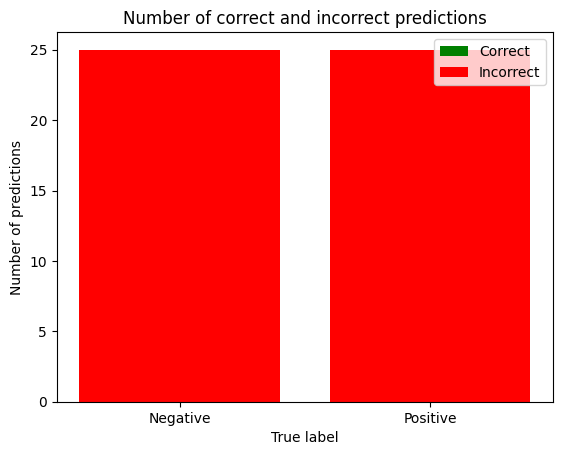

In [ ]:
plot_pedictions(prediction_y,new_prediction_x)

# 2 Poisoning Attacks and Defenses

## 2.1 Poisoning Attacks

### Preprocessing the data

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
import numpy as np
tf.compat.v1.disable_eager_execution()

In [ ]:
# Preprocess the data

# Load CIFAR-10 dataset
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.cifar10.load_data()

x_train = x_train.astype('float32') / 255
y_train = tf.keras.utils.to_categorical(y_train, 10)

170498071/170498071 [==============================] - 13s 0us/step


In [ ]:
x_test = x_test.astype('float32') / 255
prediction_images=[]
prediction_labels=[]

classes_to_predict= {}
for i in range(10):
     classes_to_predict.update({i:[]})

for image,label in zip(x_test,y_test):
  if len(classes_to_predict[label[0]])<=10:
    prediction_images.append(image)
    prediction_labels.append(label[0])
    classes_to_predict[label[0]].append(image)

prediction_labels = np.array(prediction_labels)
prediction_images = np.array(prediction_images)
print(prediction_labels)

[3 8 8 0 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 4 9 5 2 4 0 9 6 6 5 4 5 9 2 4
 1 9 5 4 6 5 6 0 9 3 9 7 6 9 8 0 3 8 8 7 7 4 6 7 3 6 3 2 1 2 3 7 2 8 8 0 2
 9 3 3 8 8 1 1 7 2 5 2 7 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 4 2 1 2 5 4 1 5]


In [ ]:
#Fuction to plot correct preditions and accuracy for a model 
import matplotlib.pyplot as plt

def plot_pedictions(model,prediction_labels,prediction_images):
  # Make predictions on the test data
  predictions = model.predict(prediction_images)
  # Get the predicted classes
  predicted_classes = np.argmax(predictions, axis=1)
  
  # Print the predicted classes
  print(predicted_classes)

  # Get the predicted classes
  predicted_classes1 = np.argmax(model.predict(prediction_images), axis=1)
  # Compute the accuracy
  accuracy = np.sum(predicted_classes1 == prediction_labels) / len(prediction_labels)
  print("Accuracy:", accuracy)
  # Create an array to store the number of correct and incorrect predictions for each class
  correct = np.zeros(10)
  incorrect = np.zeros(10)

  # Loop through the predictions and count the number of correct and incorrect predictions for each class
  for i in range(len(predicted_classes)):
    if predicted_classes[i] == prediction_labels[i]:
        correct[prediction_labels[i]] += 1
    else:
        incorrect[prediction_labels[i]] += 1

  # Plot a stacked bar chart of the correct and incorrect predictions for each class
  fig, ax = plt.subplots()
  ax.bar(range(10), correct, label='Correct')
  ax.bar(range(10), incorrect, bottom=correct, label='Incorrect')
  ax.set_xticks(range(10))
  ax.set_xlabel('Class')
  ax.set_ylabel('Count')
  ax.set_title('Correct vs Incorrect Predictions by Class')
  ax.legend()
  plt.show()

In [ ]:
model_url = "https://tfhub.dev/deepmind/ganeval-cifar10-convnet/1"
hub_layer = hub.KerasLayer(model_url, input_shape=(32, 32, 3), trainable=False)

model = tf.keras.Sequential([
    hub_layer,
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(10, activation='softmax')
])

model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Train the model
model.fit(x_train, y_train, epochs=3, batch_size=32, validation_split=0.1)

Train on 45000 samples, validate on 5000 samples
Epoch 1/3
45000/45000 [==============================] - ETA: 0s - loss: 1.2434 - accuracy: 0.7711

/usr/local/lib/python3.10/dist-packages/keras/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates


45000/45000 [==============================] - 20s 437us/sample - loss: 1.2434 - accuracy: 0.7711 - val_loss: 0.0492 - val_accuracy: 0.9982
Epoch 2/3
45000/45000 [==============================] - 13s 281us/sample - loss: 0.0258 - accuracy: 0.9994 - val_loss: 0.0142 - val_accuracy: 0.9996
Epoch 3/3
45000/45000 [==============================] - 12s 274us/sample - loss: 0.0096 - accuracy: 0.9998 - val_loss: 0.0066 - val_accuracy: 1.0000


#### Plots on orginl modelusing the classified test data set

/usr/local/lib/python3.10/dist-packages/keras/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


[3 8 8 0 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 4 9 5 2 4 0 9 6 6 5 4 5 9 2 4
 1 9 5 4 6 5 6 0 9 3 9 7 6 9 8 5 3 8 8 7 7 5 3 7 5 6 3 2 1 2 3 7 2 8 8 0 2
 9 3 3 8 8 9 1 7 2 5 2 7 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 4 6 1 2 3 4 1 5]
Accuracy: 0.9363636363636364


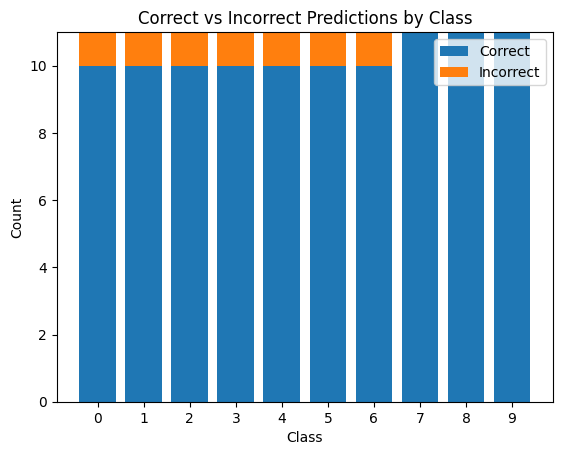

In [ ]:
plot_pedictions(model,prediction_labels,prediction_images)  

### Poison attack 1 : PoisoningAttackBackdoor

Applies a number of backdoor perturbation functions and switches label to target label

In [ ]:
!pip install adversarial-robustness-toolbox

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 41.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 30.5/30.5 MB 22.0 MB/s eta 0:00:00
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.2.2
    Uninstalling scikit-learn-1.2.2:
      Successfully uninstalled scikit-learn-1.2.2


In [ ]:
from art.attacks.poisoning import PoisoningAttackBackdoor
from art.estimators.classification import KerasClassifier

In [ ]:
def backdoor(x):
    pattern_size = 5
     # Generate a random pattern of size (pattern_size, pattern_size, 3)
    pattern = np.random.rand(pattern_size, pattern_size, 3)
    
    # Pick a random location to add the pattern to
    x_shape = x.shape
    row = np.random.randint(0, x_shape[1] - pattern_size + 1)
    col = np.random.randint(0, x_shape[2] - pattern_size + 1)
    
    # Add the pattern to the image
    x_modified = np.copy(x)
    x_modified[:, row:row+pattern_size, col:col+pattern_size, :] = pattern
    
    return x_modified

backdoor_attack = PoisoningAttackBackdoor(backdoor)

#### Training on 500 poison sampels

In [ ]:
# Generate and poison some training data
poison_x = x_train[:500] 
poison_x, poison_y = backdoor_attack.poison(poison_x, tf.keras.utils.to_categorical(np.full((500,), 7),10))

In [ ]:
model1 = tf.keras.models.clone_model(model)
model1.set_weights(model.get_weights())

In [ ]:
model1.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])
model1.fit(poison_x, poison_y, epochs=15, batch_size=32, validation_split=0.3)

Train on 350 samples, validate on 150 samples
Epoch 1/15
350/350 [==============================] - 1s 2ms/sample - loss: 3.5859 - accuracy: 0.1657 - val_loss: 3.3117 - val_accuracy: 0.2067
Epoch 2/15
350/350 [==============================] - 0s 530us/sample - loss: 3.3352 - accuracy: 0.1829 - val_loss: 3.0915 - val_accuracy: 0.2467
Epoch 3/15
350/350 [==============================] - 0s 375us/sample - loss: 3.1238 - accuracy: 0.2143 - val_loss: 2.8871 - val_accuracy: 0.2733
Epoch 4/15
350/350 [==============================] - 0s 372us/sample - loss: 2.9212 - accuracy: 0.2543 - val_loss: 2.7051 - val_accuracy: 0.3267
Epoch 5/15
350/350 [==============================] - 0s 392us/sample - loss: 2.7431 - accuracy: 0.2829 - val_loss: 2.5433 - val_accuracy: 0.3667
Epoch 6/15
350/350 [==============================] - 0s 370us/sample - loss: 2.5829 - accuracy: 0.3343 - val_loss: 2.4015 - val_accuracy: 0.3933
Epoch 7/15
350/350 [==============================] - 0s 384us/sample - loss: 2.

##### Plots on orginl modelusing the classified test data set after implementing Poisioning on 500 poision sampels

[3 7 4 7 6 6 7 6 3 1 7 9 5 7 9 6 7 7 8 6 7 0 4 9 9 2 9 0 9 6 6 5 8 5 9 2 9
 7 9 5 4 2 7 6 7 9 8 6 7 6 9 8 9 8 8 8 7 7 8 3 7 5 6 3 2 7 2 3 7 2 8 8 0 2
 9 3 3 8 8 7 1 7 2 9 7 7 9 7 3 4 0 7 7 4 5 3 7 7 4 7 2 7 4 6 1 2 7 4 7 5]
Accuracy: 0.6818181818181818


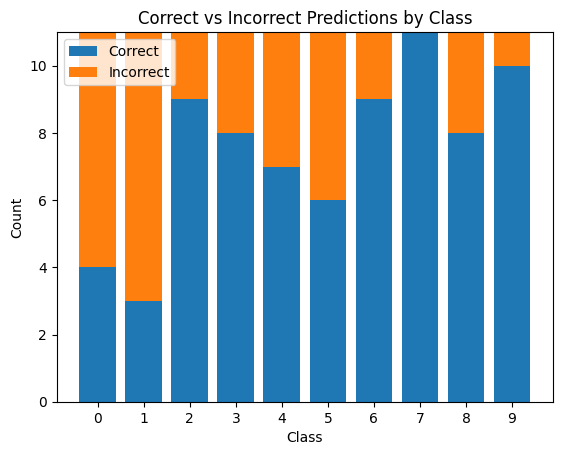

In [ ]:
plot_pedictions(model1,prediction_labels,prediction_images)  

##### Defenses

In [ ]:
from art.defences.preprocessor import JpegCompression

In [ ]:
preprocessor = JpegCompression(clip_values=(0,1),channels_first=True, apply_fit=True, apply_predict=True)
x_train_preprocessed, y_train_preprocessed = preprocessor(poison_x,poison_y)

In [ ]:
model_new = tf.keras.models.clone_model(model)
model_new.set_weights(model.get_weights())

In [ ]:
model_new.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])
model_new.fit(x_train_preprocessed, y_train_preprocessed, epochs=15, batch_size=32, validation_split=0.3)

Train on 350 samples, validate on 150 samples
Epoch 1/15
350/350 [==============================] - 1s 3ms/sample - loss: 7.9758 - accuracy: 0.0657 - val_loss: 7.6646 - val_accuracy: 0.0867
Epoch 2/15
350/350 [==============================] - 0s 580us/sample - loss: 7.6419 - accuracy: 0.0686 - val_loss: 7.3305 - val_accuracy: 0.0867
Epoch 3/15
350/350 [==============================] - 0s 449us/sample - loss: 7.3072 - accuracy: 0.0686 - val_loss: 7.0009 - val_accuracy: 0.0867
Epoch 4/15
350/350 [==============================] - 0s 421us/sample - loss: 6.9783 - accuracy: 0.0714 - val_loss: 6.6754 - val_accuracy: 0.0867
Epoch 5/15
350/350 [==============================] - 0s 405us/sample - loss: 6.6517 - accuracy: 0.0714 - val_loss: 6.3493 - val_accuracy: 0.0867
Epoch 6/15
350/350 [==============================] - 0s 391us/sample - loss: 6.3276 - accuracy: 0.0743 - val_loss: 6.0274 - val_accuracy: 0.0867
Epoch 7/15
350/350 [==============================] - 0s 391us/sample - loss: 6.

/usr/local/lib/python3.10/dist-packages/keras/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


[3 8 8 0 6 6 5 6 3 1 0 9 5 7 9 6 5 7 8 6 7 0 4 9 5 2 4 0 9 6 6 5 4 5 9 2 4
 7 9 5 4 6 5 6 0 9 3 0 7 6 9 8 5 3 8 8 7 7 5 3 7 5 6 3 2 1 2 3 7 2 8 8 0 2
 9 3 3 8 8 3 1 7 2 5 2 7 9 7 3 4 0 0 7 4 5 3 1 1 4 0 2 1 4 6 1 2 3 4 1 5]
Accuracy: 0.8909090909090909


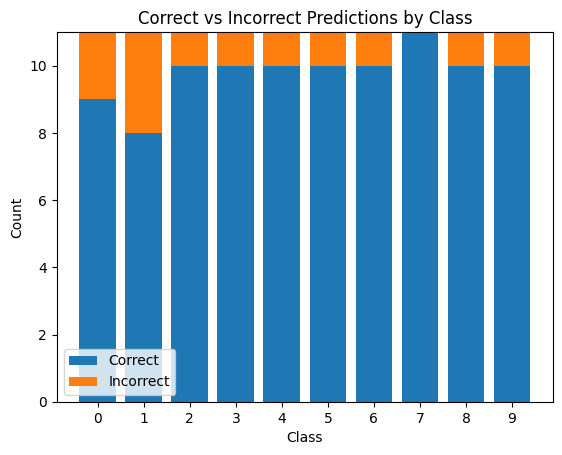

In [ ]:
plot_pedictions(model_new,prediction_labels,prediction_images)

#### Training on 1000 poison sampels

In [ ]:
# Generate and poison some training data
poison_x = x_train[:1000] 
poison_x, poison_y = backdoor_attack.poison(poison_x, tf.keras.utils.to_categorical(np.full((1000,), 7),10))

In [ ]:
model2 = tf.keras.models.clone_model(model)
model2.set_weights(model.get_weights())

In [ ]:
model2.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])
model2.fit(poison_x, poison_y, epochs=15, batch_size=32, validation_split=0.3)

Train on 700 samples, validate on 300 samples
Epoch 1/15
700/700 [==============================] - 1s 2ms/sample - loss: 8.3405 - accuracy: 0.1000 - val_loss: 8.1678 - val_accuracy: 0.0967
Epoch 2/15
700/700 [==============================] - 0s 361us/sample - loss: 7.8029 - accuracy: 0.1000 - val_loss: 7.6476 - val_accuracy: 0.1000
Epoch 3/15
700/700 [==============================] - 0s 368us/sample - loss: 7.2729 - accuracy: 0.1014 - val_loss: 7.1274 - val_accuracy: 0.1000
Epoch 4/15
700/700 [==============================] - 0s 368us/sample - loss: 6.7348 - accuracy: 0.1014 - val_loss: 6.6221 - val_accuracy: 0.1033
Epoch 5/15
700/700 [==============================] - 0s 362us/sample - loss: 6.2178 - accuracy: 0.1014 - val_loss: 6.1194 - val_accuracy: 0.1033
Epoch 6/15
700/700 [==============================] - 0s 363us/sample - loss: 5.7096 - accuracy: 0.1043 - val_loss: 5.6354 - val_accuracy: 0.1033
Epoch 7/15
700/700 [==============================] - 0s 375us/sample - loss: 5.

##### Plots on orginl modelusing the classified test data set after implementing Poisioning on 1000 poision sampels

[3 7 6 7 6 6 7 6 3 1 0 9 5 7 9 6 5 7 8 6 7 0 4 9 5 2 9 0 9 6 6 5 8 5 9 2 4
 7 9 5 4 6 5 6 7 9 8 6 7 6 9 8 9 3 8 8 7 7 8 3 7 5 6 3 2 7 2 3 7 2 8 8 0 2
 9 3 3 8 8 7 1 7 2 9 7 7 9 7 3 4 0 7 7 4 5 3 7 7 4 7 2 1 4 6 1 2 3 4 7 5]
Accuracy: 0.7545454545454545


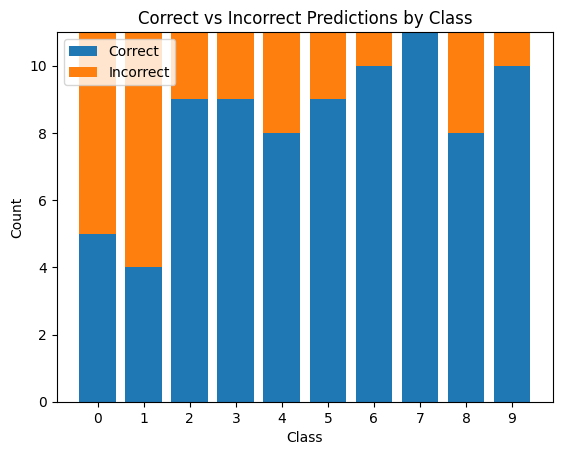

In [ ]:
plot_pedictions(model2,prediction_labels,prediction_images)  

##### Defenses

In [ ]:
from art.defences.preprocessor import JpegCompression

In [ ]:
preprocessor = JpegCompression(clip_values=(0,1),channels_first=True, apply_fit=True, apply_predict=True)
x_train_preprocessed, y_train_preprocessed = preprocessor(poison_x,poison_y)

In [ ]:
model_new = tf.keras.models.clone_model(model)
model_new.set_weights(model.get_weights())

In [ ]:
model_new.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])
model_new.fit(x_train_preprocessed, y_train_preprocessed, epochs=15, batch_size=32, validation_split=0.3)

Train on 700 samples, validate on 300 samples
Epoch 1/15
700/700 [==============================] - 1s 2ms/sample - loss: 2.7570 - accuracy: 0.2986 - val_loss: 2.6626 - val_accuracy: 0.3167
Epoch 2/15
700/700 [==============================] - 0s 437us/sample - loss: 2.5418 - accuracy: 0.3286 - val_loss: 2.4560 - val_accuracy: 0.3600
Epoch 3/15
700/700 [==============================] - 0s 392us/sample - loss: 2.3592 - accuracy: 0.3686 - val_loss: 2.2684 - val_accuracy: 0.3933
Epoch 4/15
700/700 [==============================] - 0s 390us/sample - loss: 2.1995 - accuracy: 0.4200 - val_loss: 2.1102 - val_accuracy: 0.4333
Epoch 5/15
700/700 [==============================] - 0s 391us/sample - loss: 2.0613 - accuracy: 0.4400 - val_loss: 1.9740 - val_accuracy: 0.4533
Epoch 6/15
700/700 [==============================] - 0s 391us/sample - loss: 1.9434 - accuracy: 0.4800 - val_loss: 1.8595 - val_accuracy: 0.4900
Epoch 7/15
700/700 [==============================] - 0s 388us/sample - loss: 1.

[3 7 4 7 6 6 7 6 3 1 0 9 5 7 9 6 5 7 8 6 7 0 4 9 5 2 9 0 9 6 6 5 4 5 9 2 4
 7 9 5 4 6 5 6 7 9 8 6 7 6 9 8 9 3 8 8 7 7 7 3 7 5 6 3 2 7 2 3 7 2 8 8 0 2
 9 3 3 8 8 7 1 7 2 5 2 7 9 7 3 4 0 0 7 4 5 3 1 7 4 7 2 1 4 6 1 2 3 4 1 5]
Accuracy: 0.8090909090909091


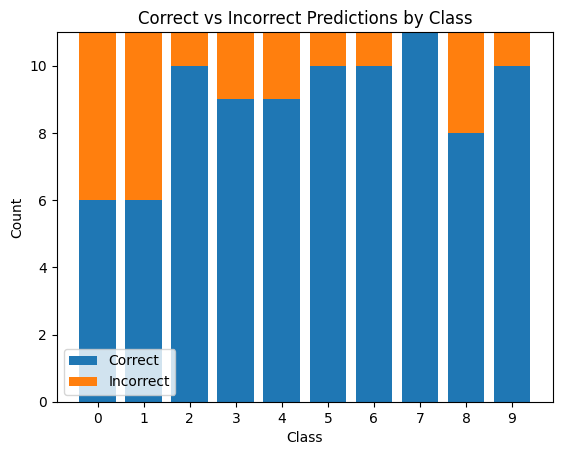

In [ ]:
plot_pedictions(model_new,prediction_labels,prediction_images)

#### Training on 1500 poison sampels

In [ ]:
# Generate and poison some training data
poison_x = x_train[:1500] 
poison_x, poison_y = backdoor_attack.poison(poison_x, tf.keras.utils.to_categorical(np.full((1500,), 7),10))

In [ ]:
model3 = tf.keras.models.clone_model(model)
model3.set_weights(model.get_weights())

In [ ]:
model3.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])
model3.fit(poison_x, poison_y, epochs=15, batch_size=32, validation_split=0.3)

Train on 1050 samples, validate on 450 samples
Epoch 1/15
1050/1050 [==============================] - 2s 2ms/sample - loss: 7.9124 - accuracy: 0.1000 - val_loss: 7.6799 - val_accuracy: 0.0978
Epoch 2/15
1050/1050 [==============================] - 0s 375us/sample - loss: 7.1177 - accuracy: 0.1000 - val_loss: 6.8798 - val_accuracy: 0.0978
Epoch 3/15
1050/1050 [==============================] - 0s 388us/sample - loss: 6.3491 - accuracy: 0.1000 - val_loss: 6.0872 - val_accuracy: 0.0978
Epoch 4/15
1050/1050 [==============================] - 0s 370us/sample - loss: 5.5933 - accuracy: 0.1038 - val_loss: 5.3521 - val_accuracy: 0.1067
Epoch 5/15
1050/1050 [==============================] - 0s 366us/sample - loss: 4.9096 - accuracy: 0.1238 - val_loss: 4.6916 - val_accuracy: 0.1422
Epoch 6/15
1050/1050 [==============================] - 0s 367us/sample - loss: 4.3187 - accuracy: 0.1610 - val_loss: 4.1694 - val_accuracy: 0.1911
Epoch 7/15
1050/1050 [==============================] - 0s 385us/sa

##### Plots on orginl modelusing the classified test data set after implementing Poisioning on 1500 poision sampels

[3 7 7 7 6 6 7 6 3 1 7 7 8 7 7 6 7 7 8 6 7 7 4 9 8 2 9 7 7 9 6 5 8 5 9 2 8
 7 7 5 4 2 5 6 7 7 8 7 7 6 9 8 9 8 8 8 7 7 8 3 7 5 6 7 2 7 2 3 7 2 8 8 0 2
 9 3 3 8 8 7 7 7 2 9 7 7 7 7 3 8 0 7 7 4 5 3 7 7 4 7 2 7 4 6 2 2 6 4 7 5]
Accuracy: 0.5636363636363636


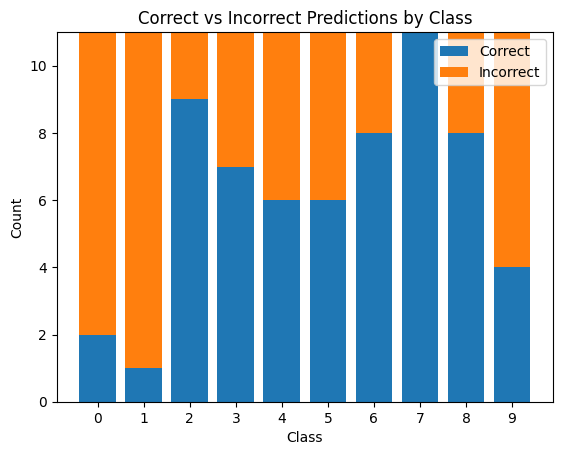

In [ ]:
plot_pedictions(model3,prediction_labels,prediction_images)  

##### Defenses

In [ ]:
from art.defences.preprocessor import JpegCompression

In [ ]:
preprocessor = JpegCompression(clip_values=(0,1),channels_first=True, apply_fit=True, apply_predict=True)
x_train_preprocessed, y_train_preprocessed = preprocessor(poison_x,poison_y)

In [ ]:
model_new = tf.keras.models.clone_model(model)
model_new.set_weights(model.get_weights())

In [ ]:
model_new.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])
model_new.fit(x_train_preprocessed, y_train_preprocessed, epochs=15, batch_size=32, validation_split=0.3)

Train on 1050 samples, validate on 450 samples
Epoch 1/15
1050/1050 [==============================] - 1s 1ms/sample - loss: 7.8652 - accuracy: 0.1000 - val_loss: 7.7132 - val_accuracy: 0.0956
Epoch 2/15
1050/1050 [==============================] - 0s 380us/sample - loss: 7.1181 - accuracy: 0.1029 - val_loss: 6.9571 - val_accuracy: 0.0956
Epoch 3/15
1050/1050 [==============================] - 0s 368us/sample - loss: 6.3896 - accuracy: 0.1019 - val_loss: 6.2175 - val_accuracy: 0.0956
Epoch 4/15
1050/1050 [==============================] - 0s 359us/sample - loss: 5.6846 - accuracy: 0.1048 - val_loss: 5.5087 - val_accuracy: 0.1022
Epoch 5/15
1050/1050 [==============================] - 0s 401us/sample - loss: 5.0277 - accuracy: 0.1124 - val_loss: 4.8829 - val_accuracy: 0.1111
Epoch 6/15
1050/1050 [==============================] - 0s 412us/sample - loss: 4.4586 - accuracy: 0.1295 - val_loss: 4.3615 - val_accuracy: 0.1556
Epoch 7/15
1050/1050 [==============================] - 0s 409us/sa

[3 7 4 7 6 6 7 6 7 1 7 9 5 7 9 6 5 7 8 6 7 7 4 9 8 2 4 7 9 9 6 5 8 5 9 2 4
 7 9 5 4 2 5 6 7 9 8 7 7 6 9 8 9 8 8 8 7 7 8 3 7 5 6 7 2 7 2 3 7 7 8 8 0 2
 9 3 7 8 8 7 7 7 2 9 7 7 9 7 3 4 7 7 7 4 5 3 7 7 4 7 2 7 4 6 7 2 0 4 7 5]
Accuracy: 0.6272727272727273


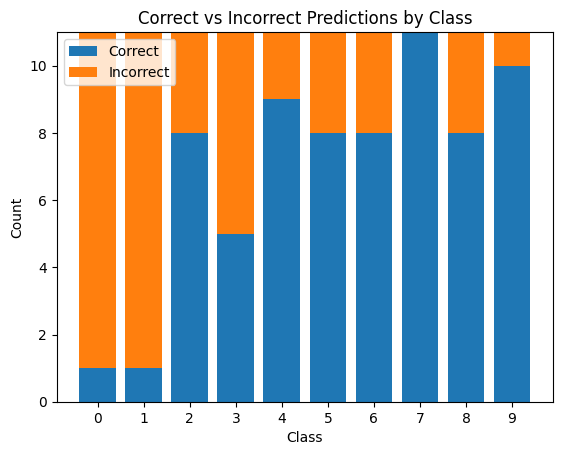

In [ ]:
plot_pedictions(model_new,prediction_labels,prediction_images)

#### Training on 2000 poison sampels

In [ ]:
# Generate and poison some training data
poison_x = x_train[:2000] 
poison_x, poison_y = backdoor_attack.poison(poison_x, tf.keras.utils.to_categorical(np.full((2000,), 7),10))

In [ ]:
model1 = tf.keras.models.clone_model(model)
model1.set_weights(model.get_weights())

In [ ]:
model1.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])
model1.fit(poison_x, poison_y, epochs=15, batch_size=32, validation_split=0.3)

Train on 1400 samples, validate on 600 samples
Epoch 1/15
1400/1400 [==============================] - ETA: 0s - loss: 8.0293 - accuracy: 0.0957

/usr/local/lib/python3.9/dist-packages/keras/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates


1400/1400 [==============================] - 2s 1ms/sample - loss: 8.0293 - accuracy: 0.0957 - val_loss: 7.4146 - val_accuracy: 0.1083
Epoch 2/15
1400/1400 [==============================] - 0s 356us/sample - loss: 6.9064 - accuracy: 0.0964 - val_loss: 6.3204 - val_accuracy: 0.1067
Epoch 3/15
1400/1400 [==============================] - 1s 358us/sample - loss: 5.8099 - accuracy: 0.0993 - val_loss: 5.2568 - val_accuracy: 0.1067
Epoch 4/15
1400/1400 [==============================] - 0s 352us/sample - loss: 4.7686 - accuracy: 0.1079 - val_loss: 4.2742 - val_accuracy: 0.1117
Epoch 5/15
1400/1400 [==============================] - 1s 363us/sample - loss: 3.8515 - accuracy: 0.1343 - val_loss: 3.4459 - val_accuracy: 0.1583
Epoch 6/15
1400/1400 [==============================] - 1s 361us/sample - loss: 3.1226 - accuracy: 0.1914 - val_loss: 2.8192 - val_accuracy: 0.2200
Epoch 7/15
1400/1400 [==============================] - 1s 364us/sample - loss: 2.6000 - accuracy: 0.2814 - val_loss: 2.3794 

##### Plots on orginl modelusing the classified test data set after implementing Poisioning on 2000 poision sampels

/usr/local/lib/python3.9/dist-packages/keras/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


[7 7 6 7 6 6 7 6 7 1 7 9 8 7 9 6 5 7 8 6 7 7 4 9 8 7 4 7 9 6 7 5 4 5 9 2 4
 0 9 5 7 2 5 6 7 9 9 7 8 6 9 8 7 3 8 8 7 7 9 7 7 9 6 7 2 1 7 3 7 7 8 8 0 2
 9 7 7 8 8 7 1 7 2 9 7 7 9 7 7 4 7 7 8 4 5 7 7 7 4 7 2 1 4 7 7 7 0 4 7 5]
Accuracy: 0.5727272727272728


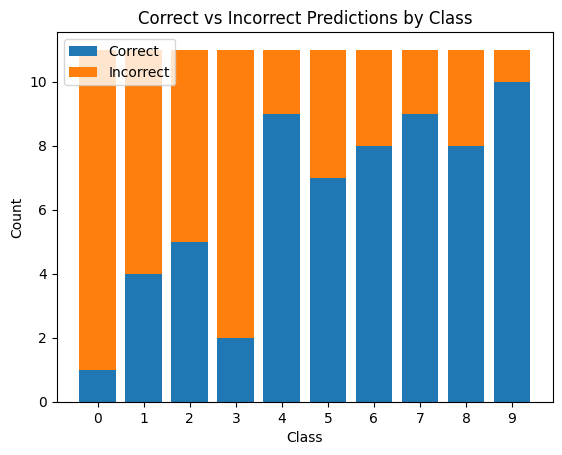

In [ ]:
plot_pedictions(model1,prediction_labels,prediction_images)  

#####  Comparison of Defenses on CIFAR-10 for above model

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
from art.estimators.classification import KerasClassifier
from art.defences.preprocessor import JpegCompression
from art.defences.postprocessor import GaussianNoise
from art.defences.trainer import AdversarialTrainerMadryPGD
from art.defences.transformer.evasion import DefensiveDistillation

###### Preprocessor defenses: 
These defenses modify the input data before feeding it to the model to make it more robust against adversarial attacks. Some examples of preprocessor defenses in ART include data normalization, data augmentation, and feature squeezing.

In [ ]:
# Load the victim model
classifier1 = KerasClassifier(model=model3, clip_values=(0, 1))


In [ ]:
# Apply preprocessor defense
preprocessor = JpegCompression(clip_values=(0,1),channels_first=True, apply_fit=True, apply_predict=True)

In [ ]:
prediction_images1, prediction_labels1 = preprocessor(prediction_images, tf.keras.utils.to_categorical(prediction_labels,10))

[3 4 4 7 6 6 7 9 7 6 0 9 1 7 9 8 5 7 8 6 7 7 4 9 2 7 4 0 9 6 3 5 4 5 9 2 4
 6 9 5 4 2 5 6 0 9 3 0 7 2 9 8 9 9 8 8 7 7 7 3 7 7 6 7 2 4 7 3 7 2 8 8 0 2
 9 3 7 8 8 7 1 7 2 7 7 7 9 7 3 3 0 7 6 4 5 7 1 7 4 7 2 4 0 3 1 7 3 4 1 5]
Accuracy: 0.6363636363636364


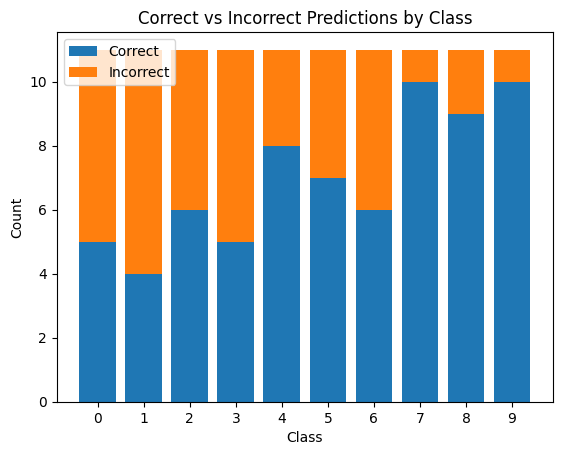

In [ ]:
plot_pedictions(classifier1,prediction_labels, prediction_images1)  

###### Trainer defenses: 
These defenses modify the training process of the machine learning model to improve its robustness against adversarial attacks. Some examples of trainer defenses in ART include adversarial training and defensive distillation.

In [ ]:
x_train_preprocessed, y_train_preprocessed = preprocessor(poison_x, poison_y)

In [ ]:
model_trainer = tf.keras.models.clone_model(model)
model_trainer.set_weights(model.get_weights())

In [ ]:
classifier2 = KerasClassifier(model=model_trainer, clip_values=(0, 1))

classifier2.model.compile(optimizer="adam", loss="sparse_categorical_crossentropy")

trainer = AdversarialTrainerMadryPGD(classifier2, nb_epochs=6, eps=0.1, eps_step=1, batch_size=16)

# Fit the adversarial trainer on preprocessed data
trainer.fit(x_train_preprocessed, y_train[:1500])

Train on 1500 samples
1500/1500 [==============================] - 1s 470us/sample - loss: 0.3434 - accuracy: 0.8927


[3 8 8 0 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 4 9 5 2 4 0 9 6 6 5 4 5 9 2 4
 9 9 5 4 6 5 6 0 9 3 9 7 6 9 8 5 3 8 8 7 7 5 3 7 5 6 3 2 1 2 3 7 2 8 8 0 2
 9 3 3 8 8 9 1 7 2 5 2 7 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 4 6 1 2 3 4 1 5]
Accuracy: 0.9272727272727272


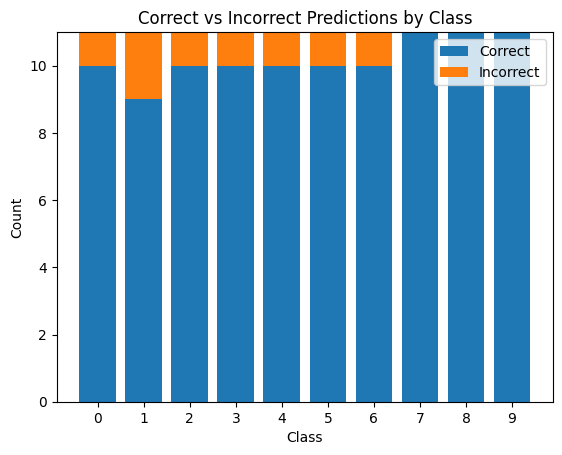

In [ ]:
plot_pedictions(model_trainer,prediction_labels, prediction_images)  

###### Postprocessor defenses:
 These defenses modify the output of the model to remove any adversarial perturbations that might have been added to the input data. Some examples of postprocessor defenses in ART include activation clustering and feature denoising.

In [ ]:
# Define the postprocessing defense
noise = GaussianNoise(scale=0.001)

# Apply the defense to the classifier
classifier1.postprocessing_defences = [noise]


[7 0 4 7 6 6 7 6 7 1 7 9 8 7 9 6 7 7 8 6 7 7 4 9 8 7 4 0 7 6 6 5 4 5 9 2 4
 4 9 5 4 2 5 6 7 9 8 0 7 6 9 8 9 3 8 8 7 7 7 3 7 7 6 7 2 1 7 3 7 7 8 8 0 2
 9 7 7 8 8 7 1 7 7 7 7 7 9 7 3 4 7 7 7 4 5 7 1 7 4 7 2 4 4 7 1 7 7 4 1 5]
Accuracy: 0.6181818181818182


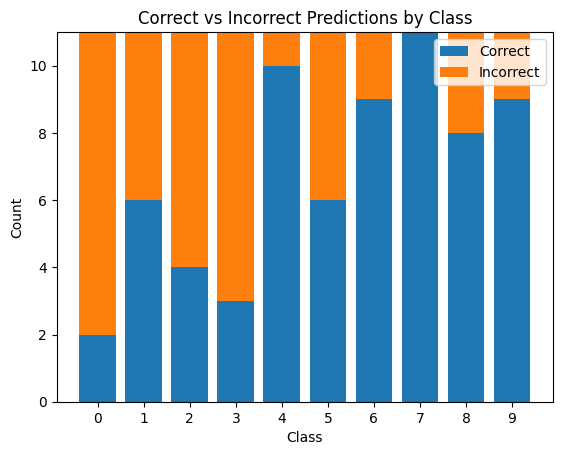

In [ ]:
plot_pedictions(classifier1,prediction_labels, prediction_images)

######Transformer defenses:
 DefensiveDistillation is a defense that requires training a distilled model on the original model's predictions. It is used for evasion attacks. Here is an example of how to use it:

In [ ]:
# Define the defense
defense = DefensiveDistillation(classifier=classifier1, batch_size=32, nb_epochs=20)

# Fit the defense
defense.fit(x_train, y_train)

# Get the transformed classifier
transformed_classifier = defense.classifier

[7 0 4 7 6 6 7 6 7 1 7 9 8 7 9 6 7 7 8 6 7 7 4 9 8 7 4 0 7 6 6 5 4 5 9 2 4
 4 9 5 4 2 5 6 7 9 9 0 7 6 9 8 9 3 8 8 7 7 7 3 7 7 6 7 2 1 7 3 7 7 8 8 0 2
 9 7 7 8 8 7 1 7 7 7 7 7 9 7 3 4 7 7 7 4 5 7 1 7 4 7 2 4 4 7 1 7 7 4 1 5]
Accuracy: 0.6181818181818182


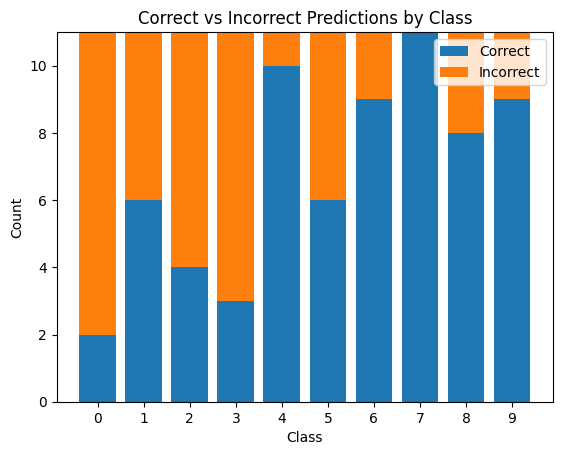

In [ ]:
plot_pedictions(transformed_classifier,prediction_labels, prediction_images)

[3 7 4 7 6 6 7 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 4 9 8 7 4 0 9 6 3 5 8 5 9 7 4
 6 9 5 4 8 5 6 7 9 8 7 8 8 9 8 0 8 8 8 7 7 4 8 7 7 6 7 7 7 7 3 7 7 8 8 0 7
 9 3 3 8 8 7 1 7 7 7 7 3 9 7 3 3 7 0 8 4 5 7 7 7 4 7 7 7 4 3 7 7 3 4 7 5]
Accuracy: 0.5909090909090909


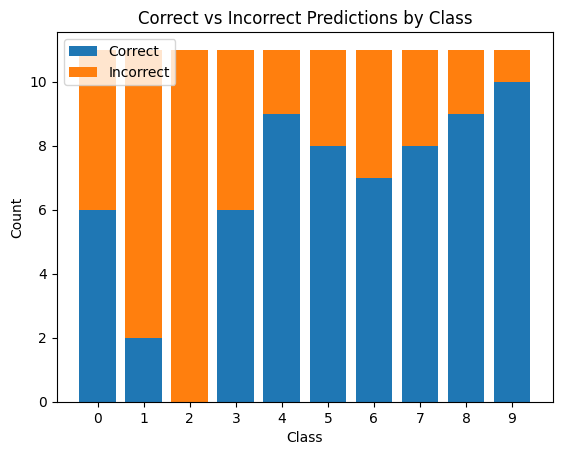

In [ ]:
plot_pedictions(transformed_classifier,prediction_labels1, prediction_images1)

###### Detector defenses: 
These defenses detect the presence of adversarial examples and trigger a response to prevent the model from making incorrect predictions. Some examples of detector defenses in ART include confidence thresholding and outlier detection.

In [ ]:
# Fit the adversarial trainer on preprocessed data
classifier2.fit(prediction_images, tf.keras.utils.to_categorical(prediction_labels,10))

Train on 110 samples
110/110 [==============================] - 0s 343us/sample - loss: 0.3167 - accuracy: 0.9364


[3 8 8 0 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 4 9 5 2 4 0 9 6 6 5 4 5 9 2 4
 1 9 5 4 6 5 6 0 9 3 9 7 6 9 8 5 3 8 8 7 7 5 3 7 5 6 3 2 1 2 3 7 2 8 8 0 2
 9 3 3 8 8 9 1 7 2 5 2 7 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 4 6 1 2 3 4 1 5]
Accuracy: 0.9363636363636364


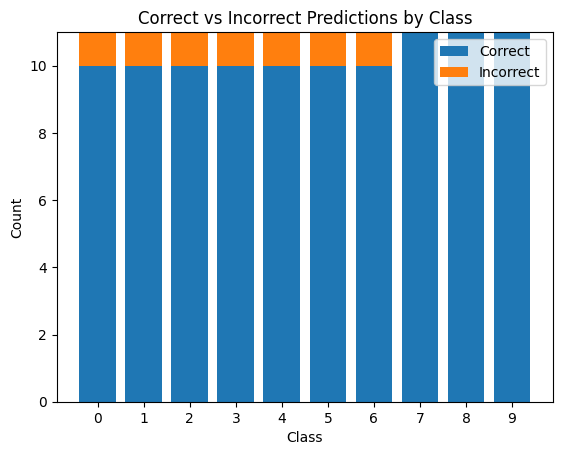

In [ ]:
plot_pedictions(classifier2,prediction_labels, prediction_images)

### Poison attack 2 : PoisoningAttackAdversarialEmbedding

In [ ]:
from art.attacks.poisoning import PoisoningAttackAdversarialEmbedding
from art.attacks.poisoning import PoisoningAttackBackdoor
from art.estimators.classification import KerasClassifier

In [ ]:
#Load the victim model
#Load the victim model
classifier_url = "https://tfhub.dev/deepmind/ganeval-cifar10-convnet/1"
IMAGE_SHAPE = (32, 32) 
proxy_classifier = KerasClassifier(model=tf.keras.Sequential([hub.KerasLayer(classifier_url, input_shape=IMAGE_SHAPE+(3,))]), clip_values=(0, 1))
proxy_classifier.model.compile(optimizer="adam", loss="sparse_categorical_crossentropy")


In [ ]:
def backdoor(x):
    pattern_size = 5
     # Generate a random pattern of size (pattern_size, pattern_size, 3)
    pattern = np.random.rand(pattern_size, pattern_size, 3)
    
    # Pick a random location to add the pattern to
    x_shape = x.shape
    row = np.random.randint(0, x_shape[1] - pattern_size + 1)
    col = np.random.randint(0, x_shape[2] - pattern_size + 1)
    
    # Add the pattern to the image
    x_modified = np.copy(x)
    x_modified[:, row:row+pattern_size, col:col+pattern_size, :] = pattern
    
    return x_modified

backdoor_attack = PoisoningAttackBackdoor(backdoor)

In [ ]:
# Instantiate the attack
attack = PoisoningAttackAdversarialEmbedding(
    proxy_classifier, 
    backdoor_attack, 
    feature_layer=0, 
    target=tf.keras.utils.to_categorical(np.array([7]), 10).reshape(10),
    pp_poison=1.0, 
    discriminator_layer_1=64, 
    discriminator_layer_2=32, 
    regularization=0.00001, 
    learning_rate=0.001, 
    clone=True)

/usr/local/lib/python3.10/dist-packages/keras/optimizers/legacy/adam.py:117: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)
Instructions for updating:
Colocations handled automatically by placer.


#### Training on 500 poison sampels

In [ ]:
# Generate and poison some training data
poison_x = x_train[:500]
poison_y = y_train[:500] 
poison_x, poison_y = attack.poison(poison_x, tf.keras.utils.to_categorical(np.full((500,), 7),10))

In [ ]:
model1 = tf.keras.models.clone_model(model)
model1.set_weights(model.get_weights())

In [ ]:
model1.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])
model1.fit(poison_x, poison_y, epochs=15, batch_size=32, validation_split=0.3)

Train on 350 samples, validate on 150 samples
Epoch 1/15
350/350 [==============================] - 1s 3ms/sample - loss: 4.1695 - accuracy: 0.1286 - val_loss: 4.0947 - val_accuracy: 0.1533
Epoch 2/15
350/350 [==============================] - 0s 520us/sample - loss: 3.9587 - accuracy: 0.1514 - val_loss: 3.8946 - val_accuracy: 0.1800
Epoch 3/15
350/350 [==============================] - 0s 401us/sample - loss: 3.7584 - accuracy: 0.1686 - val_loss: 3.7126 - val_accuracy: 0.1867
Epoch 4/15
350/350 [==============================] - 0s 392us/sample - loss: 3.5775 - accuracy: 0.2000 - val_loss: 3.5426 - val_accuracy: 0.2133
Epoch 5/15
350/350 [==============================] - 0s 381us/sample - loss: 3.4152 - accuracy: 0.2229 - val_loss: 3.3874 - val_accuracy: 0.2467
Epoch 6/15
350/350 [==============================] - 0s 384us/sample - loss: 3.2634 - accuracy: 0.2514 - val_loss: 3.2481 - val_accuracy: 0.2733
Epoch 7/15
350/350 [==============================] - 0s 376us/sample - loss: 3.

##### Plots on orginl modelusing the classified test data set after implementing Poisioning on 500 poision sampels

[3 4 6 7 6 6 7 6 3 1 7 9 9 7 9 6 7 7 8 6 7 0 4 9 9 2 9 0 9 9 6 5 8 5 9 2 9
 7 9 5 4 2 7 6 7 9 8 6 7 6 9 8 9 8 8 8 7 7 9 3 7 5 6 3 2 4 2 3 7 2 8 8 0 2
 9 3 3 8 8 7 1 7 2 9 7 7 9 7 3 4 0 7 7 4 5 3 7 7 4 7 2 4 4 6 1 2 4 4 7 5]
Accuracy: 0.6636363636363637


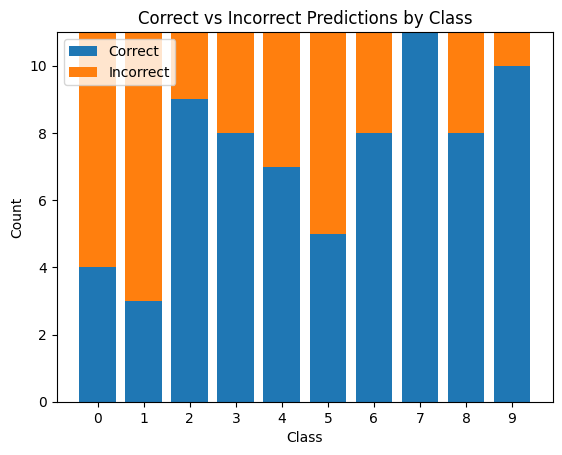

In [ ]:
plot_pedictions(model1,prediction_labels,prediction_images)  

##### Defenses

In [ ]:
from art.defences.preprocessor import JpegCompression

In [ ]:
preprocessor = JpegCompression(clip_values=(0,1),channels_first=True, apply_fit=True, apply_predict=True)
x_train_preprocessed, y_train_preprocessed = preprocessor(poison_x,poison_y)

In [ ]:
model_new = tf.keras.models.clone_model(model)
model_new.set_weights(model.get_weights())

In [ ]:
model_new.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])
model_new.fit(x_train_preprocessed, y_train_preprocessed, epochs=15, batch_size=32, validation_split=0.3)

Train on 350 samples, validate on 150 samples
Epoch 1/15
350/350 [==============================] - 2s 5ms/sample - loss: 7.9651 - accuracy: 0.0914 - val_loss: 7.6840 - val_accuracy: 0.1133
Epoch 2/15
350/350 [==============================] - 0s 615us/sample - loss: 7.7116 - accuracy: 0.0943 - val_loss: 7.4388 - val_accuracy: 0.1133
Epoch 3/15
350/350 [==============================] - 0s 410us/sample - loss: 7.4611 - accuracy: 0.0943 - val_loss: 7.1974 - val_accuracy: 0.1133
Epoch 4/15
350/350 [==============================] - 0s 385us/sample - loss: 7.2121 - accuracy: 0.0943 - val_loss: 6.9550 - val_accuracy: 0.1133
Epoch 5/15
350/350 [==============================] - 0s 409us/sample - loss: 6.9633 - accuracy: 0.0943 - val_loss: 6.7118 - val_accuracy: 0.1133
Epoch 6/15
350/350 [==============================] - 0s 376us/sample - loss: 6.7160 - accuracy: 0.0971 - val_loss: 6.4734 - val_accuracy: 0.1133
Epoch 7/15
350/350 [==============================] - 0s 374us/sample - loss: 6.

[3 8 8 0 6 6 5 6 3 1 0 9 5 7 9 6 5 7 8 6 7 0 4 9 5 2 4 0 9 6 6 5 4 5 9 2 4
 1 9 5 4 6 5 6 0 9 3 6 7 6 9 8 5 3 8 8 7 7 5 3 7 5 6 3 2 1 2 3 7 2 8 8 0 2
 9 3 3 8 8 3 1 7 2 5 2 7 9 7 3 4 0 0 7 4 5 3 1 1 4 0 2 1 4 6 1 2 3 4 1 5]
Accuracy: 0.9


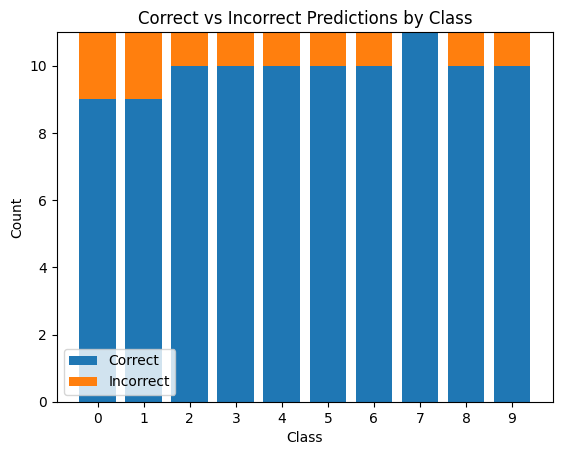

In [ ]:
plot_pedictions(model_new,prediction_labels,prediction_images)

#### Training on 1000 poison sampels

In [ ]:
# Generate and poison some training data
poison_x = x_train[:1000] 
poison_x, poison_y = attack.poison(poison_x, tf.keras.utils.to_categorical(np.full((1000,), 7),10))

In [ ]:
model2 = tf.keras.models.clone_model(model)
model2.set_weights(model.get_weights())

In [ ]:
model2.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])
model2.fit(poison_x, poison_y, epochs=15, batch_size=32, validation_split=0.3)

Train on 700 samples, validate on 300 samples
Epoch 1/15
700/700 [==============================] - 1s 2ms/sample - loss: 7.7835 - accuracy: 0.1029 - val_loss: 7.5533 - val_accuracy: 0.1000
Epoch 2/15
700/700 [==============================] - 0s 436us/sample - loss: 7.2330 - accuracy: 0.1029 - val_loss: 7.0064 - val_accuracy: 0.1000
Epoch 3/15
700/700 [==============================] - 0s 386us/sample - loss: 6.6918 - accuracy: 0.1043 - val_loss: 6.4662 - val_accuracy: 0.1000
Epoch 4/15
700/700 [==============================] - 0s 382us/sample - loss: 6.1566 - accuracy: 0.1043 - val_loss: 5.9333 - val_accuracy: 0.1067
Epoch 5/15
700/700 [==============================] - 0s 379us/sample - loss: 5.6322 - accuracy: 0.1043 - val_loss: 5.4115 - val_accuracy: 0.1067
Epoch 6/15
700/700 [==============================] - 0s 376us/sample - loss: 5.1230 - accuracy: 0.1071 - val_loss: 4.9103 - val_accuracy: 0.1067
Epoch 7/15
700/700 [==============================] - 0s 380us/sample - loss: 4.

##### Plots on orginl modelusing the classified test data set after implementing Poisioning on 1000 poision sampels

[3 6 6 7 6 6 7 6 3 1 7 9 5 7 9 6 5 7 8 6 7 7 4 9 9 2 9 0 9 6 6 5 8 5 9 2 4
 7 9 5 4 2 5 6 7 9 8 6 7 6 9 8 9 3 8 8 7 7 7 3 7 5 6 3 2 1 2 3 7 2 8 8 0 2
 9 3 3 8 8 7 1 7 2 9 7 7 9 7 3 4 0 7 7 4 5 3 1 7 4 7 2 1 4 6 1 2 3 4 7 5]
Accuracy: 0.7363636363636363


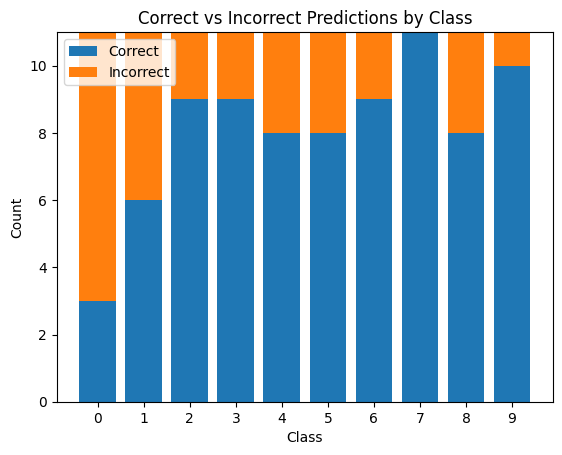

In [ ]:
plot_pedictions(model2,prediction_labels,prediction_images)  

##### Defenses

In [ ]:
from art.defences.preprocessor import JpegCompression

In [ ]:
preprocessor = JpegCompression(clip_values=(0,1),channels_first=True, apply_fit=True, apply_predict=True)
x_train_preprocessed, y_train_preprocessed = preprocessor(poison_x,poison_y)

In [ ]:
model_new = tf.keras.models.clone_model(model)
model_new.set_weights(model.get_weights())

In [ ]:
model_new.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])
model_new.fit(x_train_preprocessed, y_train_preprocessed, epochs=15, batch_size=32, validation_split=0.3)

Train on 700 samples, validate on 300 samples
Epoch 1/15
700/700 [==============================] - 1s 2ms/sample - loss: 7.8385 - accuracy: 0.0957 - val_loss: 7.5810 - val_accuracy: 0.1000
Epoch 2/15
700/700 [==============================] - 0s 381us/sample - loss: 7.3046 - accuracy: 0.1000 - val_loss: 7.0445 - val_accuracy: 0.1033
Epoch 3/15
700/700 [==============================] - 0s 386us/sample - loss: 6.7790 - accuracy: 0.1000 - val_loss: 6.5096 - val_accuracy: 0.1033
Epoch 4/15
700/700 [==============================] - 0s 393us/sample - loss: 6.2579 - accuracy: 0.1014 - val_loss: 5.9720 - val_accuracy: 0.1033
Epoch 5/15
700/700 [==============================] - 0s 375us/sample - loss: 5.7467 - accuracy: 0.1043 - val_loss: 5.4514 - val_accuracy: 0.1067
Epoch 6/15
700/700 [==============================] - 0s 374us/sample - loss: 5.2445 - accuracy: 0.1071 - val_loss: 4.9505 - val_accuracy: 0.1100
Epoch 7/15
700/700 [==============================] - 0s 376us/sample - loss: 4.

[3 7 4 7 6 6 5 6 7 1 0 9 5 7 9 6 5 7 8 6 7 7 4 9 5 7 4 0 9 6 6 5 8 5 9 2 4
 4 9 5 4 2 5 6 7 9 8 6 7 6 9 8 9 3 8 8 7 7 7 3 7 5 6 3 2 1 2 3 7 2 8 8 0 2
 9 3 3 8 8 3 1 7 2 5 2 7 9 7 3 4 0 7 7 4 5 3 1 7 4 7 2 1 4 6 1 2 3 4 1 5]
Accuracy: 0.7727272727272727


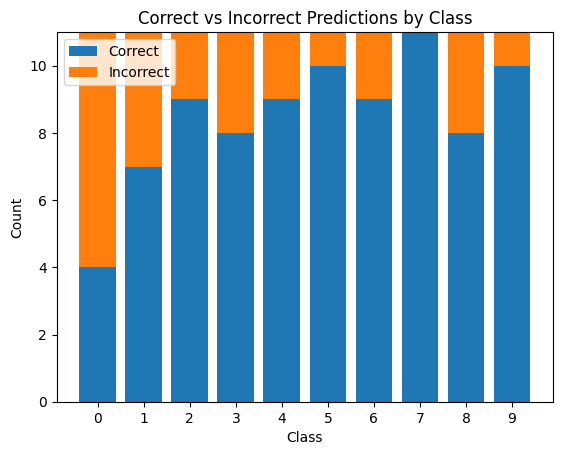

In [ ]:
plot_pedictions(model_new,prediction_labels,prediction_images)

#### Training on 1500 poison sampels

In [ ]:
# Generate and poison some training data
poison_x = x_train[:1500] 
poison_x, poison_y = attack.poison(poison_x, tf.keras.utils.to_categorical(np.full((1500,), 7),10))

In [ ]:
model3 = tf.keras.models.clone_model(model)
model3.set_weights(model.get_weights())

In [ ]:
model3.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])
model3.fit(poison_x, poison_y, epochs=15, batch_size=32, validation_split=0.3)

Train on 1050 samples, validate on 450 samples
Epoch 1/15
1050/1050 [==============================] - 1s 937us/sample - loss: 8.1673 - accuracy: 0.0971 - val_loss: 7.8232 - val_accuracy: 0.0978
Epoch 2/15
1050/1050 [==============================] - 0s 372us/sample - loss: 7.3624 - accuracy: 0.1000 - val_loss: 7.0297 - val_accuracy: 0.0978
Epoch 3/15
1050/1050 [==============================] - 0s 381us/sample - loss: 6.5687 - accuracy: 0.1000 - val_loss: 6.2380 - val_accuracy: 0.0978
Epoch 4/15
1050/1050 [==============================] - 0s 399us/sample - loss: 5.7880 - accuracy: 0.1019 - val_loss: 5.4735 - val_accuracy: 0.1000
Epoch 5/15
1050/1050 [==============================] - 0s 430us/sample - loss: 5.0327 - accuracy: 0.1057 - val_loss: 4.7439 - val_accuracy: 0.1044
Epoch 6/15
1050/1050 [==============================] - 0s 415us/sample - loss: 4.3304 - accuracy: 0.1171 - val_loss: 4.0695 - val_accuracy: 0.1089
Epoch 7/15
1050/1050 [==============================] - 0s 409us/

##### Plots on orginl modelusing the classified test data set after implementing Poisioning on 1500 poision sampels

[3 1 6 7 6 6 7 6 7 1 0 7 5 7 9 6 7 7 8 6 7 7 4 9 5 7 4 0 7 6 6 5 4 5 9 2 4
 4 9 5 4 2 7 6 7 9 8 6 7 6 9 8 7 3 8 8 7 7 7 3 7 7 6 7 2 7 7 3 7 7 8 8 0 7
 9 3 7 8 8 7 1 7 7 7 7 3 9 7 3 4 7 7 7 4 5 7 7 7 4 7 7 1 4 7 1 7 3 4 7 5]
Accuracy: 0.6


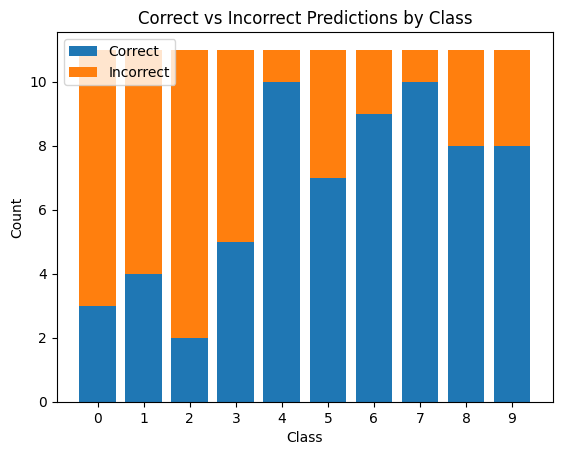

In [ ]:
plot_pedictions(model3,prediction_labels,prediction_images)  

#### Training on 2000 poison sampels

In [ ]:
# Generate and poison some training data
poison_x = x_train[:2000]
poison_y = y_train[:2000] 
poison_x, poison_y = attack.poison(poison_x, tf.keras.utils.to_categorical(np.full((2000,), 7),10))

In [ ]:
model1 = tf.keras.models.clone_model(model)
model1.set_weights(model.get_weights())

In [ ]:
model1.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])
model1.fit(poison_x, poison_y, epochs=15, batch_size=32, validation_split=0.3)

Train on 1400 samples, validate on 600 samples
Epoch 1/15
1400/1400 [==============================] - 2s 1ms/sample - loss: 1.0467 - accuracy: 0.7350 - val_loss: 0.9692 - val_accuracy: 0.7633
Epoch 2/15
1400/1400 [==============================] - 1s 383us/sample - loss: 0.9594 - accuracy: 0.7771 - val_loss: 0.8952 - val_accuracy: 0.7950
Epoch 3/15
1400/1400 [==============================] - 1s 400us/sample - loss: 0.8936 - accuracy: 0.8029 - val_loss: 0.8382 - val_accuracy: 0.8167
Epoch 4/15
1400/1400 [==============================] - 1s 390us/sample - loss: 0.8408 - accuracy: 0.8279 - val_loss: 0.7918 - val_accuracy: 0.8367
Epoch 5/15
1400/1400 [==============================] - 1s 379us/sample - loss: 0.7954 - accuracy: 0.8450 - val_loss: 0.7510 - val_accuracy: 0.8517
Epoch 6/15
1400/1400 [==============================] - 1s 383us/sample - loss: 0.7557 - accuracy: 0.8621 - val_loss: 0.7136 - val_accuracy: 0.8717
Epoch 7/15
1400/1400 [==============================] - 1s 386us/sa

##### Plots on orginl modelusing the classified test data set after implementing Poisioning on 2000 poision sampels

[7 7 7 7 8 6 7 8 7 7 7 7 7 8 7 8 7 7 8 8 7 7 4 7 7 7 8 7 7 4 8 7 8 7 7 7 8
 7 7 7 7 7 7 8 7 7 8 7 7 8 7 8 7 8 8 8 7 7 7 8 7 7 4 7 7 7 7 8 7 7 8 7 7 7
 7 7 7 7 7 7 7 7 7 7 7 4 7 7 7 8 7 7 8 8 8 7 7 7 8 7 7 7 7 7 7 7 4 8 7 7]
Accuracy: 0.14545454545454545


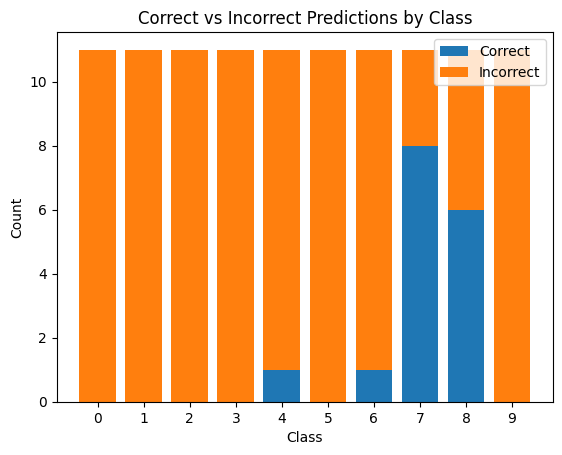

In [ ]:
plot_pedictions(model1,prediction_labels,prediction_images)  

##### Defenses

In [ ]:
from art.defences.preprocessor import JpegCompression

In [ ]:
preprocessor = JpegCompression(clip_values=(0,1),channels_first=True, apply_fit=True, apply_predict=True)
x_train_preprocessed, y_train_preprocessed = preprocessor(poison_x,poison_y)

In [ ]:
model_new = tf.keras.models.clone_model(model)
model_new.set_weights(model.get_weights())

In [ ]:
model_new.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])
model_new.fit(x_train_preprocessed, y_train_preprocessed, epochs=15, batch_size=32, validation_split=0.3)

Train on 1400 samples, validate on 600 samples
Epoch 1/15
1400/1400 [==============================] - 2s 1ms/sample - loss: 7.3853 - accuracy: 0.0907 - val_loss: 6.6645 - val_accuracy: 0.1050
Epoch 2/15
1400/1400 [==============================] - 1s 373us/sample - loss: 6.3426 - accuracy: 0.0964 - val_loss: 5.6469 - val_accuracy: 0.1067
Epoch 3/15
1400/1400 [==============================] - 1s 374us/sample - loss: 5.3408 - accuracy: 0.1000 - val_loss: 4.6857 - val_accuracy: 0.1133
Epoch 4/15
1400/1400 [==============================] - 1s 384us/sample - loss: 4.4203 - accuracy: 0.1129 - val_loss: 3.8517 - val_accuracy: 0.1483
Epoch 5/15
1400/1400 [==============================] - 1s 381us/sample - loss: 3.6471 - accuracy: 0.1600 - val_loss: 3.1876 - val_accuracy: 0.2333
Epoch 6/15
1400/1400 [==============================] - 1s 377us/sample - loss: 3.0529 - accuracy: 0.2450 - val_loss: 2.6916 - val_accuracy: 0.2967
Epoch 7/15
1400/1400 [==============================] - 1s 392us/sa

[7 7 7 7 6 6 7 6 7 1 0 9 5 6 9 6 7 7 8 6 7 7 4 9 8 7 4 7 9 6 6 5 8 7 9 7 4
 4 9 7 4 2 7 6 7 9 8 0 8 6 9 8 7 3 8 8 7 7 7 3 7 7 6 7 2 7 7 3 7 7 8 7 0 2
 9 7 7 8 7 7 7 7 7 5 7 3 9 7 3 4 7 7 8 4 5 7 7 7 6 7 2 7 4 6 7 7 0 4 7 5]
Accuracy: 0.4909090909090909


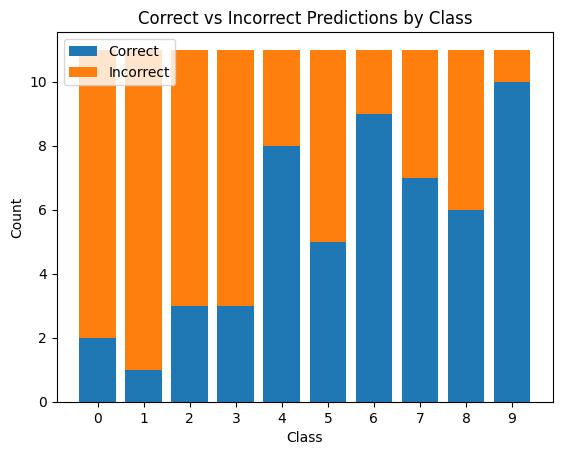

In [ ]:
plot_pedictions(model_new,prediction_labels,prediction_images)

### Poison attack 3: FeatureCollisionAttack

In [ ]:
import os, sys
from os.path import abspath

import warnings
warnings.filterwarnings('ignore')
from keras.models import load_model
from art import config
from art.utils import load_dataset, get_file
from art.estimators.classification import KerasClassifier
from art.attacks.poisoning import FeatureCollisionAttack
import numpy as np

%matplotlib inline
import matplotlib.pyplot as plt

np.random.seed(301)

In [ ]:
path = get_file('cifar_alexnet.h5',extract=False, path=config.ART_DATA_PATH,
                url='https://www.dropbox.com/s/ta75pl4krya5djj/cifar_alexnet.h5?dl=1')
classifier_model = load_model(path)
classifier = KerasClassifier(clip_values=(0, 1), model=classifier_model, use_logits=False, 
                             preprocessing=(0.5, 1))

[3 8 8 0 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 4 9 5 2 4 0 9 6 6 5 4 5 9 2 4
 1 9 5 4 6 5 6 0 9 3 9 7 6 9 8 0 3 8 8 7 7 5 3 7 3 6 3 2 1 2 3 7 2 8 8 0 2
 9 3 3 8 8 1 1 7 2 5 2 7 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 4 2 1 2 3 4 1 5]
Accuracy: 0.9727272727272728


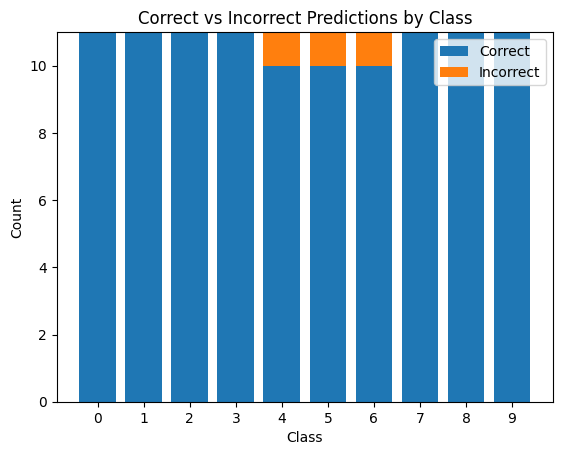

In [ ]:
plot_pedictions(classifier, prediction_labels,prediction_images)

In [ ]:
class_descr = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']
base_class = "frog" # one of ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']
base_instances=[]
base_labels=[]
for image, label in zip(x_train,y_train):
  if np.argmax(label) == class_descr.index(base_class):
    base_instances.append(image)
    base_labels.append(label)

base_instances=np.array(base_instances)
base_labels=np.array(base_labels)

In [ ]:
x_test_pred = np.argmax(classifier.predict(base_instances), axis=1)
nb_correct_pred = np.sum(x_test_pred == np.argmax(base_labels, axis=1))
print("New test data to be poisoned ({} images):".format(base_instances.shape[0]))
print("Correctly classified: {}".format(nb_correct_pred))
print("Incorrectly classified: {}".format(base_instances.shape[0]-nb_correct_pred))
target_instance = x_train[0]

New test data to be poisoned (5000 images):
Correctly classified: 4967
Incorrectly classified: 33


In [ ]:
attack = FeatureCollisionAttack(classifier, target_instance, classifier.layer_names[-1], max_iter=10, similarity_coeff=256, watermark=0.3)

#### Training on 500 poison sampels

In [ ]:
poison, poison_labels = attack.poison(base_instances[:500])

In [ ]:
model1 = tf.keras.models.clone_model(model)
model1.set_weights(model.get_weights())

In [ ]:
model1.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])
model1.fit(poison, poison_labels, epochs=15, batch_size=32, validation_split=0.3)

Train on 350 samples, validate on 150 samples
Epoch 1/15
350/350 [==============================] - 3s 8ms/sample - loss: 0.3736 - accuracy: 0.9371 - val_loss: 0.4040 - val_accuracy: 0.9333
Epoch 2/15
350/350 [==============================] - 0s 682us/sample - loss: 0.3593 - accuracy: 0.9371 - val_loss: 0.3909 - val_accuracy: 0.9333
Epoch 3/15
350/350 [==============================] - 0s 537us/sample - loss: 0.3472 - accuracy: 0.9371 - val_loss: 0.3803 - val_accuracy: 0.9333
Epoch 4/15
350/350 [==============================] - 0s 514us/sample - loss: 0.3374 - accuracy: 0.9343 - val_loss: 0.3715 - val_accuracy: 0.9267
Epoch 5/15
350/350 [==============================] - 0s 482us/sample - loss: 0.3286 - accuracy: 0.9343 - val_loss: 0.3661 - val_accuracy: 0.9267
Epoch 6/15
350/350 [==============================] - 0s 441us/sample - loss: 0.3228 - accuracy: 0.9286 - val_loss: 0.3616 - val_accuracy: 0.9133
Epoch 7/15
350/350 [==============================] - 0s 454us/sample - loss: 0.

##### Plots on orginl modelusing the classified test data set after implementing Poisioning on 500 poision sampels

[3 8 8 0 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 4 9 5 2 4 0 9 6 6 5 4 5 9 2 4
 1 9 5 4 6 5 6 0 9 3 9 7 6 9 8 5 3 8 8 7 7 5 3 7 5 6 3 2 1 2 3 7 2 8 8 0 2
 9 3 3 8 8 9 1 7 2 5 2 7 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 4 6 1 2 3 4 1 5]
Accuracy: 0.9363636363636364


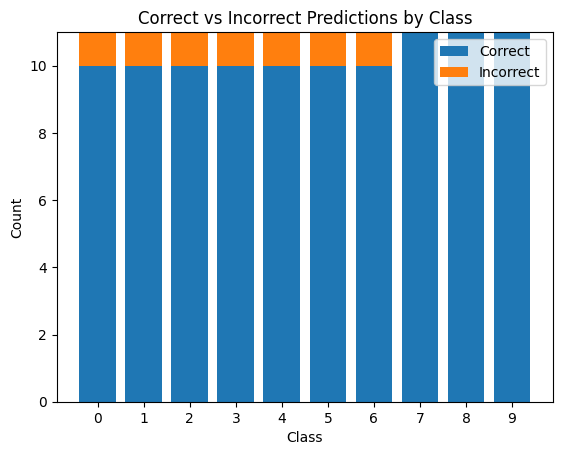

In [ ]:
plot_pedictions(model1,prediction_labels,prediction_images)  

##### Defenses

In [ ]:
from art.defences.preprocessor import JpegCompression

In [ ]:
preprocessor = JpegCompression(clip_values=(0,1),channels_first=True, apply_fit=True, apply_predict=True)
x_train_preprocessed, y_train_preprocessed = preprocessor(poison,poison_labels)

In [ ]:
model_new = tf.keras.models.clone_model(model)
model_new.set_weights(model.get_weights())

In [ ]:
model_new.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])
model_new.fit(x_train_preprocessed, y_train_preprocessed, epochs=15, batch_size=32, validation_split=0.3)

Train on 350 samples, validate on 150 samples
Epoch 1/15
350/350 [==============================] - 4s 10ms/sample - loss: 0.3665 - accuracy: 0.9286 - val_loss: 0.4150 - val_accuracy: 0.9133
Epoch 2/15
350/350 [==============================] - 0s 831us/sample - loss: 0.3588 - accuracy: 0.9314 - val_loss: 0.4143 - val_accuracy: 0.9133
Epoch 3/15
350/350 [==============================] - 0s 670us/sample - loss: 0.3523 - accuracy: 0.9314 - val_loss: 0.4144 - val_accuracy: 0.9133
Epoch 4/15
350/350 [==============================] - 0s 557us/sample - loss: 0.3472 - accuracy: 0.9314 - val_loss: 0.4123 - val_accuracy: 0.9133
Epoch 5/15
350/350 [==============================] - 0s 503us/sample - loss: 0.3420 - accuracy: 0.9314 - val_loss: 0.4125 - val_accuracy: 0.9133
Epoch 6/15
350/350 [==============================] - 0s 448us/sample - loss: 0.3377 - accuracy: 0.9314 - val_loss: 0.4134 - val_accuracy: 0.9067
Epoch 7/15
350/350 [==============================] - 0s 500us/sample - loss: 0

[3 8 8 0 6 6 1 6 3 1 0 9 5 7 9 6 5 7 8 6 7 0 4 9 5 2 4 0 9 6 6 5 4 5 9 2 4
 1 9 5 4 6 5 6 0 9 3 9 7 6 9 8 5 3 8 8 7 7 5 3 7 5 6 3 2 1 2 3 7 2 8 8 0 2
 9 3 3 8 8 9 1 7 2 5 2 7 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 4 6 1 2 3 4 1 5]
Accuracy: 0.9272727272727272


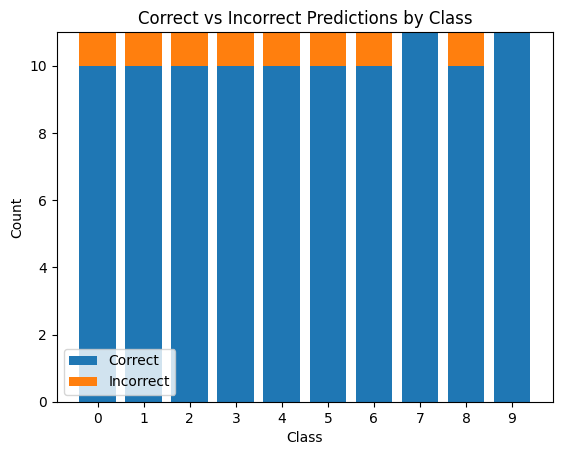

In [ ]:
plot_pedictions(model_new,prediction_labels,prediction_images)

#### Training on 1000 poison sampels

In [ ]:
poison, poison_labels = attack.poison(base_instances[:1000])

In [ ]:
model2 = tf.keras.models.clone_model(model)
model2.set_weights(model.get_weights())

In [ ]:
model2.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])
model2.fit(poison, poison_labels, epochs=15, batch_size=32, validation_split=0.3)

Train on 700 samples, validate on 300 samples
Epoch 1/15
700/700 [==============================] - 2s 3ms/sample - loss: 0.2521 - accuracy: 0.9429 - val_loss: 0.0748 - val_accuracy: 0.9867
Epoch 2/15
700/700 [==============================] - 0s 415us/sample - loss: 0.2492 - accuracy: 0.9443 - val_loss: 0.0703 - val_accuracy: 0.9867
Epoch 3/15
700/700 [==============================] - 0s 396us/sample - loss: 0.2486 - accuracy: 0.9443 - val_loss: 0.0681 - val_accuracy: 0.9867
Epoch 4/15
700/700 [==============================] - 0s 394us/sample - loss: 0.2471 - accuracy: 0.9443 - val_loss: 0.0684 - val_accuracy: 0.9867
Epoch 5/15
700/700 [==============================] - 0s 397us/sample - loss: 0.2458 - accuracy: 0.9443 - val_loss: 0.0701 - val_accuracy: 0.9867
Epoch 6/15
700/700 [==============================] - 0s 396us/sample - loss: 0.2449 - accuracy: 0.9443 - val_loss: 0.0688 - val_accuracy: 0.9867
Epoch 7/15
700/700 [==============================] - 0s 396us/sample - loss: 0.

##### Plots on orginl modelusing the classified test data set after implementing Poisioning on 1000 poision sampels

[3 8 8 0 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 4 9 5 2 4 0 9 6 6 5 4 5 9 2 4
 9 9 5 4 6 5 6 0 9 3 9 7 6 9 8 5 3 8 8 7 7 5 3 7 5 6 3 2 1 2 3 7 2 8 8 0 2
 9 3 3 8 8 9 1 7 2 5 2 7 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 4 6 1 2 3 4 1 5]
Accuracy: 0.9272727272727272


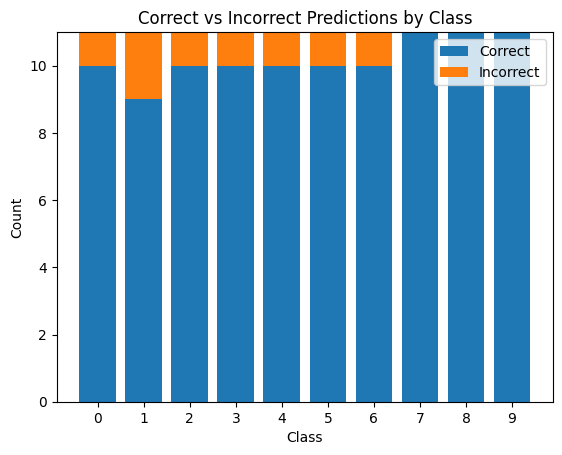

In [ ]:
plot_pedictions(model2,prediction_labels,prediction_images)  

##### Defenses

In [ ]:
from art.defences.preprocessor import JpegCompression

In [ ]:
preprocessor = JpegCompression(clip_values=(0,1),channels_first=True, apply_fit=True, apply_predict=True)
x_train_preprocessed, y_train_preprocessed = preprocessor(poison,poison_labels)

In [ ]:
model_new = tf.keras.models.clone_model(model)
model_new.set_weights(model.get_weights())

In [ ]:
model_new.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])
model_new.fit(x_train_preprocessed, y_train_preprocessed, epochs=15, batch_size=32, validation_split=0.3)

Train on 700 samples, validate on 300 samples
Epoch 1/15
700/700 [==============================] - 2s 3ms/sample - loss: 0.3128 - accuracy: 0.9400 - val_loss: 0.0933 - val_accuracy: 0.9667
Epoch 2/15
700/700 [==============================] - 0s 407us/sample - loss: 0.3061 - accuracy: 0.9400 - val_loss: 0.0966 - val_accuracy: 0.9667
Epoch 3/15
700/700 [==============================] - 0s 398us/sample - loss: 0.3006 - accuracy: 0.9400 - val_loss: 0.0967 - val_accuracy: 0.9667
Epoch 4/15
700/700 [==============================] - 0s 394us/sample - loss: 0.2966 - accuracy: 0.9400 - val_loss: 0.0929 - val_accuracy: 0.9667
Epoch 5/15
700/700 [==============================] - 0s 391us/sample - loss: 0.2932 - accuracy: 0.9400 - val_loss: 0.0919 - val_accuracy: 0.9700
Epoch 6/15
700/700 [==============================] - 0s 401us/sample - loss: 0.2890 - accuracy: 0.9400 - val_loss: 0.0880 - val_accuracy: 0.9733
Epoch 7/15
700/700 [==============================] - 0s 400us/sample - loss: 0.

[3 8 8 0 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 4 9 5 2 4 0 9 6 6 5 4 5 9 2 4
 9 9 5 4 6 5 6 0 9 3 9 7 6 9 8 5 3 8 8 7 7 5 3 7 5 6 3 2 1 2 3 7 2 8 8 0 2
 9 3 3 8 8 9 1 7 2 5 2 7 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 4 6 1 2 3 4 1 5]
Accuracy: 0.9272727272727272


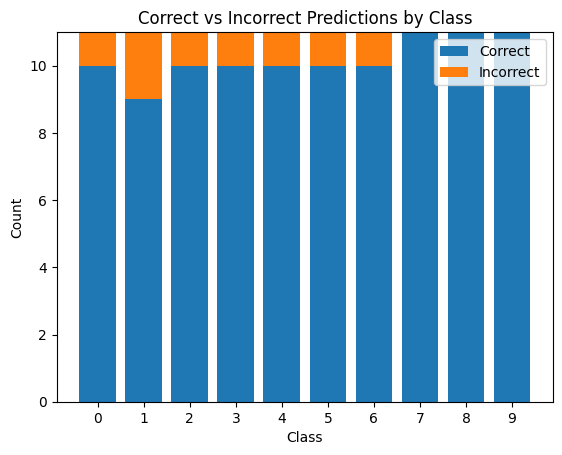

In [ ]:
plot_pedictions(model_new,prediction_labels,prediction_images)

#### Training on 1500 poison sampels

In [ ]:
poison, poison_labels = attack.poison(base_instances[:1500])

In [ ]:
model3 = tf.keras.models.clone_model(model)
model3.set_weights(model.get_weights())

In [ ]:
model3.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])
model3.fit(poison, poison_labels, epochs=15, batch_size=32, validation_split=0.3)

Train on 1050 samples, validate on 450 samples
Epoch 1/15
1050/1050 [==============================] - 4s 4ms/sample - loss: 0.2126 - accuracy: 0.9629 - val_loss: 0.0245 - val_accuracy: 0.9933
Epoch 2/15
1050/1050 [==============================] - 1s 524us/sample - loss: 0.2049 - accuracy: 0.9619 - val_loss: 0.0298 - val_accuracy: 0.9889
Epoch 3/15
1050/1050 [==============================] - 0s 467us/sample - loss: 0.2015 - accuracy: 0.9600 - val_loss: 0.0353 - val_accuracy: 0.9889
Epoch 4/15
1050/1050 [==============================] - 1s 480us/sample - loss: 0.1984 - accuracy: 0.9600 - val_loss: 0.0353 - val_accuracy: 0.9889
Epoch 5/15
1050/1050 [==============================] - 0s 474us/sample - loss: 0.1963 - accuracy: 0.9610 - val_loss: 0.0341 - val_accuracy: 0.9889
Epoch 6/15
1050/1050 [==============================] - 0s 462us/sample - loss: 0.1943 - accuracy: 0.9600 - val_loss: 0.0381 - val_accuracy: 0.9889
Epoch 7/15
1050/1050 [==============================] - 0s 464us/sa

##### Plots on orginl modelusing the classified test data set after implementing Poisioning on 1500 poision sampels

[3 8 8 0 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 4 9 5 2 4 0 9 6 6 5 4 5 9 2 4
 9 9 5 4 6 5 6 0 9 3 9 7 6 9 8 5 3 8 8 7 7 5 3 7 5 6 3 2 1 2 3 7 2 8 8 0 2
 9 3 3 8 8 9 1 7 2 5 2 7 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 4 6 1 2 3 4 1 5]
Accuracy: 0.9272727272727272


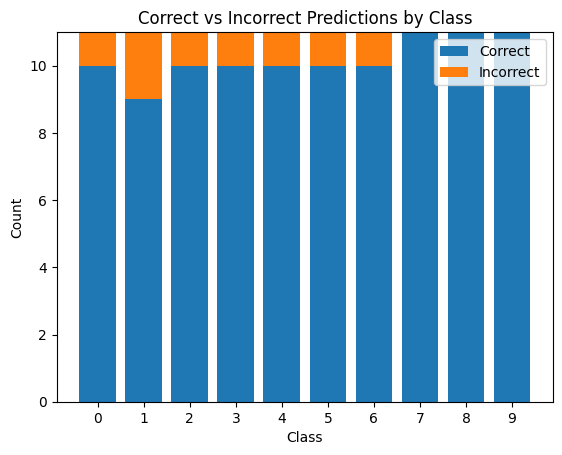

In [ ]:
plot_pedictions(model3,prediction_labels,prediction_images)  

##### Defenses

In [ ]:
from art.defences.preprocessor import JpegCompression

In [ ]:
preprocessor = JpegCompression(clip_values=(0,1),channels_first=True, apply_fit=True, apply_predict=True)
x_train_preprocessed, y_train_preprocessed = preprocessor(poison,poison_labels)

In [ ]:
model_new = tf.keras.models.clone_model(model)
model_new.set_weights(model.get_weights())

In [ ]:
model_new.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])
model_new.fit(x_train_preprocessed, y_train_preprocessed, epochs=15, batch_size=32, validation_split=0.3)

Train on 350 samples, validate on 150 samples
Epoch 1/15
350/350 [==============================] - 4s 10ms/sample - loss: 0.3665 - accuracy: 0.9286 - val_loss: 0.4150 - val_accuracy: 0.9133
Epoch 2/15
350/350 [==============================] - 0s 831us/sample - loss: 0.3588 - accuracy: 0.9314 - val_loss: 0.4143 - val_accuracy: 0.9133
Epoch 3/15
350/350 [==============================] - 0s 670us/sample - loss: 0.3523 - accuracy: 0.9314 - val_loss: 0.4144 - val_accuracy: 0.9133
Epoch 4/15
350/350 [==============================] - 0s 557us/sample - loss: 0.3472 - accuracy: 0.9314 - val_loss: 0.4123 - val_accuracy: 0.9133
Epoch 5/15
350/350 [==============================] - 0s 503us/sample - loss: 0.3420 - accuracy: 0.9314 - val_loss: 0.4125 - val_accuracy: 0.9133
Epoch 6/15
350/350 [==============================] - 0s 448us/sample - loss: 0.3377 - accuracy: 0.9314 - val_loss: 0.4134 - val_accuracy: 0.9067
Epoch 7/15
350/350 [==============================] - 0s 500us/sample - loss: 0

[3 8 8 0 6 6 1 6 3 1 0 9 5 7 9 6 5 7 8 6 7 0 4 9 5 2 4 0 9 6 6 5 4 5 9 2 4
 1 9 5 4 6 5 6 0 9 3 9 7 6 9 8 5 3 8 8 7 7 5 3 7 5 6 3 2 1 2 3 7 2 8 8 0 2
 9 3 3 8 8 9 1 7 2 5 2 7 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 4 6 1 2 3 4 1 5]
Accuracy: 0.9272727272727272


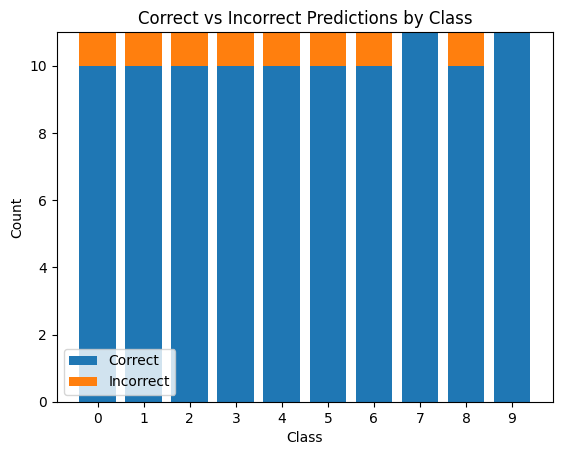

In [ ]:
plot_pedictions(model_new,prediction_labels,prediction_images)

#### Training on 2000 poison sampels

In [ ]:
poison, poison_labels = attack.poison(base_instances[:2000])

In [ ]:
model1 = tf.keras.models.clone_model(model)
model1.set_weights(model.get_weights())

In [ ]:
model1.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])
model1.fit(poison, poison_labels, epochs=15, batch_size=32, validation_split=0.3)

Train on 1400 samples, validate on 600 samples
Epoch 1/15
1400/1400 [==============================] - 4s 3ms/sample - loss: 0.1664 - accuracy: 0.9736 - val_loss: 0.0128 - val_accuracy: 1.0000
Epoch 2/15
1400/1400 [==============================] - 1s 468us/sample - loss: 0.1612 - accuracy: 0.9707 - val_loss: 0.0164 - val_accuracy: 0.9983
Epoch 3/15
1400/1400 [==============================] - 1s 447us/sample - loss: 0.1587 - accuracy: 0.9693 - val_loss: 0.0184 - val_accuracy: 0.9967
Epoch 4/15
1400/1400 [==============================] - 1s 457us/sample - loss: 0.1560 - accuracy: 0.9693 - val_loss: 0.0177 - val_accuracy: 0.9983
Epoch 5/15
1400/1400 [==============================] - 1s 439us/sample - loss: 0.1541 - accuracy: 0.9714 - val_loss: 0.0181 - val_accuracy: 0.9983
Epoch 6/15
1400/1400 [==============================] - 1s 462us/sample - loss: 0.1528 - accuracy: 0.9721 - val_loss: 0.0198 - val_accuracy: 0.9983
Epoch 7/15
1400/1400 [==============================] - 1s 439us/sa

##### Plots on orginl modelusing the classified test data set after implementing Poisioning on 500 poision sampels

[3 8 8 0 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 4 9 5 2 4 0 9 6 6 5 4 5 9 2 4
 9 9 5 4 6 5 6 0 9 3 9 7 6 9 8 5 3 8 8 7 7 5 3 7 5 6 3 2 1 2 3 7 2 8 8 0 2
 9 3 3 8 8 9 1 7 2 5 2 7 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 4 6 1 2 3 4 1 5]
Accuracy: 0.9272727272727272


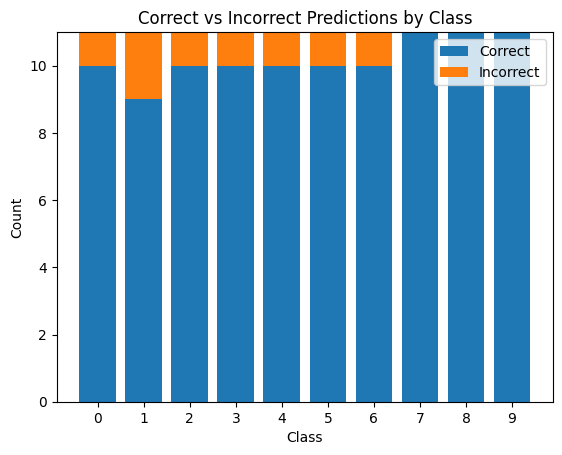

In [ ]:
plot_pedictions(model1,prediction_labels,prediction_images)  

##### Defenses

In [ ]:
from art.defences.preprocessor import JpegCompression

In [ ]:
preprocessor = JpegCompression(clip_values=(0,1),channels_first=True, apply_fit=True, apply_predict=True)
x_train_preprocessed, y_train_preprocessed = preprocessor(poison,poison_labels)

In [ ]:
model_new = tf.keras.models.clone_model(model)
model_new.set_weights(model.get_weights())

In [ ]:
model_new.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])
model_new.fit(x_train_preprocessed, y_train_preprocessed, epochs=15, batch_size=32, validation_split=0.3)

Train on 1400 samples, validate on 600 samples
Epoch 1/15
1400/1400 [==============================] - 4s 3ms/sample - loss: 0.1914 - accuracy: 0.9579 - val_loss: 0.0446 - val_accuracy: 0.9883
Epoch 2/15
1400/1400 [==============================] - 1s 456us/sample - loss: 0.1809 - accuracy: 0.9643 - val_loss: 0.0358 - val_accuracy: 0.9917
Epoch 3/15
1400/1400 [==============================] - 1s 448us/sample - loss: 0.1760 - accuracy: 0.9657 - val_loss: 0.0335 - val_accuracy: 0.9917
Epoch 4/15
1400/1400 [==============================] - 1s 456us/sample - loss: 0.1729 - accuracy: 0.9650 - val_loss: 0.0330 - val_accuracy: 0.9917
Epoch 5/15
1400/1400 [==============================] - 1s 454us/sample - loss: 0.1699 - accuracy: 0.9657 - val_loss: 0.0328 - val_accuracy: 0.9917
Epoch 6/15
1400/1400 [==============================] - 1s 455us/sample - loss: 0.1668 - accuracy: 0.9671 - val_loss: 0.0316 - val_accuracy: 0.9917
Epoch 7/15
1400/1400 [==============================] - 1s 476us/sa

[3 8 8 0 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 4 9 5 2 4 0 9 6 6 5 4 5 9 2 4
 9 9 5 4 6 5 6 0 9 6 9 7 6 9 8 5 3 8 8 7 7 5 3 7 5 6 3 2 1 2 3 7 2 8 8 0 2
 9 3 3 8 8 9 1 7 2 5 2 7 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 4 6 1 2 3 4 1 5]
Accuracy: 0.9181818181818182


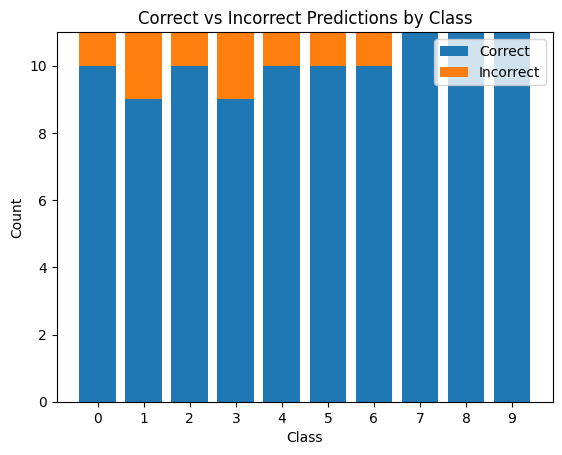

In [ ]:
plot_pedictions(model_new,prediction_labels,prediction_images)

# 3 Excraction attacks

### Preprocessing the data

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
import numpy as np
tf.compat.v1.disable_eager_execution()

In [ ]:
# Preprocess the data

# Load CIFAR-10 dataset
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.cifar10.load_data()

x_train = x_train.astype('float32') / 255
y_train = tf.keras.utils.to_categorical(y_train, 10)

In [ ]:
x_test = x_test.astype('float32') / 255
prediction_images=[]
prediction_labels=[]

classes_to_predict= {}
for i in range(10):
     classes_to_predict.update({i:[]})

for image,label in zip(x_test,y_test):
  if len(classes_to_predict[label[0]])<=10:
    prediction_images.append(image)
    prediction_labels.append(label[0])
    classes_to_predict[label[0]].append(image)

prediction_labels = np.array(prediction_labels)
prediction_images = np.array(prediction_images)
print(prediction_labels)

[3 8 8 0 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 4 9 5 2 4 0 9 6 6 5 4 5 9 2 4
 1 9 5 4 6 5 6 0 9 3 9 7 6 9 8 0 3 8 8 7 7 4 6 7 3 6 3 2 1 2 3 7 2 8 8 0 2
 9 3 3 8 8 1 1 7 2 5 2 7 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 4 2 1 2 5 4 1 5]


In [ ]:
#Fuction to plot correct preditions and accuracy for a model 
import matplotlib.pyplot as plt

def plot_pedictions(model,prediction_labels,prediction_images):
  # Make predictions on the test data
  predictions = model.predict(prediction_images)
  # Get the predicted classes
  predicted_classes = np.argmax(predictions, axis=1)
  
  # Print the predicted classes
  print(predicted_classes)

  # Get the predicted classes
  predicted_classes1 = np.argmax(model.predict(prediction_images), axis=1)
  # Compute the accuracy
  accuracy = np.sum(predicted_classes1 == prediction_labels) / len(prediction_labels)
  print("Accuracy:", accuracy)
  # Create an array to store the number of correct and incorrect predictions for each class
  correct = np.zeros(10)
  incorrect = np.zeros(10)

  # Loop through the predictions and count the number of correct and incorrect predictions for each class
  for i in range(len(predicted_classes)):
    if predicted_classes[i] == prediction_labels[i]:
        correct[prediction_labels[i]] += 1
    else:
        incorrect[prediction_labels[i]] += 1

  # Plot a stacked bar chart of the correct and incorrect predictions for each class
  fig, ax = plt.subplots()
  ax.bar(range(10), correct, label='Correct')
  ax.bar(range(10), incorrect, bottom=correct, label='Incorrect')
  ax.set_xticks(range(10))
  ax.set_xlabel('Class')
  ax.set_ylabel('Count')
  ax.set_title('Correct vs Incorrect Predictions by Class')
  ax.legend()
  plt.show()

## Preparing a victim model

In [ ]:
!pip install adversarial-robustness-toolbox

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from art import config
from art.utils import load_dataset, get_file
from keras.models import load_model
from art.estimators.classification import KerasClassifier
from keras.models import Sequential
from keras.layers import Dense, Flatten, Conv2D, MaxPooling2D, Activation, Dropout, MaxPool2D

In [ ]:
#Load the victim model
classifier_url = "https://tfhub.dev/deepmind/ganeval-cifar10-convnet/1"
IMAGE_SHAPE = (32, 32) 
victim_classifier = KerasClassifier(model=tf.keras.Sequential([hub.KerasLayer(classifier_url, input_shape=IMAGE_SHAPE+(3,))]), clip_values=(0, 1))

In [ ]:
def create_model_to_steal():
  model = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same', input_shape=x_train.shape[1:]),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),
    tf.keras.layers.Dropout(0.25),

    tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),
    tf.keras.layers.Dropout(0.25),

    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(512, activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(10, activation='softmax')
    ])
  
  model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

  return model

### Plots on orginl model using the classified test data set

[3 8 8 0 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 4 9 5 2 4 0 9 6 6 5 4 5 9 2 4
 9 9 5 4 6 5 6 0 9 3 9 7 6 9 8 5 3 8 8 7 7 5 3 7 5 6 3 2 1 2 3 7 2 8 8 0 2
 9 3 3 8 8 9 1 7 2 5 2 7 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 4 6 1 2 3 4 1 5]
Accuracy: 0.9272727272727272


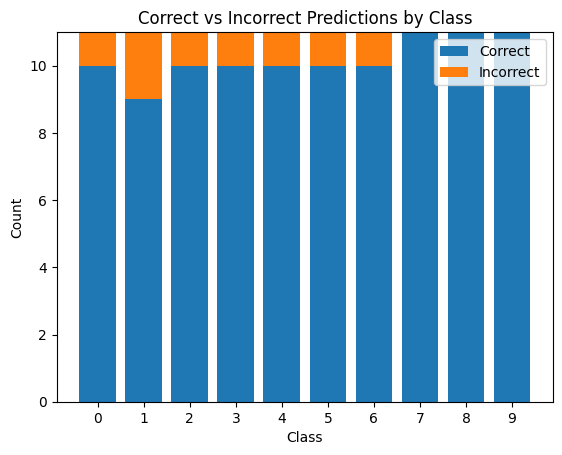

In [ ]:
plot_pedictions(victim_classifier, prediction_labels, prediction_images)

## Copycat CNN

In [ ]:
from art.attacks.extraction import CopycatCNN

### Using 5% of data from training dataset for extraction

In [ ]:
from sklearn.model_selection import train_test_split

_, stolen_images, _, stolen_labels = train_test_split(x_train, y_train, test_size=0.05, random_state=42)

In [ ]:
# Creating the "neural net thief" object that will steal the original classifier
copycat_cnn = CopycatCNN(batch_size_fit=200,batch_size_query=200,nb_epochs=20,nb_stolen=stolen_images.shape[0],
    classifier=victim_classifier
    )

In [ ]:
stolen_classifier1 = copycat_cnn.extract(
    x=stolen_images, 
    y=stolen_labels, 
    thieved_classifier= KerasClassifier(model=create_model_to_steal(), clip_values=(0, 1))
    )

Train on 2500 samples
Epoch 1/20
2500/2500 [==============================] - 3s 1ms/sample - loss: 2.8105 - accuracy: 0.2532
Epoch 2/20
2500/2500 [==============================] - 0s 176us/sample - loss: 2.0718 - accuracy: 0.3824
Epoch 3/20
2500/2500 [==============================] - 0s 171us/sample - loss: 1.6880 - accuracy: 0.4612
Epoch 4/20
2500/2500 [==============================] - 0s 164us/sample - loss: 1.4723 - accuracy: 0.5116
Epoch 5/20
2500/2500 [==============================] - 0s 158us/sample - loss: 1.2901 - accuracy: 0.5664
Epoch 6/20
2500/2500 [==============================] - 0s 154us/sample - loss: 1.1374 - accuracy: 0.6012
Epoch 7/20
2500/2500 [==============================] - 0s 162us/sample - loss: 1.0028 - accuracy: 0.6576
Epoch 8/20
2500/2500 [==============================] - 1s 217us/sample - loss: 0.8733 - accuracy: 0.6896
Epoch 9/20
2500/2500 [==============================] - 1s 209us/sample - loss: 0.8075 - accuracy: 0.7172
Epoch 10/20
2500/2500 [===

#### Plots on Copycat CNN traind on 5% of training sampels using the classified test data set

[2 4 2 2 2 2 2 2 2 2 2 4 2 2 2 2 2 2 4 2 4 4 2 2 4 2 2 4 4 2 2 2 2 2 2 2 4
 2 4 2 2 2 4 2 4 2 4 2 2 2 4 2 2 4 4 2 2 4 2 2 4 2 2 4 2 2 2 4 4 4 4 2 4 2
 2 2 2 4 4 2 2 4 2 4 2 4 4 2 2 2 2 4 4 2 2 2 2 8 4 2 2 4 4 2 2 4 2 4 2 2]
Accuracy: 0.11818181818181818


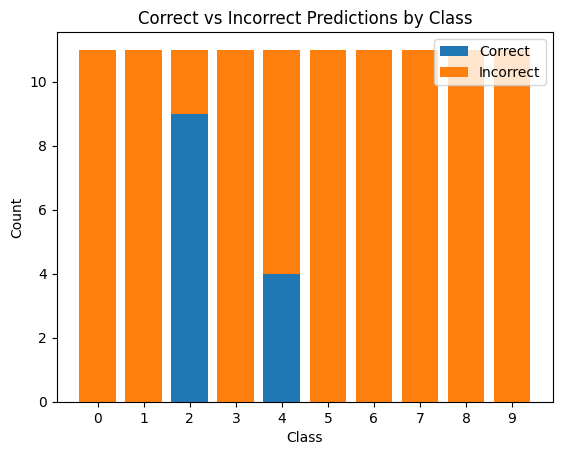

In [ ]:
plot_pedictions(stolen_classifier1, prediction_labels, prediction_images)

### Using 10% of data from training dataset for extraction

In [ ]:
from sklearn.model_selection import train_test_split

_, stolen_images, _, stolen_labels = train_test_split(x_train, y_train, test_size=0.1, random_state=42)

In [ ]:
# Creating the "neural net thief" object that will steal the original classifier
copycat_cnn = CopycatCNN(batch_size_fit=200,batch_size_query=200,nb_epochs=20,nb_stolen=stolen_images.shape[0],
    classifier=victim_classifier
    )

In [ ]:
stolen_classifier1 = copycat_cnn.extract(
    x=stolen_images, 
    y=stolen_labels, 
    thieved_classifier= KerasClassifier(model=create_model_to_steal(), clip_values=(0, 1))
    )

Train on 5000 samples
Epoch 1/20
5000/5000 [==============================] - 1s 263us/sample - loss: 2.4959 - accuracy: 0.3166
Epoch 2/20
5000/5000 [==============================] - 1s 157us/sample - loss: 1.7457 - accuracy: 0.4400
Epoch 3/20
5000/5000 [==============================] - 1s 157us/sample - loss: 1.4231 - accuracy: 0.5122
Epoch 4/20
5000/5000 [==============================] - 1s 157us/sample - loss: 1.2553 - accuracy: 0.5660
Epoch 5/20
5000/5000 [==============================] - 1s 170us/sample - loss: 1.0990 - accuracy: 0.6142
Epoch 6/20
5000/5000 [==============================] - 1s 205us/sample - loss: 0.9583 - accuracy: 0.6686
Epoch 7/20
5000/5000 [==============================] - 1s 205us/sample - loss: 0.8788 - accuracy: 0.6896
Epoch 8/20
5000/5000 [==============================] - 1s 198us/sample - loss: 0.7716 - accuracy: 0.7250
Epoch 9/20
5000/5000 [==============================] - 1s 163us/sample - loss: 0.6966 - accuracy: 0.7490
Epoch 10/20
5000/5000 [=

#### Plots on Copycat CNN traind on 10% of training sampels using the classified test data set

[8 8 0 8 4 3 1 2 3 1 0 9 5 7 9 8 5 7 8 4 5 2 0 9 4 2 4 4 9 4 3 8 2 3 8 2 4
 8 9 5 0 6 3 6 2 0 5 4 7 2 8 8 5 3 8 8 7 8 2 3 7 3 6 8 2 8 2 3 7 8 8 8 8 2
 0 4 3 8 8 9 1 7 2 2 2 8 8 8 4 4 0 2 7 4 2 3 1 8 4 0 2 9 4 2 2 2 4 4 7 5]
Accuracy: 0.5454545454545454


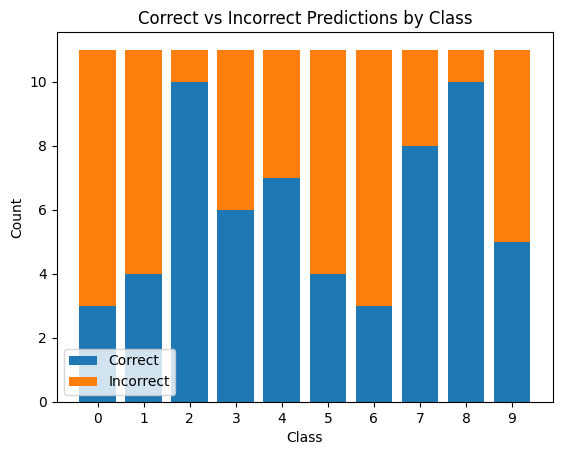

In [ ]:
plot_pedictions(stolen_classifier1, prediction_labels, prediction_images)

### Using 15% of data from training dataset for extraction

In [ ]:
from sklearn.model_selection import train_test_split

_, stolen_images, _, stolen_labels = train_test_split(x_train, y_train, test_size=0.15, random_state=42)

In [ ]:
# Creating the "neural net thief" object that will steal the original classifier
copycat_cnn = CopycatCNN(batch_size_fit=200,batch_size_query=200,nb_epochs=20,nb_stolen=stolen_images.shape[0],
    classifier=victim_classifier
    )

In [ ]:
stolen_classifier1 = copycat_cnn.extract(
    x=stolen_images, 
    y=stolen_labels, 
    thieved_classifier= KerasClassifier(model=create_model_to_steal(), clip_values=(0, 1))
    )

Train on 7500 samples
Epoch 1/20
7500/7500 [==============================] - 2s 240us/sample - loss: 2.4122 - accuracy: 0.3299
Epoch 2/20
7500/7500 [==============================] - 1s 156us/sample - loss: 1.6822 - accuracy: 0.4416
Epoch 3/20
7500/7500 [==============================] - 1s 158us/sample - loss: 1.4174 - accuracy: 0.5124
Epoch 4/20
7500/7500 [==============================] - 1s 157us/sample - loss: 1.2286 - accuracy: 0.5760
Epoch 5/20
7500/7500 [==============================] - 1s 185us/sample - loss: 1.1019 - accuracy: 0.6156
Epoch 6/20
7500/7500 [==============================] - 1s 199us/sample - loss: 1.0013 - accuracy: 0.6468
Epoch 7/20
7500/7500 [==============================] - 1s 183us/sample - loss: 0.9061 - accuracy: 0.6777
Epoch 8/20
7500/7500 [==============================] - 1s 161us/sample - loss: 0.8322 - accuracy: 0.7060
Epoch 9/20
7500/7500 [==============================] - 1s 160us/sample - loss: 0.7393 - accuracy: 0.7347
Epoch 10/20
7500/7500 [=

#### Plots on Copycat CNN traind on 15% of training sampels using the classified test data set

[3 8 8 8 6 6 1 6 3 1 0 9 3 7 9 6 5 7 8 6 7 0 2 9 4 4 4 0 9 6 6 5 2 3 9 7 4
 9 9 3 2 6 3 6 0 9 3 4 7 6 9 8 6 3 8 8 7 4 7 3 7 5 6 3 6 8 0 5 7 3 8 8 0 2
 0 3 3 8 8 9 1 7 2 2 2 8 9 0 6 4 0 0 7 2 4 6 1 8 4 0 2 9 4 6 6 2 6 4 1 5]
Accuracy: 0.6636363636363637


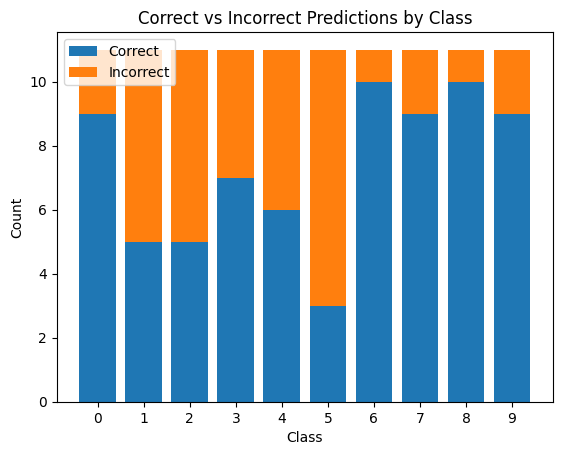

In [ ]:
plot_pedictions(stolen_classifier1, prediction_labels, prediction_images)

### Using 30% of data from training dataset for extraction

In [ ]:
from sklearn.model_selection import train_test_split

_, stolen_images, _, stolen_labels = train_test_split(x_train, y_train, test_size=0.3, random_state=42)

In [ ]:
# Creating the "neural net thief" object that will steal the original classifier
copycat_cnn = CopycatCNN(batch_size_fit=200,batch_size_query=200,nb_epochs=20,nb_stolen=stolen_images.shape[0],
    classifier=victim_classifier
    )

In [ ]:
stolen_classifier1 = copycat_cnn.extract(
    x=stolen_images, 
    y=stolen_labels, 
    thieved_classifier= KerasClassifier(model=create_model_to_steal(), clip_values=(0, 1))
    )

Train on 15000 samples
Epoch 1/20
15000/15000 [==============================] - 5s 346us/sample - loss: 2.0547 - accuracy: 0.3754
Epoch 2/20
15000/15000 [==============================] - 2s 154us/sample - loss: 1.4120 - accuracy: 0.5193
Epoch 3/20
15000/15000 [==============================] - 3s 169us/sample - loss: 1.1863 - accuracy: 0.5870
Epoch 4/20
15000/15000 [==============================] - 2s 166us/sample - loss: 1.0386 - accuracy: 0.6344
Epoch 5/20
15000/15000 [==============================] - 3s 193us/sample - loss: 0.9256 - accuracy: 0.6724
Epoch 6/20
15000/15000 [==============================] - 2s 156us/sample - loss: 0.8387 - accuracy: 0.7056
Epoch 7/20
15000/15000 [==============================] - 2s 156us/sample - loss: 0.7676 - accuracy: 0.7252
Epoch 8/20
15000/15000 [==============================] - 2s 156us/sample - loss: 0.7020 - accuracy: 0.7485
Epoch 9/20
15000/15000 [==============================] - 2s 156us/sample - loss: 0.6501 - accuracy: 0.7670
Epoch

#### Plots on Copycat CNN traind on 30% of training sampels using the classified test data set

[3 8 8 8 6 6 1 6 3 1 5 9 5 7 9 6 5 3 8 6 7 0 4 9 4 6 4 2 9 6 6 5 2 3 9 3 4
 9 9 5 0 6 5 6 0 9 3 9 7 2 9 8 2 3 8 8 7 3 5 3 7 5 6 0 2 1 0 3 7 0 8 8 0 2
 0 3 5 8 8 9 1 7 7 7 2 7 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 4 6 1 2 3 4 1 5]
Accuracy: 0.7454545454545455


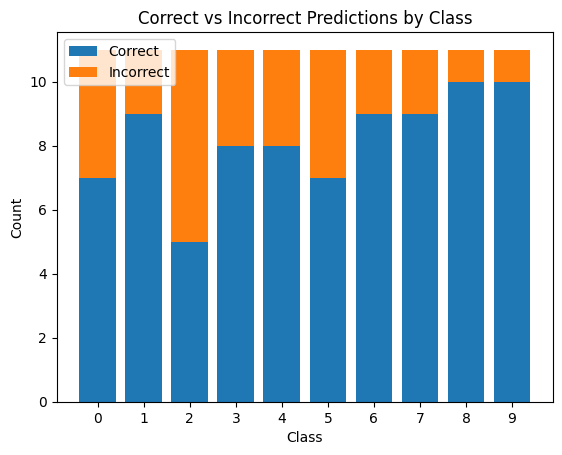

In [ ]:
plot_pedictions(stolen_classifier1, prediction_labels, prediction_images)

## KnockoffNets

In [ ]:
from art.attacks.extraction import KnockoffNets

### Using 5% of data from training dataset for extraction

In [ ]:
from sklearn.model_selection import train_test_split

_, stolen_images, _, stolen_labels = train_test_split(x_train, y_train, test_size=0.05, random_state=42)

In [ ]:
# Creating the "neural net thief" object that will steal the original classifier
knockoffnets = KnockoffNets(batch_size_fit=200,batch_size_query=200,nb_epochs=20,nb_stolen=stolen_images.shape[0],classifier=victim_classifier)

In [ ]:
# Extracting a thieved classifier by training the reference model
stolen_classifier2 = knockoffnets.extract(
    x=stolen_images, 
    y=stolen_labels, 
    thieved_classifier=KerasClassifier(model=create_model_to_steal(), clip_values=(0, 1))
    )

#### Plots on KnockoffNets traind on 5% of training sampels using the classified test data set

[2 8 2 2 2 2 2 2 2 2 2 4 2 2 2 2 2 2 8 4 4 2 2 2 2 2 2 2 4 2 2 2 2 2 2 2 2
 8 8 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 8 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 8 2 8 2
 2 2 2 8 2 8 2 2 2 2 2 2 8 8 2 2 2 4 4 2 2 2 8 8 2 2 2 4 4 2 2 2 2 2 2 2]
Accuracy: 0.15454545454545454


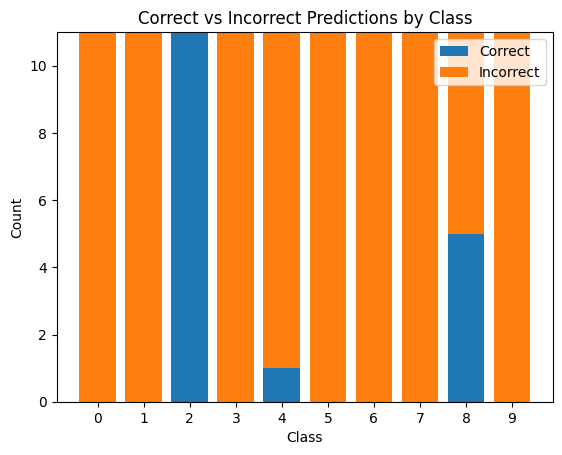

In [ ]:
plot_pedictions(stolen_classifier2, prediction_labels, prediction_images)

### Using 10% of data from training dataset for extraction

In [ ]:
from sklearn.model_selection import train_test_split

_, stolen_images, _, stolen_labels = train_test_split(x_train, y_train, test_size=0.1, random_state=42)

In [ ]:
# Creating the "neural net thief" object that will steal the original classifier
knockoffnets = KnockoffNets(batch_size_fit=200,batch_size_query=200,nb_epochs=20,nb_stolen=stolen_images.shape[0],classifier=victim_classifier)

In [ ]:
# Extracting a thieved classifier by training the reference model
stolen_classifier2 = knockoffnets.extract(
    x=stolen_images, 
    y=stolen_labels, 
    thieved_classifier=KerasClassifier(model=create_model_to_steal(), clip_values=(0, 1))
    )

#### Plots on KnockoffNets traind on 10% of training sampels using the classified test data set

[8 8 8 8 3 3 3 4 3 8 0 9 5 5 9 8 3 3 8 4 5 0 0 9 4 4 4 0 9 2 2 8 4 3 8 5 4
 9 9 3 8 6 3 6 8 8 3 5 4 4 2 8 2 3 8 8 7 8 2 3 7 3 6 8 2 8 8 5 3 8 8 8 8 2
 8 3 3 8 8 8 8 7 4 2 2 8 8 8 2 4 0 2 7 4 3 2 1 8 4 8 4 8 4 2 2 2 4 4 2 3]
Accuracy: 0.43636363636363634


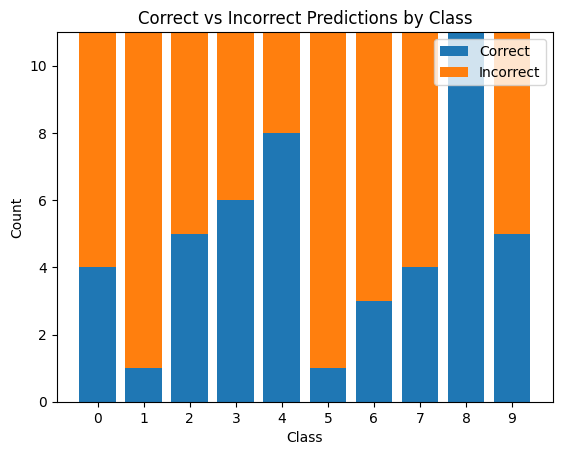

In [ ]:
plot_pedictions(stolen_classifier2, prediction_labels, prediction_images)

### Using 15% of data from training dataset for extraction

In [ ]:
from sklearn.model_selection import train_test_split

_, stolen_images, _, stolen_labels = train_test_split(x_train, y_train, test_size=0.15, random_state=42)

In [ ]:
# Creating the "neural net thief" object that will steal the original classifier
knockoffnets = KnockoffNets(batch_size_fit=200,batch_size_query=200,nb_epochs=20,nb_stolen=stolen_images.shape[0],classifier=victim_classifier)

In [ ]:
# Extracting a thieved classifier by training the reference model
stolen_classifier2 = knockoffnets.extract(
    x=stolen_images, 
    y=stolen_labels, 
    thieved_classifier=KerasClassifier(model=create_model_to_steal(), clip_values=(0, 1))
    )

#### Plots on KnockoffNets traind on 15% of training sampels using the classified test data set

[3 8 8 8 6 6 1 6 4 1 0 9 3 7 9 6 3 3 8 6 1 2 0 9 4 4 4 2 9 6 6 5 2 3 9 8 2
 1 9 5 0 6 3 6 8 9 2 9 7 2 9 2 2 3 8 8 7 8 2 4 7 3 6 2 2 1 8 3 7 4 8 8 0 2
 0 3 3 8 8 1 1 7 5 4 2 8 9 0 4 4 0 2 2 4 6 6 1 8 6 0 2 0 4 6 1 2 6 4 1 5]
Accuracy: 0.6090909090909091


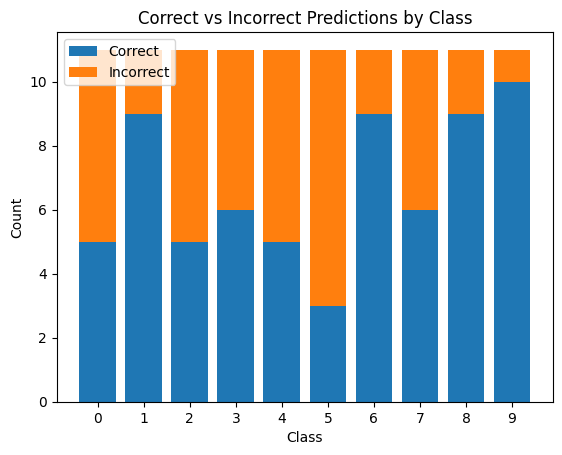

In [ ]:
plot_pedictions(stolen_classifier2, prediction_labels, prediction_images)

### Using 30% of data from training dataset for extraction

In [ ]:
from sklearn.model_selection import train_test_split

_, stolen_images, _, stolen_labels = train_test_split(x_train, y_train, test_size=0.30, random_state=42)

In [ ]:
# Creating the "neural net thief" object that will steal the original classifier
knockoffnets = KnockoffNets(batch_size_fit=200,batch_size_query=200,nb_epochs=20,nb_stolen=stolen_images.shape[0],classifier=victim_classifier)

In [ ]:
# Extracting a thieved classifier by training the reference model
stolen_classifier2 = knockoffnets.extract(
    x=stolen_images, 
    y=stolen_labels, 
    thieved_classifier=KerasClassifier(model=create_model_to_steal(), clip_values=(0, 1))
    )

#### Plots on KnockoffNets traind on 30% of training sampels using the classified test data set

[3 8 8 0 6 6 1 6 3 1 0 9 5 7 9 6 5 3 8 6 7 0 4 9 5 6 4 0 9 6 6 5 2 3 9 9 5
 9 9 5 8 6 3 6 0 9 3 9 7 6 9 8 6 3 8 8 7 5 5 3 7 3 6 3 2 1 2 3 4 0 8 8 0 2
 7 3 5 8 8 9 1 7 2 5 3 7 9 0 3 4 0 0 7 4 5 3 1 1 7 0 2 9 4 2 1 2 5 4 1 5]
Accuracy: 0.8


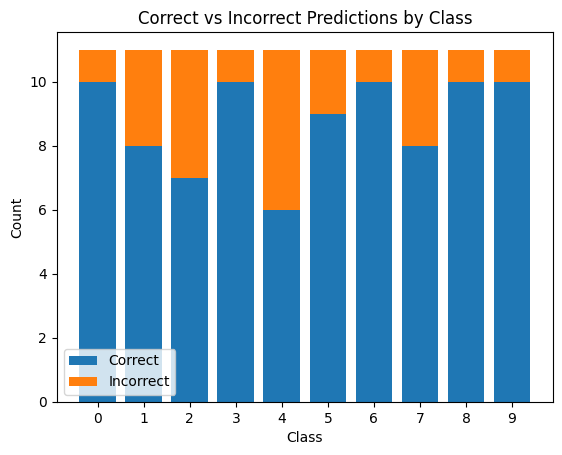

In [ ]:
plot_pedictions(stolen_classifier2, prediction_labels, prediction_images)

## Functionally Equivalent Extraction

This module implements the Functionally Equivalent Extraction attack for neural networks with two dense layers, ReLU activation at the first layer and logits output after the second layer.


In [ ]:
from art.attacks.extraction import FunctionallyEquivalentExtraction

In [ ]:
model_url = "https://tfhub.dev/deepmind/ganeval-cifar10-convnet/1"
hub_layer = hub.KerasLayer(model_url, input_shape=(32, 32, 3), trainable=False)

model = tf.keras.Sequential([
    tf.keras.layers.InputLayer([3072]), 
    tf.keras.layers.Reshape([32, 32, 3]),
    hub_layer,
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(10, activation='softmax')
])

model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [ ]:
model.fit(x_train.reshape(-1,32*32*3), y_train, epochs=10, batch_size=200, validation_split=0.1)

Train on 45000 samples, validate on 5000 samples
Epoch 1/10
45000/45000 [==============================] - ETA: 0s - loss: 3.4682 - accuracy: 0.2739

/usr/local/lib/python3.9/dist-packages/keras/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates


45000/45000 [==============================] - 10s 219us/sample - loss: 3.4682 - accuracy: 0.2739 - val_loss: 1.5105 - val_accuracy: 0.4714
Epoch 2/10
45000/45000 [==============================] - 9s 192us/sample - loss: 0.7242 - accuracy: 0.7649 - val_loss: 0.3026 - val_accuracy: 0.9428
Epoch 3/10
45000/45000 [==============================] - 9s 192us/sample - loss: 0.1911 - accuracy: 0.9733 - val_loss: 0.1204 - val_accuracy: 0.9890
Epoch 4/10
45000/45000 [==============================] - 9s 193us/sample - loss: 0.0908 - accuracy: 0.9942 - val_loss: 0.0685 - val_accuracy: 0.9954
Epoch 5/10
45000/45000 [==============================] - 9s 195us/sample - loss: 0.0561 - accuracy: 0.9977 - val_loss: 0.0459 - val_accuracy: 0.9978
Epoch 6/10
45000/45000 [==============================] - 9s 193us/sample - loss: 0.0393 - accuracy: 0.9986 - val_loss: 0.0336 - val_accuracy: 0.9986
Epoch 7/10
45000/45000 [==============================] - 9s 195us/sample - loss: 0.0295 - accuracy: 0.9995 - 

[3 8 8 0 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 4 9 5 2 4 0 9 6 6 5 4 5 9 2 4
 1 9 5 4 6 5 6 0 9 3 0 7 6 9 8 5 3 8 8 7 7 5 3 7 5 6 3 2 1 2 3 7 2 8 8 0 2
 9 3 3 8 8 9 1 7 2 5 2 7 9 0 3 4 0 0 7 4 5 3 1 1 4 0 2 1 4 6 1 2 3 4 1 5]
Accuracy: 0.9272727272727272


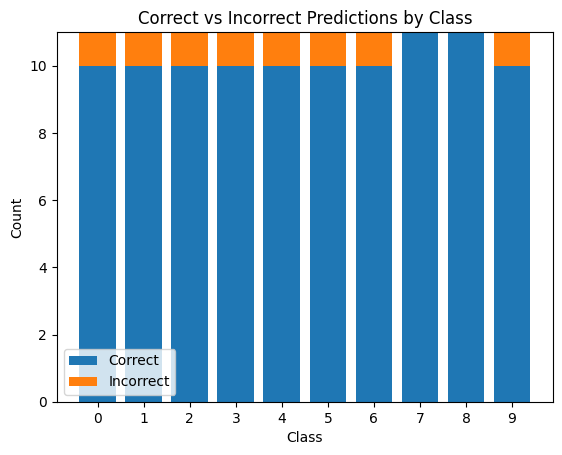

In [ ]:
plot_pedictions(model, prediction_labels, prediction_images.reshape(-1,32*32*3))

In [ ]:
victim_classifier = KerasClassifier(model, clip_values=(0, 1), use_logits=False)

### Using 5% of data from training dataset for extraction

In [ ]:
functionallyequivalentextraction = FunctionallyEquivalentExtraction(classifier=victim_classifier, num_neurons=512)

In [ ]:
from sklearn.model_selection import train_test_split

_, stolen_images, _, stolen_labels = train_test_split(x_train, y_train, test_size=0.05, random_state=42)

In [ ]:
# Extract the functionally equivalent model
extracted_model = functionallyequivalentextraction.extract(stolen_images,stolen_labels)

/usr/local/lib/python3.9/dist-packages/art/attacks/extraction/functionally_equivalent_extraction.py:221: RuntimeWarning: invalid value encountered in true_divide
  if np.sum(np.abs((m_1 - m_2) / m_1) < rel_diff_slope) > fraction_true * self.num_classes:
/usr/local/lib/python3.9/dist-packages/art/attacks/extraction/functionally_equivalent_extraction.py:225: RuntimeWarning: invalid value encountered in true_divide
  t_hat = t_1 + np.divide(y_2 - y_1 - (t_2 - t_1) * m_2, m_1 - m_2)
/usr/local/lib/python3.9/dist-packages/art/attacks/extraction/functionally_equivalent_extraction.py:226: RuntimeWarning: invalid value encountered in true_divide
  y_hat = y_1 + m_1 * np.divide(y_2 - y_1 - (t_2 - t_1) * m_2, m_1 - m_2)
/usr/local/lib/python3.9/dist-packages/art/attacks/extraction/functionally_equivalent_extraction.py:215: RuntimeWarning: invalid value encountered in true_divide
  m_1 = (self._o_l(x_1_p) - self._o_l(x_1)) / epsilon
/usr/local/lib/python3.9/dist-packages/art/attacks/extraction/fu

In [ ]:
plot_pedictions(extracted_model, prediction_labels, prediction_images)

### Using 10% of data from training dataset for extraction

In [ ]:
functionallyequivalentextraction = FunctionallyEquivalentExtraction(classifier=victim_classifier, num_neurons=512)

In [ ]:
from sklearn.model_selection import train_test_split

_, stolen_images, _, stolen_labels = train_test_split(x_train, y_train, test_size=0.10, random_state=42)

In [ ]:
# Extract the functionally equivalent model
extracted_model = functionallyequivalentextraction.extract(stolen_images,stolen_labels,delta_0=0.05,
                                    fraction_true=0.3,
                                    rel_diff_slope=0.1,
                                    rel_diff_value=0.1,
                                    delta_init_value=0.1,
                                    delta_value_max=2,
                                    d2_min=0.04,
                                    d_step=0.01,
                                    delta_sign=0.2,
                                    unit_vector_scale=1000)

In [ ]:
plot_pedictions(extracted_model, prediction_labels, prediction_images)

### Using 15% of data from training dataset for extraction

In [ ]:
functionallyequivalentextraction = FunctionallyEquivalentExtraction(classifier=victim_classifier, num_neurons=512)

In [ ]:
from sklearn.model_selection import train_test_split

_, stolen_images, _, stolen_labels = train_test_split(x_train, y_train, test_size=0.15, random_state=42)

In [ ]:
# Extract the functionally equivalent model
extracted_model = functionallyequivalentextraction.extract(stolen_images,stolen_labels)

In [ ]:
plot_pedictions(extracted_model, prediction_labels, prediction_images)

##Functionally Equivalent Extraction - 
High Accuracy and High Fidelity Extraction of Neural Networks

From paper here are 

1. Fully-supervised model extraction:
   - Load the CIFAR-10 dataset (consisting of 50,000 training images and 10,000 test images).
   - Define a ResNet-v2-50 or ResNet-v2-200 architecture in TensorFlow.
   - Define a loss function using cross-entropy loss.
   - Train the model on the CIFAR-10 training set.
   - For each point in the CIFAR-10 training set, query the victim model (the oracle) to obtain a label and the corresponding prediction score.
   - Use the obtained labels and scores as training labels for the extracted model.
   - Train the extracted model on the CIFAR-10 training set with the new labels.
   - Evaluate the extracted model on the CIFAR-10 test set to compare its performance with the baseline model.

2. Semi-supervised model extraction with MixMatch:
   - Load the CIFAR-10 dataset (consisting of 50,000 training images and 10,000 test images).
   - Define a ResNet-v2-50 or ResNet-v2-200 architecture in TensorFlow.
   - Define a loss function using MixMatch loss.
   - Train the model on the labeled CIFAR-10 training set and the unlabeled CIFAR-10 training set.
   - For each point in the CIFAR-10 training set, query the victim model (the oracle) to obtain a label and the corresponding prediction score.
   - Use the obtained labels and scores as training labels for the extracted model.
   - Train the extracted model on the labeled CIFAR-10 training set and the unlabeled CIFAR-10 training set with the new labels.
   - Evaluate the extracted model on the CIFAR-10 test set to compare its performance with the baseline model.

In [ ]:
import tensorflow as tf
import numpy as np
from tqdm import tqdm

In [ ]:
model = create_model_to_steal()

In [ ]:
model.fit(x_train, y_train, epochs=10, batch_size=32, validation_split=0.1)

Train on 45000 samples, validate on 5000 samples
Epoch 1/10
45000/45000 [==============================] - 26s 580us/sample - loss: 1.4669 - accuracy: 0.4994 - val_loss: 1.0752 - val_accuracy: 0.6282
Epoch 2/10
45000/45000 [==============================] - 23s 511us/sample - loss: 1.0139 - accuracy: 0.6434 - val_loss: 0.9396 - val_accuracy: 0.6796
Epoch 3/10
45000/45000 [==============================] - 23s 509us/sample - loss: 0.9026 - accuracy: 0.6830 - val_loss: 0.9458 - val_accuracy: 0.6840
Epoch 4/10
45000/45000 [==============================] - 32s 703us/sample - loss: 0.8167 - accuracy: 0.7145 - val_loss: 0.9256 - val_accuracy: 0.6942
Epoch 5/10
45000/45000 [==============================] - 32s 713us/sample - loss: 0.7458 - accuracy: 0.7399 - val_loss: 0.6697 - val_accuracy: 0.7668
Epoch 6/10
45000/45000 [==============================] - 24s 528us/sample - loss: 0.6951 - accuracy: 0.7560 - val_loss: 0.6789 - val_accuracy: 0.7696
Epoch 7/10
45000/45000 [=====================

###Plots on  custom victim model using the classified test data set

In [ ]:
plot_pedictions(model, prediction_labels, prediction_images) 

### Using 5% of data from training dataset for extraction

In [ ]:
from sklearn.model_selection import train_test_split

_, stolen_images, _, stolen_labels = train_test_split(x_train, y_train, test_size=0.05, random_state=42)

####Fully-supervised model extraction

In [ ]:
adversary_model = tf.keras.models.clone_model(model)

In [ ]:
adv_data = np.empty((0, 32, 32, 3), dtype=np.float32)
adv_labels = np.empty((0, 10), dtype=np.float32)
# Query the oracle for labels
for i in tqdm(range(stolen_images.shape[0])):
        # Choose a random datapoint
        idx = np.random.randint(stolen_images.shape[0])
        x = stolen_images[idx][np.newaxis, ...]
        
        # Query the oracle for its prediction
        y_pred = model.predict(x)[0]
        
        # Add the datapoint and its predicted label to the adversary's dataset
        adv_data = np.concatenate([adv_data, x], axis=0)
        adv_labels = np.concatenate([adv_labels, y_pred[np.newaxis, ...]], axis=0)    

100%|██████████| 2500/2500 [00:13<00:00, 187.32it/s]


In [ ]:
adversary_model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
adversary_model.fit(adv_data, adv_labels, epochs=10, batch_size=10)

Train on 2500 samples
Epoch 1/10
2500/2500 [==============================] - 5s 2ms/sample - loss: 2.3118 - accuracy: 0.3188
Epoch 2/10
2500/2500 [==============================] - 3s 1ms/sample - loss: 1.7261 - accuracy: 0.4504
Epoch 3/10
2500/2500 [==============================] - 3s 1ms/sample - loss: 1.5371 - accuracy: 0.5100
Epoch 4/10
2500/2500 [==============================] - 4s 1ms/sample - loss: 1.3185 - accuracy: 0.5884
Epoch 5/10
2500/2500 [==============================] - 4s 2ms/sample - loss: 1.1409 - accuracy: 0.6544
Epoch 6/10
2500/2500 [==============================] - 3s 1ms/sample - loss: 1.0041 - accuracy: 0.7224
Epoch 7/10
2500/2500 [==============================] - 3s 1ms/sample - loss: 0.9769 - accuracy: 0.7304
Epoch 8/10
2500/2500 [==============================] - 4s 2ms/sample - loss: 0.8632 - accuracy: 0.7768
Epoch 9/10
2500/2500 [==============================] - 4s 1ms/sample - loss: 0.8458 - accuracy: 0.7932
Epoch 10/10
2500/2500 [===================

##### Plots on  adversary_model model trained using 5% of training datasets through Fully supervised method

[6 9 9 0 6 6 1 6 6 9 8 9 6 7 9 8 5 9 9 6 0 0 4 9 6 9 3 2 9 6 6 5 6 6 9 6 4
 9 9 5 9 6 5 6 9 9 6 9 7 2 9 9 6 6 0 8 5 6 9 3 7 6 6 1 6 1 0 6 9 2 8 8 9 2
 0 3 6 0 0 1 1 7 5 9 2 9 9 0 6 6 0 5 3 4 6 6 1 1 6 0 6 9 7 6 6 2 6 6 9 5]
Accuracy: 0.4636363636363636


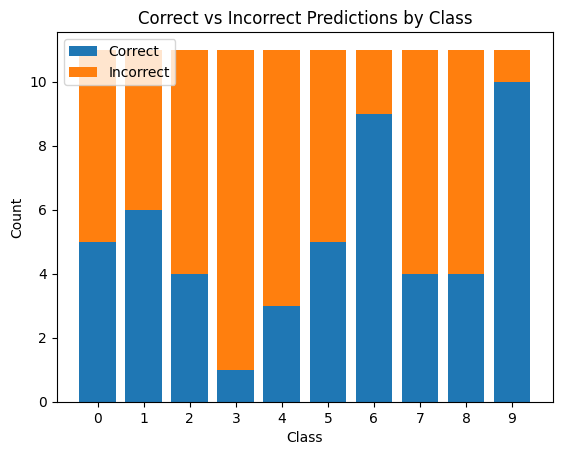

In [ ]:
plot_pedictions(adversary_model, prediction_labels, prediction_images) 

####Semi-supervised model extraction with MixMatch

In [ ]:
# Define the MixMatch loss function
def mixmatch_loss(y_true, y_pred):
    alpha = 0.75
    T = 0.5
    y_u = y_pred[1250:]  # Unlabeled predictions
    y_l = y_pred[:1250]   # Labeled predictions
    y_l_true = y_true[:1250]  # True labels for labeled data
    L_x = tf.reduce_mean(tf.keras.losses.categorical_crossentropy(y_l_true, y_l))
    L_u = tf.reduce_mean(tf.keras.losses.kullback_leibler_divergence(y_u, tf.nn.softmax(y_u / T)))    
    return L_x - alpha * L_u

In [ ]:
def mixmatch_loss1(y_true, y_pred):
    # Add label smoothing to improve generalization
    label_smoothing = 0.1
    y_true = (1 - label_smoothing) * y_true + label_smoothing / 10

    # Compute cross-entropy loss
    loss = tf.keras.losses.categorical_crossentropy(y_true, y_pred, from_logits=True)

    # Add L2 regularization to the loss
    l2_loss = tf.reduce_sum([tf.nn.l2_loss(w) for w in model.trainable_weights])
    loss += 0.001 * l2_loss

    return tf.reduce_mean(loss)

In [ ]:
# Compile the model
adversary_model1 = tf.keras.models.clone_model(adversary_model)
adversary_model1.set_weights(adversary_model.get_weights())
adversary_model1.compile(optimizer='adam',loss=mixmatch_loss1,metrics=['accuracy'])

In [ ]:
# Train the model on labeled and unlabeled data
batch_size = 10
num_epochs = 20

for epoch in range(num_epochs):
    # Shuffle the labeled and unlabeled data
    x_train_labeled,  x_train_unlabeled, y_train_labeled, _ = train_test_split(stolen_images, stolen_labels, test_size=0.5, random_state=42)
    # Train on labeled data
    adversary_model1.train_on_batch(x_train_labeled, y_train_labeled)
    
    # Query the oracle for labels and predictions on unlabeled data
    y_pred_unlabeled = model.predict(x_train_unlabeled)
    y_pred_unlabeled_max = np.max(y_pred_unlabeled, axis=1)
    y_pred_unlabeled_argmax = np.argmax(y_pred_unlabeled, axis=1)
    y_train_unlabeled = tf.keras.utils.to_categorical(y_pred_unlabeled_argmax, num_classes=10)
    
    # Train on unlabeled data with new labels
    adversary_model1.train_on_batch(x_train_unlabeled, y_train_unlabeled)
    
    # Evaluate the model on the test set
    loss, accuracy = adversary_model1.evaluate(np.concatenate((x_train_labeled, x_train_unlabeled), axis=0), np.concatenate((y_train_labeled, y_train_unlabeled), axis=0), verbose=0)
    print(f'Epoch {epoch+1}/{num_epochs}, loss: {loss:.4f}, accuracy: {accuracy:.4f}')


Epoch 1/20, loss: 12.4593, accuracy: 0.7828
Epoch 2/20, loss: 12.3642, accuracy: 0.8132
Epoch 3/20, loss: 12.3054, accuracy: 0.8400
Epoch 4/20, loss: 12.2724, accuracy: 0.8568
Epoch 5/20, loss: 12.2415, accuracy: 0.8788
Epoch 6/20, loss: 12.2059, accuracy: 0.8920
Epoch 7/20, loss: 12.1799, accuracy: 0.9084
Epoch 8/20, loss: 12.1533, accuracy: 0.9216
Epoch 9/20, loss: 12.1285, accuracy: 0.9384
Epoch 10/20, loss: 12.1132, accuracy: 0.9480
Epoch 11/20, loss: 12.1073, accuracy: 0.9512
Epoch 12/20, loss: 12.0961, accuracy: 0.9552
Epoch 13/20, loss: 12.0829, accuracy: 0.9604
Epoch 14/20, loss: 12.0683, accuracy: 0.9700
Epoch 15/20, loss: 12.0548, accuracy: 0.9748
Epoch 16/20, loss: 12.0406, accuracy: 0.9804
Epoch 17/20, loss: 12.0300, accuracy: 0.9868
Epoch 18/20, loss: 12.0296, accuracy: 0.9868
Epoch 19/20, loss: 12.0319, accuracy: 0.9864
Epoch 20/20, loss: 12.0336, accuracy: 0.9868


##### Plots on  adversary_model model trained using 5% of training datasets through semi-supervised method

/usr/local/lib/python3.9/dist-packages/keras/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


[6 8 2 2 6 6 1 6 3 1 5 9 6 7 9 8 5 5 8 6 2 2 2 9 4 2 3 2 9 6 6 5 4 5 9 6 4
 9 9 5 0 6 5 6 9 9 5 5 7 6 0 8 6 6 8 8 5 8 4 2 7 5 6 3 2 1 0 5 9 4 8 8 9 2
 0 3 5 8 8 8 1 7 2 2 2 8 9 0 2 7 8 2 7 4 5 3 1 8 4 0 2 1 4 2 1 2 8 4 2 5]
Accuracy: 0.6181818181818182


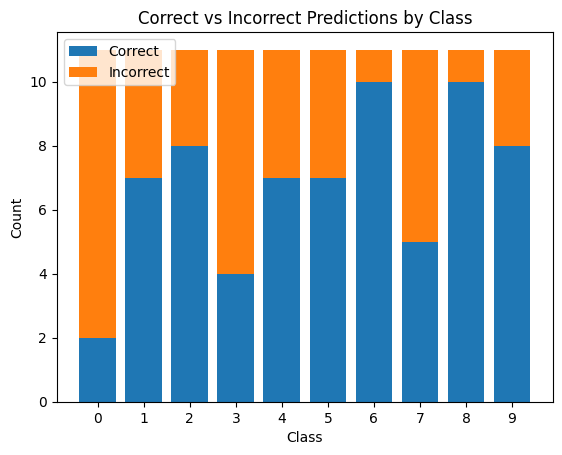

In [ ]:
plot_pedictions(adversary_model1, prediction_labels, prediction_images) 

### Using 10% of data from training dataset for extraction

In [ ]:
from sklearn.model_selection import train_test_split

_, stolen_images, _, stolen_labels = train_test_split(x_train, y_train, test_size=0.10, random_state=42)

####Fully-supervised model extraction

In [ ]:
adversary_model = tf.keras.models.clone_model(model)

In [ ]:
adv_data = np.empty((0, 32, 32, 3), dtype=np.float32)
adv_labels = np.empty((0, 10), dtype=np.float32)
# Query the oracle for labels
for i in tqdm(range(stolen_images.shape[0])):
        # Choose a random datapoint
        idx = np.random.randint(stolen_images.shape[0])
        x = stolen_images[idx][np.newaxis, ...]
        
        # Query the oracle for its prediction
        y_pred = model.predict(x)[0]
        
        # Add the datapoint and its predicted label to the adversary's dataset
        adv_data = np.concatenate([adv_data, x], axis=0)
        adv_labels = np.concatenate([adv_labels, y_pred[np.newaxis, ...]], axis=0)    

100%|██████████| 5000/5000 [01:10<00:00, 70.90it/s]


In [ ]:
adversary_model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
adversary_model.fit(adv_data, adv_labels, epochs=10, batch_size=10)

Train on 5000 samples
Epoch 1/10
5000/5000 [==============================] - 9s 2ms/sample - loss: 2.2682 - accuracy: 0.3176
Epoch 2/10
5000/5000 [==============================] - 8s 2ms/sample - loss: 1.7509 - accuracy: 0.4292
Epoch 3/10
5000/5000 [==============================] - 7s 1ms/sample - loss: 1.5107 - accuracy: 0.4930
Epoch 4/10
5000/5000 [==============================] - 8s 2ms/sample - loss: 1.3324 - accuracy: 0.5584
Epoch 5/10
5000/5000 [==============================] - 7s 1ms/sample - loss: 1.2009 - accuracy: 0.6020
Epoch 6/10
5000/5000 [==============================] - 8s 2ms/sample - loss: 1.0935 - accuracy: 0.6648
Epoch 7/10
5000/5000 [==============================] - 7s 1ms/sample - loss: 1.0261 - accuracy: 0.6950
Epoch 8/10
5000/5000 [==============================] - 8s 2ms/sample - loss: 0.9980 - accuracy: 0.7028
Epoch 9/10
5000/5000 [==============================] - 8s 2ms/sample - loss: 0.9390 - accuracy: 0.7272
Epoch 10/10
5000/5000 [===================

##### Plots on  adversary_model model trained using 10% of training datasets through Fully supervised method

[3 1 1 8 6 6 1 6 3 1 4 9 6 7 9 6 5 6 9 6 4 0 2 9 4 6 4 2 9 6 6 4 2 3 9 6 7
 9 9 3 0 6 3 6 9 9 3 6 4 6 6 6 6 6 8 4 7 6 6 3 7 3 6 1 6 1 0 3 6 4 8 8 9 2
 7 6 3 8 8 9 1 7 5 7 7 5 9 8 4 4 0 2 7 4 5 6 1 1 6 0 2 1 4 6 6 7 6 4 1 5]
Accuracy: 0.5


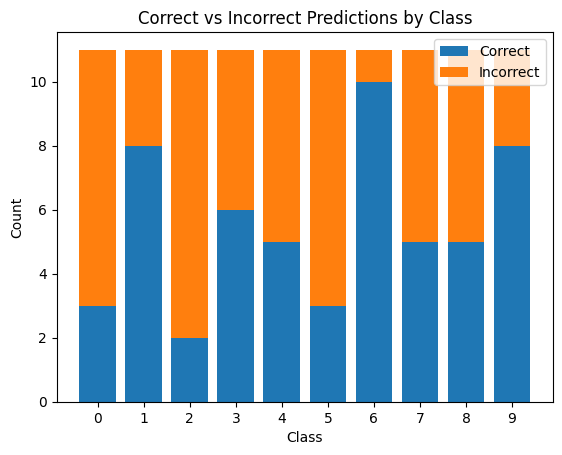

In [ ]:
plot_pedictions(adversary_model, prediction_labels, prediction_images) 

####Semi-supervised model extraction with MixMatch

In [ ]:
# Define the MixMatch loss function
def mixmatch_loss(y_true, y_pred):
    alpha = 0.75
    T = 0.5
    y_u = y_pred[1250:]  # Unlabeled predictions
    y_l = y_pred[:1250]   # Labeled predictions
    y_l_true = y_true[:1250]  # True labels for labeled data
    L_x = tf.reduce_mean(tf.keras.losses.categorical_crossentropy(y_l_true, y_l))
    L_u = tf.reduce_mean(tf.keras.losses.kullback_leibler_divergence(y_u, tf.nn.softmax(y_u / T)))    
    return L_x - alpha * L_u

In [ ]:
def mixmatch_loss1(y_true, y_pred):
    # Add label smoothing to improve generalization
    label_smoothing = 0.1
    y_true = (1 - label_smoothing) * y_true + label_smoothing / 10

    # Compute cross-entropy loss
    loss = tf.keras.losses.categorical_crossentropy(y_true, y_pred, from_logits=True)

    # Add L2 regularization to the loss
    l2_loss = tf.reduce_sum([tf.nn.l2_loss(w) for w in model.trainable_weights])
    loss += 0.001 * l2_loss

    return tf.reduce_mean(loss)

In [ ]:
# Compile the model
adversary_model1 = tf.keras.models.clone_model(adversary_model)
adversary_model1.set_weights(adversary_model.get_weights())
adversary_model1.compile(optimizer='adam',loss=mixmatch_loss1,metrics=['accuracy'])

In [ ]:
# Train the model on labeled and unlabeled data
batch_size = 10
num_epochs = 20

for epoch in range(num_epochs):
    # Shuffle the labeled and unlabeled data
    x_train_labeled,  x_train_unlabeled, y_train_labeled, _ = train_test_split(stolen_images, stolen_labels, test_size=0.5, random_state=42)
    # Train on labeled data
    adversary_model1.train_on_batch(x_train_labeled, y_train_labeled)
    
    # Query the oracle for labels and predictions on unlabeled data
    y_pred_unlabeled = model.predict(x_train_unlabeled)
    y_pred_unlabeled_max = np.max(y_pred_unlabeled, axis=1)
    y_pred_unlabeled_argmax = np.argmax(y_pred_unlabeled, axis=1)
    y_train_unlabeled = tf.keras.utils.to_categorical(y_pred_unlabeled_argmax, num_classes=10)
    
    # Train on unlabeled data with new labels
    adversary_model1.train_on_batch(x_train_unlabeled, y_train_unlabeled)
    
    # Evaluate the model on the test set
    loss, accuracy = adversary_model1.evaluate(np.concatenate((x_train_labeled, x_train_unlabeled), axis=0), np.concatenate((y_train_labeled, y_train_unlabeled), axis=0), verbose=0)
    print(f'Epoch {epoch+1}/{num_epochs}, loss: {loss:.4f}, accuracy: {accuracy:.4f}')


Epoch 1/20, loss: 12.2809, accuracy: 0.8127
Epoch 2/20, loss: 12.2409, accuracy: 0.8207
Epoch 3/20, loss: 12.2172, accuracy: 0.8225
Epoch 4/20, loss: 12.1955, accuracy: 0.8237
Epoch 5/20, loss: 12.1722, accuracy: 0.8319
Epoch 6/20, loss: 12.1505, accuracy: 0.8427
Epoch 7/20, loss: 12.1382, accuracy: 0.8482
Epoch 8/20, loss: 12.1337, accuracy: 0.8485
Epoch 9/20, loss: 12.1321, accuracy: 0.8477
Epoch 10/20, loss: 12.1326, accuracy: 0.8447
Epoch 11/20, loss: 12.1307, accuracy: 0.8451
Epoch 12/20, loss: 12.1248, accuracy: 0.8482
Epoch 13/20, loss: 12.1152, accuracy: 0.8525
Epoch 14/20, loss: 12.1049, accuracy: 0.8585
Epoch 15/20, loss: 12.0959, accuracy: 0.8625
Epoch 16/20, loss: 12.0882, accuracy: 0.8661
Epoch 17/20, loss: 12.0817, accuracy: 0.8707
Epoch 18/20, loss: 12.0760, accuracy: 0.8733
Epoch 19/20, loss: 12.0711, accuracy: 0.8755
Epoch 20/20, loss: 12.0660, accuracy: 0.8771


##### Plots on  adversary_model model trained using 10% of training datasets through semi-supervised method

[3 8 8 0 6 6 1 6 3 1 0 9 6 7 9 8 5 7 8 6 7 0 4 9 4 2 4 0 9 6 6 5 4 3 9 3 4
 9 9 5 4 6 3 6 0 9 3 9 7 6 9 8 6 3 8 8 7 6 3 3 7 5 6 3 2 1 0 3 4 0 8 8 0 2
 1 3 3 8 8 1 1 7 2 9 7 7 9 0 6 4 0 0 7 4 5 6 1 1 4 0 2 1 4 6 1 2 3 4 1 5]
Accuracy: 0.8090909090909091


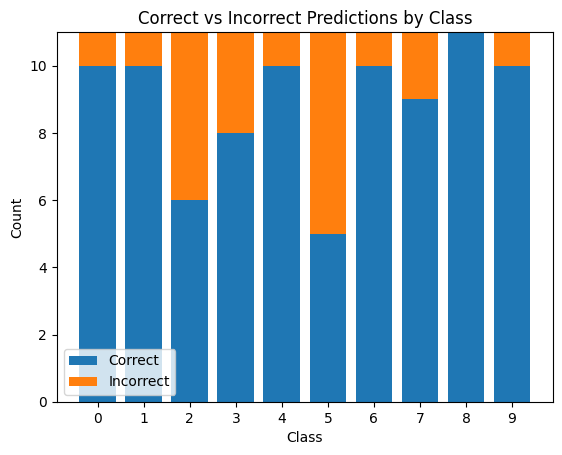

In [ ]:
plot_pedictions(adversary_model1, prediction_labels, prediction_images) 

### Using 15% of data from training dataset for extraction

In [ ]:
from sklearn.model_selection import train_test_split

_, stolen_images, _, stolen_labels = train_test_split(x_train, y_train, test_size=0.15, random_state=42)

####Fully-supervised model extraction

In [ ]:
adversary_model = tf.keras.models.clone_model(model)

In [ ]:
adv_data = np.empty((0, 32, 32, 3), dtype=np.float32)
adv_labels = np.empty((0, 10), dtype=np.float32)
# Query the oracle for labels
for i in tqdm(range(stolen_images.shape[0])):
        # Choose a random datapoint
        idx = np.random.randint(stolen_images.shape[0])
        x = stolen_images[idx][np.newaxis, ...]
        
        # Query the oracle for its prediction
        y_pred = model.predict(x)[0]
        
        # Add the datapoint and its predicted label to the adversary's dataset
        adv_data = np.concatenate([adv_data, x], axis=0)
        adv_labels = np.concatenate([adv_labels, y_pred[np.newaxis, ...]], axis=0)    

100%|██████████| 7500/7500 [02:43<00:00, 45.88it/s]


In [ ]:
adversary_model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
adversary_model.fit(adv_data, adv_labels, epochs=10, batch_size=10)

Train on 7500 samples
Epoch 1/10
7500/7500 [==============================] - 12s 2ms/sample - loss: 2.0512 - accuracy: 0.3672
Epoch 2/10
7500/7500 [==============================] - 12s 2ms/sample - loss: 1.4594 - accuracy: 0.5053
Epoch 3/10
7500/7500 [==============================] - 12s 2ms/sample - loss: 1.2671 - accuracy: 0.5893
Epoch 4/10
7500/7500 [==============================] - 12s 2ms/sample - loss: 1.0881 - accuracy: 0.6496
Epoch 5/10
7500/7500 [==============================] - 12s 2ms/sample - loss: 1.0048 - accuracy: 0.6896
Epoch 6/10
7500/7500 [==============================] - 12s 2ms/sample - loss: 0.9981 - accuracy: 0.6916
Epoch 7/10
7500/7500 [==============================] - 10s 1ms/sample - loss: 0.9649 - accuracy: 0.7104
Epoch 8/10
7500/7500 [==============================] - 11s 1ms/sample - loss: 0.9104 - accuracy: 0.7320
Epoch 9/10
7500/7500 [==============================] - 12s 2ms/sample - loss: 0.8837 - accuracy: 0.7453
Epoch 10/10
7500/7500 [==========

##### Plots on  adversary_model model trained using 15% of training datasets through Fully supervised method

[6 8 3 0 6 6 1 4 3 1 5 9 5 7 9 6 5 3 8 6 9 0 1 9 4 5 3 2 9 6 6 5 2 3 9 6 4
 9 9 5 2 6 5 6 0 9 3 5 7 6 9 8 6 3 8 8 5 6 5 3 7 5 6 3 6 1 0 5 9 8 8 8 9 2
 1 3 5 8 8 1 1 7 5 5 5 8 9 0 3 4 0 2 2 4 5 6 1 1 4 1 2 1 5 5 9 2 6 4 1 5]
Accuracy: 0.6090909090909091


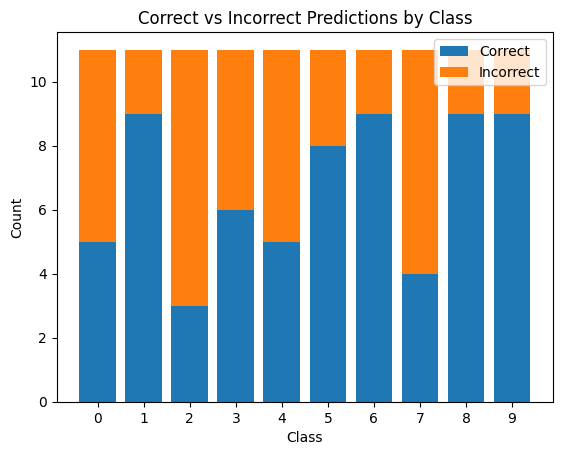

In [ ]:
plot_pedictions(adversary_model, prediction_labels, prediction_images) 

####Semi-supervised model extraction with MixMatch

In [ ]:
# Define the MixMatch loss function
def mixmatch_loss(y_true, y_pred):
    alpha = 0.75
    T = 0.5
    y_u = y_pred[1250:]  # Unlabeled predictions
    y_l = y_pred[:1250]   # Labeled predictions
    y_l_true = y_true[:1250]  # True labels for labeled data
    L_x = tf.reduce_mean(tf.keras.losses.categorical_crossentropy(y_l_true, y_l))
    L_u = tf.reduce_mean(tf.keras.losses.kullback_leibler_divergence(y_u, tf.nn.softmax(y_u / T)))    
    return L_x - alpha * L_u

In [ ]:
def mixmatch_loss1(y_true, y_pred):
    # Add label smoothing to improve generalization
    label_smoothing = 0.1
    y_true = (1 - label_smoothing) * y_true + label_smoothing / 10

    # Compute cross-entropy loss
    loss = tf.keras.losses.categorical_crossentropy(y_true, y_pred, from_logits=True)

    # Add L2 regularization to the loss
    l2_loss = tf.reduce_sum([tf.nn.l2_loss(w) for w in model.trainable_weights])
    loss += 0.001 * l2_loss

    return tf.reduce_mean(loss)

In [ ]:
# Compile the model
adversary_model1 = tf.keras.models.clone_model(adversary_model)
adversary_model1.set_weights(adversary_model.get_weights())
adversary_model1.compile(optimizer='adam',loss=mixmatch_loss1,metrics=['accuracy'])

In [ ]:
# Train the model on labeled and unlabeled data
batch_size = 10
num_epochs = 20

for epoch in range(num_epochs):
    # Shuffle the labeled and unlabeled data
    x_train_labeled,  x_train_unlabeled, y_train_labeled, _ = train_test_split(stolen_images, stolen_labels, test_size=0.5, random_state=42)
    # Train on labeled data
    adversary_model1.train_on_batch(x_train_labeled, y_train_labeled)
    
    # Query the oracle for labels and predictions on unlabeled data
    y_pred_unlabeled = model.predict(x_train_unlabeled)
    y_pred_unlabeled_max = np.max(y_pred_unlabeled, axis=1)
    y_pred_unlabeled_argmax = np.argmax(y_pred_unlabeled, axis=1)
    y_train_unlabeled = tf.keras.utils.to_categorical(y_pred_unlabeled_argmax, num_classes=10)
    
    # Train on unlabeled data with new labels
    adversary_model1.train_on_batch(x_train_unlabeled, y_train_unlabeled)
    
    # Evaluate the model on the test set
    loss, accuracy = adversary_model1.evaluate(np.concatenate((x_train_labeled, x_train_unlabeled), axis=0), np.concatenate((y_train_labeled, y_train_unlabeled), axis=0), verbose=0)
    print(f'Epoch {epoch+1}/{num_epochs}, loss: {loss:.4f}, accuracy: {accuracy:.4f}')


Epoch 1/20, loss: 12.4619, accuracy: 0.7939
Epoch 2/20, loss: 12.4058, accuracy: 0.8040
Epoch 3/20, loss: 12.3740, accuracy: 0.8119
Epoch 4/20, loss: 12.3477, accuracy: 0.8195
Epoch 5/20, loss: 12.3262, accuracy: 0.8304
Epoch 6/20, loss: 12.3074, accuracy: 0.8409
Epoch 7/20, loss: 12.2911, accuracy: 0.8479
Epoch 8/20, loss: 12.2785, accuracy: 0.8539
Epoch 9/20, loss: 12.2758, accuracy: 0.8547
Epoch 10/20, loss: 12.2826, accuracy: 0.8515
Epoch 11/20, loss: 12.2808, accuracy: 0.8520
Epoch 12/20, loss: 12.2570, accuracy: 0.8651
Epoch 13/20, loss: 12.2354, accuracy: 0.8752
Epoch 14/20, loss: 12.2205, accuracy: 0.8843
Epoch 15/20, loss: 12.2146, accuracy: 0.8847
Epoch 16/20, loss: 12.2196, accuracy: 0.8815
Epoch 17/20, loss: 12.2314, accuracy: 0.8736
Epoch 18/20, loss: 12.2302, accuracy: 0.8744
Epoch 19/20, loss: 12.2128, accuracy: 0.8843
Epoch 20/20, loss: 12.1873, accuracy: 0.8987


##### Plots on  adversary_model model trained using 15% of training datasets through Semi-supervised method

[3 8 8 0 6 6 3 6 3 1 4 9 3 7 9 6 5 3 8 6 7 0 4 9 4 2 3 0 9 6 6 5 4 3 9 6 4
 9 9 5 2 6 3 6 9 9 3 9 7 6 9 8 6 3 8 8 7 6 6 3 7 3 6 3 6 1 4 5 9 4 8 8 9 2
 1 3 5 8 8 1 1 7 5 7 2 8 9 0 3 4 3 2 3 4 5 6 1 8 4 8 2 1 4 6 4 2 6 4 1 5]
Accuracy: 0.6636363636363637


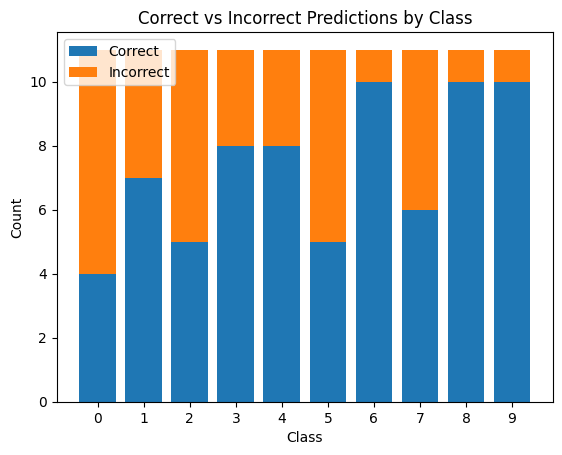

In [ ]:
plot_pedictions(adversary_model1, prediction_labels, prediction_images) 

### Using 30% of data from training dataset for extraction

In [ ]:
from sklearn.model_selection import train_test_split

_, stolen_images, _, stolen_labels = train_test_split(x_train, y_train, test_size=0.3, random_state=42)

####Fully-supervised model extraction

In [ ]:
adversary_model = tf.keras.models.clone_model(model)

In [ ]:
adv_data = np.empty((0, 32, 32, 3), dtype=np.float32)
adv_labels = np.empty((0, 10), dtype=np.float32)
# Query the oracle for labels
for i in tqdm(range(stolen_images.shape[0])):
        # Choose a random datapoint
        idx = np.random.randint(stolen_images.shape[0])
        x = stolen_images[idx][np.newaxis, ...]
        
        # Query the oracle for its prediction
        y_pred = model.predict(x)[0]
        
        # Add the datapoint and its predicted label to the adversary's dataset
        adv_data = np.concatenate([adv_data, x], axis=0)
        adv_labels = np.concatenate([adv_labels, y_pred[np.newaxis, ...]], axis=0)    

100%|██████████| 15000/15000 [10:19<00:00, 24.23it/s]


In [ ]:
adversary_model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
adversary_model.fit(adv_data, adv_labels, epochs=10, batch_size=10)

Train on 15000 samples
Epoch 1/10
15000/15000 [==============================] - 23s 2ms/sample - loss: 1.7406 - accuracy: 0.4286
Epoch 2/10
15000/15000 [==============================] - 21s 1ms/sample - loss: 1.2349 - accuracy: 0.5867
Epoch 3/10
15000/15000 [==============================] - 22s 1ms/sample - loss: 1.0961 - accuracy: 0.6476
Epoch 4/10
15000/15000 [==============================] - 21s 1ms/sample - loss: 1.0256 - accuracy: 0.6777
Epoch 5/10
15000/15000 [==============================] - 22s 1ms/sample - loss: 0.9865 - accuracy: 0.6944
Epoch 6/10
15000/15000 [==============================] - 22s 1ms/sample - loss: 0.9514 - accuracy: 0.7117
Epoch 7/10
15000/15000 [==============================] - 21s 1ms/sample - loss: 0.9152 - accuracy: 0.7255
Epoch 8/10
15000/15000 [==============================] - 22s 1ms/sample - loss: 0.8726 - accuracy: 0.7472
Epoch 9/10
15000/15000 [==============================] - 22s 1ms/sample - loss: 0.8487 - accuracy: 0.7592
Epoch 10/10
15

##### Plots on  adversary_model model trained using 30% of training datasets through Fully supervised method

[3 8 8 0 6 6 1 6 3 1 0 9 6 7 9 8 5 7 8 6 7 0 4 9 4 2 4 0 9 6 6 5 4 6 9 6 4
 9 9 5 0 6 5 6 0 9 7 9 7 2 9 8 6 3 8 8 7 6 2 6 7 5 6 0 6 1 0 3 4 4 8 8 9 2
 7 3 3 8 8 8 1 7 2 7 7 4 9 0 6 4 0 0 7 4 5 6 1 1 4 0 2 1 4 6 1 2 6 2 1 5]
Accuracy: 0.7454545454545455


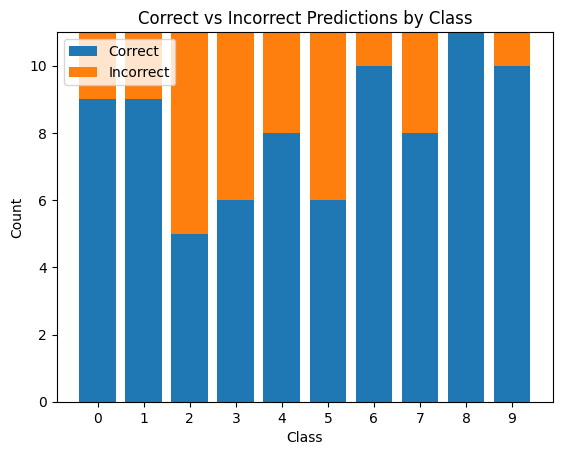

In [ ]:
plot_pedictions(adversary_model, prediction_labels, prediction_images) 

####Semi-supervised model extraction with MixMatch

In [ ]:
# Define the MixMatch loss function
def mixmatch_loss(y_true, y_pred):
    alpha = 0.75
    T = 0.5
    y_u = y_pred[1250:]  # Unlabeled predictions
    y_l = y_pred[:1250]   # Labeled predictions
    y_l_true = y_true[:1250]  # True labels for labeled data
    L_x = tf.reduce_mean(tf.keras.losses.categorical_crossentropy(y_l_true, y_l))
    L_u = tf.reduce_mean(tf.keras.losses.kullback_leibler_divergence(y_u, tf.nn.softmax(y_u / T)))    
    return L_x - alpha * L_u

In [ ]:
def mixmatch_loss1(y_true, y_pred):
    # Add label smoothing to improve generalization
    label_smoothing = 0.1
    y_true = (1 - label_smoothing) * y_true + label_smoothing / 10

    # Compute cross-entropy loss
    loss = tf.keras.losses.categorical_crossentropy(y_true, y_pred, from_logits=True)

    # Add L2 regularization to the loss
    l2_loss = tf.reduce_sum([tf.nn.l2_loss(w) for w in model.trainable_weights])
    loss += 0.001 * l2_loss

    return tf.reduce_mean(loss)

In [ ]:
# Compile the model
adversary_model1 = tf.keras.models.clone_model(adversary_model)
adversary_model1.set_weights(adversary_model.get_weights())
adversary_model1.compile(optimizer='adam',loss=mixmatch_loss1,metrics=['accuracy'])

In [ ]:
# Train the model on labeled and unlabeled data
batch_size = 10
num_epochs = 20

for epoch in range(num_epochs):
    # Shuffle the labeled and unlabeled data
    x_train_labeled,  x_train_unlabeled, y_train_labeled, _ = train_test_split(stolen_images, stolen_labels, test_size=0.5, random_state=42)
    # Train on labeled data
    adversary_model1.train_on_batch(x_train_labeled, y_train_labeled)
    
    # Query the oracle for labels and predictions on unlabeled data
    y_pred_unlabeled = model.predict(x_train_unlabeled)
    y_pred_unlabeled_max = np.max(y_pred_unlabeled, axis=1)
    y_pred_unlabeled_argmax = np.argmax(y_pred_unlabeled, axis=1)
    y_train_unlabeled = tf.keras.utils.to_categorical(y_pred_unlabeled_argmax, num_classes=10)
    
    # Train on unlabeled data with new labels
    adversary_model1.train_on_batch(x_train_unlabeled, y_train_unlabeled)
    
    # Evaluate the model on the test set
    loss, accuracy = adversary_model1.evaluate(np.concatenate((x_train_labeled, x_train_unlabeled), axis=0), np.concatenate((y_train_labeled, y_train_unlabeled), axis=0), verbose=0)
    print(f'Epoch {epoch+1}/{num_epochs}, loss: {loss:.4f}, accuracy: {accuracy:.4f}')


Epoch 1/20, loss: 12.2851, accuracy: 0.8136
Epoch 2/20, loss: 12.2460, accuracy: 0.8209
Epoch 3/20, loss: 12.2202, accuracy: 0.8232
Epoch 4/20, loss: 12.1940, accuracy: 0.8265
Epoch 5/20, loss: 12.1706, accuracy: 0.8331
Epoch 6/20, loss: 12.1527, accuracy: 0.8397
Epoch 7/20, loss: 12.1428, accuracy: 0.8434
Epoch 8/20, loss: 12.1427, accuracy: 0.8419
Epoch 9/20, loss: 12.1480, accuracy: 0.8382
Epoch 10/20, loss: 12.1489, accuracy: 0.8365
Epoch 11/20, loss: 12.1448, accuracy: 0.8367
Epoch 12/20, loss: 12.1386, accuracy: 0.8397
Epoch 13/20, loss: 12.1293, accuracy: 0.8449
Epoch 14/20, loss: 12.1176, accuracy: 0.8509
Epoch 15/20, loss: 12.1032, accuracy: 0.8571
Epoch 16/20, loss: 12.0938, accuracy: 0.8621
Epoch 17/20, loss: 12.0883, accuracy: 0.8650
Epoch 18/20, loss: 12.0830, accuracy: 0.8677
Epoch 19/20, loss: 12.0778, accuracy: 0.8699
Epoch 20/20, loss: 12.0725, accuracy: 0.8711


##### Plots on  adversary_model model trained using 30% of training datasets through semi-supervised method

[3 8 8 0 6 6 1 6 3 1 0 9 5 7 9 8 5 7 8 6 7 0 4 9 4 2 4 0 9 6 6 5 4 3 9 3 4
 9 9 5 4 6 3 6 0 9 3 9 7 6 9 8 6 3 8 8 7 6 3 3 7 5 6 3 2 1 0 3 4 0 8 8 9 2
 1 3 3 8 8 1 1 7 2 7 7 7 9 0 6 4 0 0 7 4 5 3 1 1 4 0 2 1 4 6 9 2 3 4 1 5]
Accuracy: 0.8090909090909091


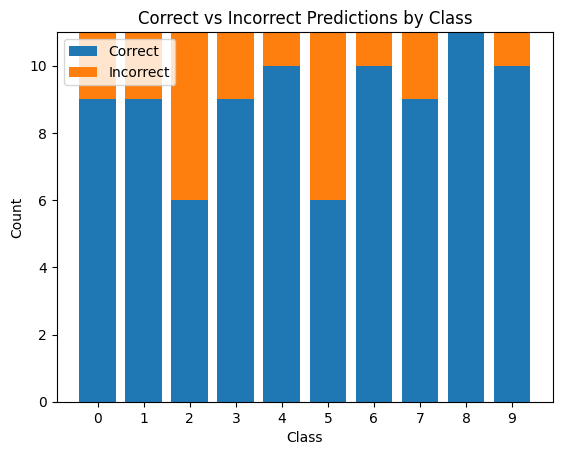

In [ ]:
plot_pedictions(adversary_model1, prediction_labels, prediction_images) 